# Data synthesis using generative adversarial networks (GANs)

In this practical session we will build and train generative adversarial networks that are able to generate images.

This is a Google Colab notebook, which is mostly the same as a Jupyter notebook. This means that you can run the code in a cell by selecting the cell and pressing Shift+Enter. We will run everything in the cloud, so you don't need a fancy computer or an expensive GPU for this exercise. We are going to use GPUs that Google Cloud provides for free. To do this, go to Edit --> Notebook settings and select GPU as Hardware accelerator. Then, in the top right of this screen select 'CONNECT' --> 'Connect to hosted runtime'

We are going to import some of the packages that we will need in this exercise (by running the cell below)

The documentation for key packages can be found online: <br>
For numpy: https://docs.scipy.org/doc/numpy-dev/user/quickstart.html <br>
For matplotlib: http://matplotlib.org/api/pyplot_api.html <br>
For Keras: https://keras.io/ <br>
For random: https://docs.python.org/2/library/random.html <br>

In [ ]:
import pickle
import gzip
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import rc
from matplotlib import pylab
from IPython import display

import tensorflow as tf
from tensorflow import keras
keras.backend.set_image_data_format('channels_first')

import time
import random
from google.colab import files
from google.colab import widgets
random.seed(0)

# Check whether we're using a GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

#tf.logging.set_verbosity(tf.logging.ERROR)

SystemError: ignored

## Small steps
Before moving on to generating images, we will start with a simple 1D problem. We will assume that there is a data set of real samples that are drawn from a normal distribution with a particular mean value (the black dotted line below). These samples are in the sample domain *x*.

The generator network does not know anything about the distribution of the real samples in the sample domain *x*, but will try to come up with a transformation that maps random noise from a distribution *z* to samples that seem to come from the real sample distribution (the green line below). This is very similar to what we have looked at in the lecture.

<img src="https://cs.stanford.edu/people/karpathy/gan/gan.png">

For this, we will define two neural networks that play a game:
*   The discriminator will learn to distinguish real and fake samples in *z*
*   The generator will generate fake samples in *z* that the discriminator cannot discriminate

First, we determine the mean value of the normal distribution from which **real** samples will be drawn in the sample domain *x*. In addition, we define the dimensionality of the normal distribution *z* from which noise samples to the generator will be drawn, i.e. the latent space. This will be 1 for now.

In [ ]:
real_mean = 8
latent_dim = 1

Next, we define our discriminator and generator. These are both very simple networks.

**Question** **How many layers does each of these networks have?**

Both networks consists of a total of two layers; an input layer which is defined by the input_dim parameter in the first Dense layer and it takes a 1D input, and at the end a Dense layer for the output. In between there is an LeakyReLU activation in both networks.

For the dicriminator network, there is an additional dense layer with 1 unit and a sigmoid activation function. This produces a probability score indicating whether the input is real or fake.

For the generator network, the output layer is also a dense layer with 1 unit but it doesn't have any activation function.

**Question** **Can you find out how many trainable parameters the networks have?**
This can be found by plotting the models summary.

**Discriminator network**
For the input layer there is no trainable parameter. For the Hidden Layer/Dense Layer there is a number of 32 Weights (1 input unit * 32 ouput) and 32 biases one for each output unit. Finally, for the output layer there is a number of 32 Weights (32 input units * 1 output unit) and 1 bias for the single output unit.

**Generator network**
For the input layer, there is a number of 32 Weights (1 input unit * 32 output units) and 32 biases one for each output unit. For the output layer, there is a number of 32 weights (32 input units *1 ouput unit) and 1 bias corresponding to the 1 output unit.

In total, both the discriminator and the generator network have 97 trainable parameters meaning there is 194 trainable parameters for the two networks combined.

**Question** **What are the activation functions of both networks? Why are they like this?**

Discriminator: the activation functions are a Leaky ReLU in the hidden layer and Sigmoid in the output layer. The Leaky ReLU is based on the ReLU activation, however where the ReLU function starts with a flat slope, the Leaky ReLU starts with an small slope for y < 0. The Leaky ReLU is used to allow a small, non-zero gradient when the input is negative, preventing dead neruons. Sigmoid in the output layer is common for binary classification problems, where the network outputs a probability.

Generator: Leaky ReLU in the hidden layer. The output layer doesn't have an activation function, which is common when the generator is trying to generate a wide range of values.

In [ ]:
# For easier reading
from keras.layers import Reshape, Dense, Dropout, Flatten
from keras.layers import LeakyReLU

# The discriminator will directly classify the input value
def get_discriminator_1D():
  discriminator = keras.models.Sequential()
  discriminator.add(Dense(32, input_dim=1))
  discriminator.add(LeakyReLU())
  discriminator.add(Dense(1, activation='sigmoid'))
  discriminator.summary()
  return discriminator

# The generator will transform a single input value
def get_generator_1D():
  generator = keras.models.Sequential()
  generator.add(Dense(32, input_dim=1))
  generator.add(LeakyReLU())
  generator.add(Dense(1))
  generator.summary()
  return generator
discriminator = get_discriminator_1D()
generator = get_generator_1D()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                64        
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 97 (388.00 Byte)
Trainable params: 97 (388.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 32)                64        
                                                                

Now, we will define the training functions for both networks. Consider what is actually happening in a GAN and how the inputs and outputs are connected. There are three variables when training this GAN

*   **z**: the noise that will be input to the generator
*   **G_z**: the output of the generator, i.e. the samples that should approximate the real samples
*   **D_G_z**: the discriminator's decision based on the fake sample

The overall objective function of our system is as follows

$V^{(D)}(D,G)=\underset{x\sim p_{data}}{\mathbb{E}} [\log{D(x)}]+\underset{z\sim p_z}{\mathbb{E}} [\log{(1-D(G(z)))}]$

The generator $G$ is trying to minimize this loss, and the discriminator $D$ tries to maximize this. In other words, the discriminator wants to minimize the binary cross-entropy s.t. it predicts 1 for real samples and 0 for fake samples. At the same time, the generator tries to get the discriminator to predict 1 for fake samples.




In [ ]:
# Get networks
discriminator = get_discriminator_1D()
generator = get_generator_1D()

# Configure both models for training
discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

# To configure the full model, we will set the 'trainable' parameter of the discriminator to False, as we don't want to optimize the discriminator when optimizing the generator
discriminator.trainable = False

# The input variable (noise) for the generator
z = keras.layers.Input(shape=(latent_dim,))

# What comes out of the generator
G_z = generator(z)

# What comes out of the discriminator when classifying the 'fake' samples
D_G_z = discriminator(G_z)

# The full GAN model
gan = keras.models.Model(inputs=z, outputs=D_G_z)

# The loss function for the GAN: this gets lower if the fake samples are classified as real
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                64        
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 32)                0         
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 97 (388.00 Byte)
Trainable params: 97 (388.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 32)                64        
                                                              

The code below runs the training loop. This could take a while. The code will periodically show a plot of the current situation.

**Question** Why do we set discriminator.trainable to either True or False?

The discriminator.trainable parameter is used to control whether the weights of the discriminator model are updated during the training process.

When training the generator, we do not want to update the weights of the discriminator as the goal is to improve the generator's ability to distinguish real from fake data.

Therefore, we set 'discriminator.trainable = False' before training the combined GAN model. This blocks the weights of the discriminator, preventing them from being updated during backpropagation.

After the generator is trained for a batch, we set it to 'True' before training the discriminator on the next batch of real and generated data.

3/3 [==============================] - 0s 4ms/step


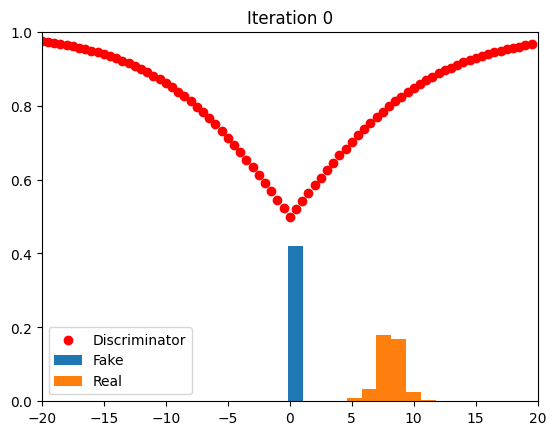

3/3 [==============================] - 0s 3ms/step


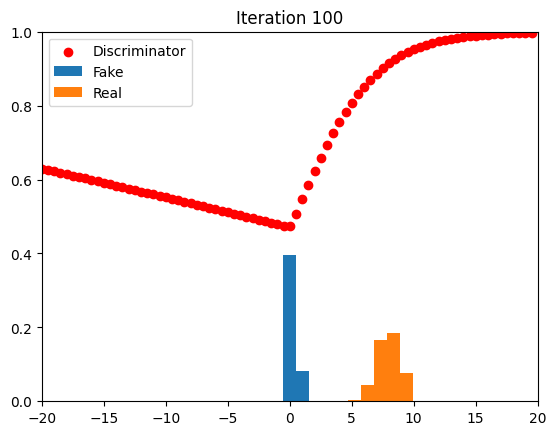

3/3 [==============================] - 0s 7ms/step


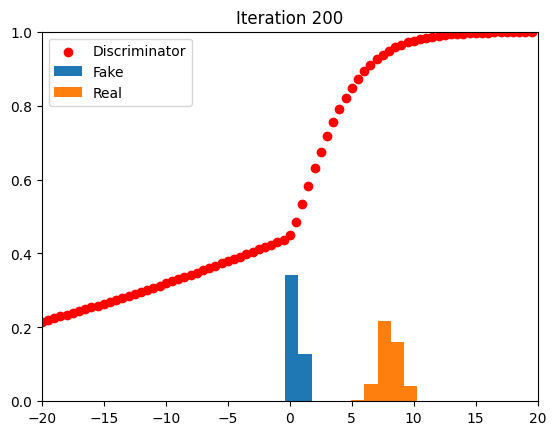

3/3 [==============================] - 0s 4ms/step


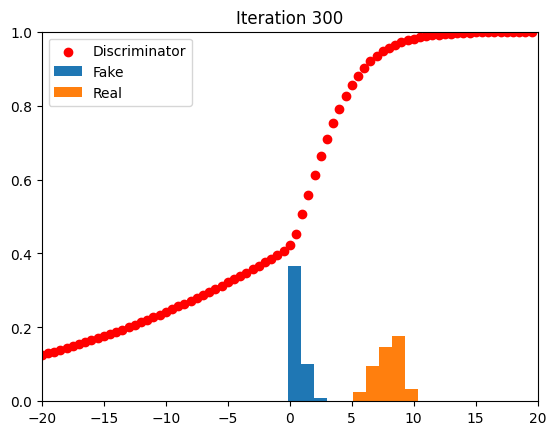

3/3 [==============================] - 0s 6ms/step


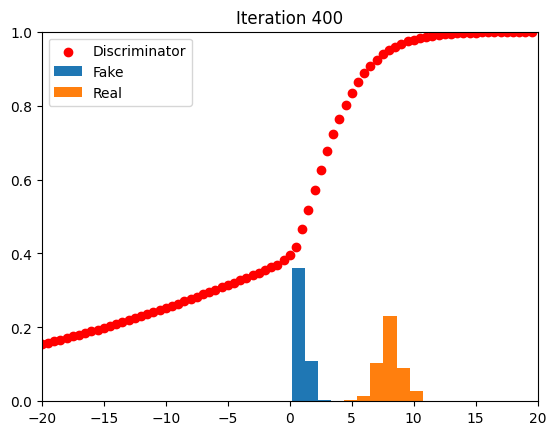

3/3 [==============================] - 0s 5ms/step


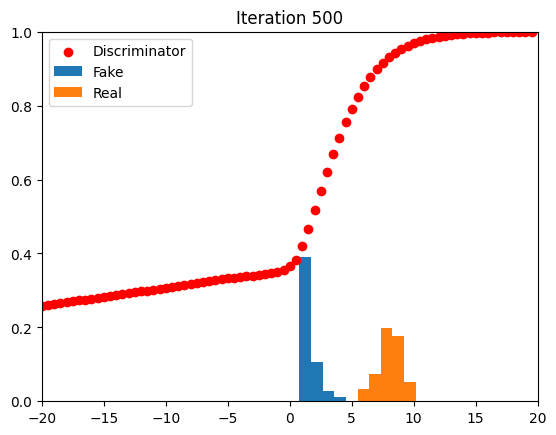

3/3 [==============================] - 0s 5ms/step


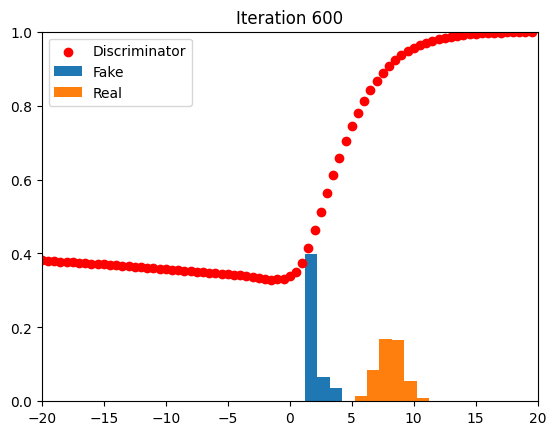

3/3 [==============================] - 0s 4ms/step


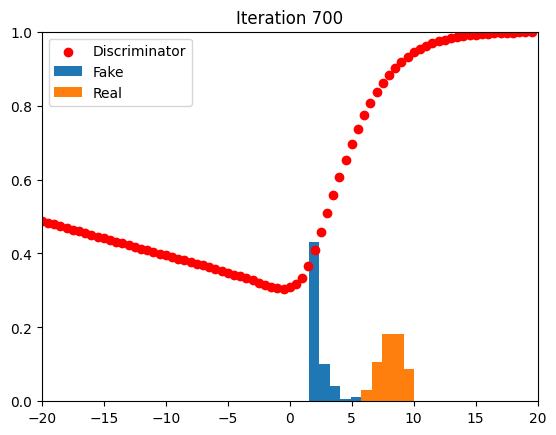

3/3 [==============================] - 0s 6ms/step


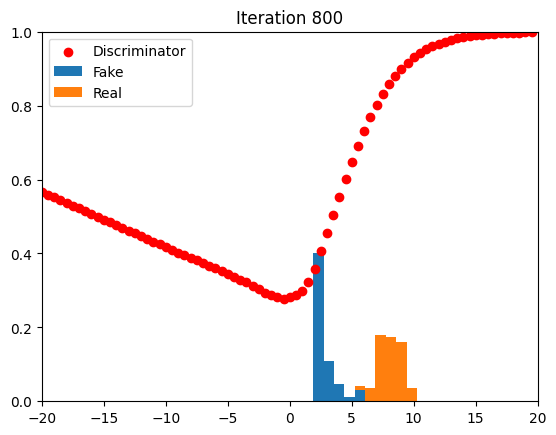

3/3 [==============================] - 0s 5ms/step


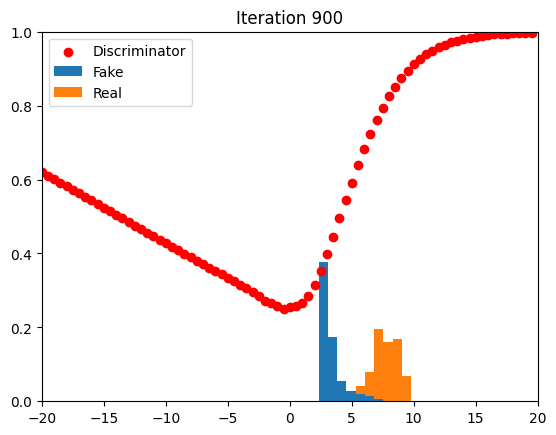

3/3 [==============================] - 0s 4ms/step


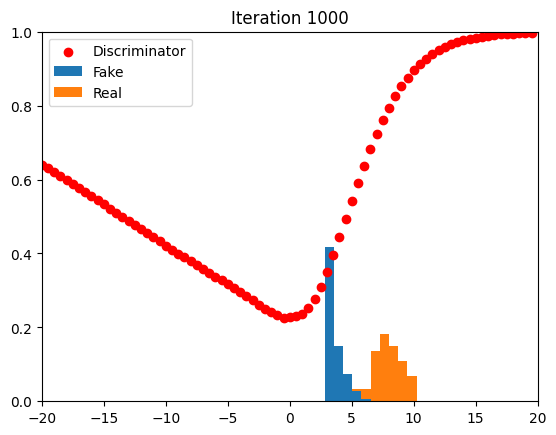

3/3 [==============================] - 0s 6ms/step


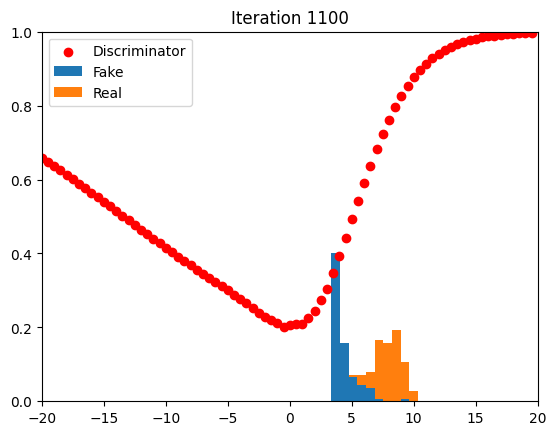

3/3 [==============================] - 0s 7ms/step


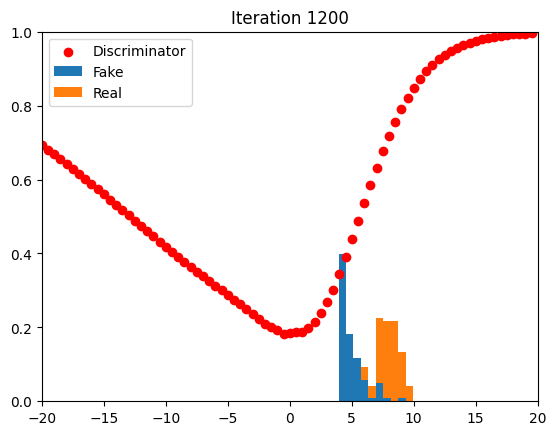

3/3 [==============================] - 0s 3ms/step


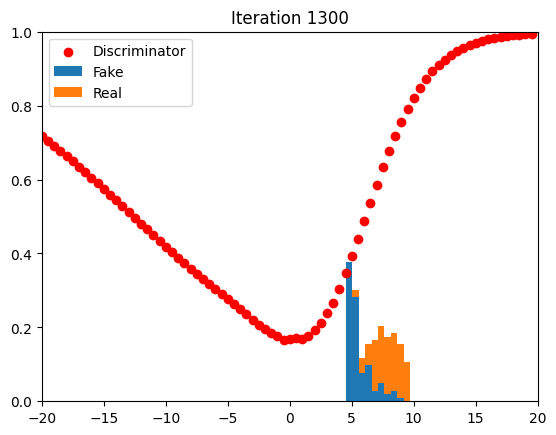

3/3 [==============================] - 0s 3ms/step


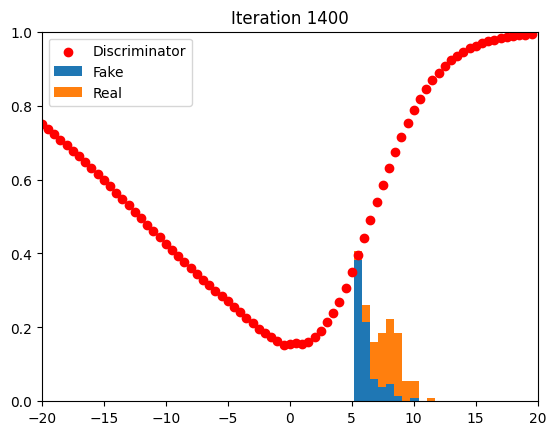

3/3 [==============================] - 0s 5ms/step


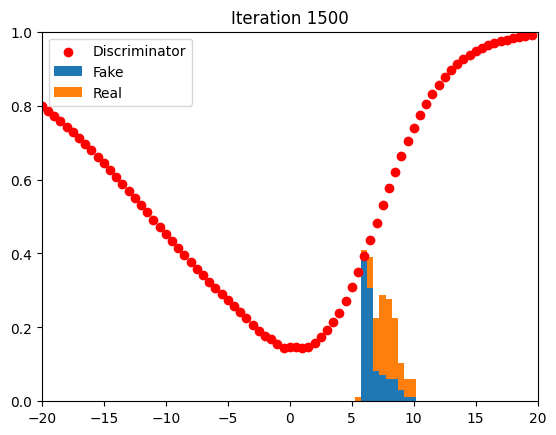

3/3 [==============================] - 0s 4ms/step


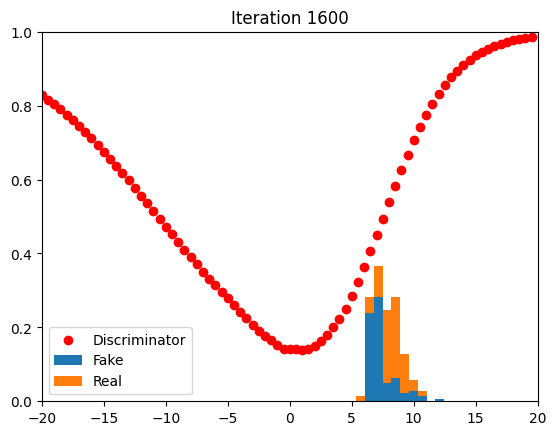

3/3 [==============================] - 0s 8ms/step


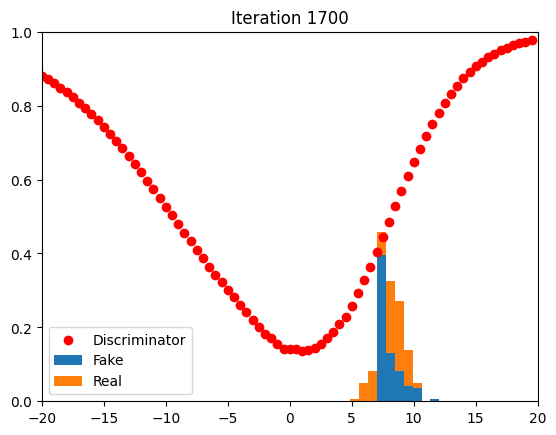

3/3 [==============================] - 0s 6ms/step


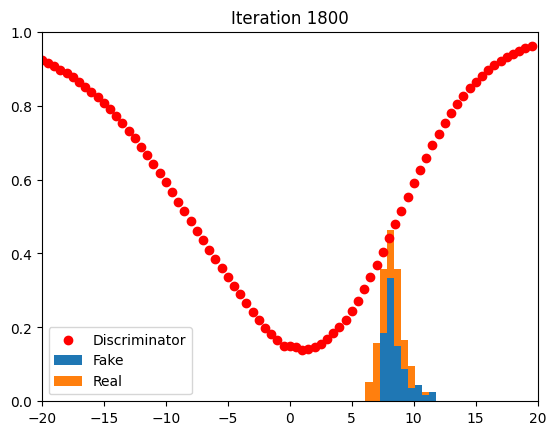

3/3 [==============================] - 0s 7ms/step


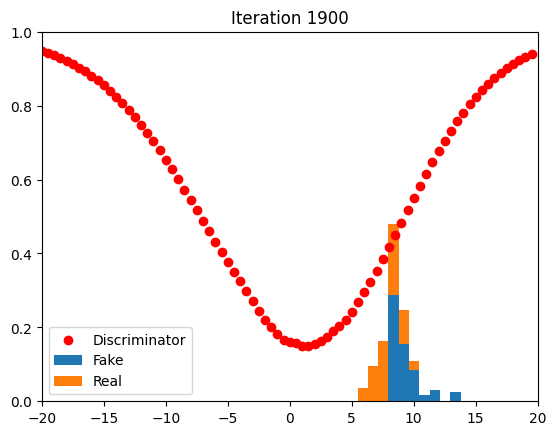

3/3 [==============================] - 0s 5ms/step


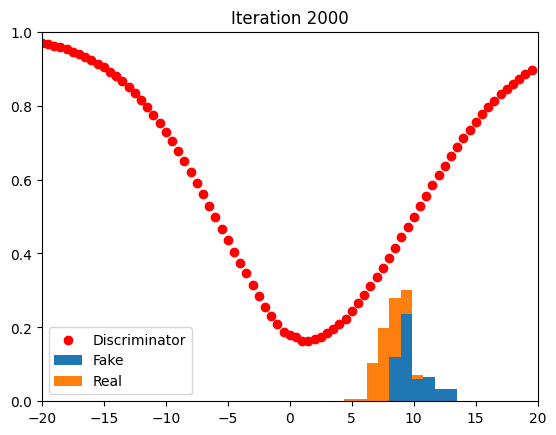

3/3 [==============================] - 0s 4ms/step


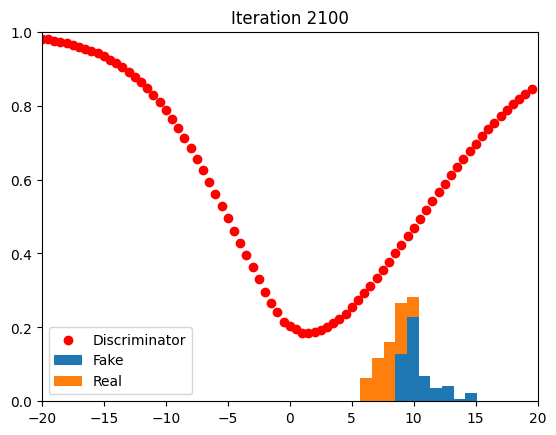

3/3 [==============================] - 0s 6ms/step


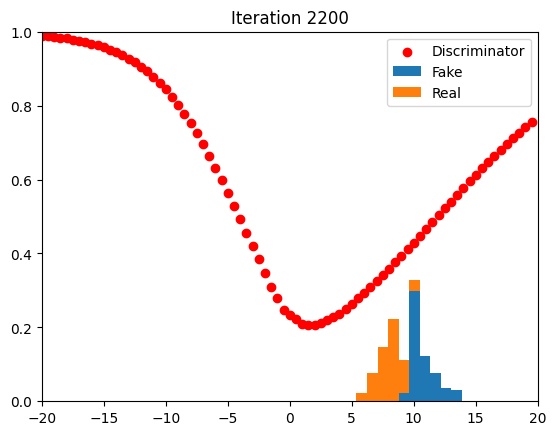

3/3 [==============================] - 0s 4ms/step


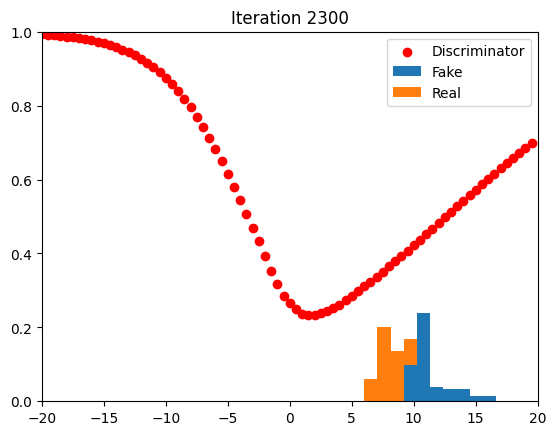

3/3 [==============================] - 0s 6ms/step


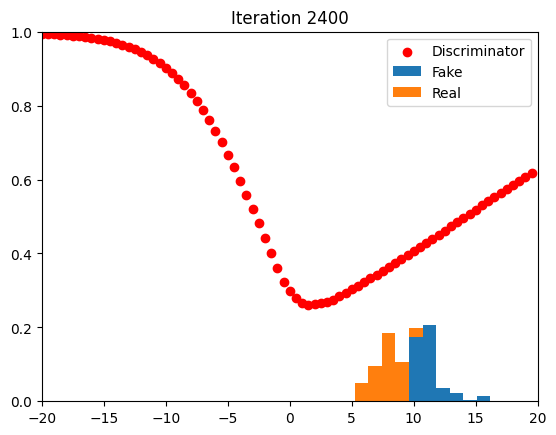

3/3 [==============================] - 0s 4ms/step


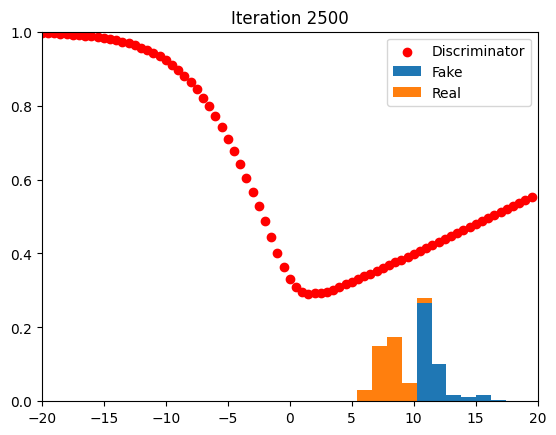

3/3 [==============================] - 0s 4ms/step


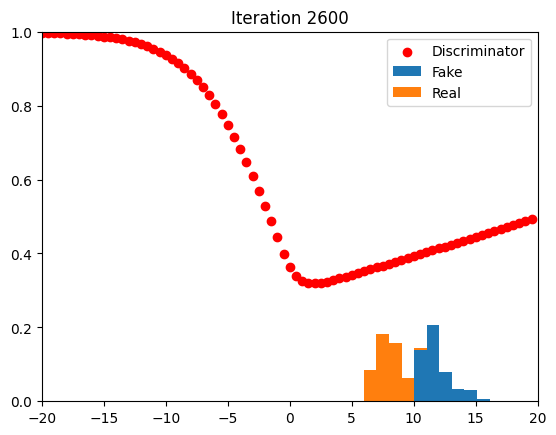

3/3 [==============================] - 0s 3ms/step


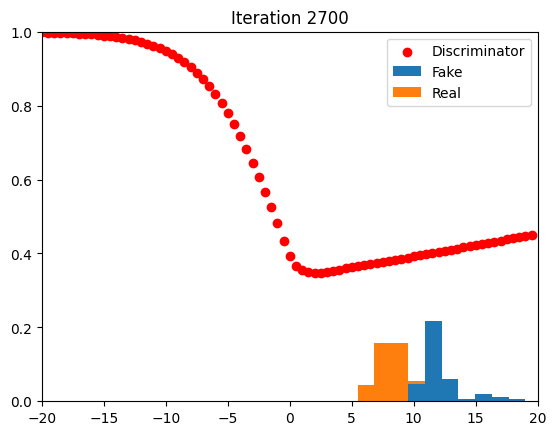

3/3 [==============================] - 0s 3ms/step


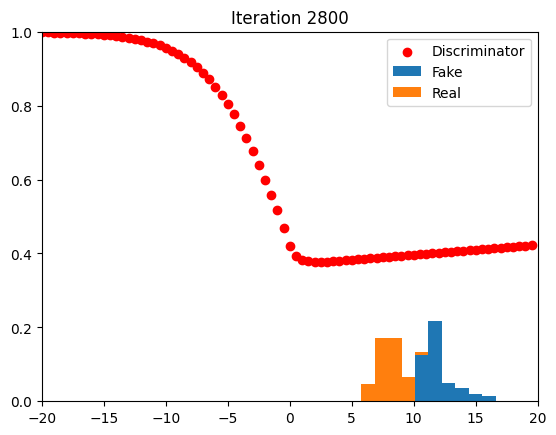

3/3 [==============================] - 0s 4ms/step


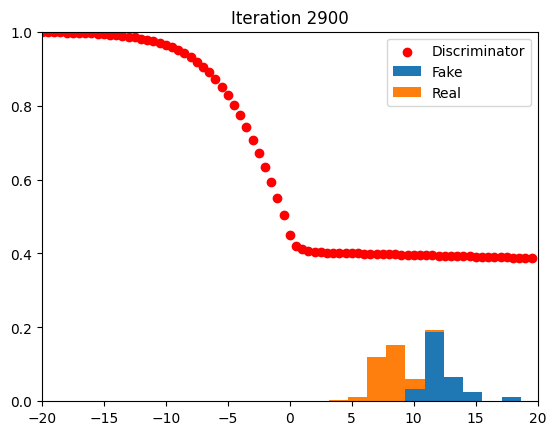

3/3 [==============================] - 0s 3ms/step


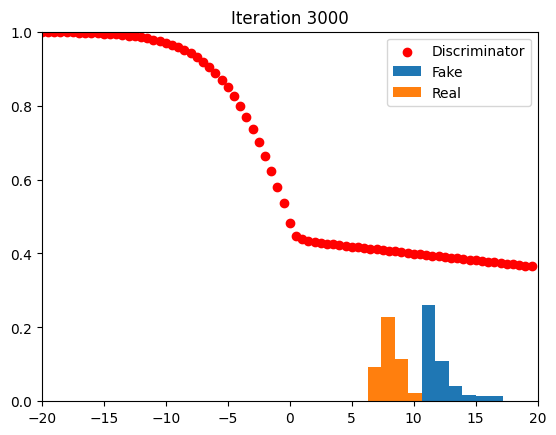

3/3 [==============================] - 0s 3ms/step


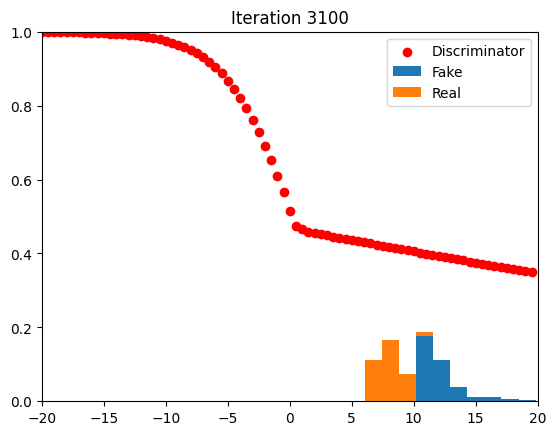

3/3 [==============================] - 0s 4ms/step


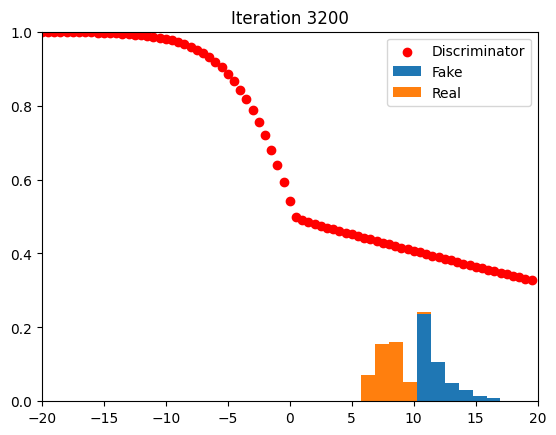

3/3 [==============================] - 0s 9ms/step


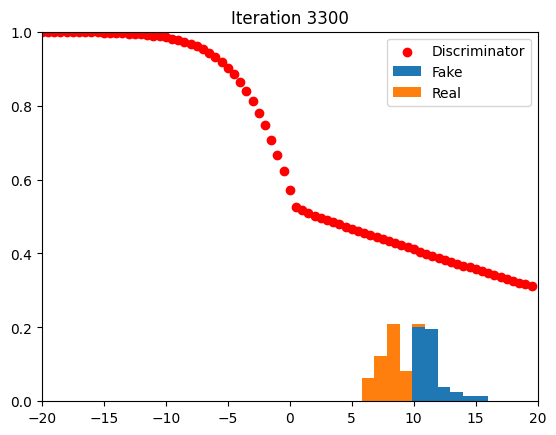

3/3 [==============================] - 0s 5ms/step


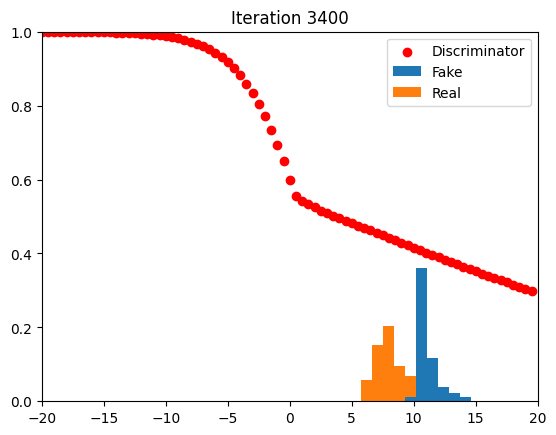

3/3 [==============================] - 0s 8ms/step


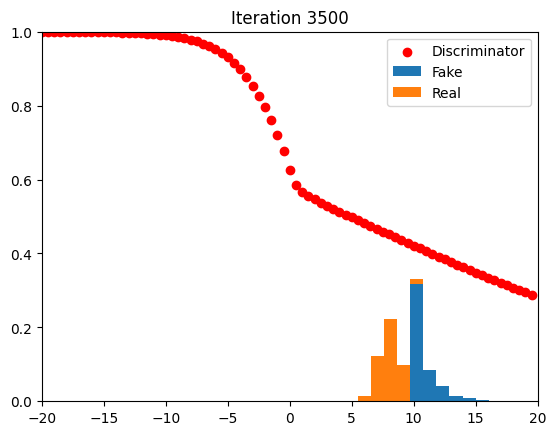

3/3 [==============================] - 0s 5ms/step


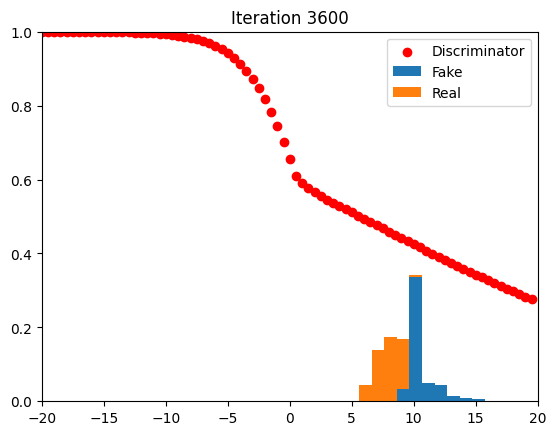

3/3 [==============================] - 0s 6ms/step


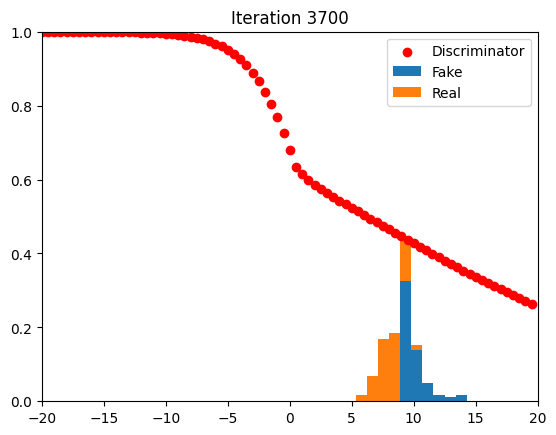

3/3 [==============================] - 0s 7ms/step


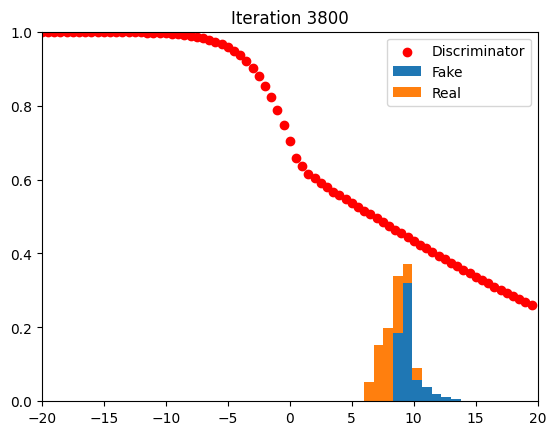

3/3 [==============================] - 0s 5ms/step


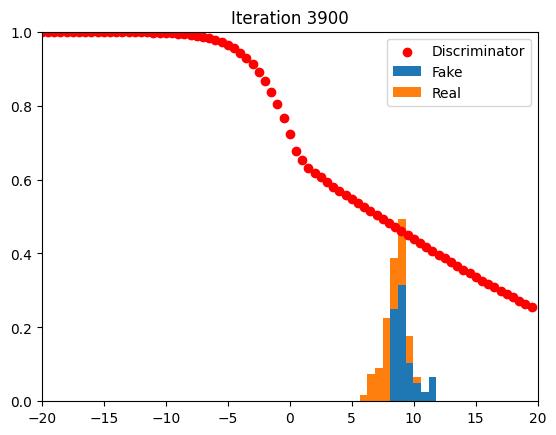

3/3 [==============================] - 0s 10ms/step


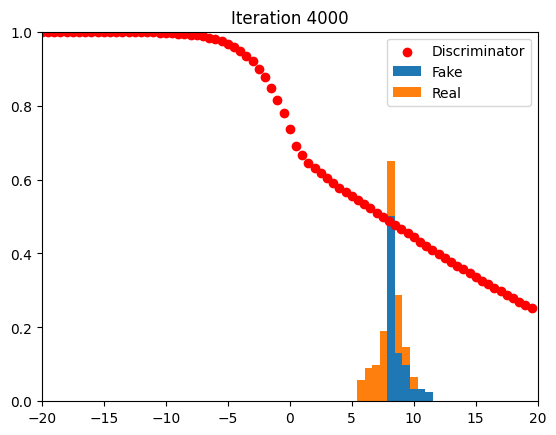

3/3 [==============================] - 0s 5ms/step


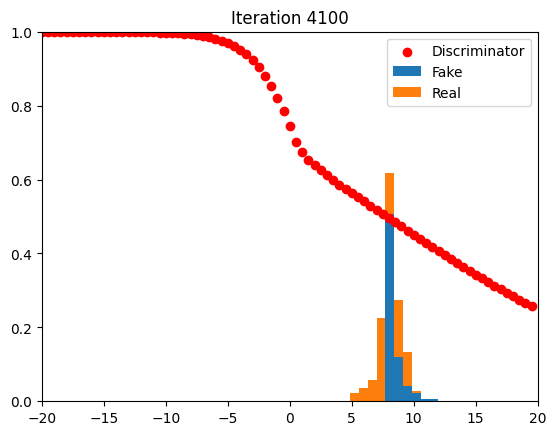

3/3 [==============================] - 0s 3ms/step


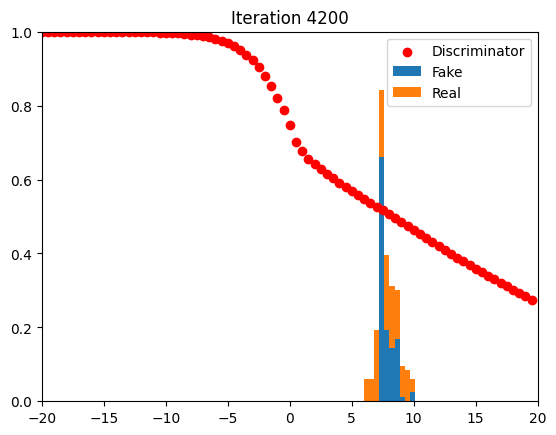

3/3 [==============================] - 0s 3ms/step


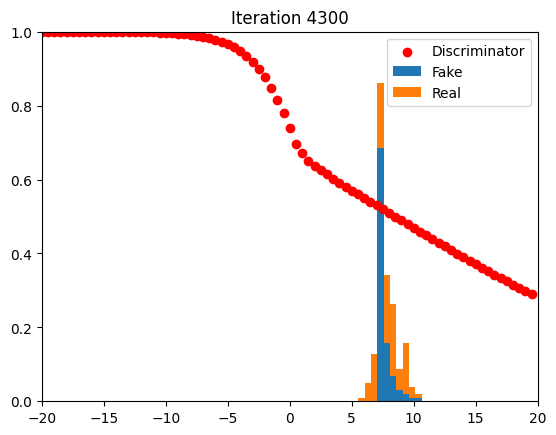

3/3 [==============================] - 0s 16ms/step


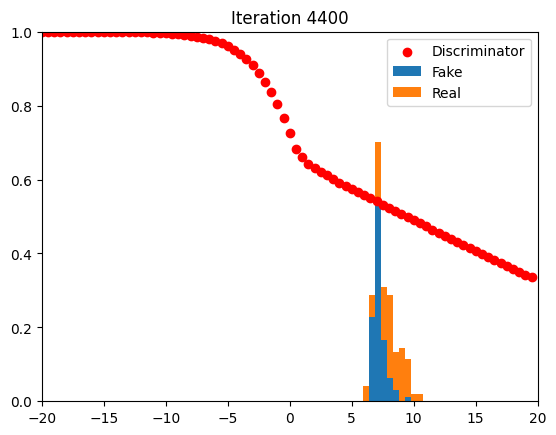

3/3 [==============================] - 0s 4ms/step


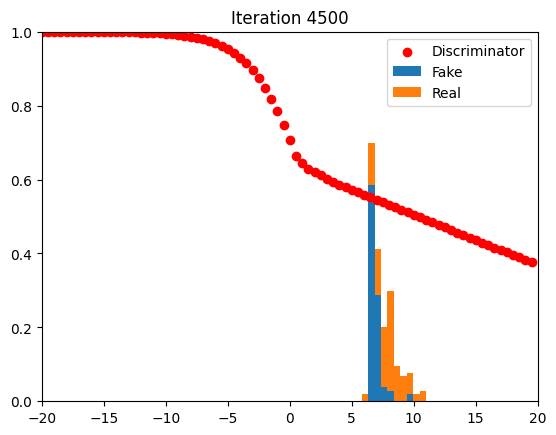

3/3 [==============================] - 0s 10ms/step


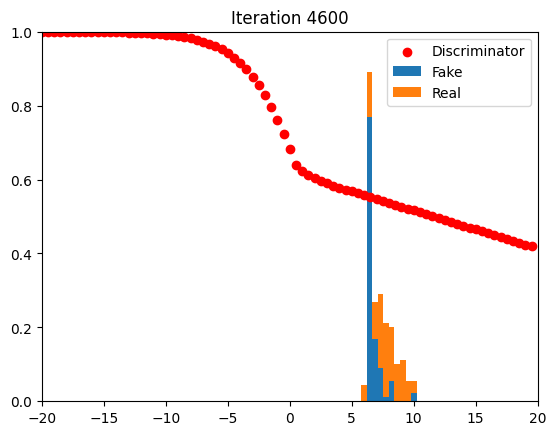

3/3 [==============================] - 0s 3ms/step


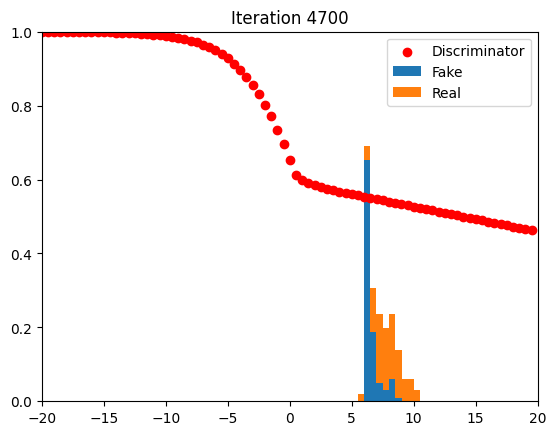

3/3 [==============================] - 0s 8ms/step


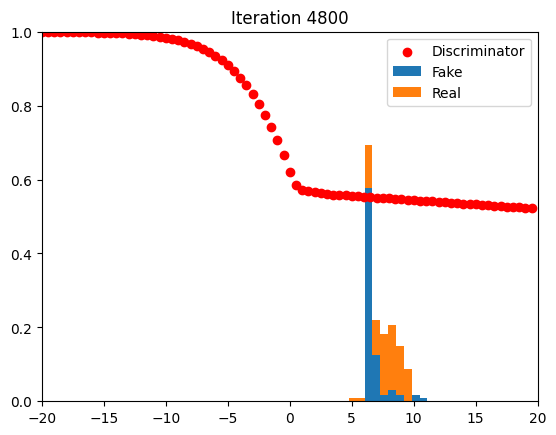

3/3 [==============================] - 0s 4ms/step


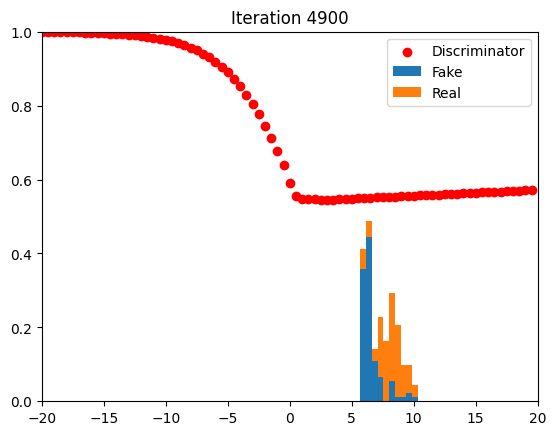

3/3 [==============================] - 0s 10ms/step


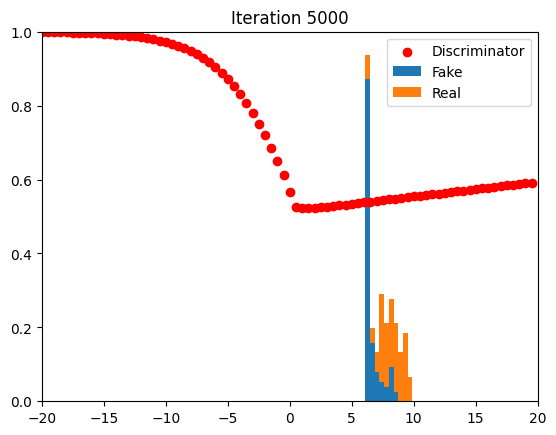

3/3 [==============================] - 0s 6ms/step


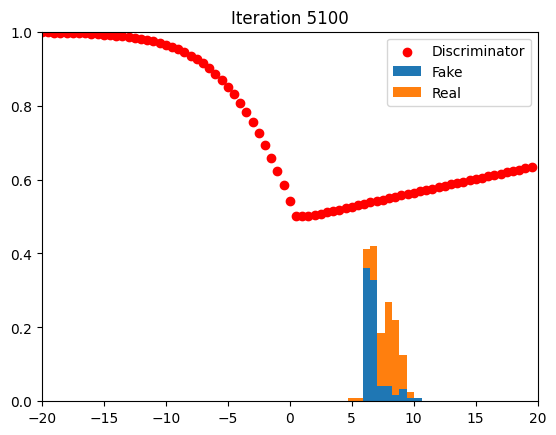

3/3 [==============================] - 0s 5ms/step


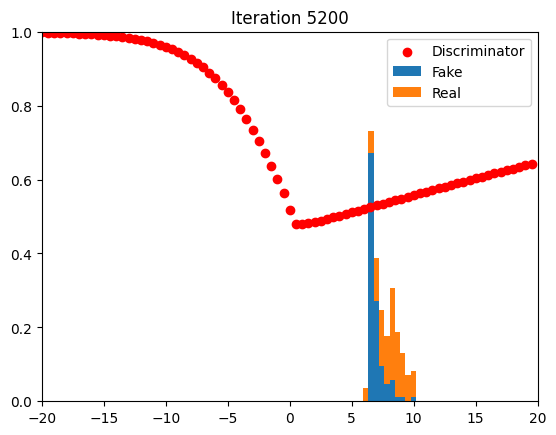

3/3 [==============================] - 0s 3ms/step


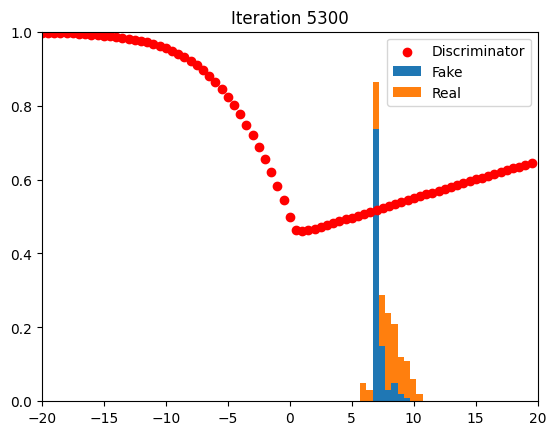

3/3 [==============================] - 0s 5ms/step


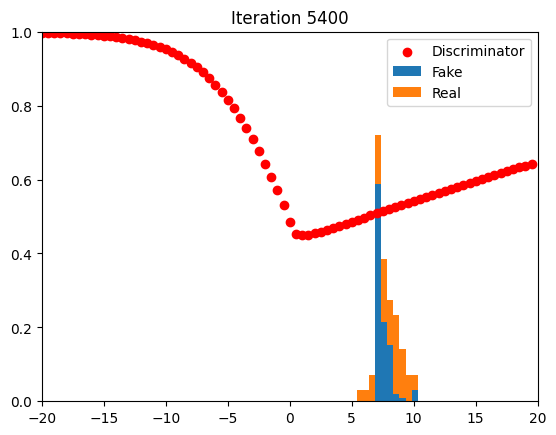

3/3 [==============================] - 0s 5ms/step


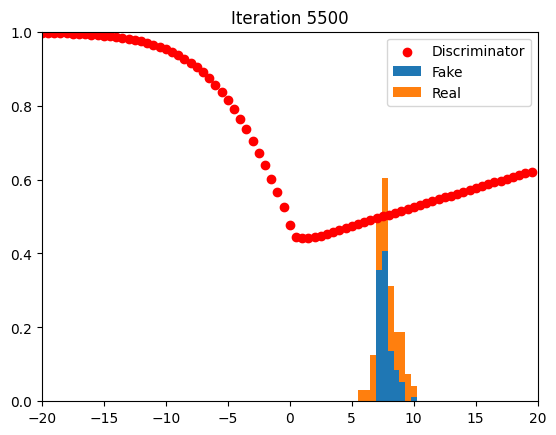

3/3 [==============================] - 0s 4ms/step


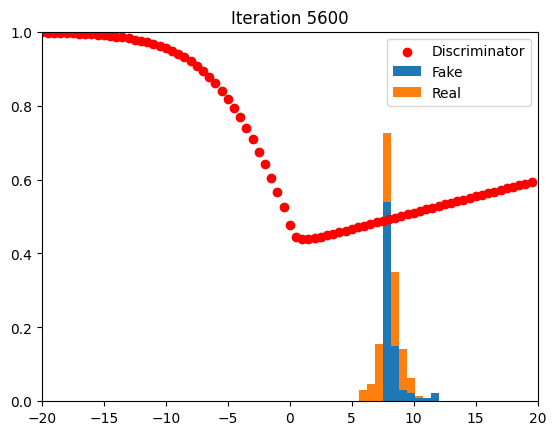

3/3 [==============================] - 0s 4ms/step


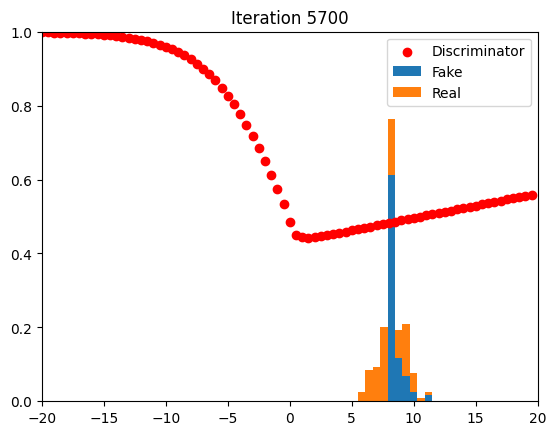

3/3 [==============================] - 0s 4ms/step


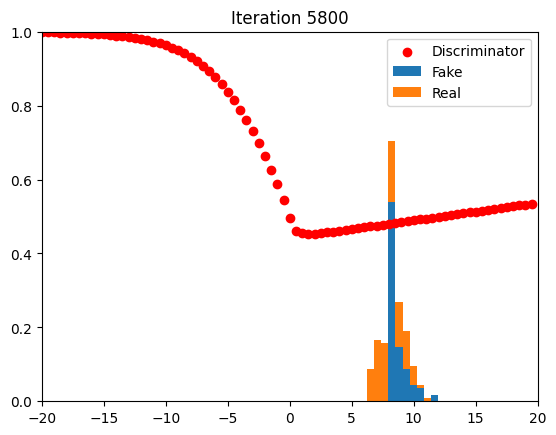

3/3 [==============================] - 0s 4ms/step


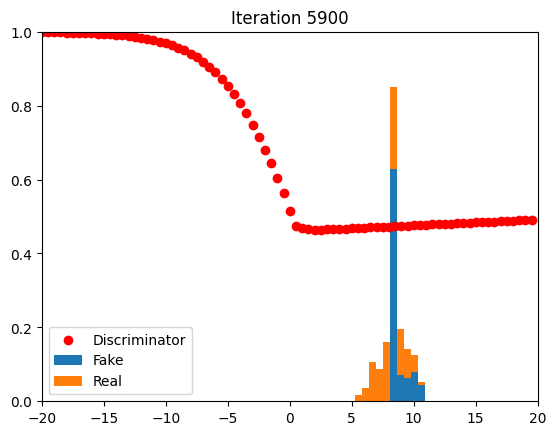

3/3 [==============================] - 0s 3ms/step


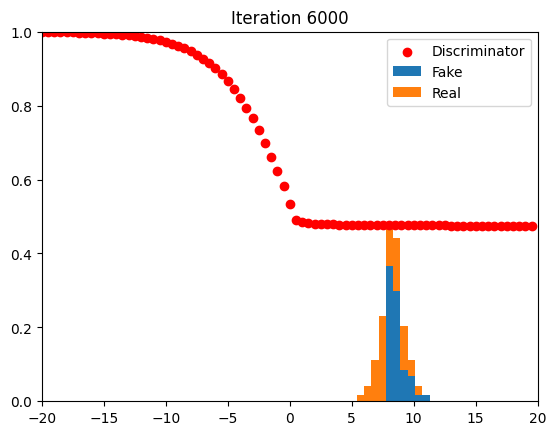

3/3 [==============================] - 0s 8ms/step


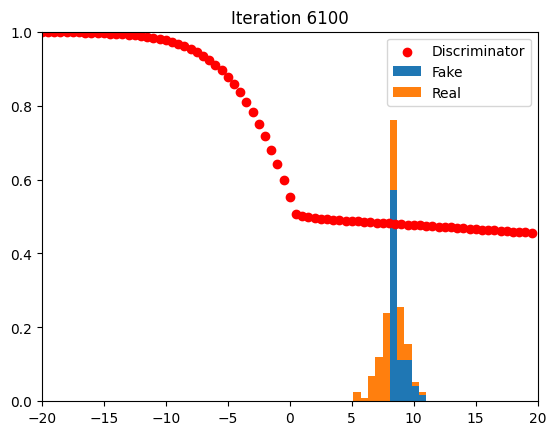

3/3 [==============================] - 0s 4ms/step


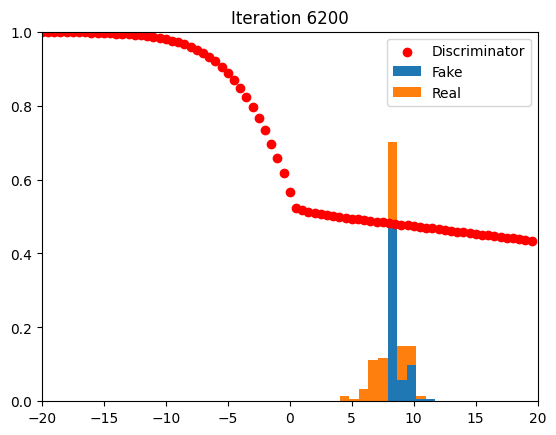

3/3 [==============================] - 0s 3ms/step


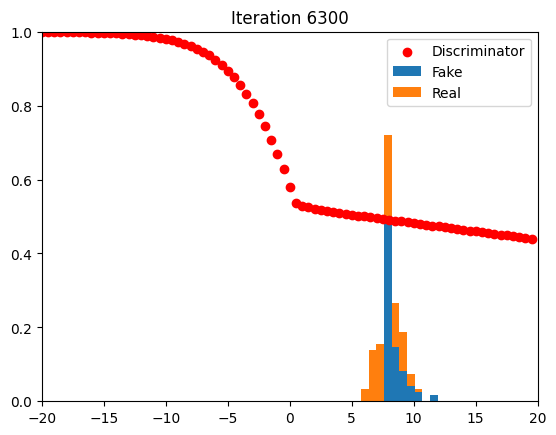

3/3 [==============================] - 0s 4ms/step


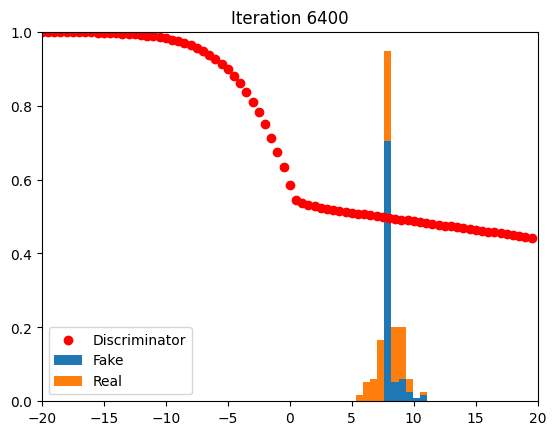

3/3 [==============================] - 0s 6ms/step


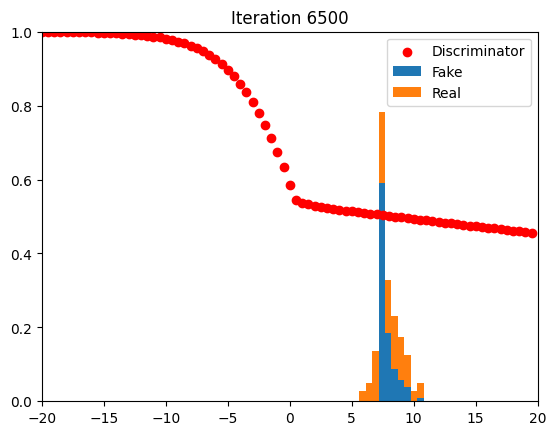

3/3 [==============================] - 0s 10ms/step


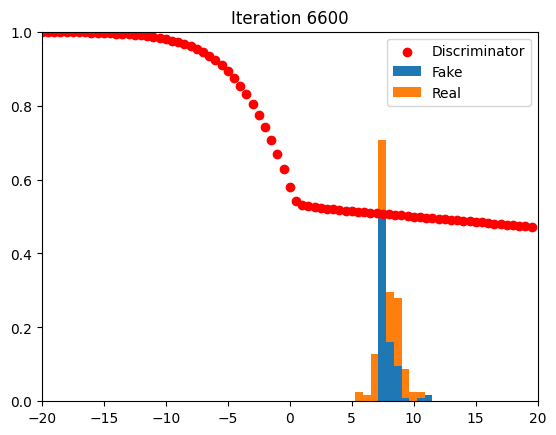

3/3 [==============================] - 0s 4ms/step


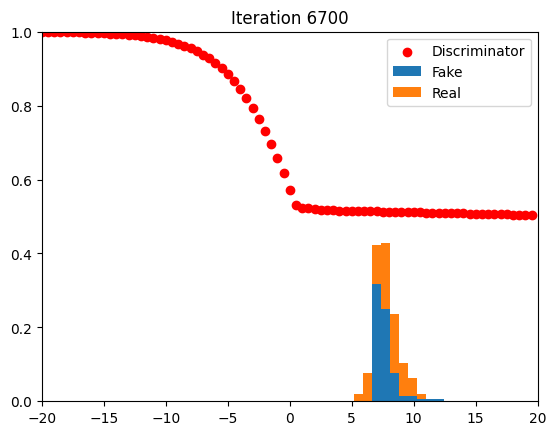

3/3 [==============================] - 0s 3ms/step


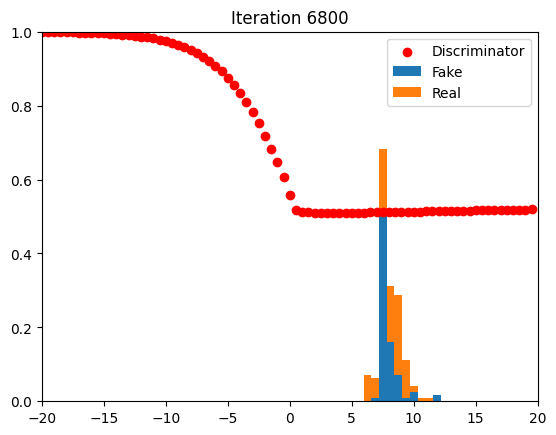

3/3 [==============================] - 0s 3ms/step


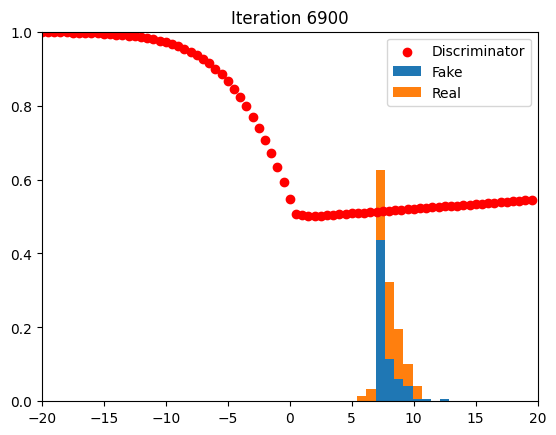

3/3 [==============================] - 0s 4ms/step


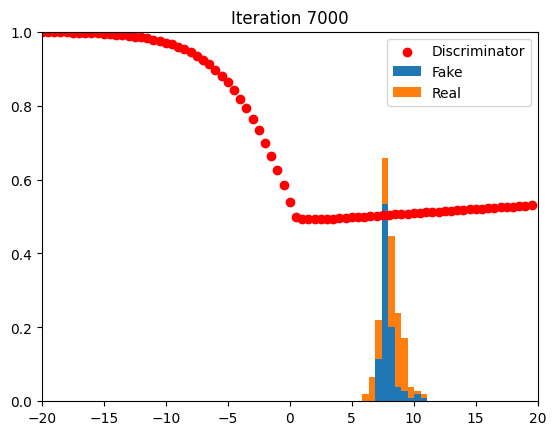

3/3 [==============================] - 0s 5ms/step


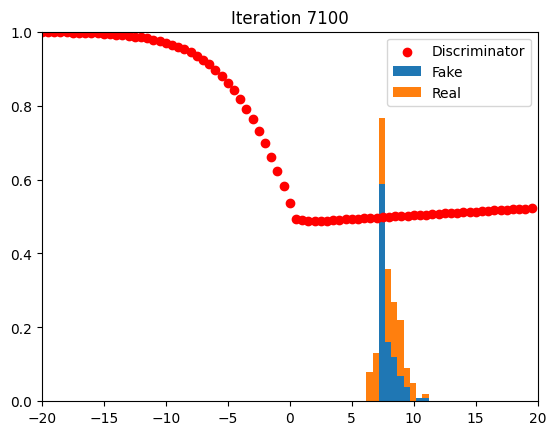

3/3 [==============================] - 0s 4ms/step


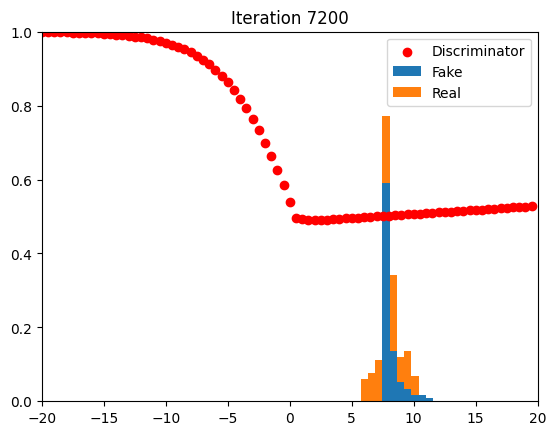

3/3 [==============================] - 0s 8ms/step


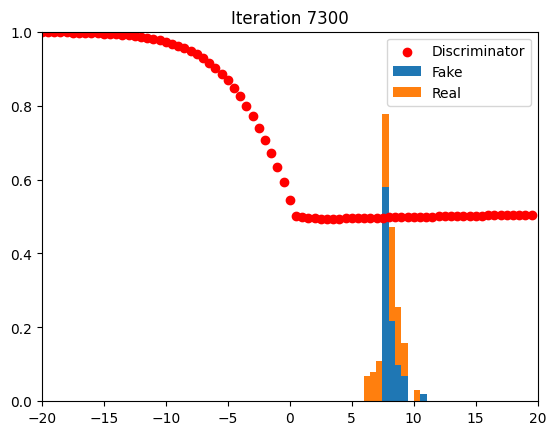

3/3 [==============================] - 0s 5ms/step


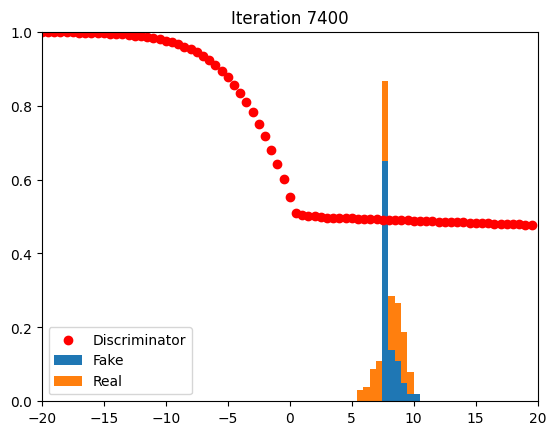

3/3 [==============================] - 0s 2ms/step


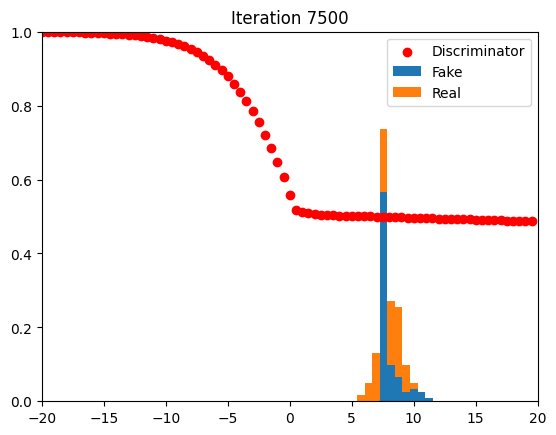

3/3 [==============================] - 0s 4ms/step


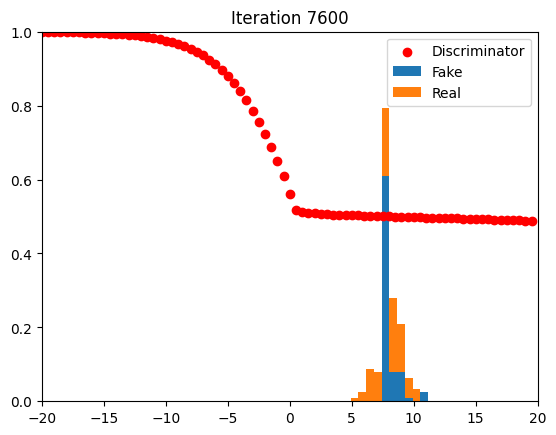

3/3 [==============================] - 0s 4ms/step


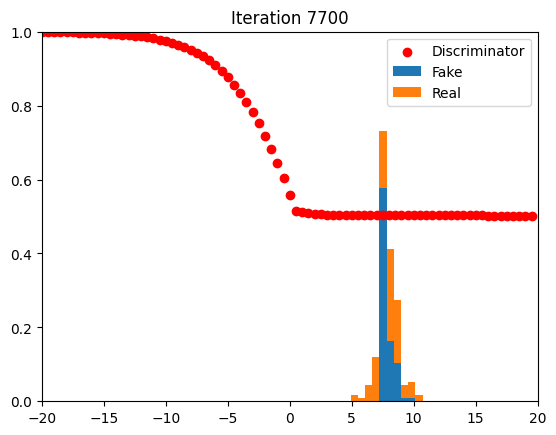

3/3 [==============================] - 0s 4ms/step


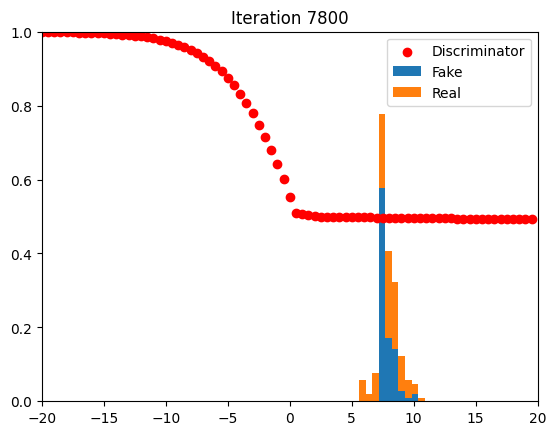

3/3 [==============================] - 0s 4ms/step


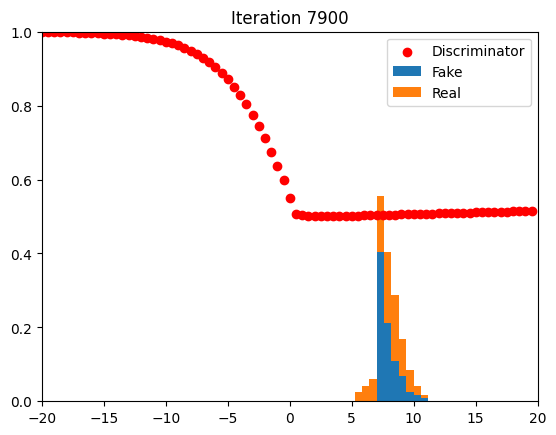

3/3 [==============================] - 0s 5ms/step


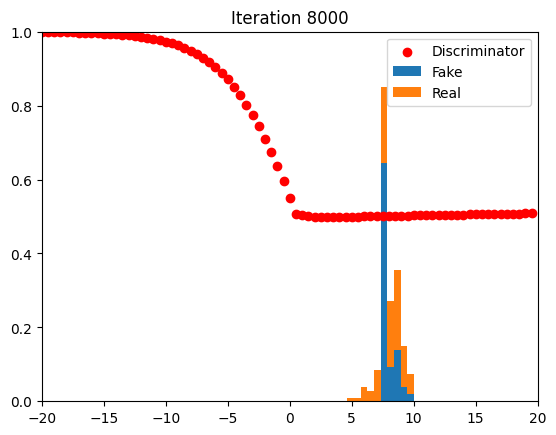

3/3 [==============================] - 0s 3ms/step


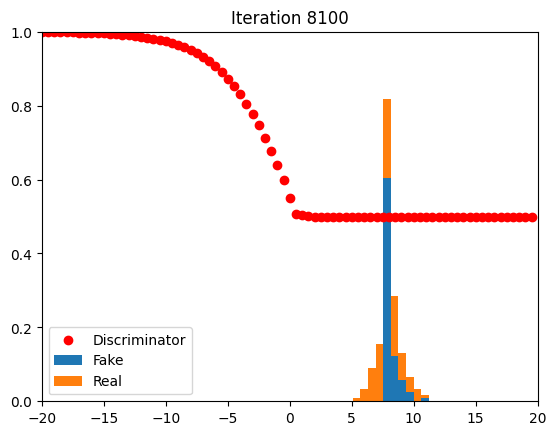

3/3 [==============================] - 0s 11ms/step


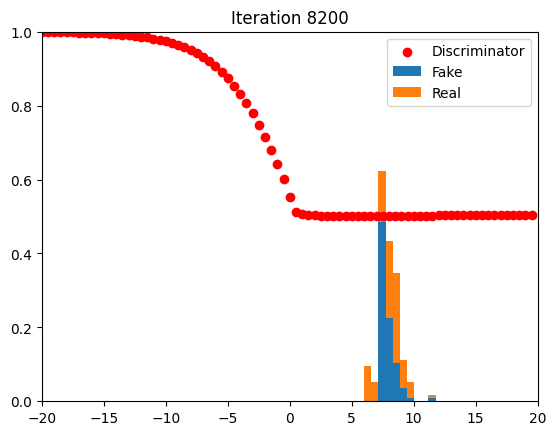

3/3 [==============================] - 0s 3ms/step


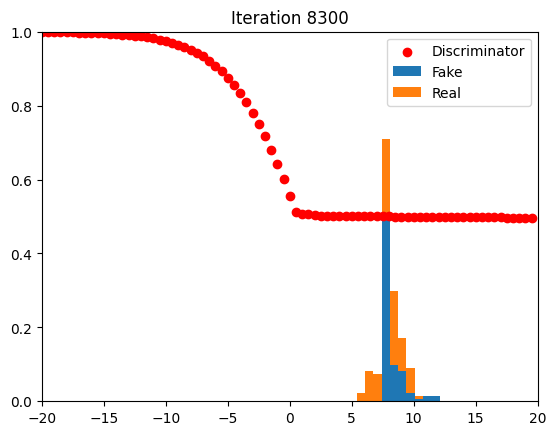

3/3 [==============================] - 0s 4ms/step


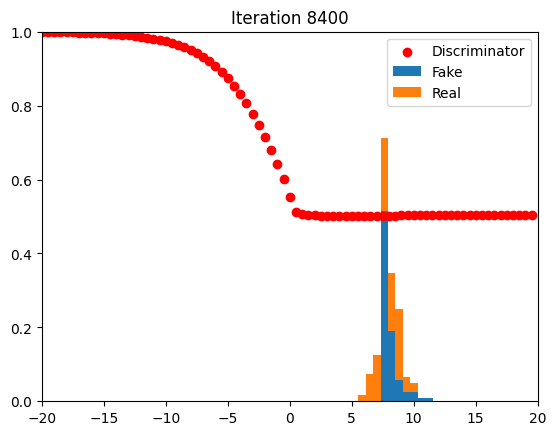

3/3 [==============================] - 0s 4ms/step


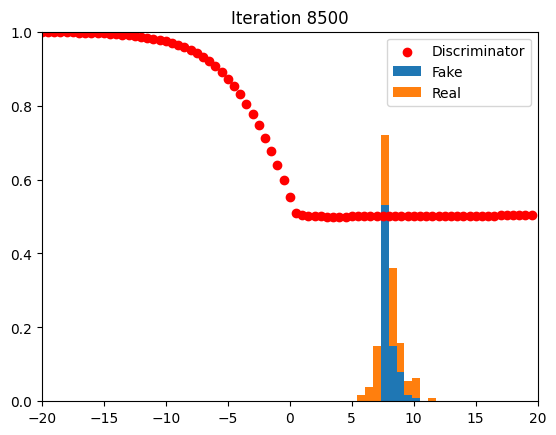

3/3 [==============================] - 0s 4ms/step


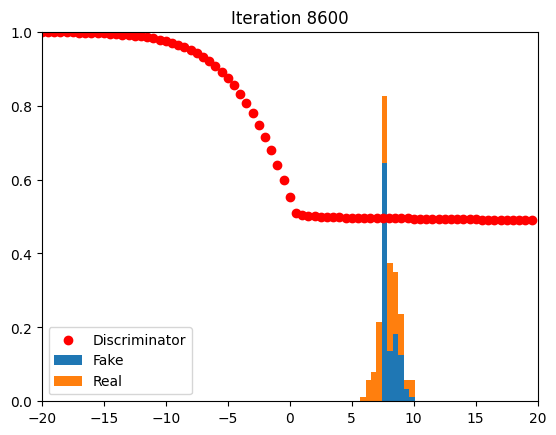

3/3 [==============================] - 0s 3ms/step


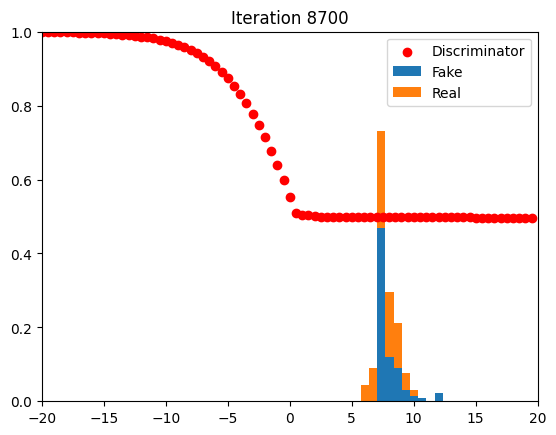

3/3 [==============================] - 0s 4ms/step


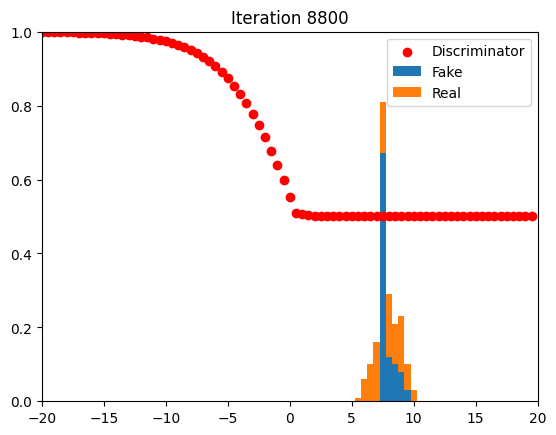

3/3 [==============================] - 0s 3ms/step


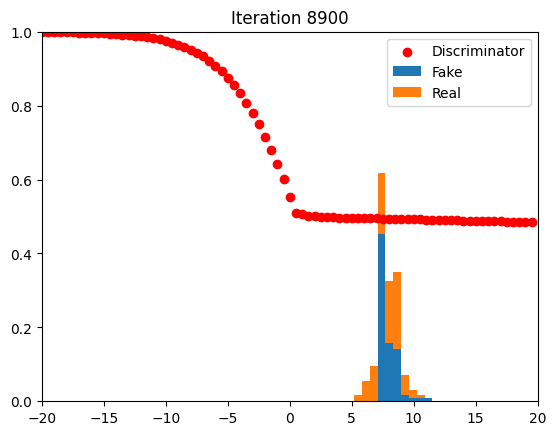

3/3 [==============================] - 0s 6ms/step


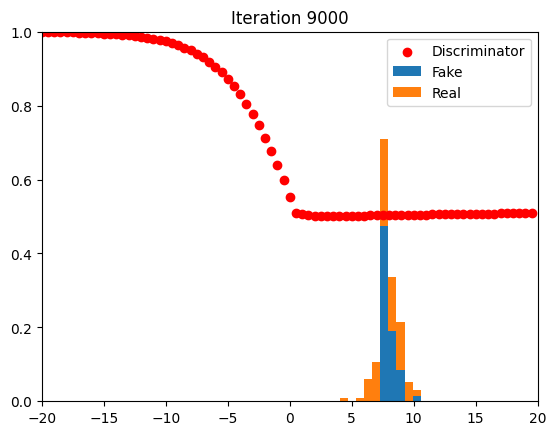

3/3 [==============================] - 0s 7ms/step


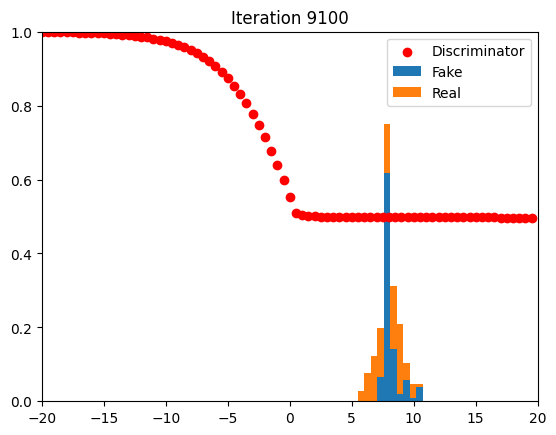

3/3 [==============================] - 0s 3ms/step


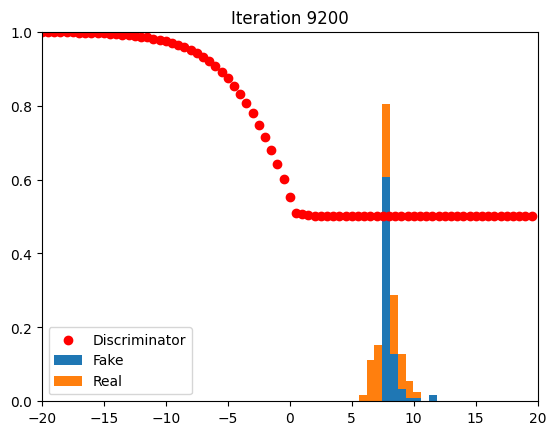

3/3 [==============================] - 0s 4ms/step


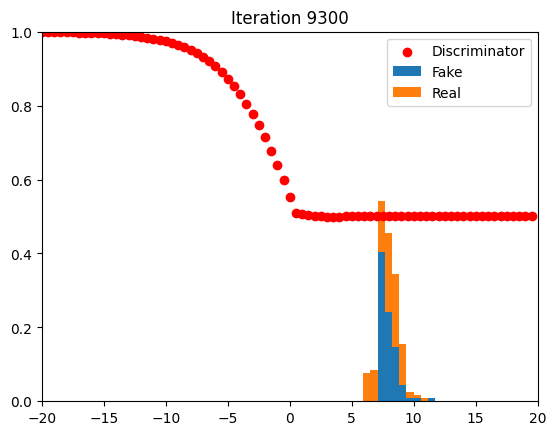

3/3 [==============================] - 0s 6ms/step


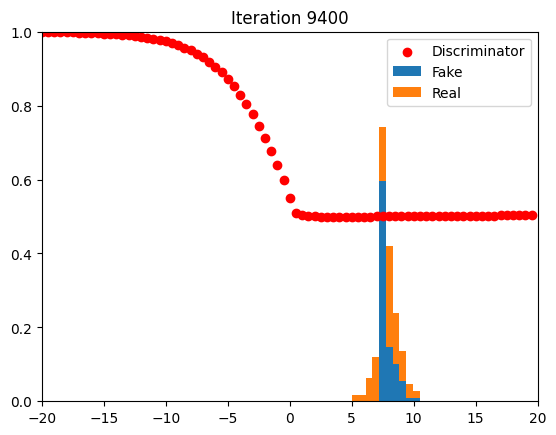

3/3 [==============================] - 0s 3ms/step


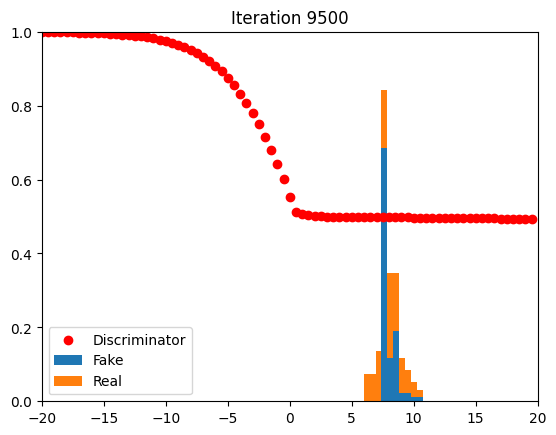

3/3 [==============================] - 0s 3ms/step


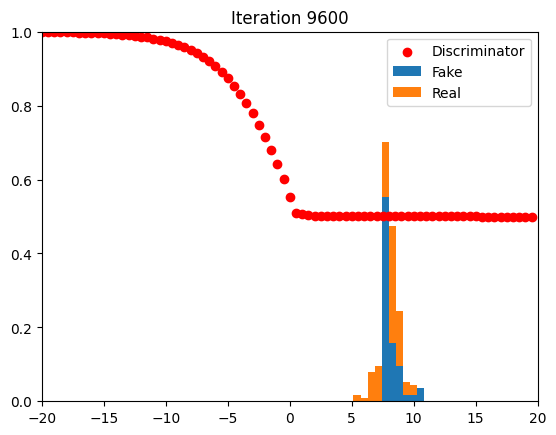

3/3 [==============================] - 0s 4ms/step


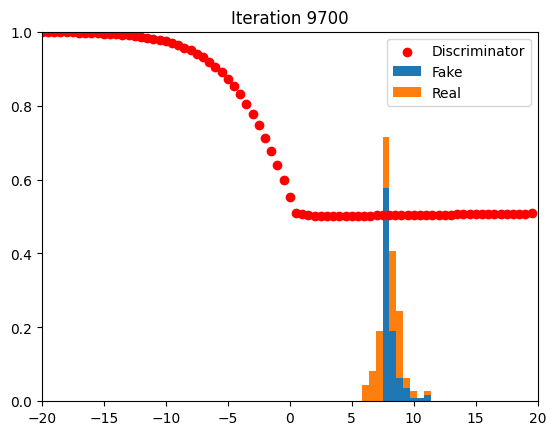

3/3 [==============================] - 0s 4ms/step


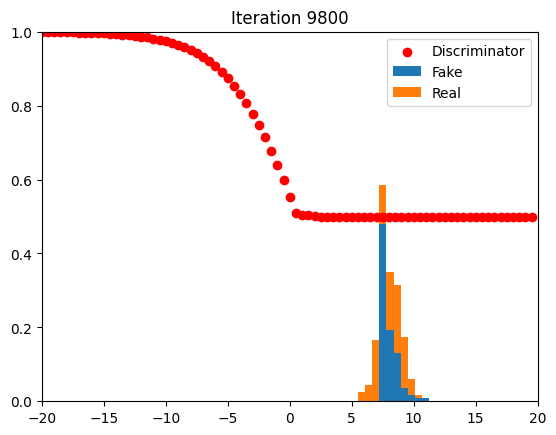

3/3 [==============================] - 0s 4ms/step


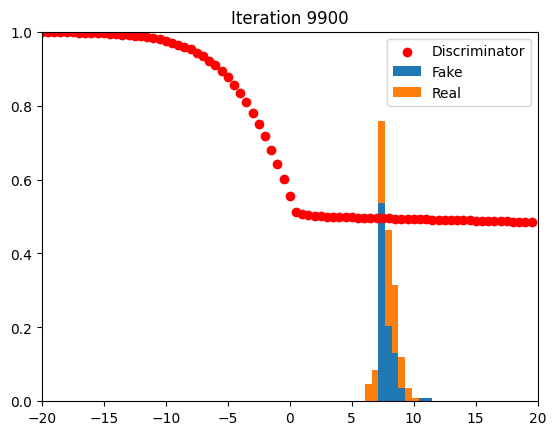

4/4 [==============================] - 0s 3ms/step


In [ ]:
# We will store the losses here
g_losses = []
d_losses = []

# Training loop
n_samples = 100
epochs = 10000

for e in range(epochs):
  # Get a random set of input noise
  noise = np.random.normal(0, 1, size=[n_samples, latent_dim])

  # Also get a sample from the 'real' distribution
  real = np.random.normal(real_mean, 1, size=[n_samples, latent_dim])

  # Generate some fake samples using the generator
  fake = generator.predict(noise)

  # Concatenate the fake and real images
  X = np.concatenate([real, fake])

  # Labels for generated and real data
  Y_dis = np.zeros(2*n_samples)

  # Set labels for real samples to 1
  Y_dis[:n_samples] = 1

  # Train discriminator with this batch of samples
  discriminator.trainable = True
  d_loss = discriminator.train_on_batch(X, Y_dis)
  d_losses_1.append(d_loss)

  # Train generator with a new batch of generated samples
  # Freeze the discriminator part
  discriminator.trainable = False
  noise = np.random.normal(0, 1, size=[n_samples, latent_dim])
  # From the generator's perspective, the discriminator should predict
  # ones for all samples
  Y_gen = np.ones(n_samples)
  g_loss = gan.train_on_batch(noise, Y_gen)
  g_losses_1.append(g_loss)

  if e % 100 == 0:
      noise = np.random.normal(0, 1, size=[n_samples, latent_dim])
      fake = generator.predict(noise)
      real = np.random.normal(real_mean, 1, size=[n_samples, latent_dim])
      pred = discriminator.predict(np.arange(-20, 20, 0.5).reshape((80, 1)))

      # Plotting
      plt.clf()
      plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
      plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
      plt.xlim(-20, 20)
      plt.ylim(0, 1)
      plt.title('Iteration {}'.format(e))
      plt.legend(['Discriminator', 'Fake', 'Real'])
      plt.show()
      time.sleep(0.5)

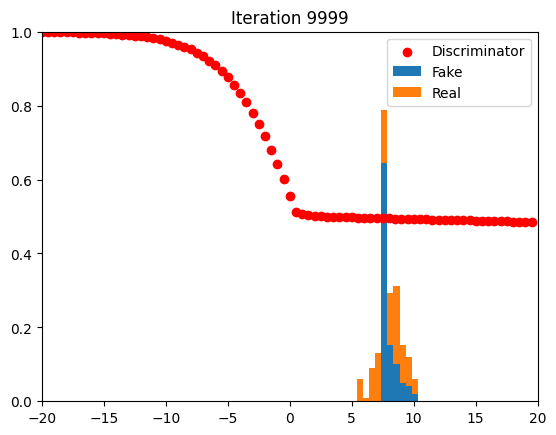

In [ ]:
# Plotting the last iteration
plt.clf()
plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
plt.xlim(-20, 20)
plt.ylim(0, 1)
plt.title('Iteration {}'.format(e))
plt.legend(['Discriminator', 'Fake', 'Real'])
plt.show()

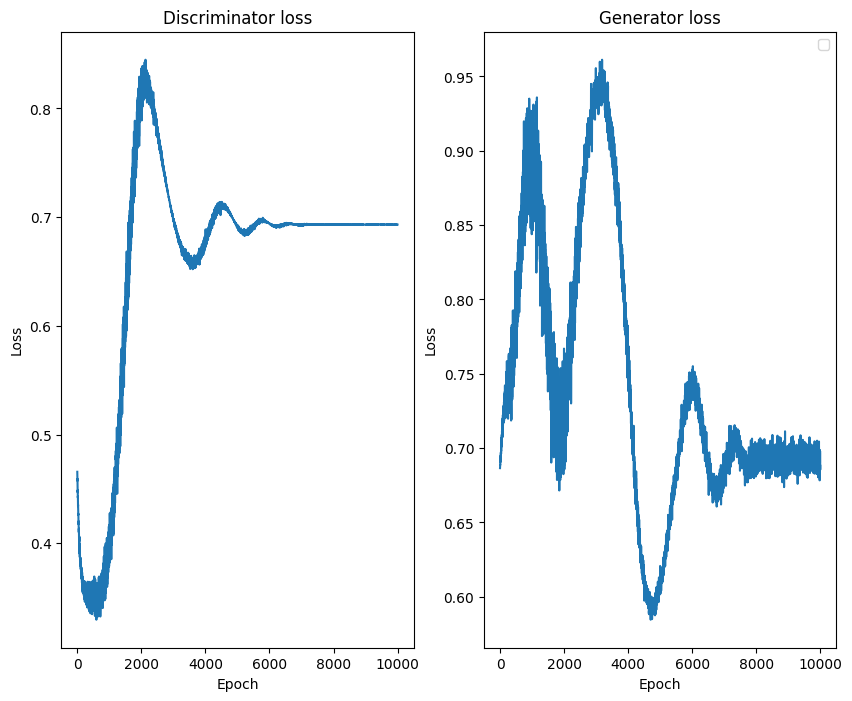

In [ ]:
# Plotting the discriminator and generator loss curves
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(d_losses)
plt.title('Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(g_losses)
plt.title('Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

If all is well, the fake and real distributions should nicely overlap after training. The discriminator has essentially pushed the fake samples towards the real distribution and the generator is now able to transform the noise distribution into a distribution of 'real' samples!

**Question** Can you explain what happened to the red line during training? Why does it look like it does after training?

The red line represents the discriminator's output probability for a range of input values (from -20 to 20 with a step size of 0.5). This is esentially showing how confident the discriminator is in classifying different points along the 1D space as "real" or "fake".

As training progresses, the red line should ideally move towards 0.5 for all points, indicating that the discriminator is becoming uncertain about whether the samples are real or fake. This indicates that the generator is doing a better job at creating realistic samples.

**Question** Try training the GAN with different input noise distributions, e.g. uniform.

**Question** See if you can find a distribution for the real samples for which the generator fails to generate samples.

### Training the GAN with different input noise distribution

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 32)                64        
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32)                0         
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 97 (388.00 Byte)
Trainable params: 97 (388.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 32)                64        
                                                              

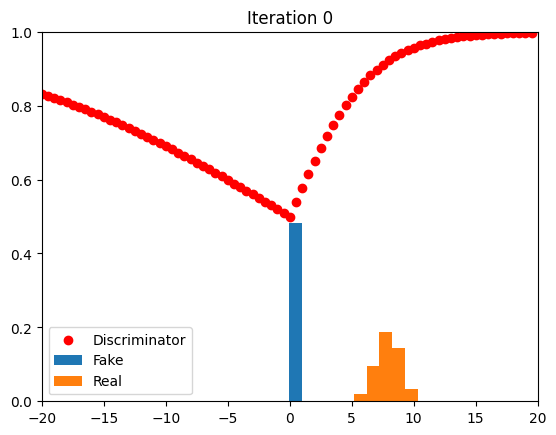

3/3 [==============================] - 0s 5ms/step


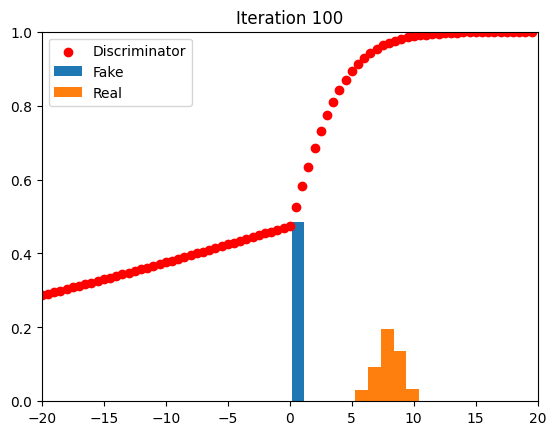

3/3 [==============================] - 0s 4ms/step


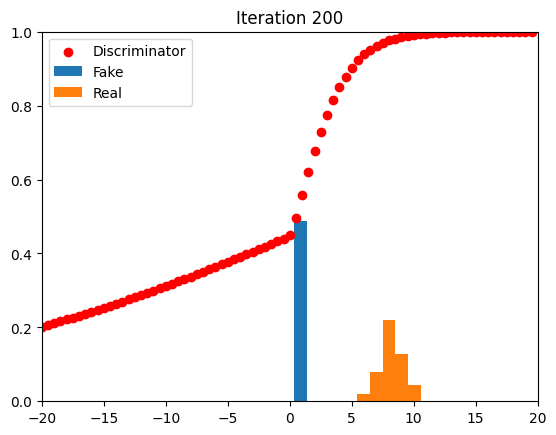

3/3 [==============================] - 0s 4ms/step


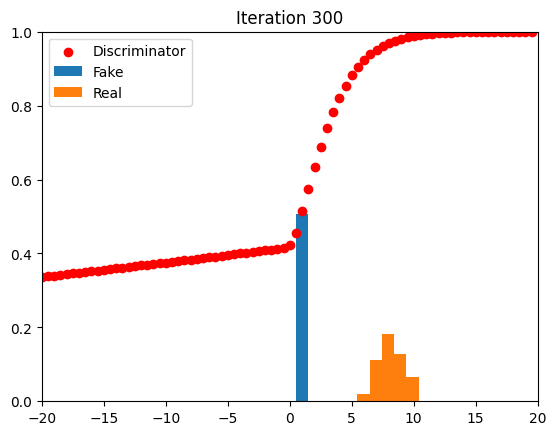

3/3 [==============================] - 0s 4ms/step


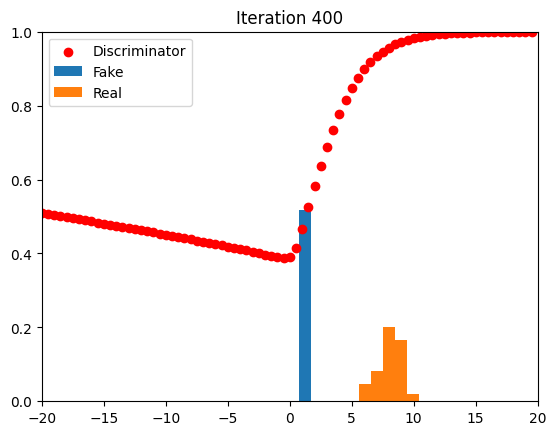

3/3 [==============================] - 0s 4ms/step


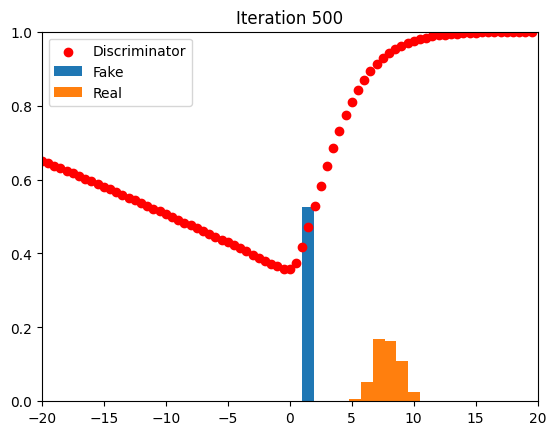

3/3 [==============================] - 0s 5ms/step


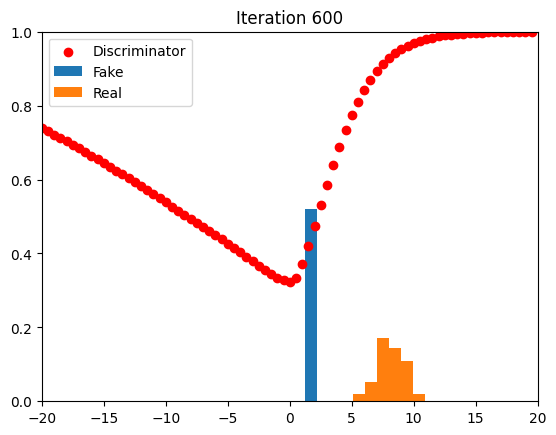

3/3 [==============================] - 0s 3ms/step


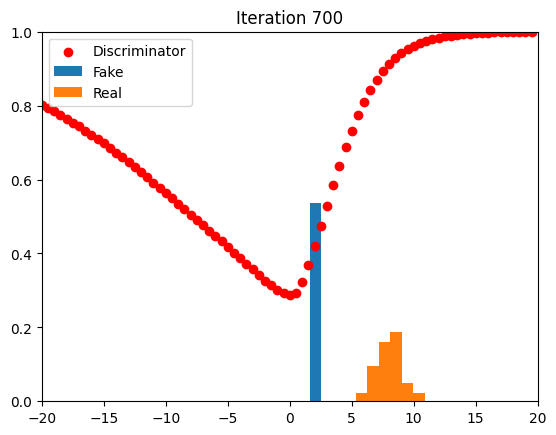

3/3 [==============================] - 0s 4ms/step


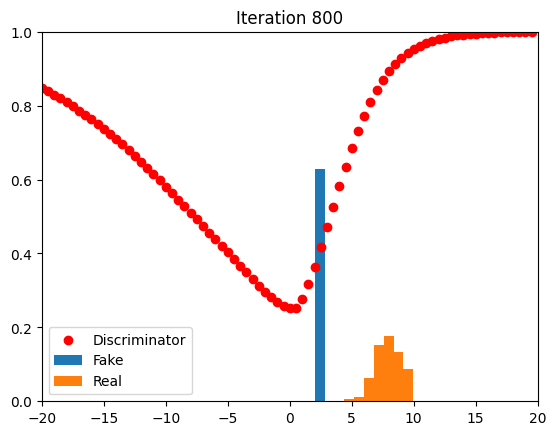

3/3 [==============================] - 0s 6ms/step


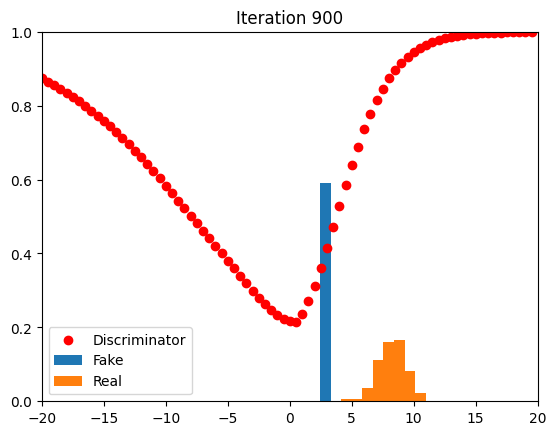

3/3 [==============================] - 0s 5ms/step


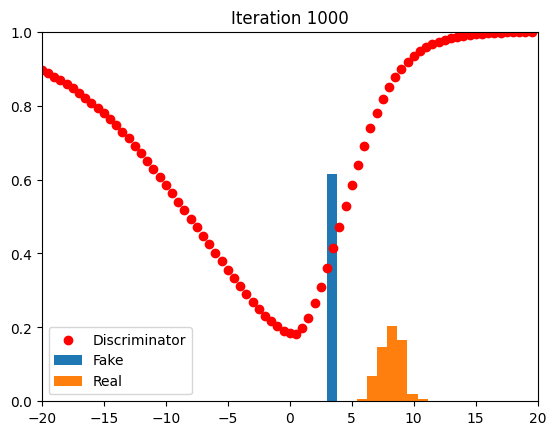

3/3 [==============================] - 0s 4ms/step


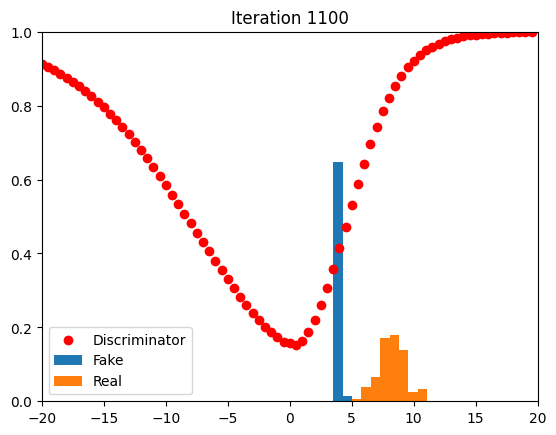

3/3 [==============================] - 0s 3ms/step


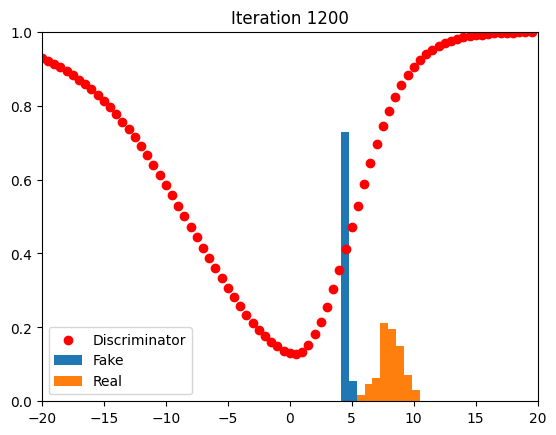

3/3 [==============================] - 0s 5ms/step


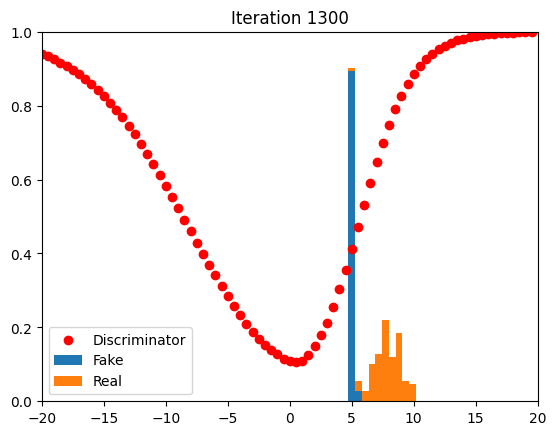

3/3 [==============================] - 0s 3ms/step


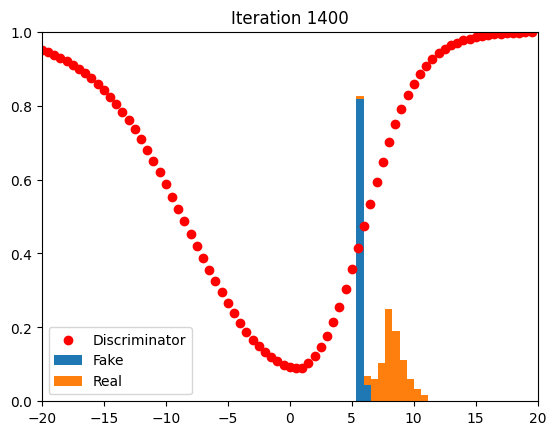

3/3 [==============================] - 0s 4ms/step


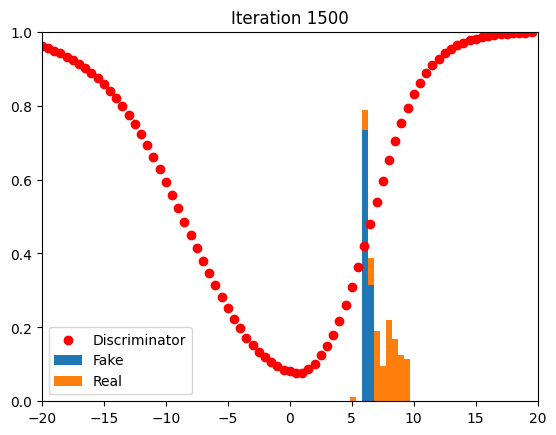

3/3 [==============================] - 0s 7ms/step


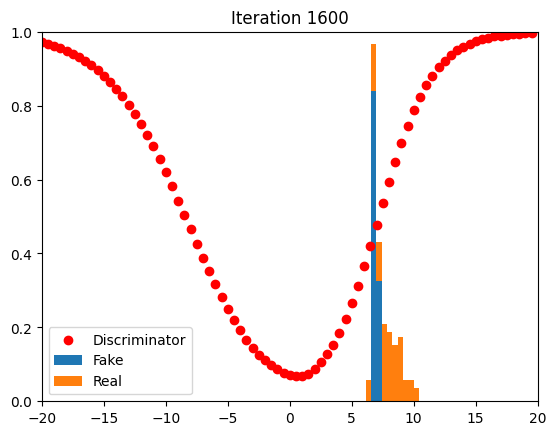

3/3 [==============================] - 0s 6ms/step


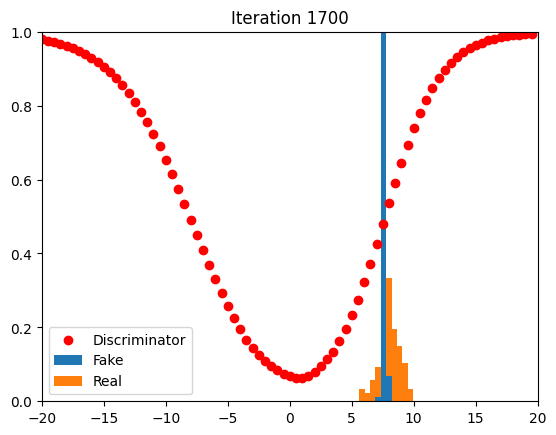

3/3 [==============================] - 0s 4ms/step


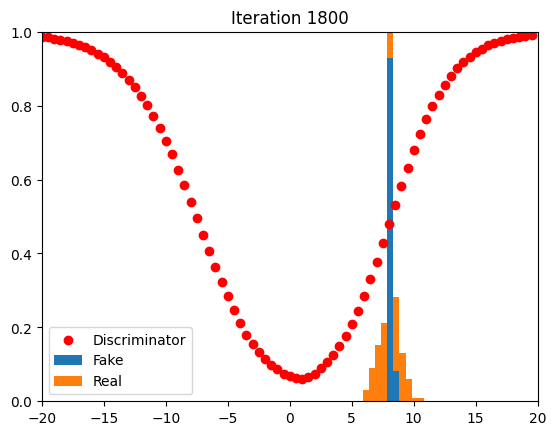

3/3 [==============================] - 0s 3ms/step


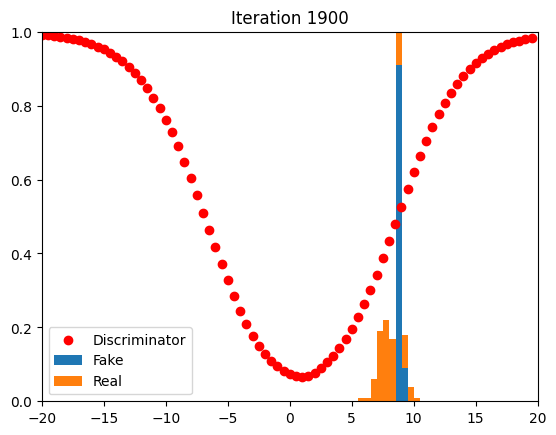

3/3 [==============================] - 0s 3ms/step


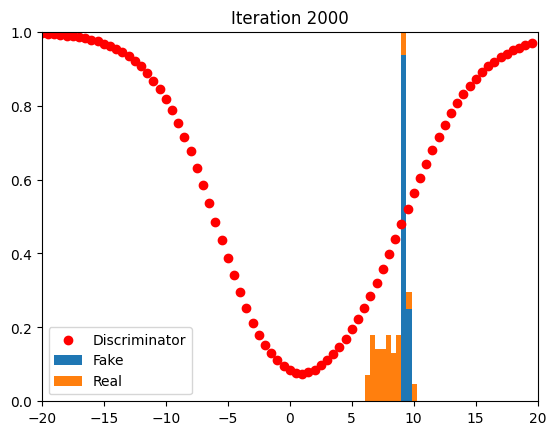

3/3 [==============================] - 0s 6ms/step


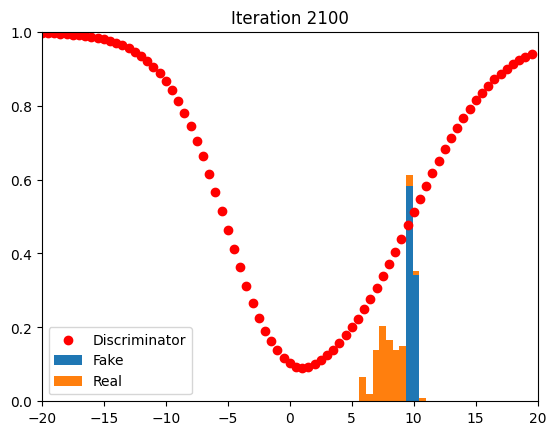

3/3 [==============================] - 0s 3ms/step


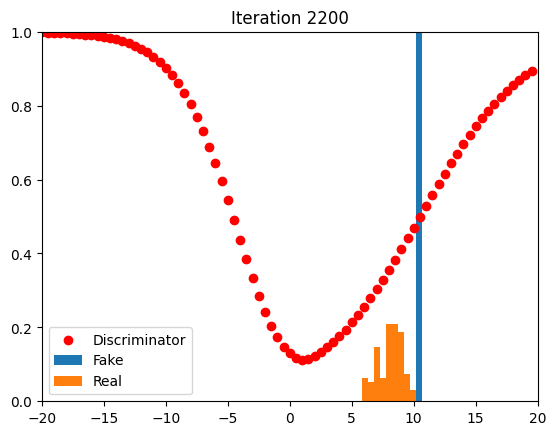

3/3 [==============================] - 0s 3ms/step


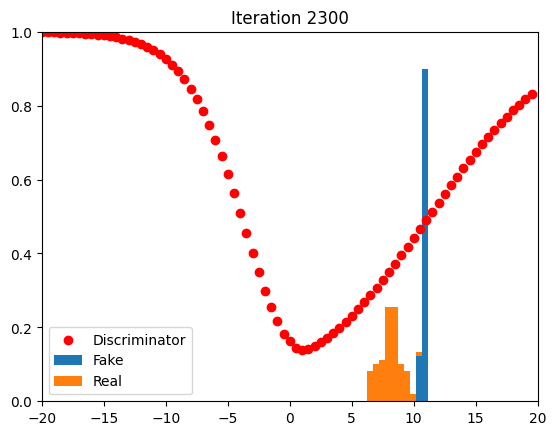

3/3 [==============================] - 0s 8ms/step


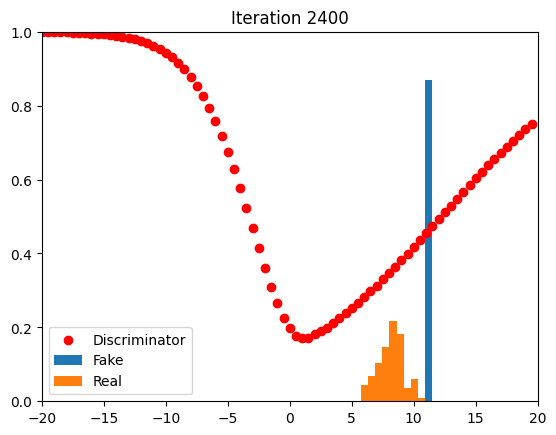

3/3 [==============================] - 0s 3ms/step


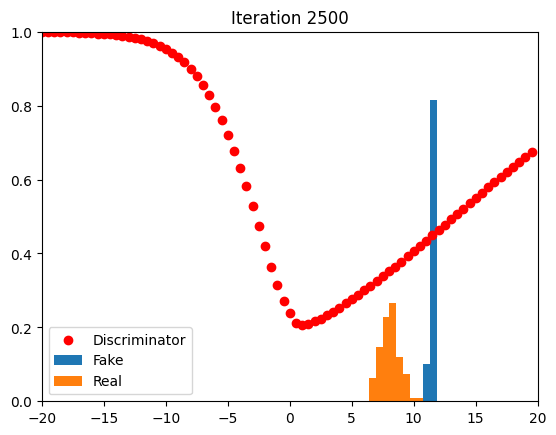

3/3 [==============================] - 0s 6ms/step


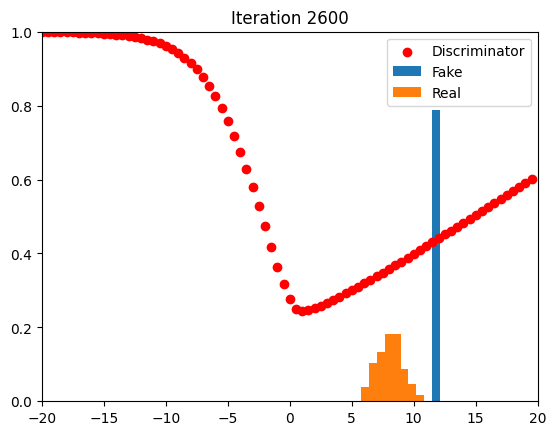

3/3 [==============================] - 0s 4ms/step


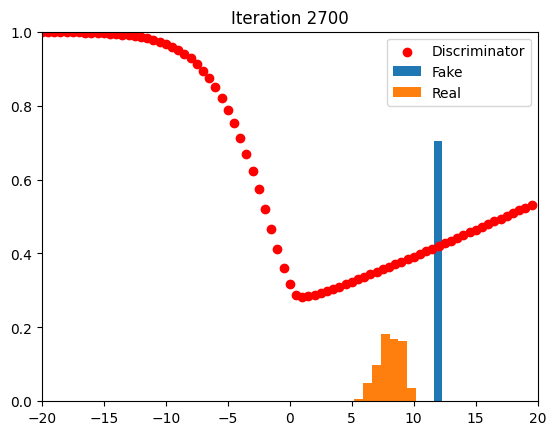

3/3 [==============================] - 0s 2ms/step


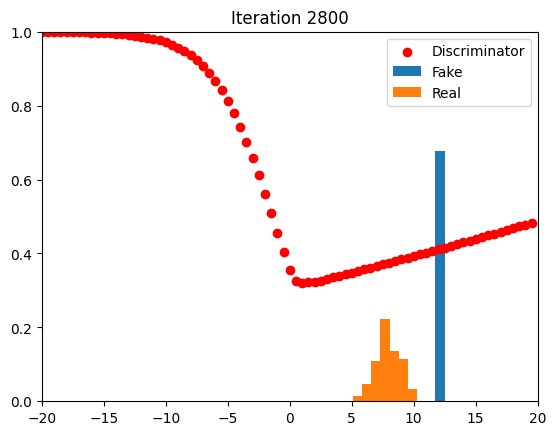

3/3 [==============================] - 0s 4ms/step


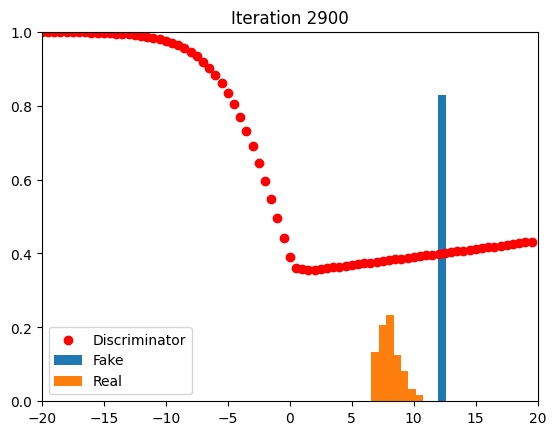

3/3 [==============================] - 0s 9ms/step


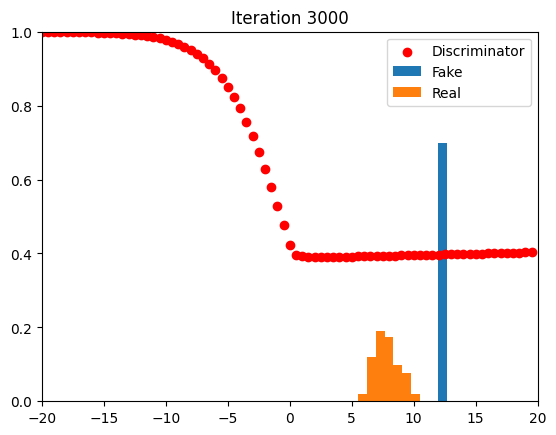

3/3 [==============================] - 0s 5ms/step


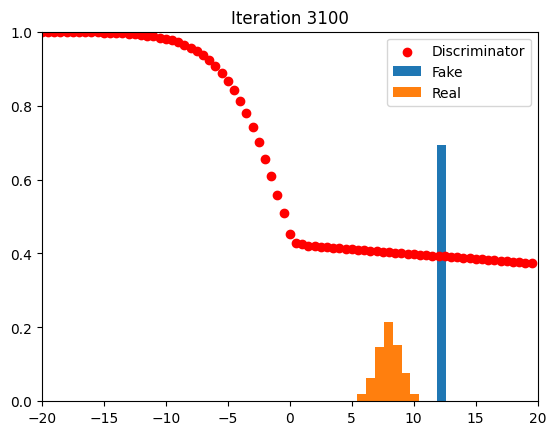

3/3 [==============================] - 0s 4ms/step


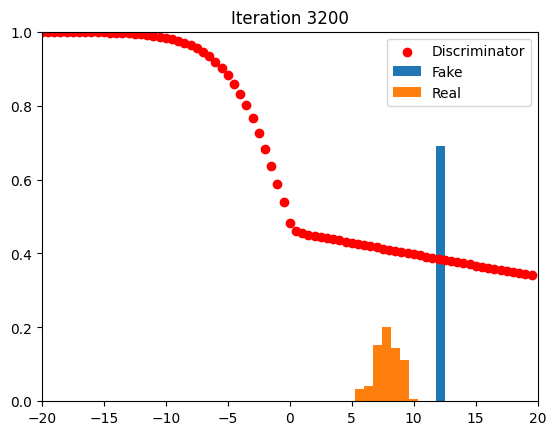

3/3 [==============================] - 0s 3ms/step


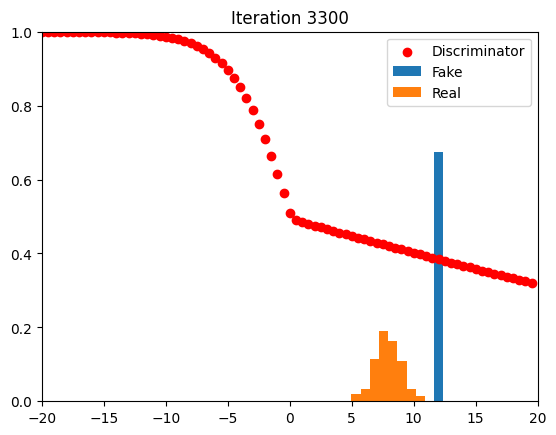

3/3 [==============================] - 0s 6ms/step


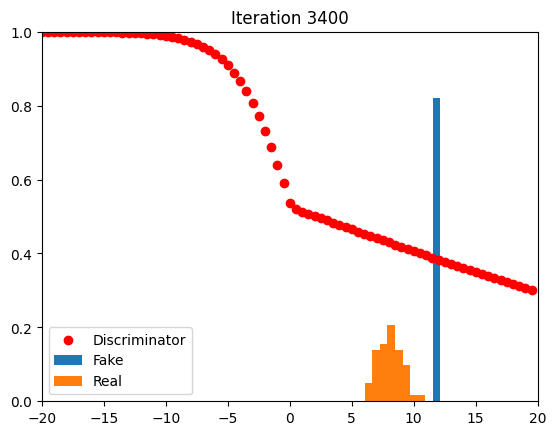

3/3 [==============================] - 0s 5ms/step


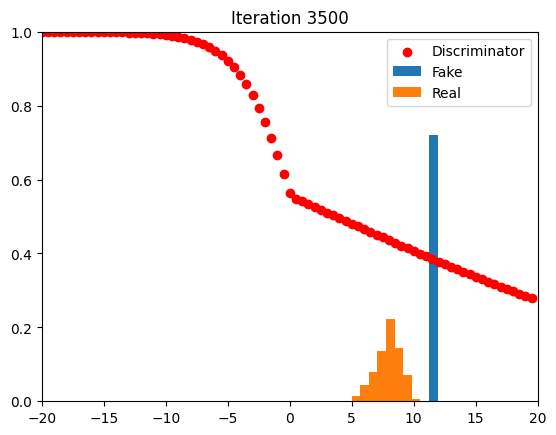

3/3 [==============================] - 0s 3ms/step


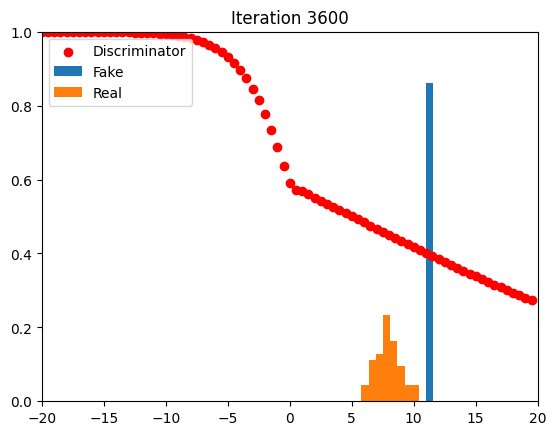

3/3 [==============================] - 0s 6ms/step


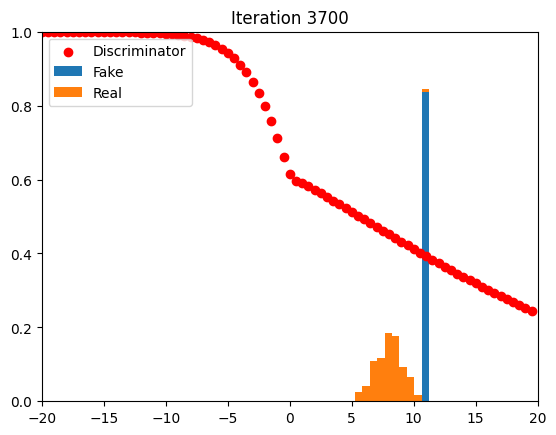

3/3 [==============================] - 0s 6ms/step


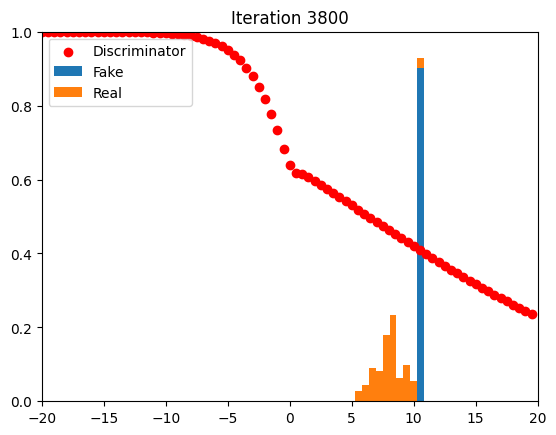

3/3 [==============================] - 0s 4ms/step


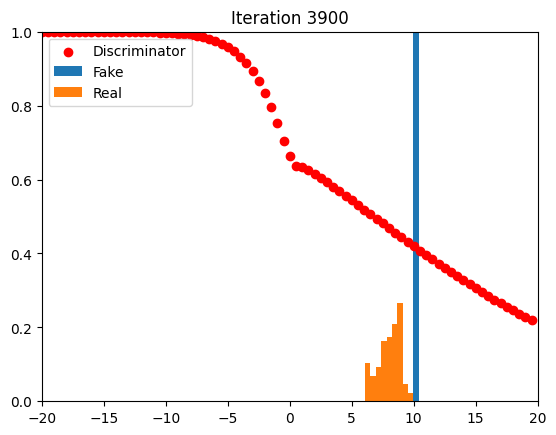

3/3 [==============================] - 0s 3ms/step


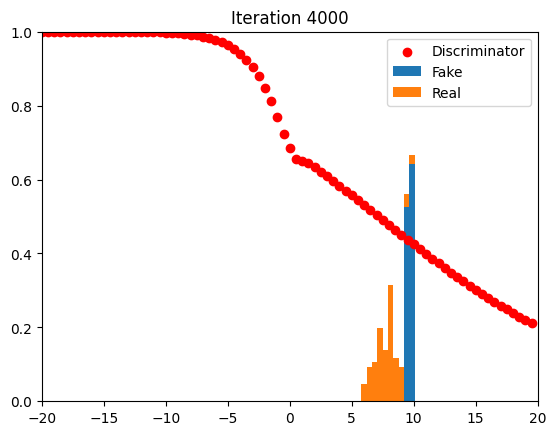

3/3 [==============================] - 0s 3ms/step


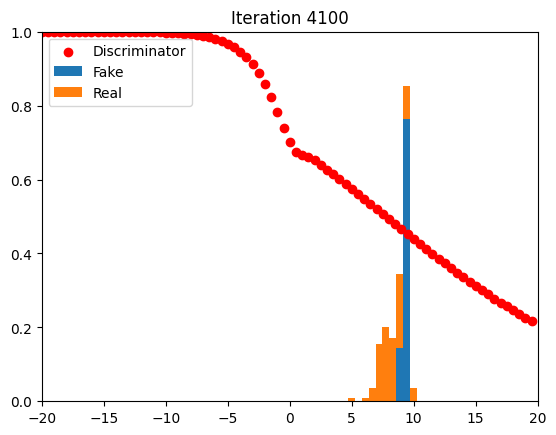

3/3 [==============================] - 0s 3ms/step


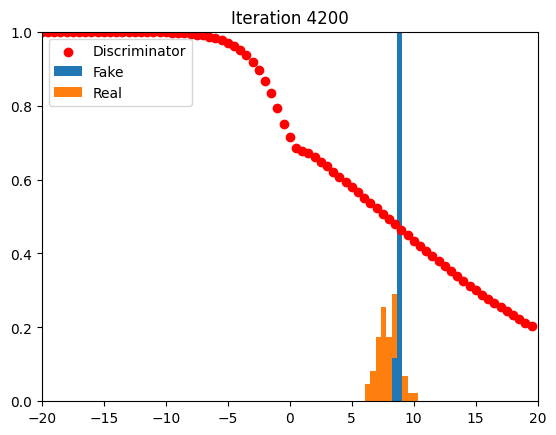

3/3 [==============================] - 0s 3ms/step


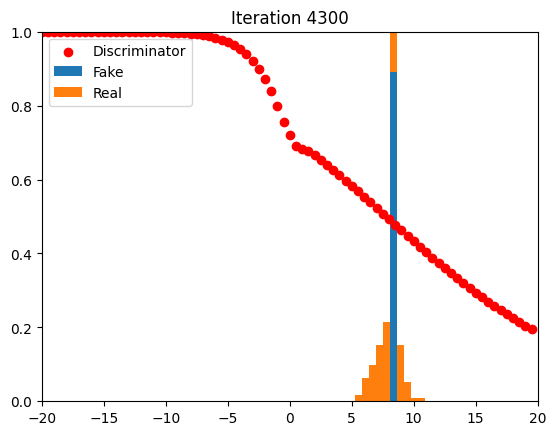

3/3 [==============================] - 0s 6ms/step


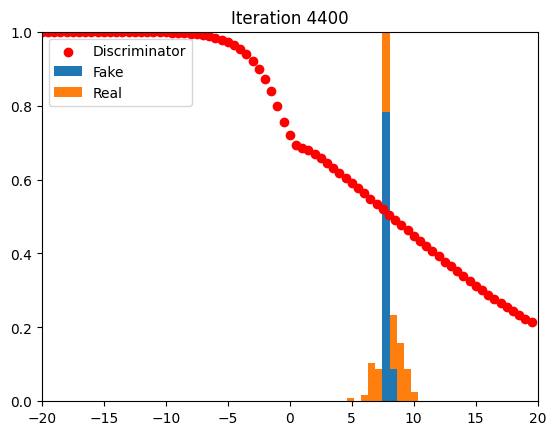

3/3 [==============================] - 0s 3ms/step


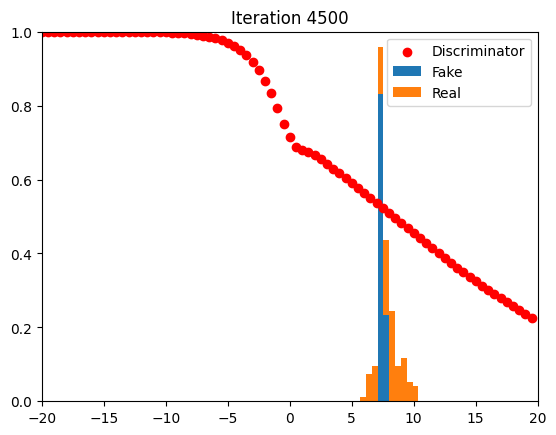

3/3 [==============================] - 0s 3ms/step


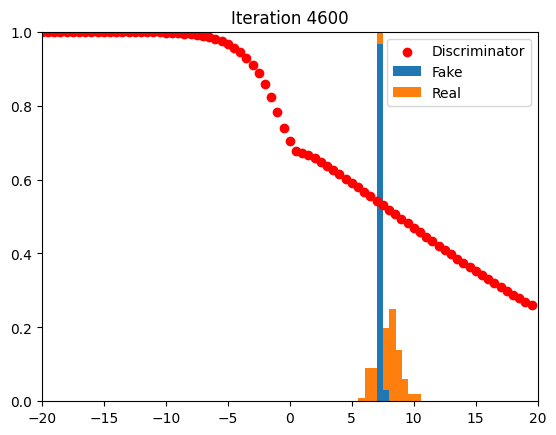

3/3 [==============================] - 0s 3ms/step


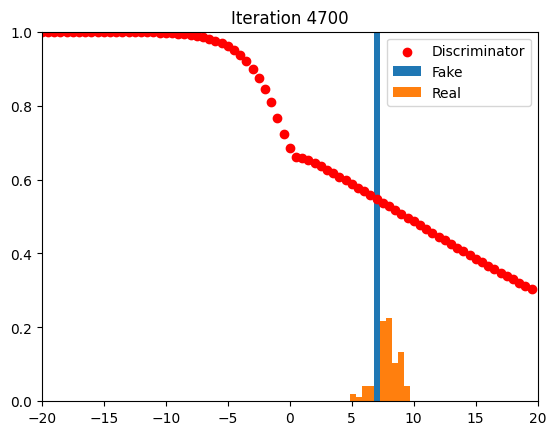

3/3 [==============================] - 0s 4ms/step


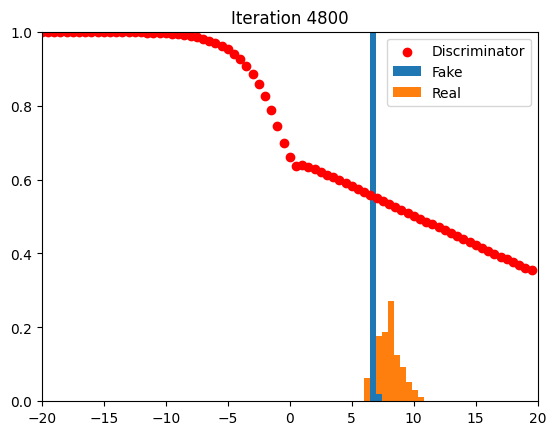

3/3 [==============================] - 0s 5ms/step


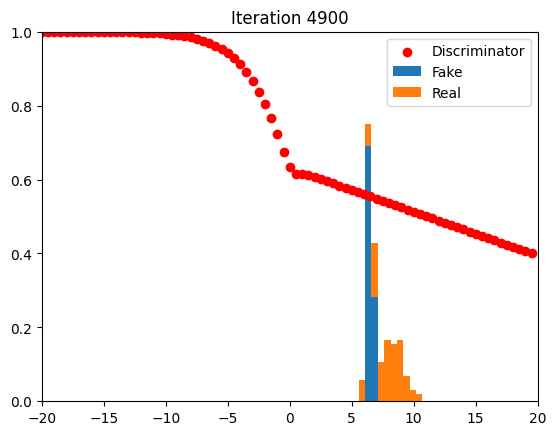

3/3 [==============================] - 0s 8ms/step


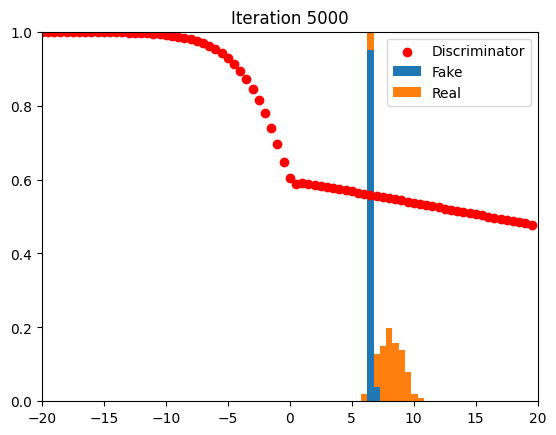

3/3 [==============================] - 0s 6ms/step


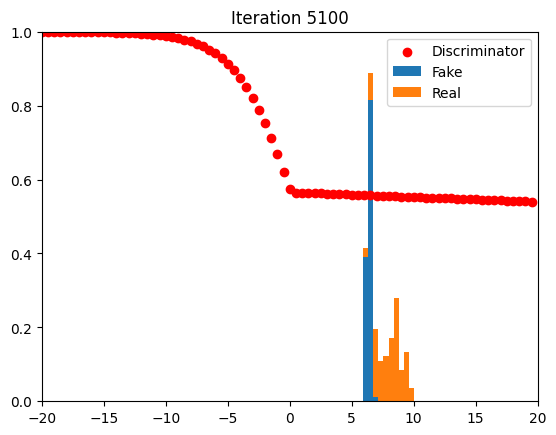

3/3 [==============================] - 0s 7ms/step


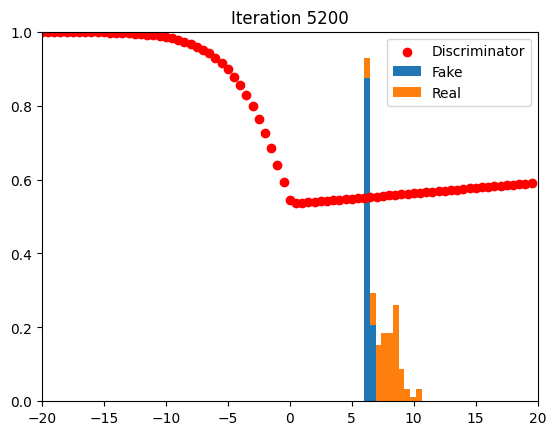

3/3 [==============================] - 0s 5ms/step


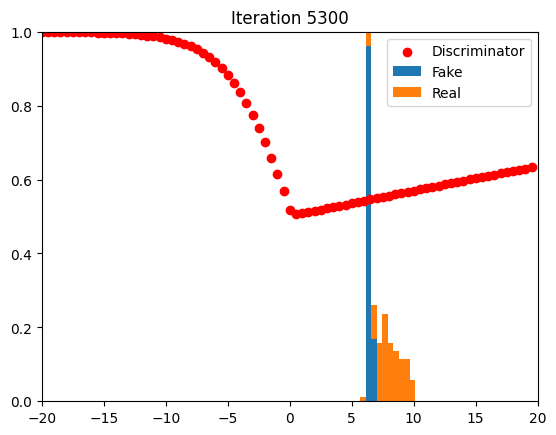

3/3 [==============================] - 0s 3ms/step


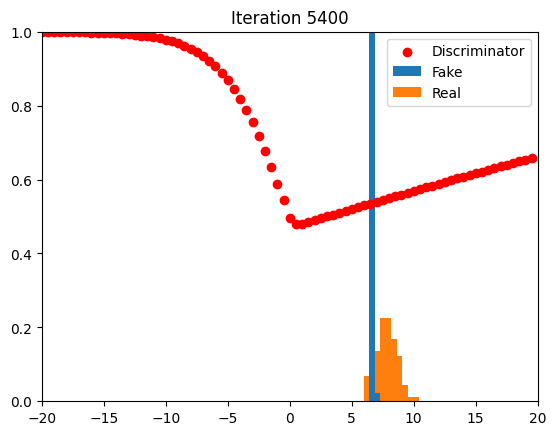

3/3 [==============================] - 0s 6ms/step


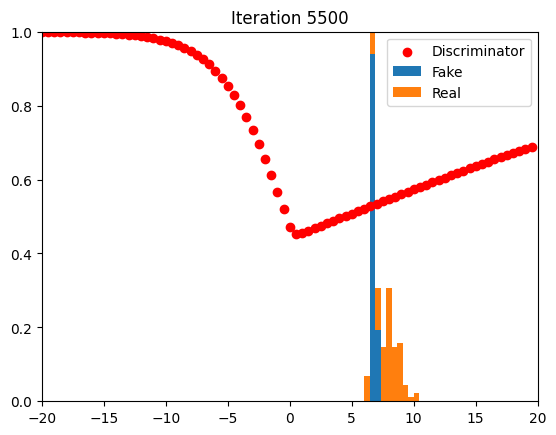

3/3 [==============================] - 0s 4ms/step


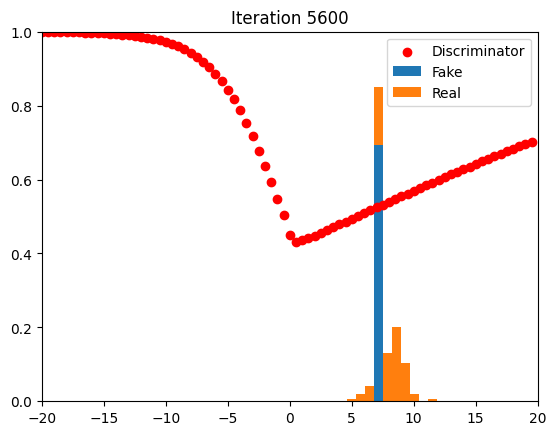

3/3 [==============================] - 0s 6ms/step


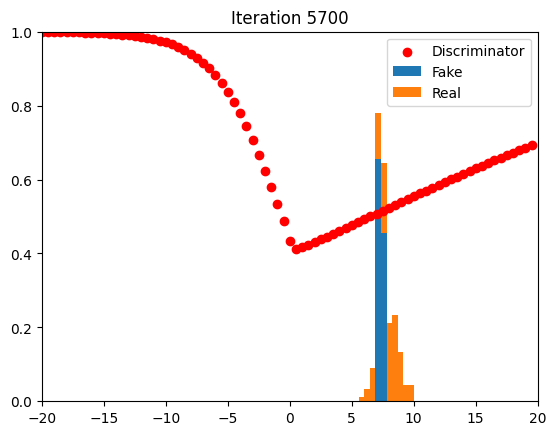

3/3 [==============================] - 0s 3ms/step


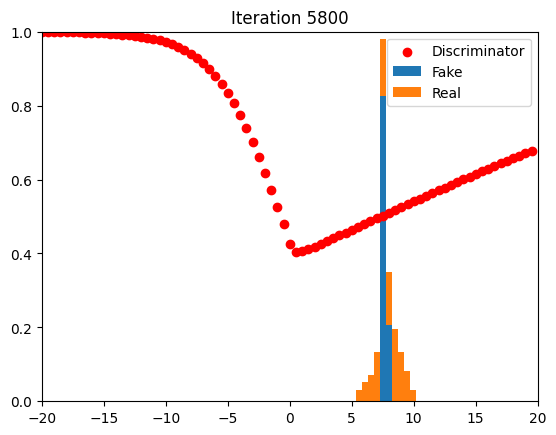

3/3 [==============================] - 0s 3ms/step


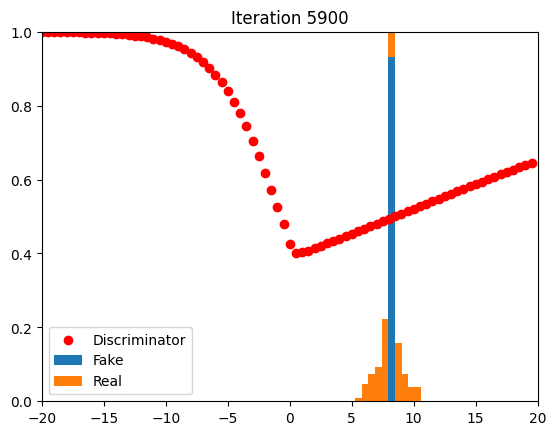

3/3 [==============================] - 0s 6ms/step


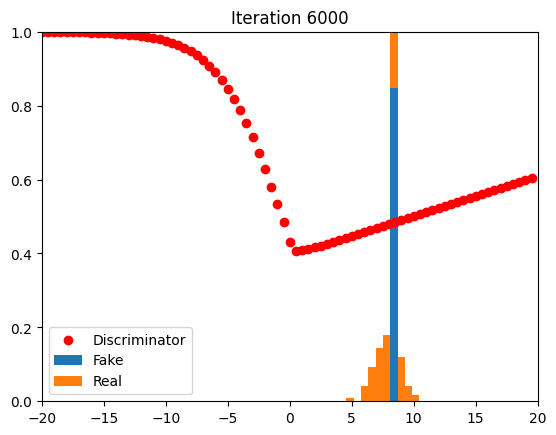

3/3 [==============================] - 0s 6ms/step


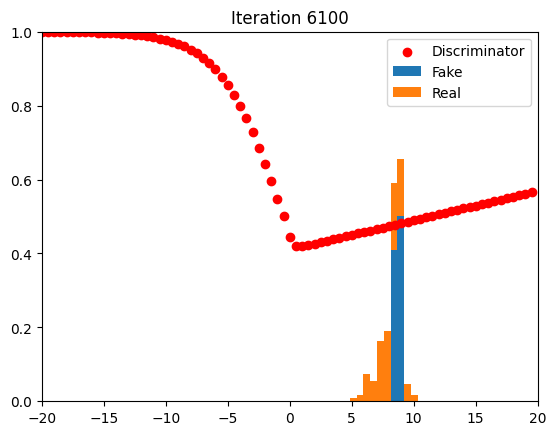

3/3 [==============================] - 0s 7ms/step


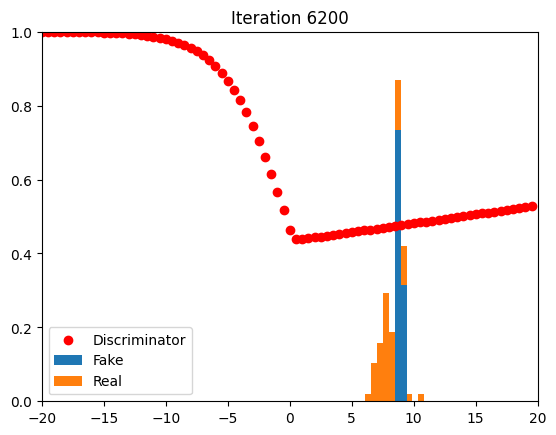

3/3 [==============================] - 0s 4ms/step


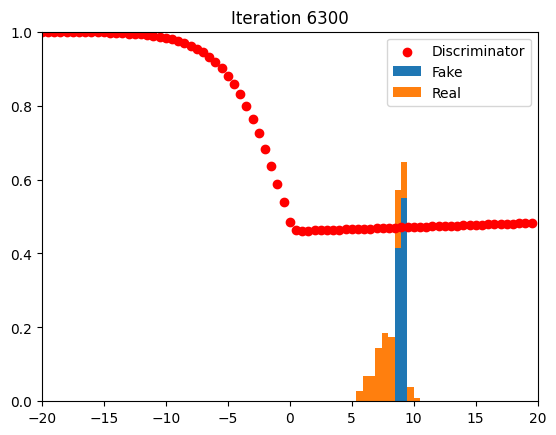

3/3 [==============================] - 0s 3ms/step


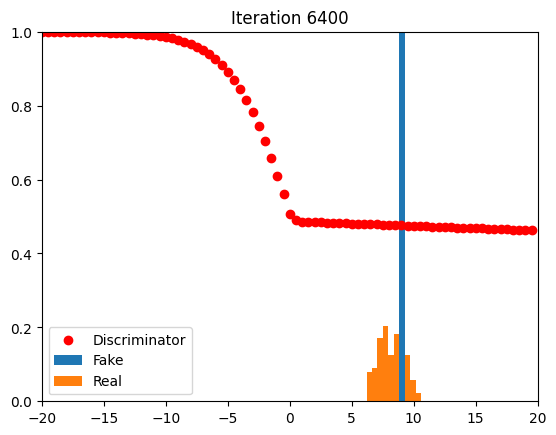

3/3 [==============================] - 0s 8ms/step


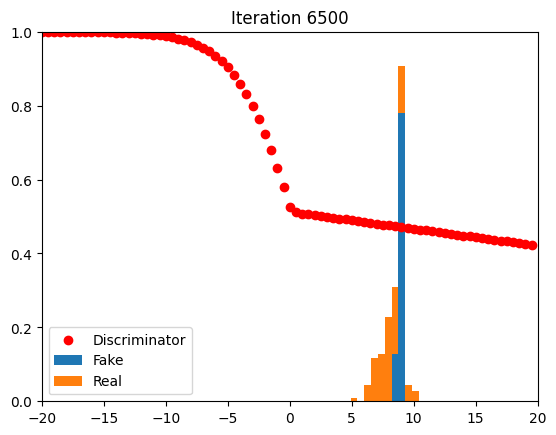

3/3 [==============================] - 0s 4ms/step


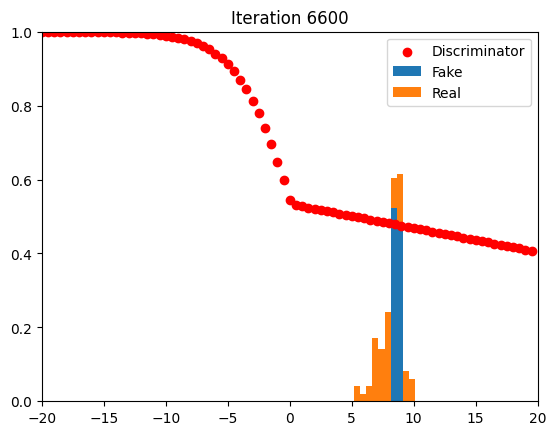

3/3 [==============================] - 0s 5ms/step


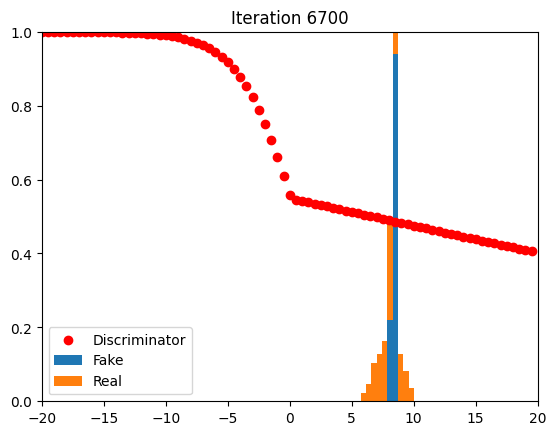

3/3 [==============================] - 0s 7ms/step


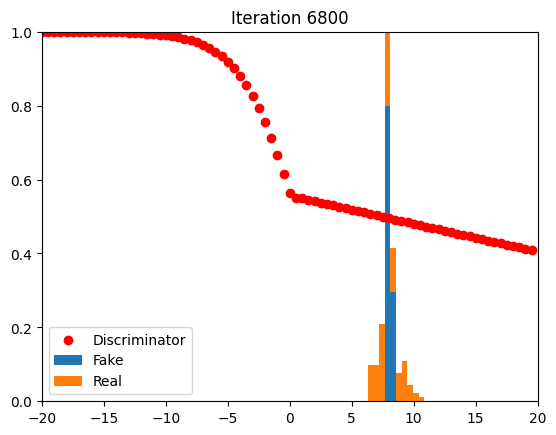

3/3 [==============================] - 0s 10ms/step


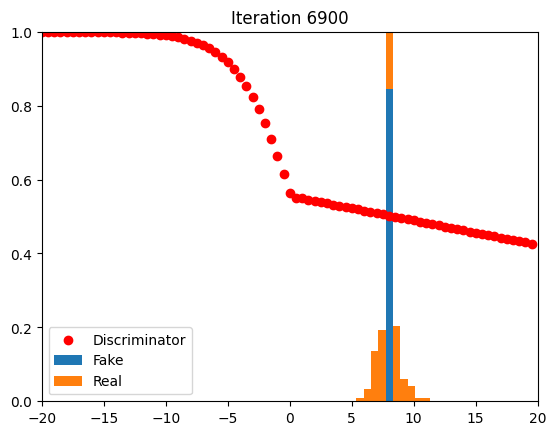

3/3 [==============================] - 0s 6ms/step


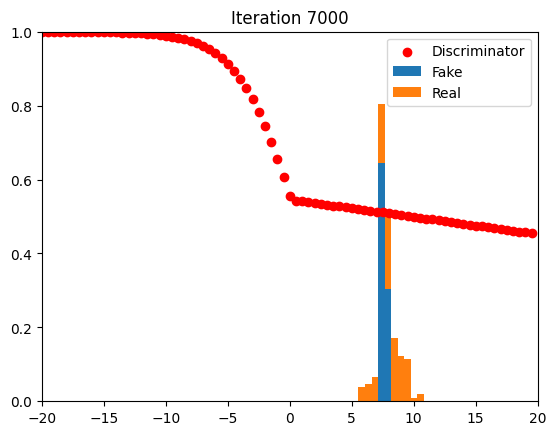

3/3 [==============================] - 0s 6ms/step


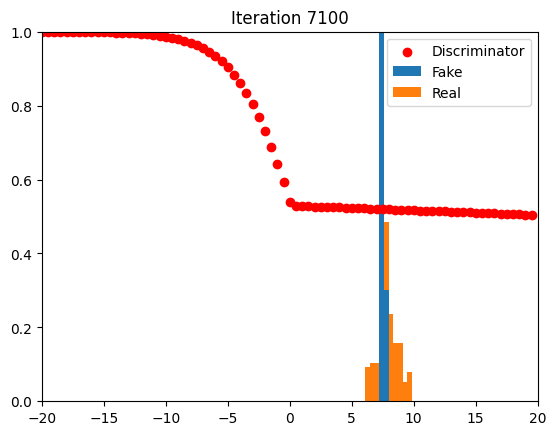

3/3 [==============================] - 0s 4ms/step


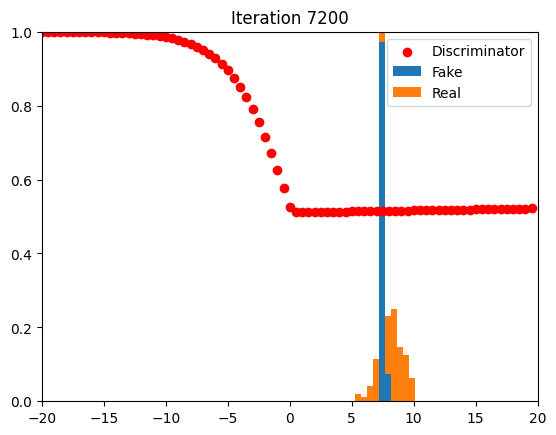

3/3 [==============================] - 0s 8ms/step


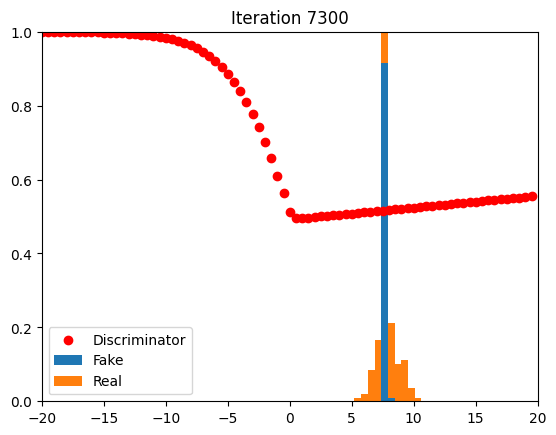

3/3 [==============================] - 0s 3ms/step


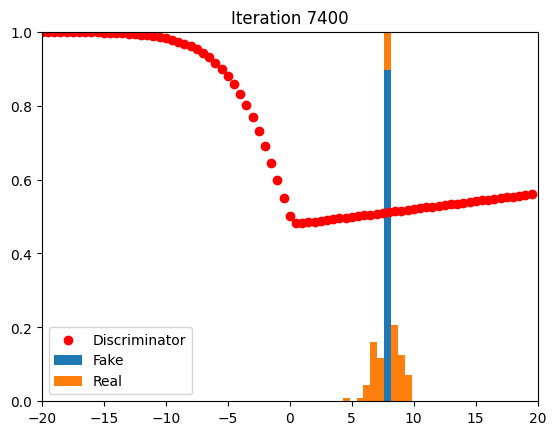

3/3 [==============================] - 0s 7ms/step


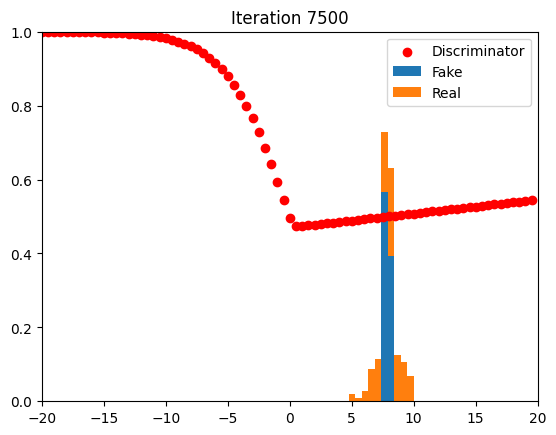

3/3 [==============================] - 0s 7ms/step


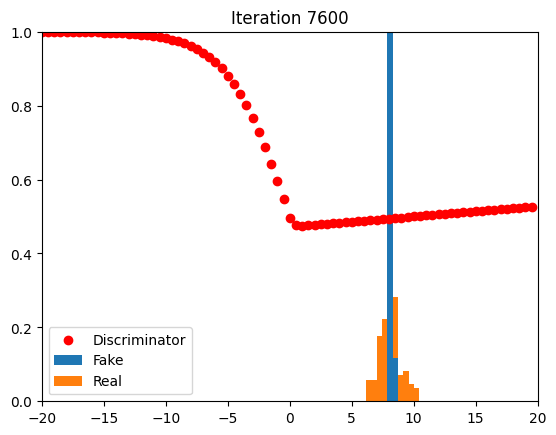

3/3 [==============================] - 0s 3ms/step


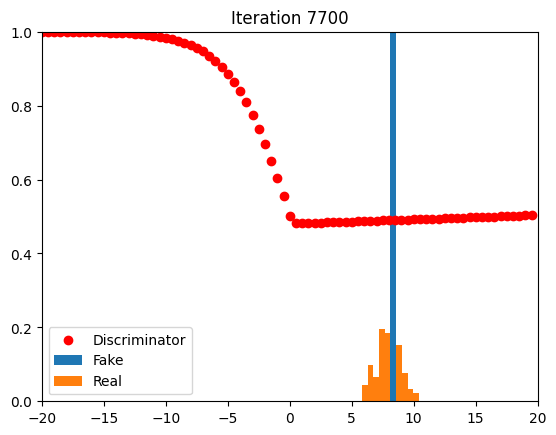

3/3 [==============================] - 0s 6ms/step


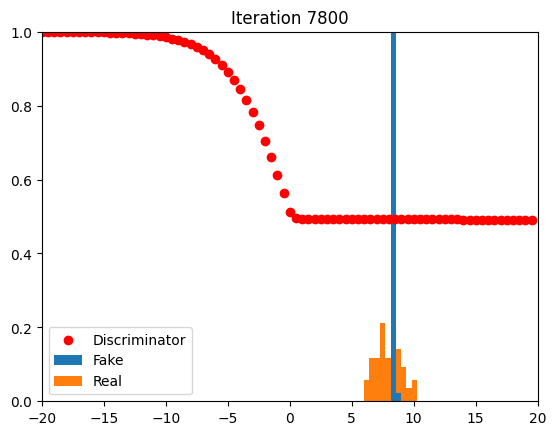

3/3 [==============================] - 0s 5ms/step


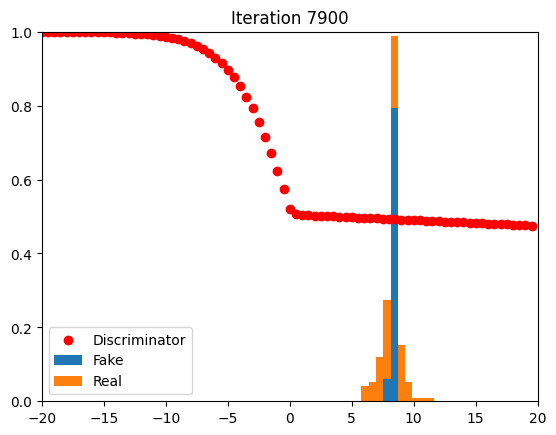

3/3 [==============================] - 0s 7ms/step


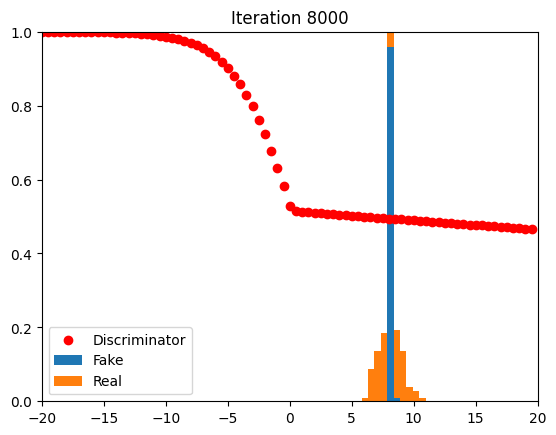

3/3 [==============================] - 0s 5ms/step


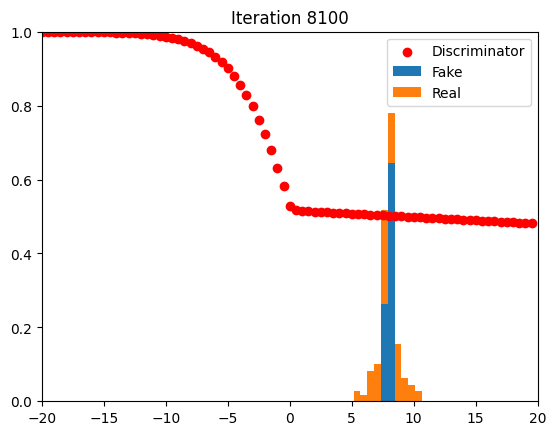

3/3 [==============================] - 0s 3ms/step


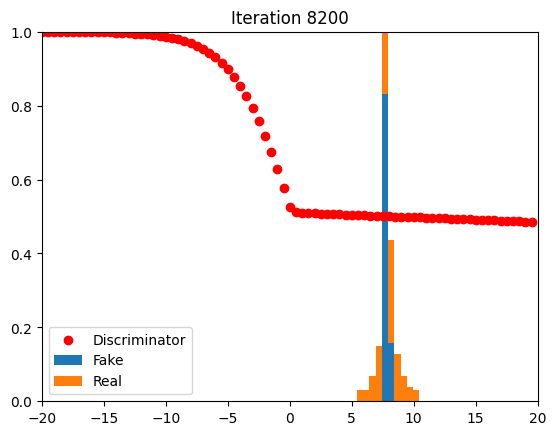

3/3 [==============================] - 0s 5ms/step


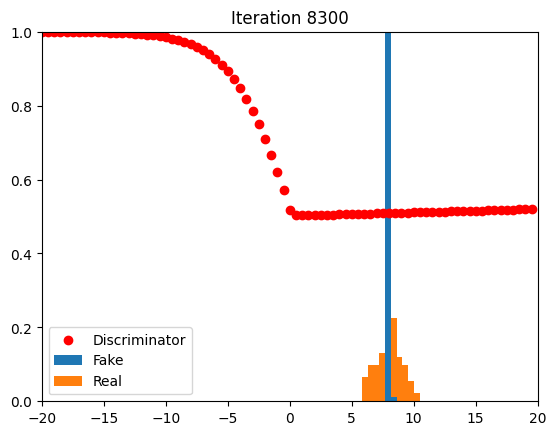

3/3 [==============================] - 0s 3ms/step


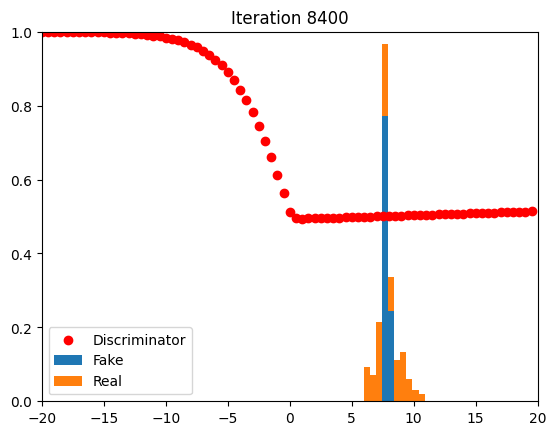

3/3 [==============================] - 0s 7ms/step


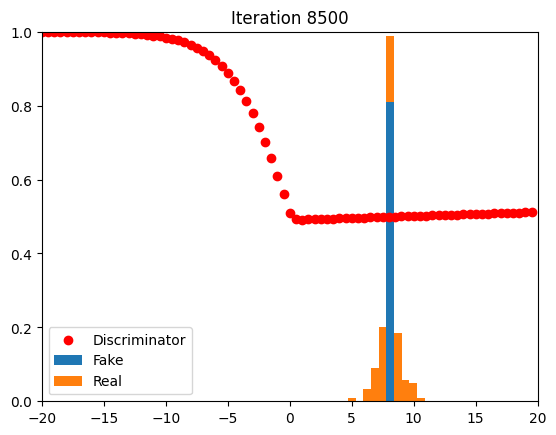

3/3 [==============================] - 0s 4ms/step


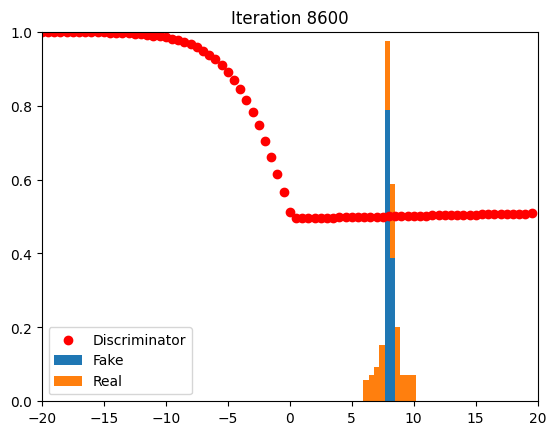

3/3 [==============================] - 0s 3ms/step


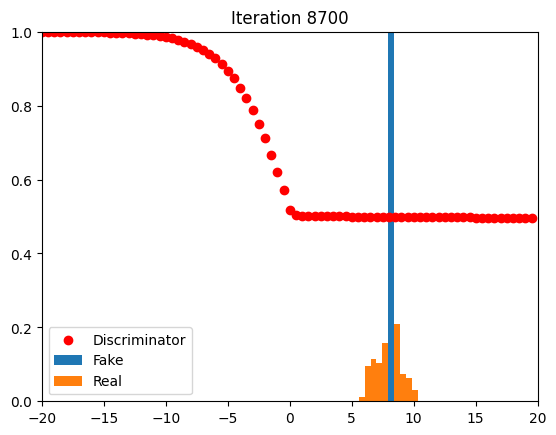

3/3 [==============================] - 0s 3ms/step


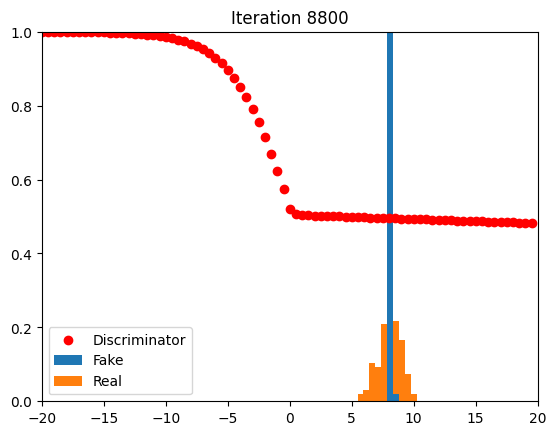

3/3 [==============================] - 0s 4ms/step


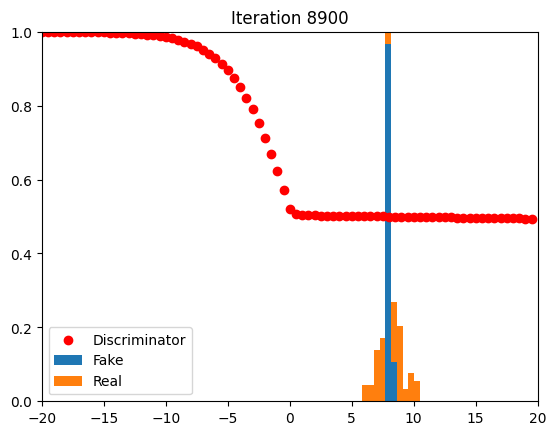

3/3 [==============================] - 0s 3ms/step


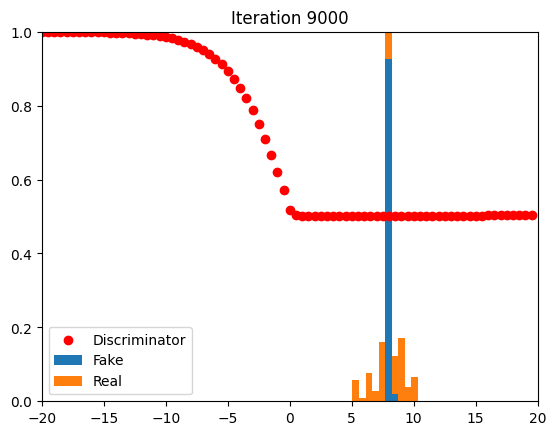

3/3 [==============================] - 0s 5ms/step


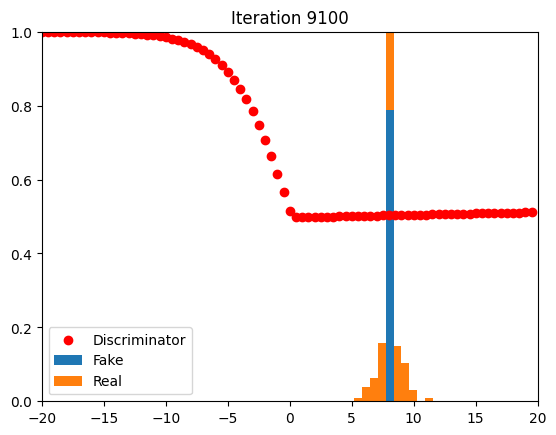

3/3 [==============================] - 0s 8ms/step


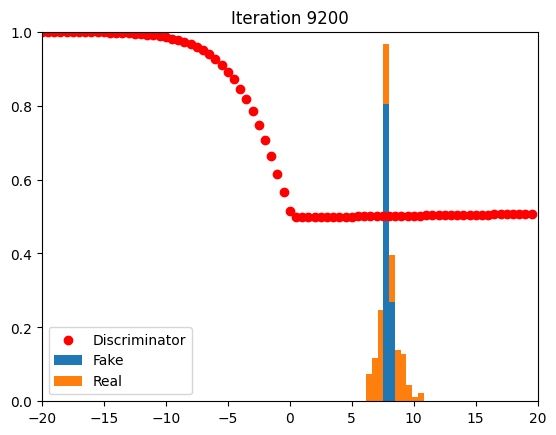

3/3 [==============================] - 0s 5ms/step


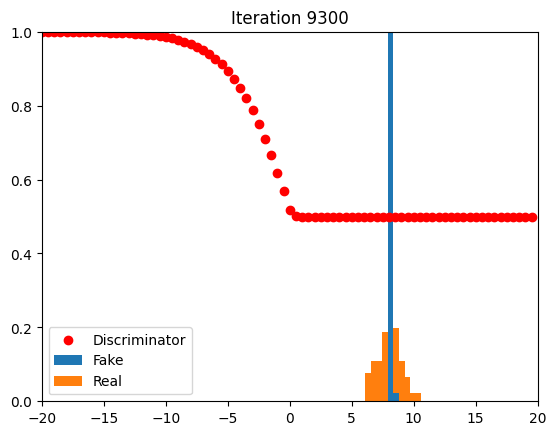

3/3 [==============================] - 0s 5ms/step


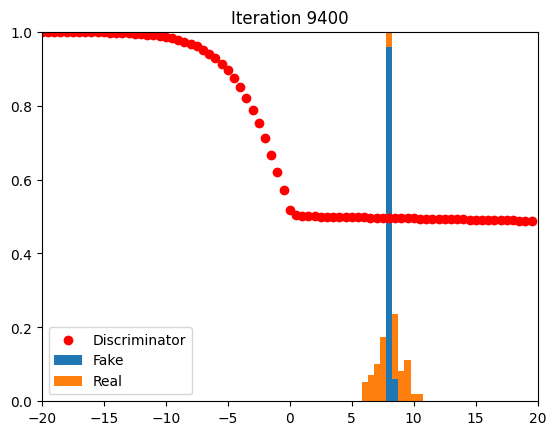

3/3 [==============================] - 0s 5ms/step


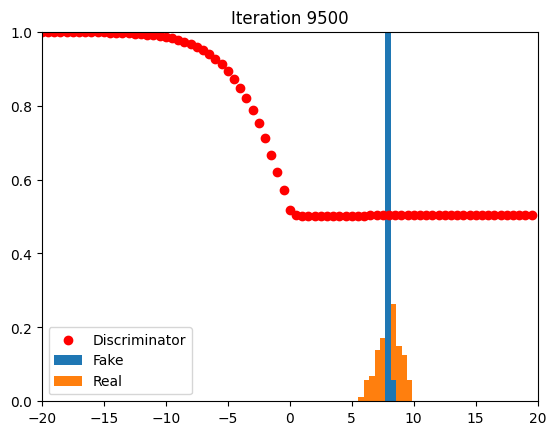

3/3 [==============================] - 0s 6ms/step


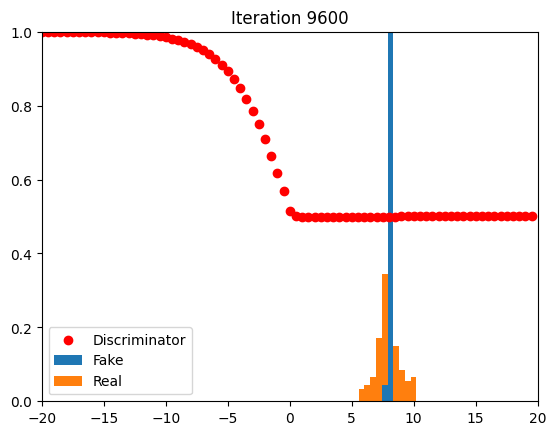

3/3 [==============================] - 0s 4ms/step


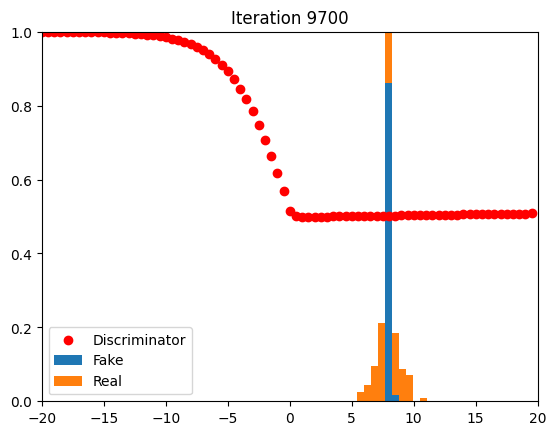

3/3 [==============================] - 0s 5ms/step


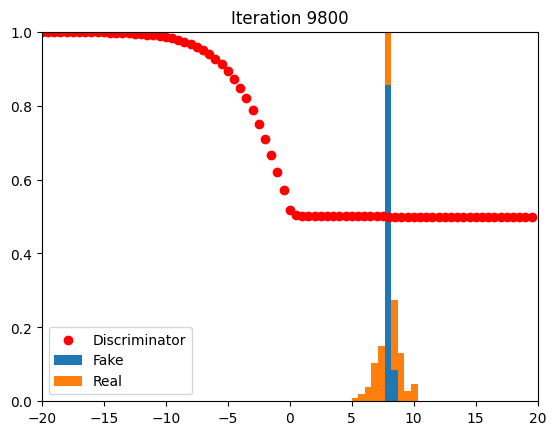

3/3 [==============================] - 0s 6ms/step


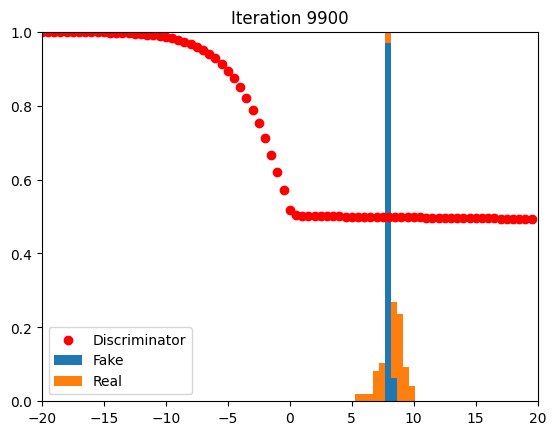

4/4 [==============================] - 0s 3ms/step


In [ ]:
# Get networks
discriminator = get_discriminator_1D()
generator = get_generator_1D()

# Configure both models for training
discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

# To configure the full model, we will set the 'trainable' parameter of the discriminator to False, as we don't want to optimize the discriminator when optimizing the generator
discriminator.trainable = False

# The input variable (noise) for the generator
z = keras.layers.Input(shape=(latent_dim,))

# What comes out of the generator
G_z = generator(z)

# What comes out of the discriminator when classifying the 'fake' samples
D_G_z = discriminator(G_z)

# The full GAN model
gan = keras.models.Model(inputs=z, outputs=D_G_z)

# The loss function for the GAN: this gets lower if the fake samples are classified as real
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

# Training the model with a uniform noise distribution
g_losses_2 = []
d_losses_2 = []

# Training loop (uniform distribution)
n_samples = 100
epochs = 10000

for e in range(epochs):
    # Get a random set of input noise (uniform distribution)
    noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])

    # Also get a sample from the 'real' distribution
    real = np.random.normal(real_mean, 1, size=[n_samples, latent_dim])

    # Generate some fake samples using the generator
    fake = generator.predict(noise)

    # Concatenate the fake and real images
    X = np.concatenate([real, fake])

    # Labels for generated and real data
    Y_dis = np.zeros(2 * n_samples)

    # Set labels for real samples to 1
    Y_dis[:n_samples] = 1

    # Train discriminator with this batch of samples
    discriminator.trainable = True
    d_loss = discriminator.train_on_batch(X, Y_dis)
    d_losses_2.append(d_loss)

    # Train generator with a new batch of generated samples
    # Freeze the discriminator part
    discriminator.trainable = False
    noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])
    # From the generator's perspective, the discriminator should predict
    # ones for all samples
    Y_gen = np.ones(n_samples)
    g_loss = gan.train_on_batch(noise, Y_gen)
    g_losses_2.append(g_loss)

    if e % 100 == 0:
        noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])
        fake = generator.predict(noise)
        real = np.random.normal(real_mean, 1, size=[n_samples, latent_dim])
        pred = discriminator.predict(np.arange(-20, 20, 0.5).reshape((80, 1)))

        # Plotting
        plt.clf()
        plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
        plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
        plt.xlim(-20, 20)
        plt.ylim(0, 1)
        plt.title('Iteration {}'.format(e))
        plt.legend(['Discriminator', 'Fake', 'Real'])
        plt.show()
        time.sleep(0.5)

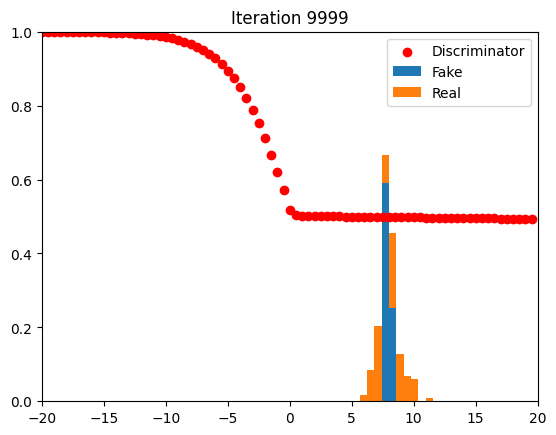

In [ ]:
# Plotting the last iteration
plt.clf()
plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
plt.xlim(-20, 20)
plt.ylim(0, 1)
plt.title('Iteration {}'.format(e))
plt.legend(['Discriminator', 'Fake', 'Real'])
plt.show()

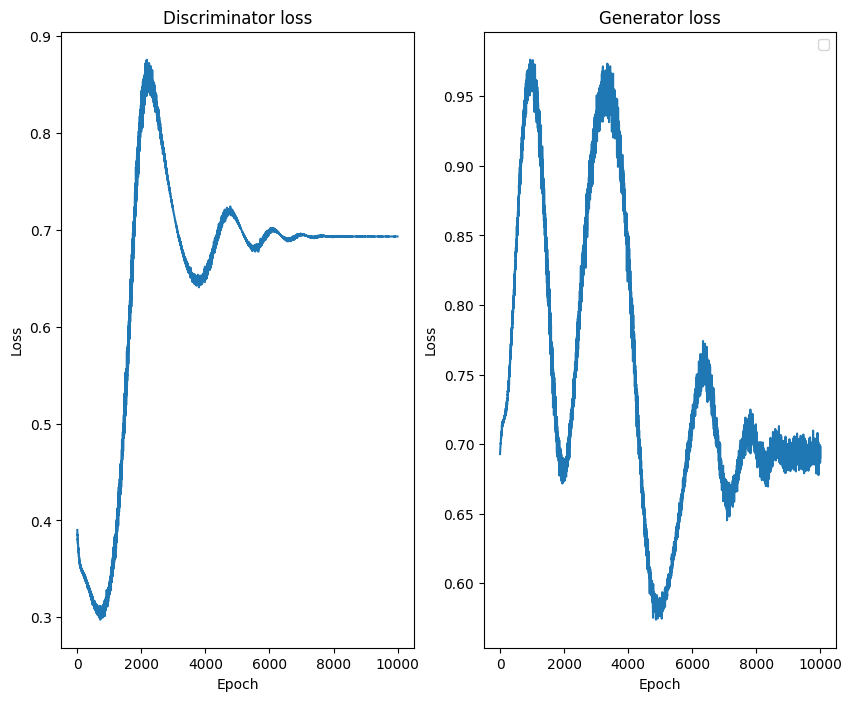

In [ ]:
# Again plot the discriminator and generator loss curves
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(d_losses_2)
plt.title('Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(g_losses_2)
plt.title('Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

###Distribution for the real samples for which the generator fails to generate samples

By using a bimodal distribution for the real samples we'll generate real samples from a distribution with two distinct modes or peaks.

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                64        
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 32)                0         
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 97 (388.00 Byte)
Trainable params: 97 (388.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 32)                64        
                                                              

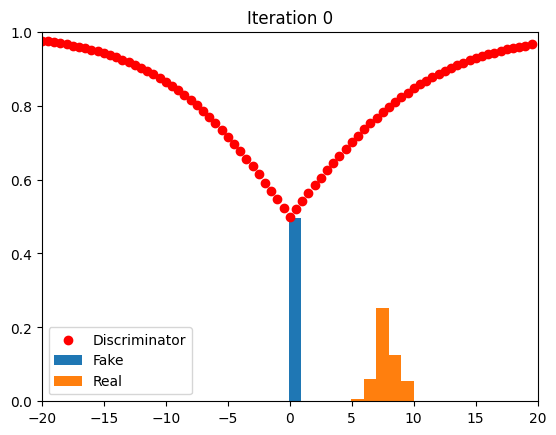

3/3 [==============================] - 0s 3ms/step


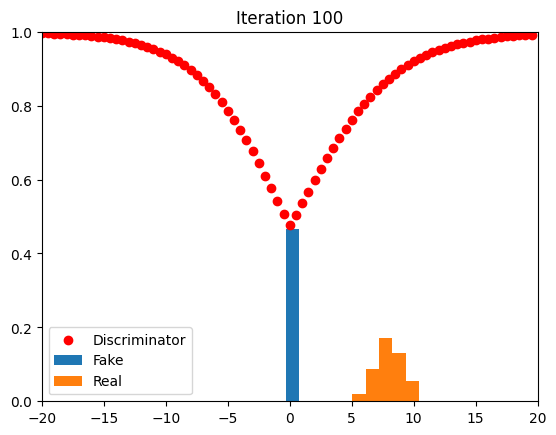

3/3 [==============================] - 0s 4ms/step


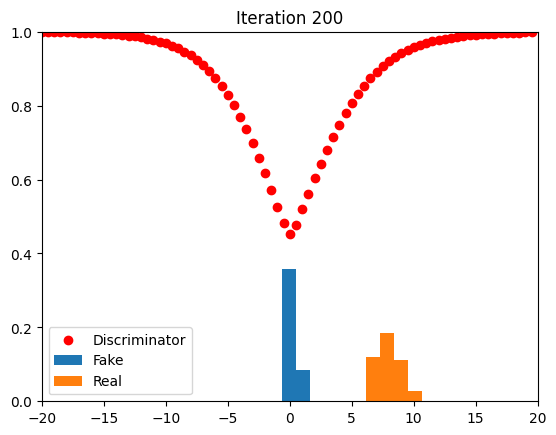

3/3 [==============================] - 0s 4ms/step


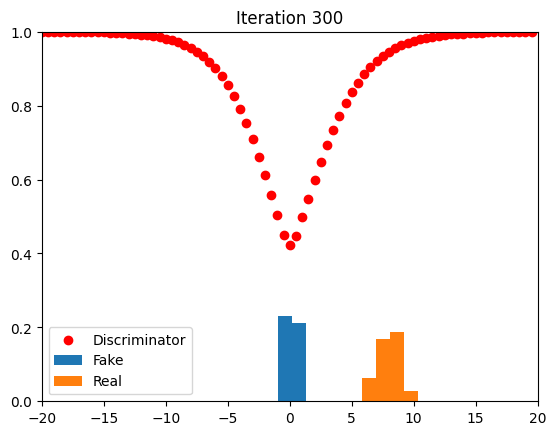

3/3 [==============================] - 0s 4ms/step


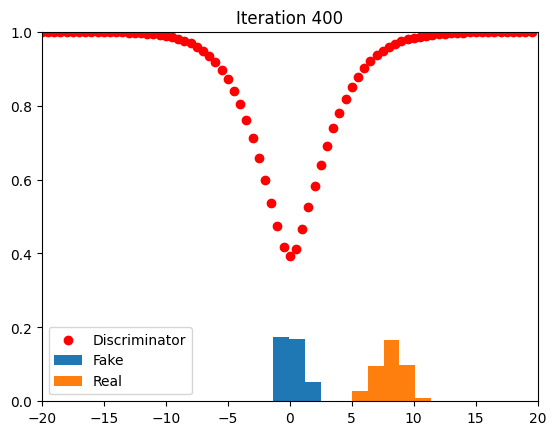

3/3 [==============================] - 0s 5ms/step


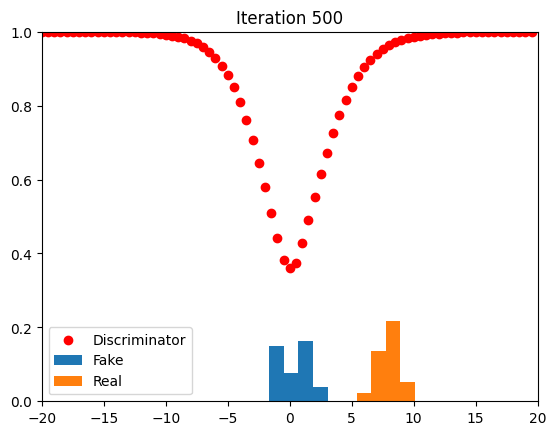

3/3 [==============================] - 0s 4ms/step


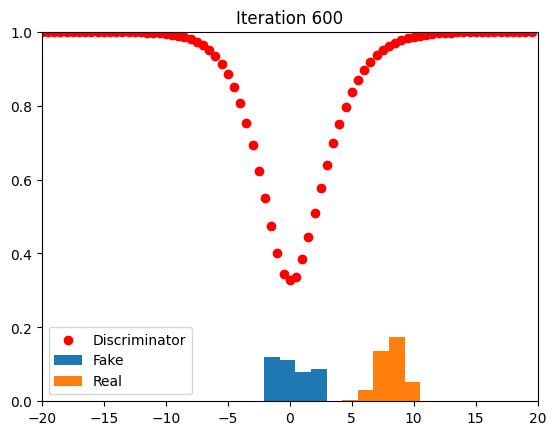

3/3 [==============================] - 0s 4ms/step


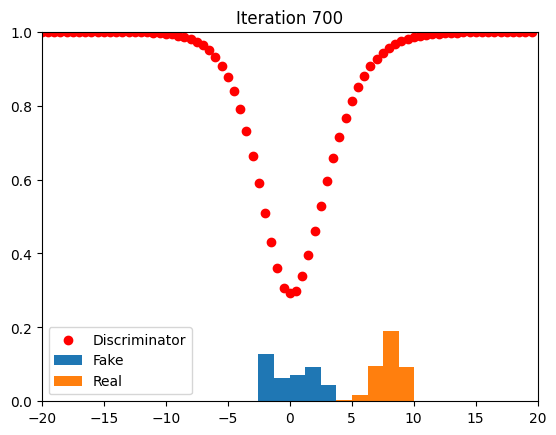

3/3 [==============================] - 0s 5ms/step


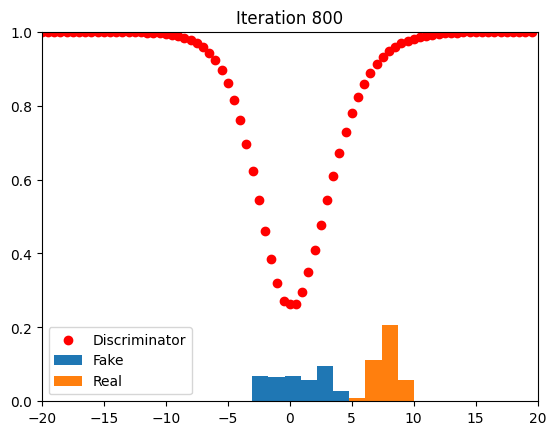

3/3 [==============================] - 0s 4ms/step


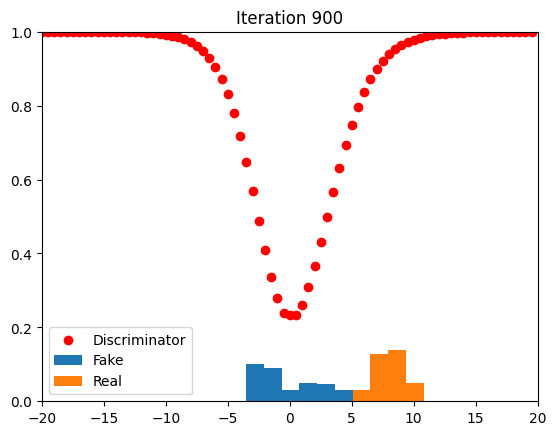

3/3 [==============================] - 0s 6ms/step


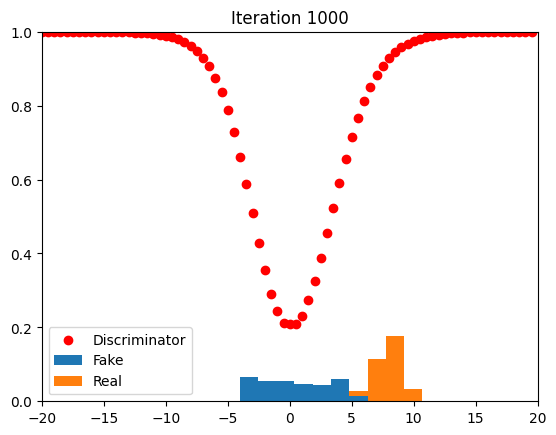

3/3 [==============================] - 0s 3ms/step


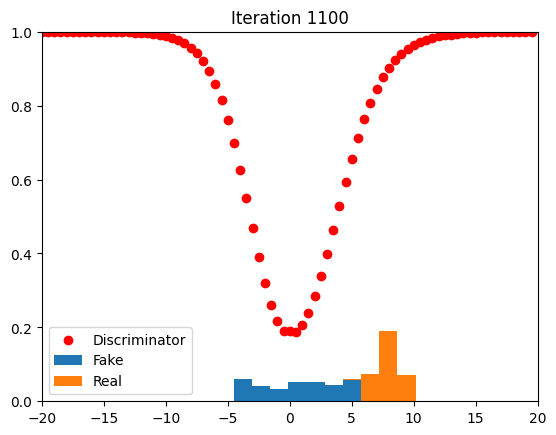

3/3 [==============================] - 0s 3ms/step


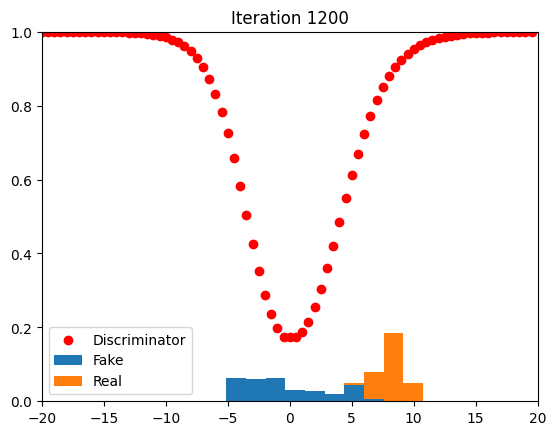

3/3 [==============================] - 0s 5ms/step


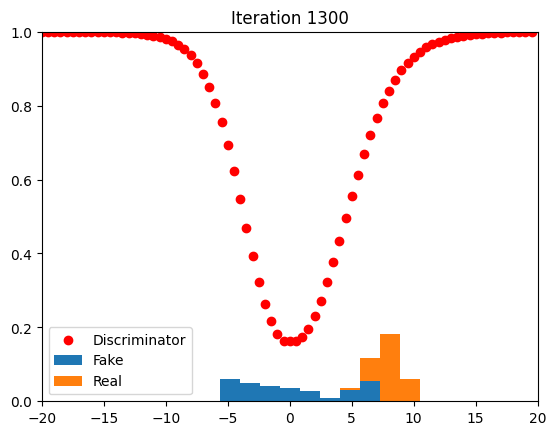

3/3 [==============================] - 0s 6ms/step


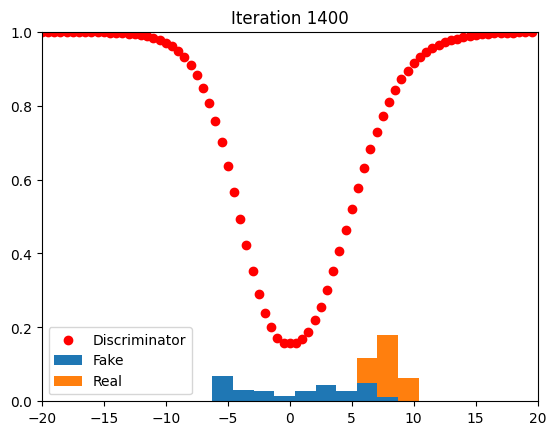

3/3 [==============================] - 0s 5ms/step


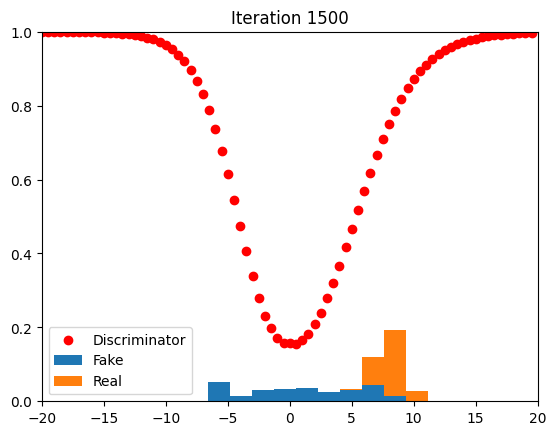

3/3 [==============================] - 0s 5ms/step


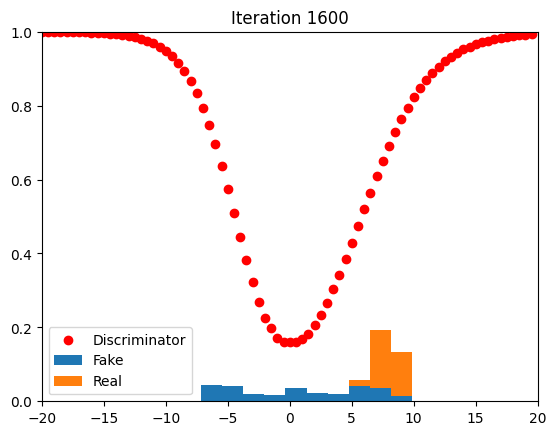

3/3 [==============================] - 0s 6ms/step


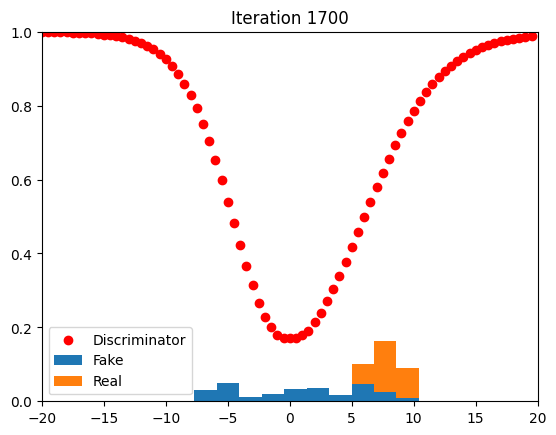

3/3 [==============================] - 0s 5ms/step


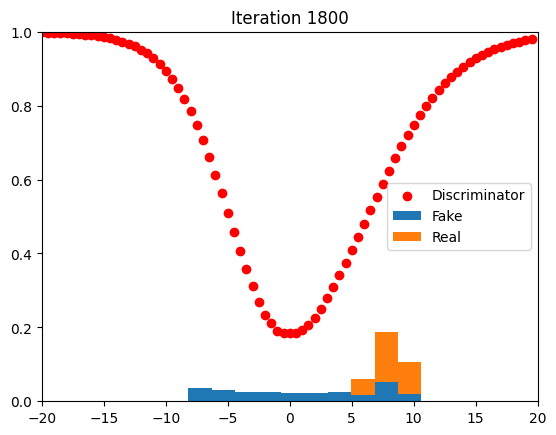

3/3 [==============================] - 0s 8ms/step


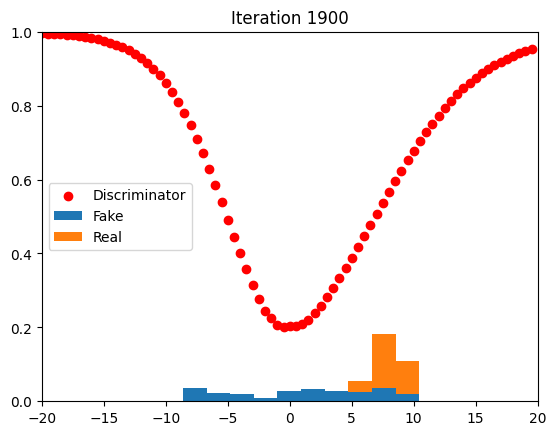

3/3 [==============================] - 0s 6ms/step


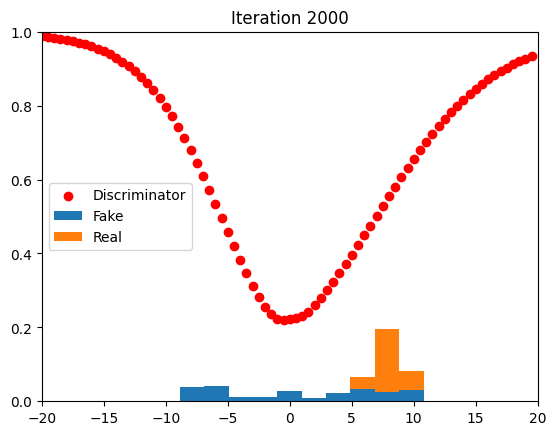

3/3 [==============================] - 0s 3ms/step


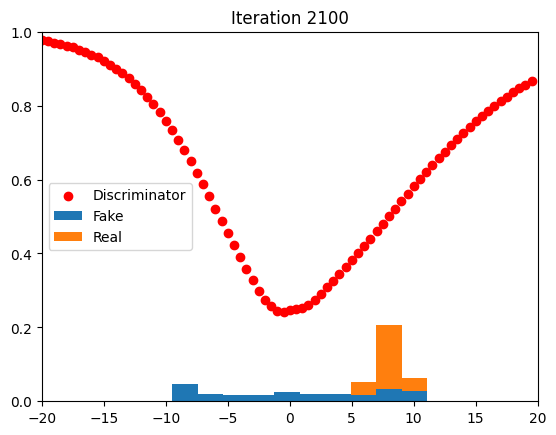

3/3 [==============================] - 0s 3ms/step


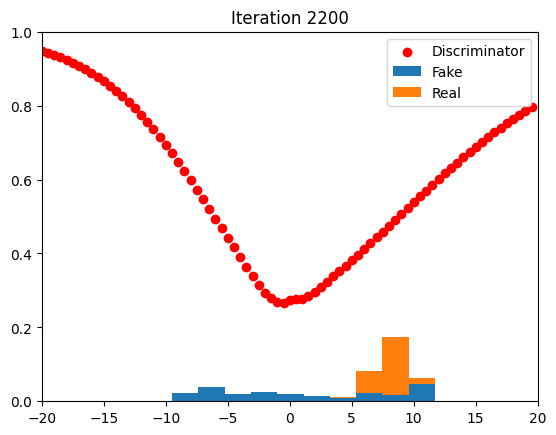

3/3 [==============================] - 0s 7ms/step


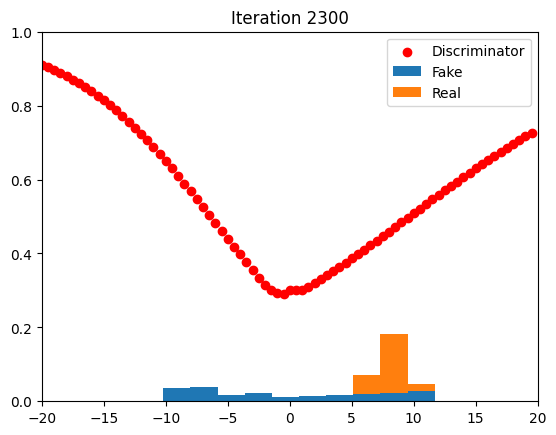

3/3 [==============================] - 0s 7ms/step


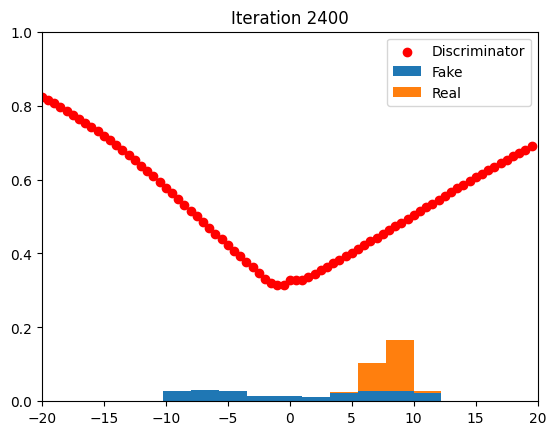

3/3 [==============================] - 0s 3ms/step


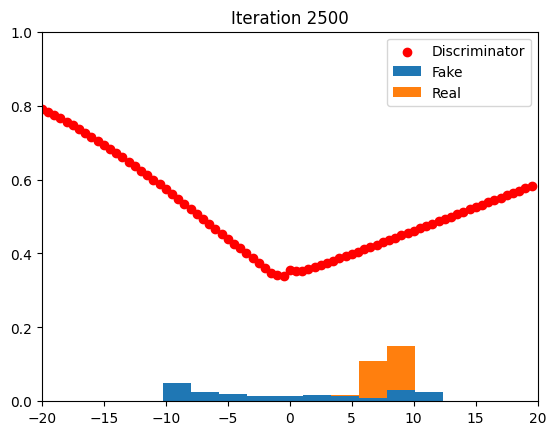

3/3 [==============================] - 0s 6ms/step


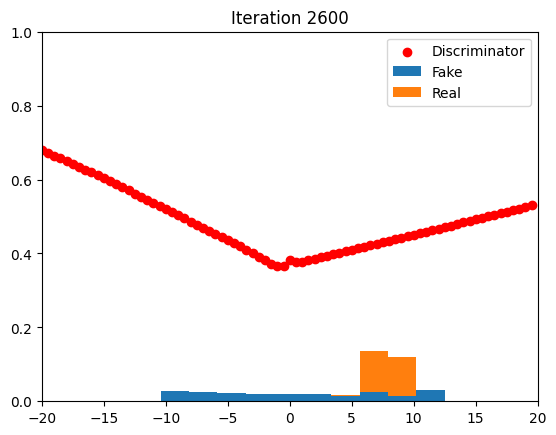

3/3 [==============================] - 0s 6ms/step


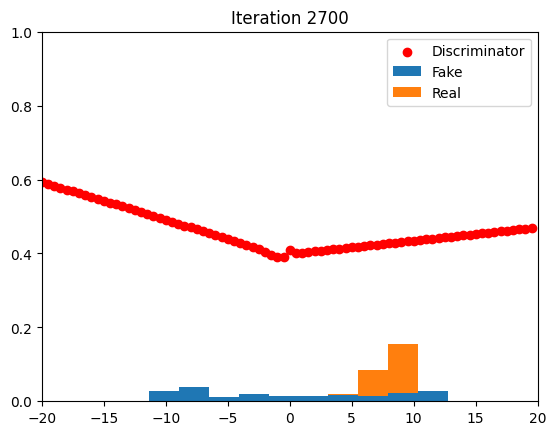

3/3 [==============================] - 0s 8ms/step


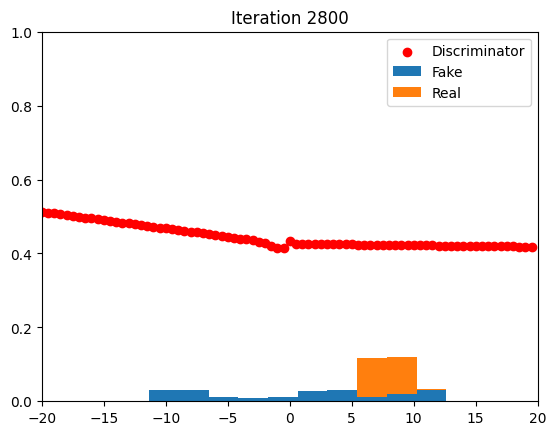

3/3 [==============================] - 0s 3ms/step


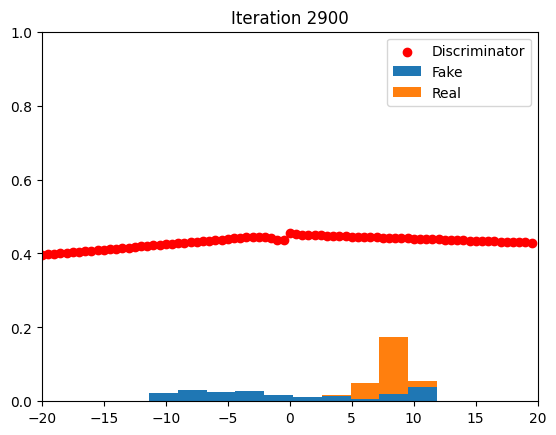

3/3 [==============================] - 0s 4ms/step


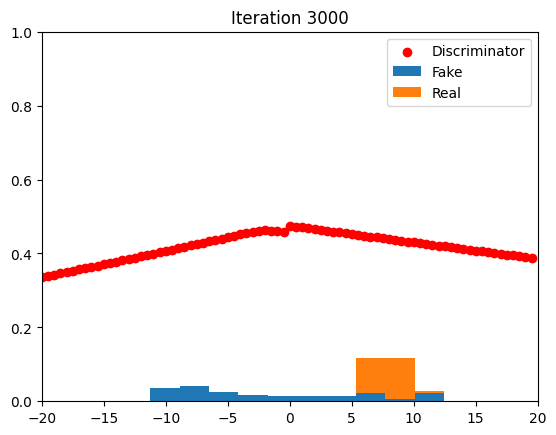

3/3 [==============================] - 0s 6ms/step


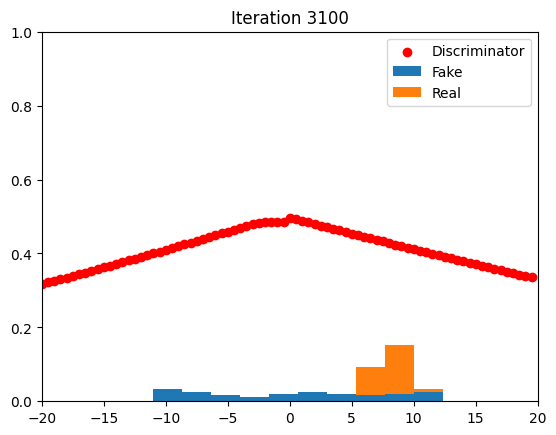

3/3 [==============================] - 0s 7ms/step


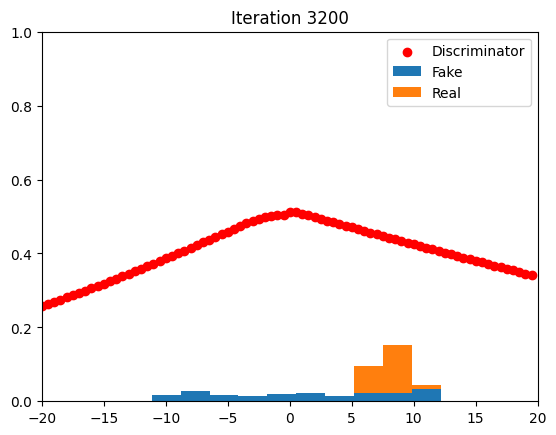

3/3 [==============================] - 0s 3ms/step


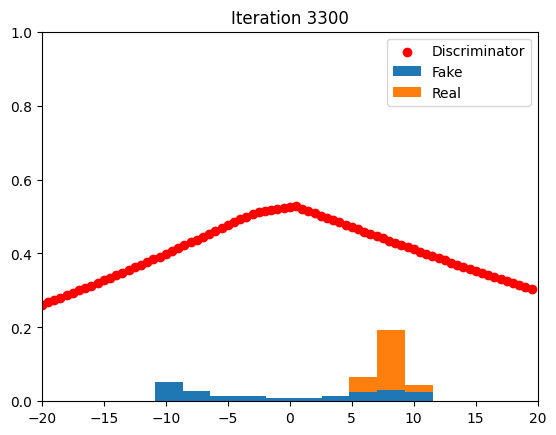

3/3 [==============================] - 0s 6ms/step


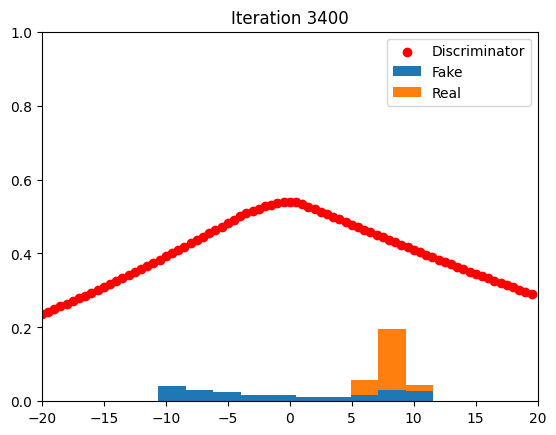

3/3 [==============================] - 0s 7ms/step


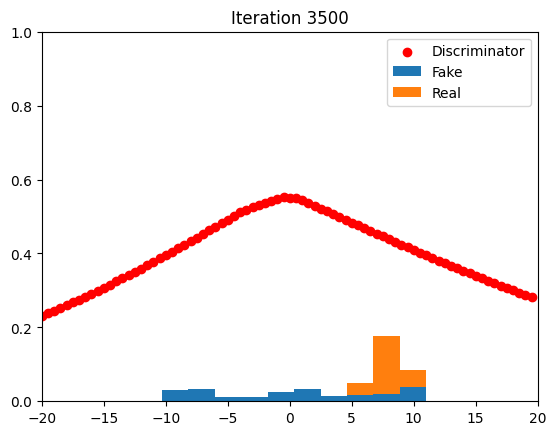

3/3 [==============================] - 0s 8ms/step


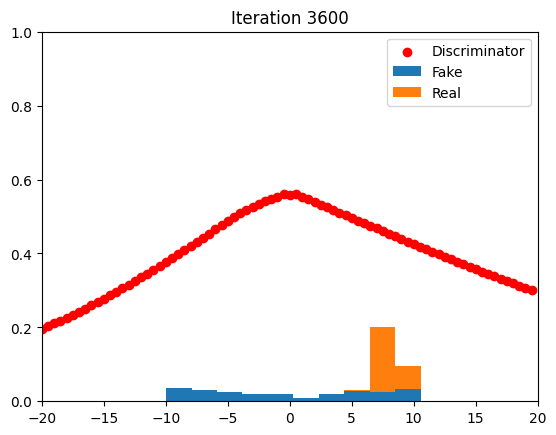

3/3 [==============================] - 0s 5ms/step


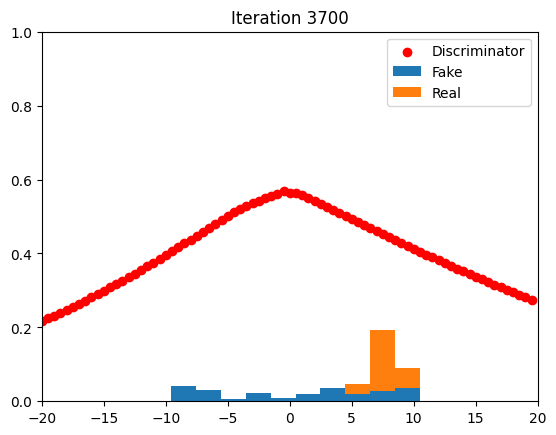

3/3 [==============================] - 0s 4ms/step


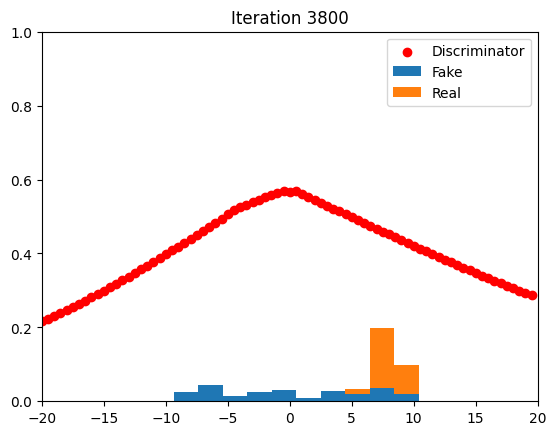

3/3 [==============================] - 0s 8ms/step


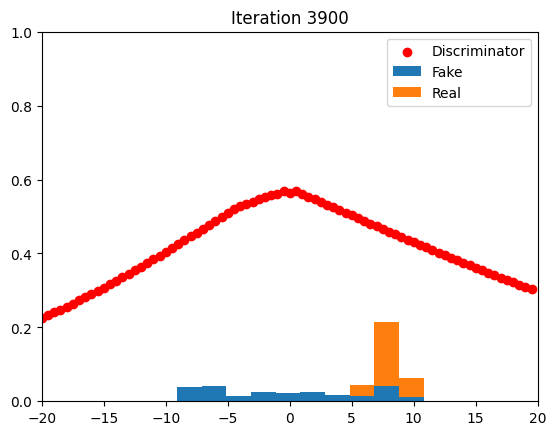

3/3 [==============================] - 0s 6ms/step


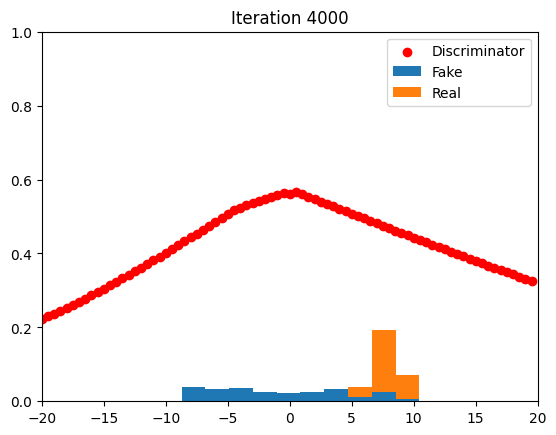

3/3 [==============================] - 0s 6ms/step


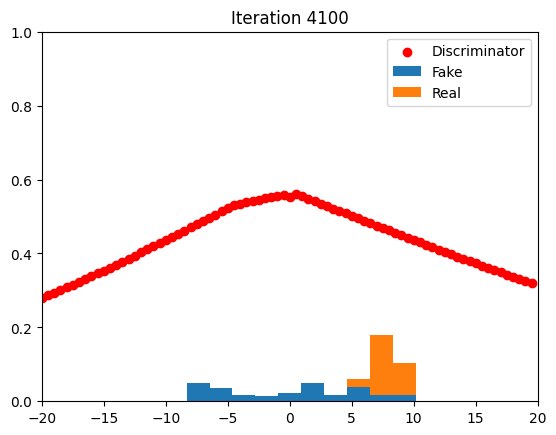

3/3 [==============================] - 0s 6ms/step


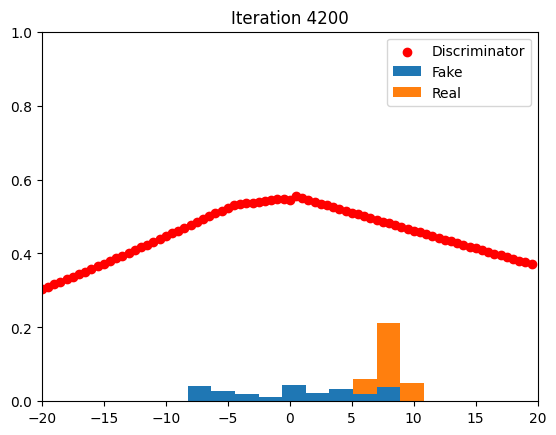

3/3 [==============================] - 0s 7ms/step


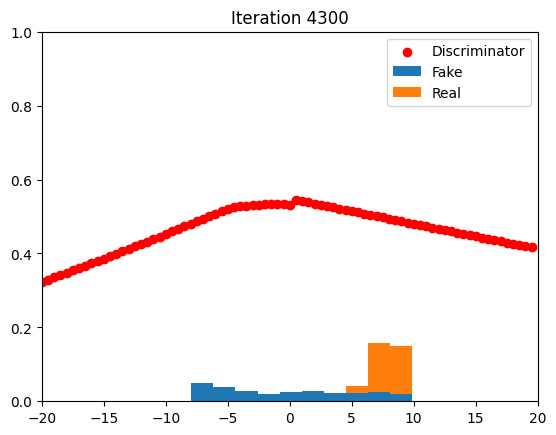

3/3 [==============================] - 0s 3ms/step


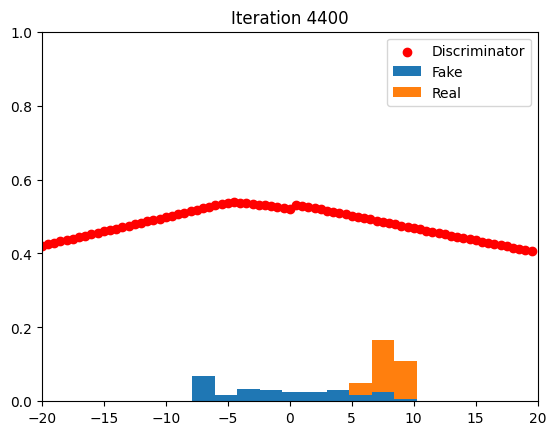

3/3 [==============================] - 0s 5ms/step


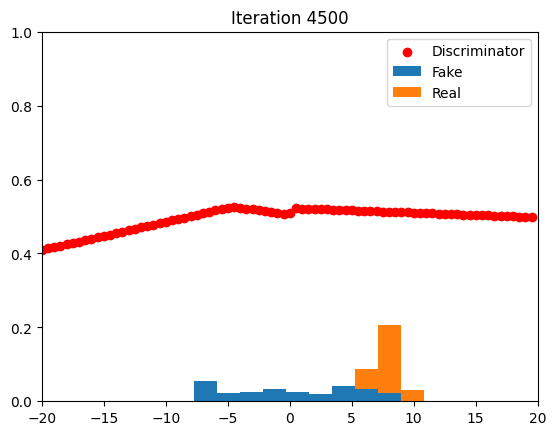

3/3 [==============================] - 0s 7ms/step


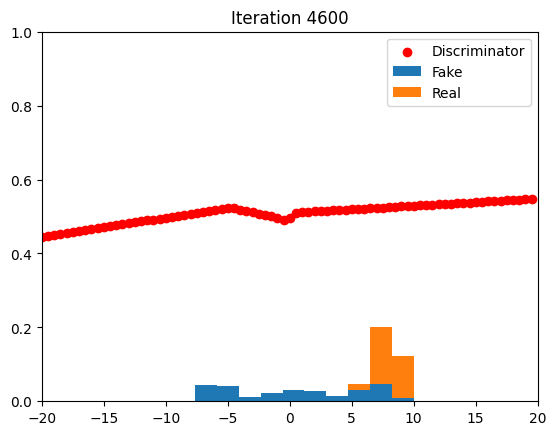

3/3 [==============================] - 0s 6ms/step


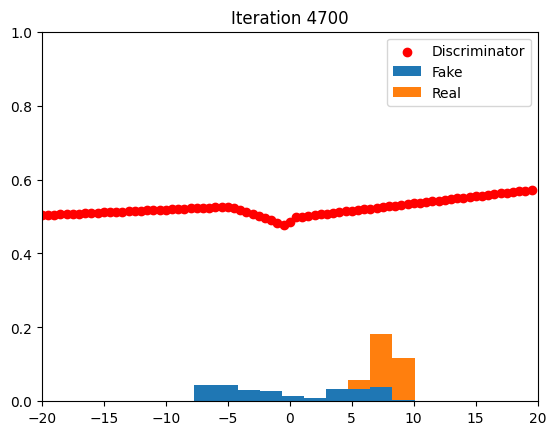

3/3 [==============================] - 0s 8ms/step


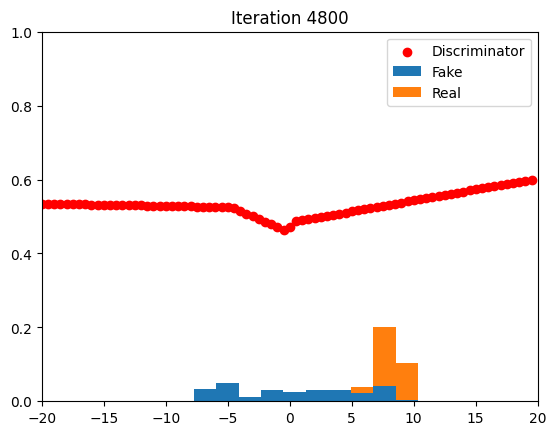

3/3 [==============================] - 0s 6ms/step


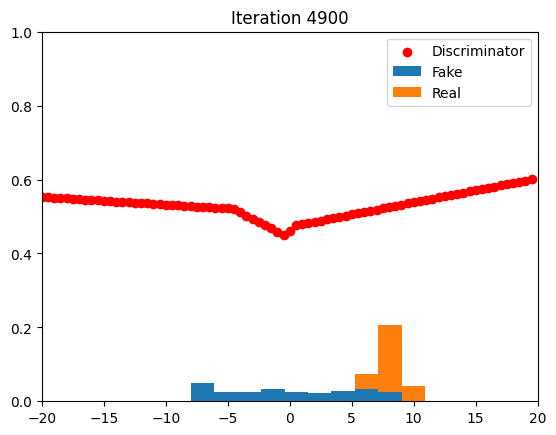

3/3 [==============================] - 0s 5ms/step


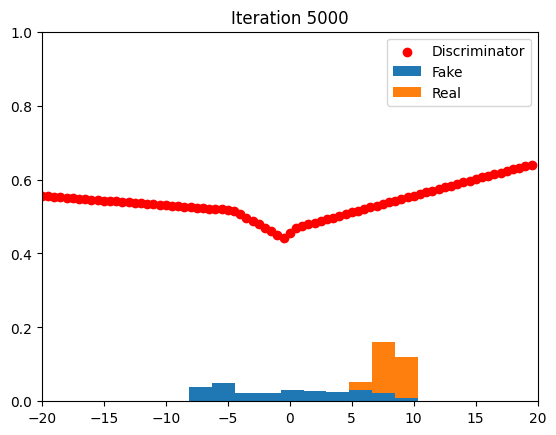

3/3 [==============================] - 0s 8ms/step


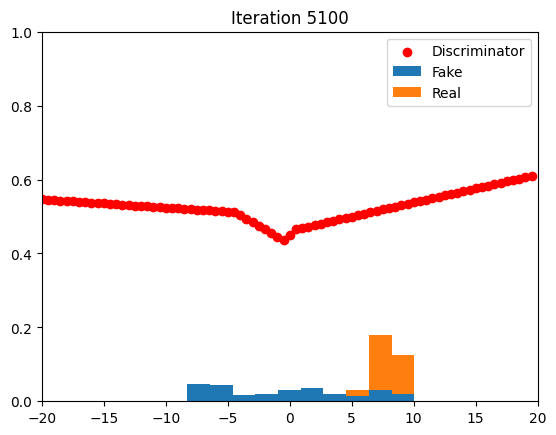

3/3 [==============================] - 0s 3ms/step


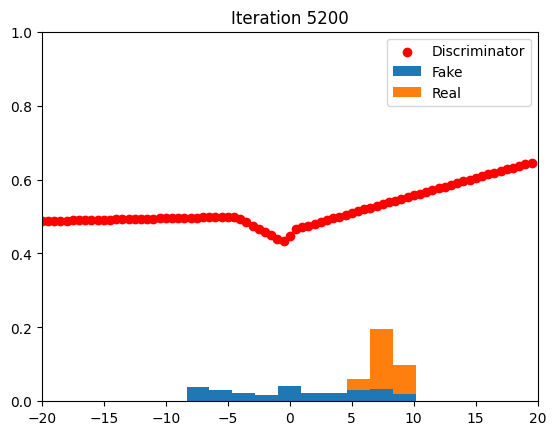

3/3 [==============================] - 0s 6ms/step


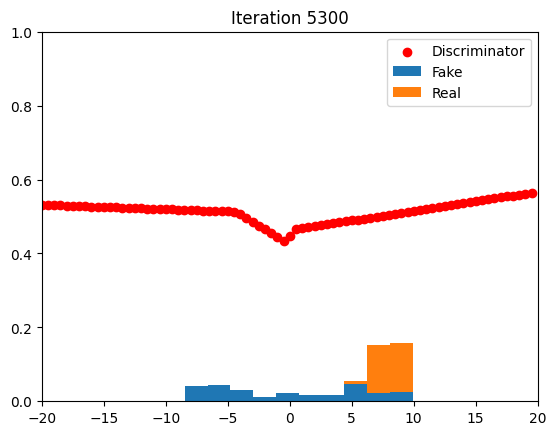

3/3 [==============================] - 0s 3ms/step


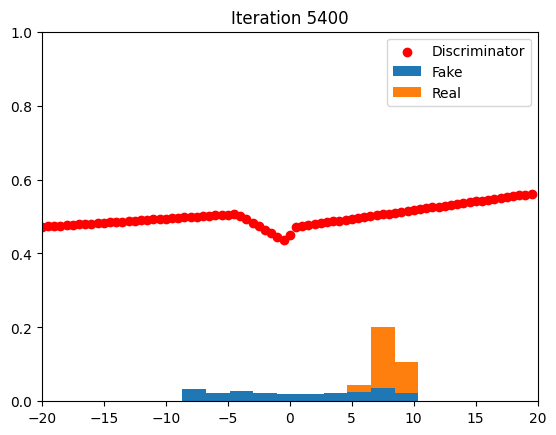

3/3 [==============================] - 0s 7ms/step


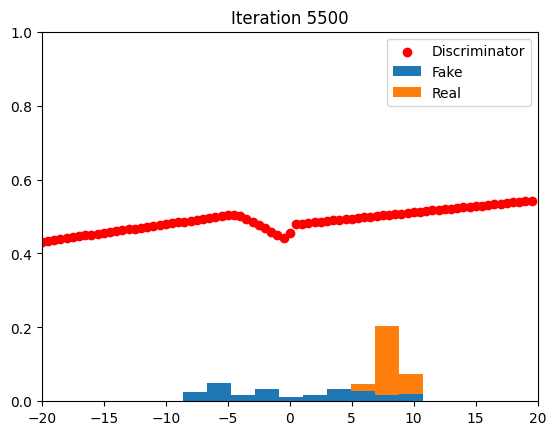

3/3 [==============================] - 0s 4ms/step


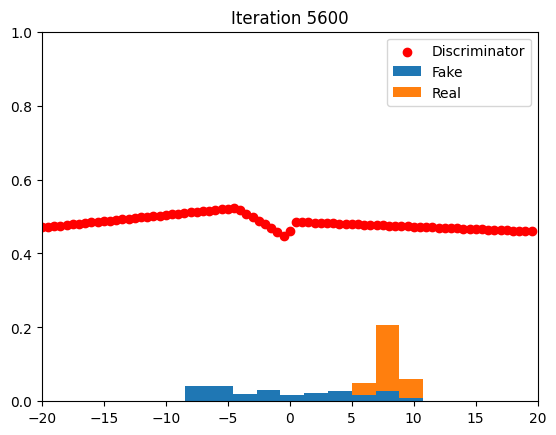

3/3 [==============================] - 0s 9ms/step


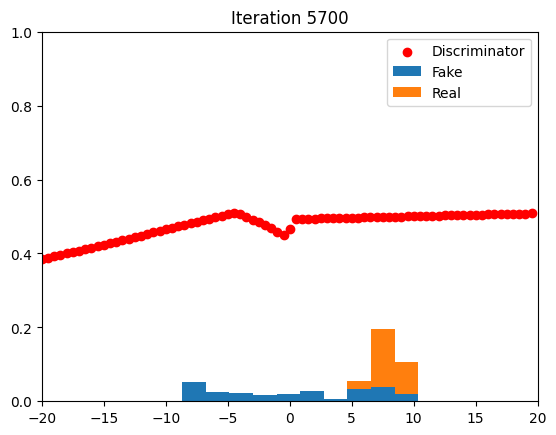

3/3 [==============================] - 0s 4ms/step


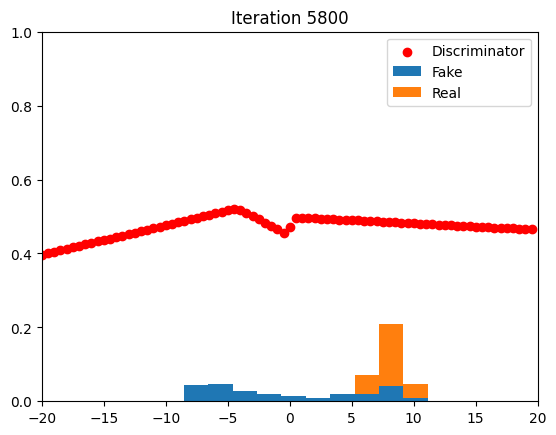

3/3 [==============================] - 0s 6ms/step


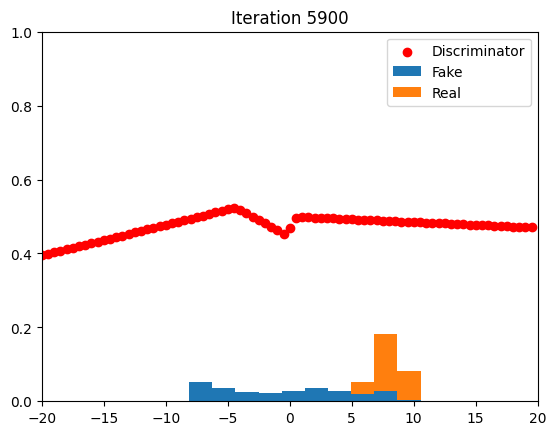

3/3 [==============================] - 0s 4ms/step


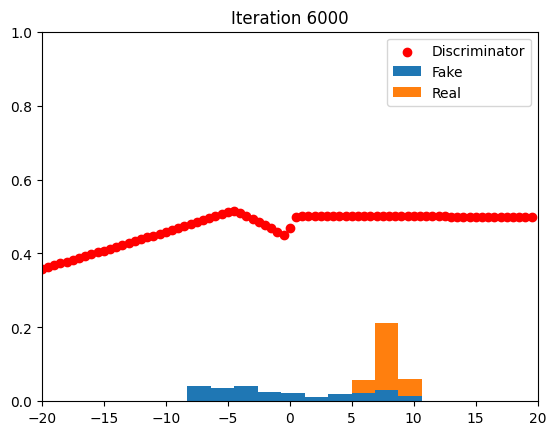

3/3 [==============================] - 0s 7ms/step


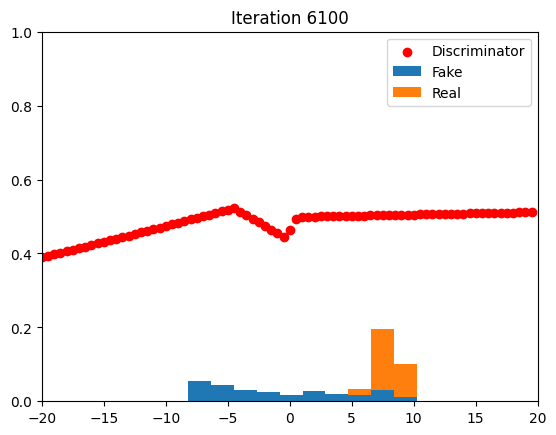

3/3 [==============================] - 0s 5ms/step


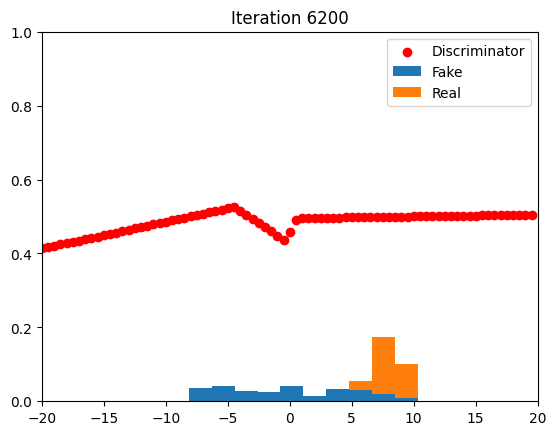

3/3 [==============================] - 0s 8ms/step


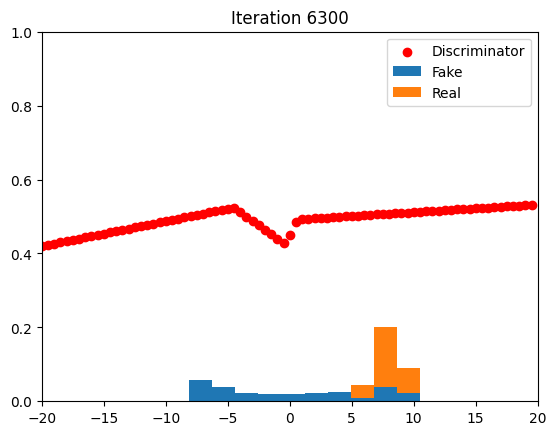

3/3 [==============================] - 0s 3ms/step


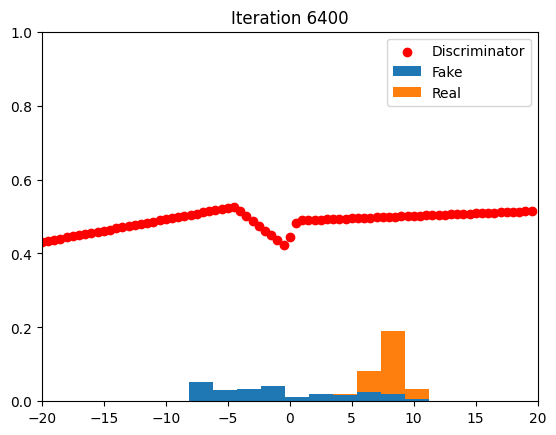

3/3 [==============================] - 0s 3ms/step


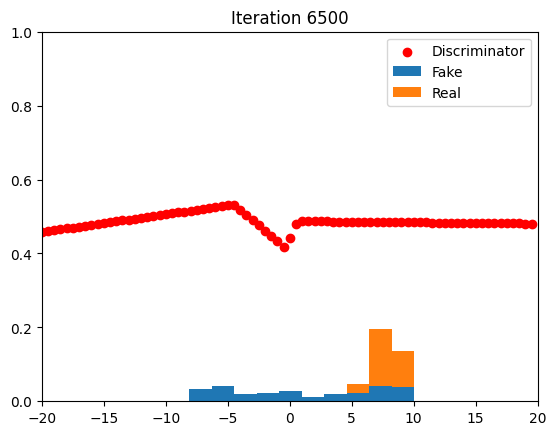

3/3 [==============================] - 0s 4ms/step


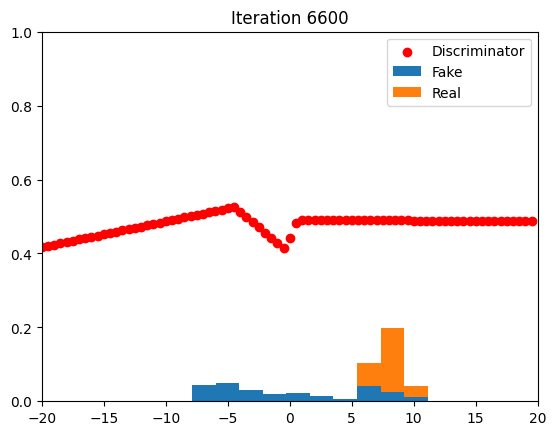

3/3 [==============================] - 0s 5ms/step


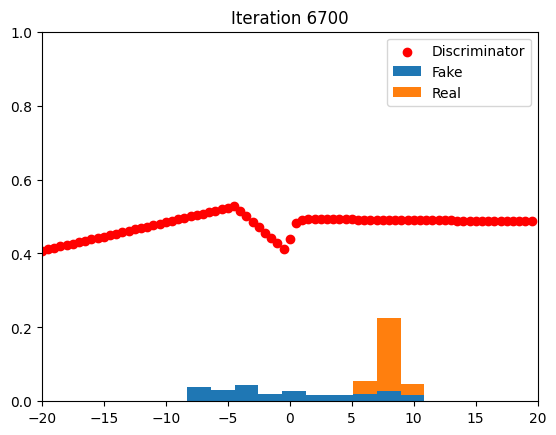

3/3 [==============================] - 0s 8ms/step


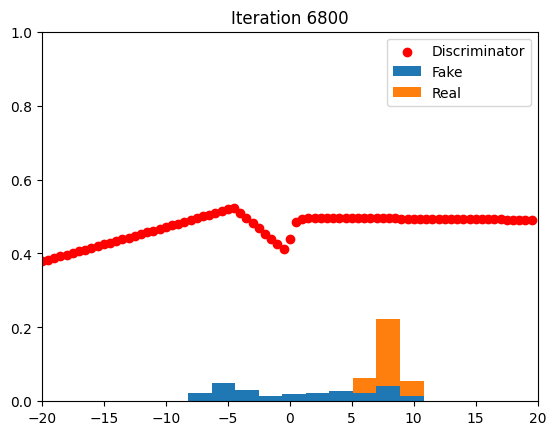

3/3 [==============================] - 0s 5ms/step


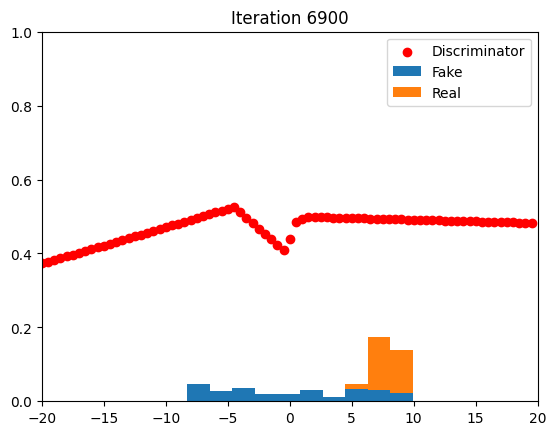

3/3 [==============================] - 0s 3ms/step


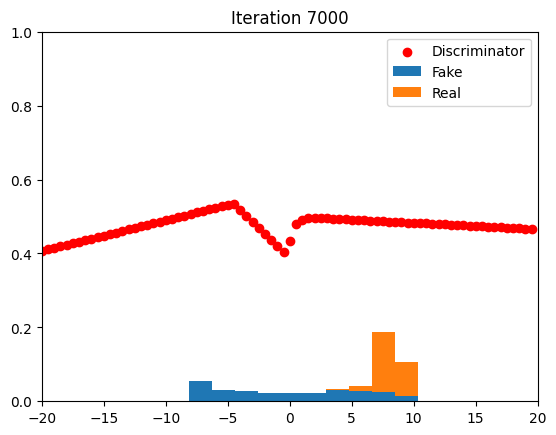

3/3 [==============================] - 0s 3ms/step


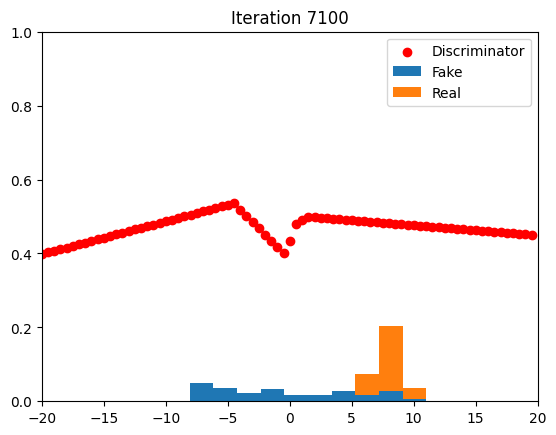

3/3 [==============================] - 0s 3ms/step


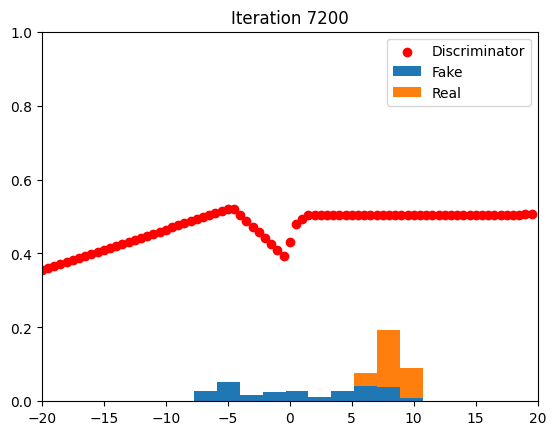

3/3 [==============================] - 0s 4ms/step


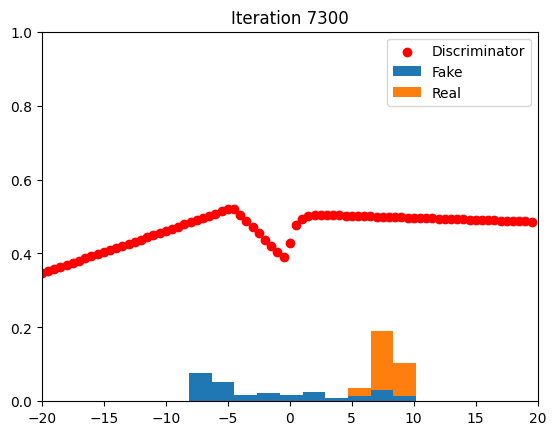

3/3 [==============================] - 0s 3ms/step


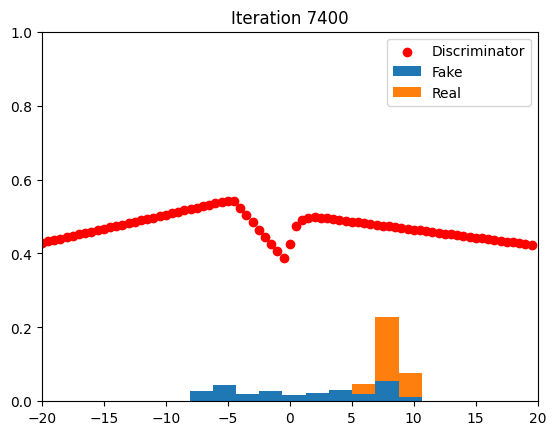

3/3 [==============================] - 0s 5ms/step


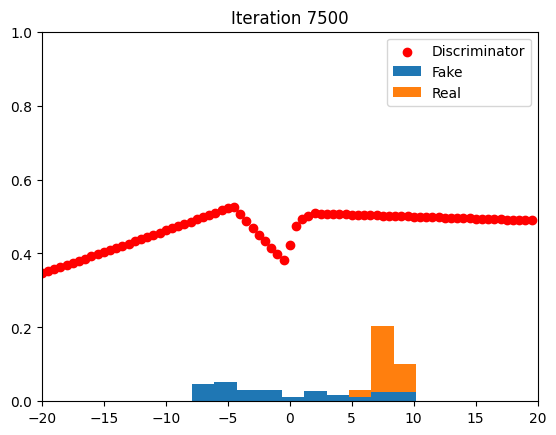

3/3 [==============================] - 0s 4ms/step


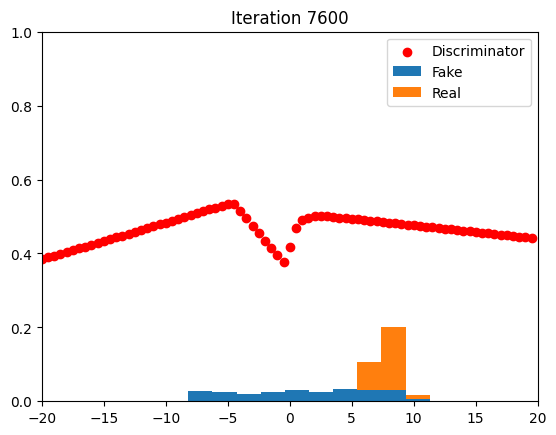

3/3 [==============================] - 0s 5ms/step


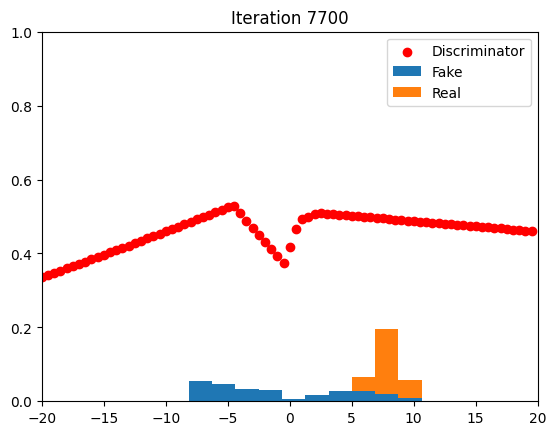

3/3 [==============================] - 0s 5ms/step


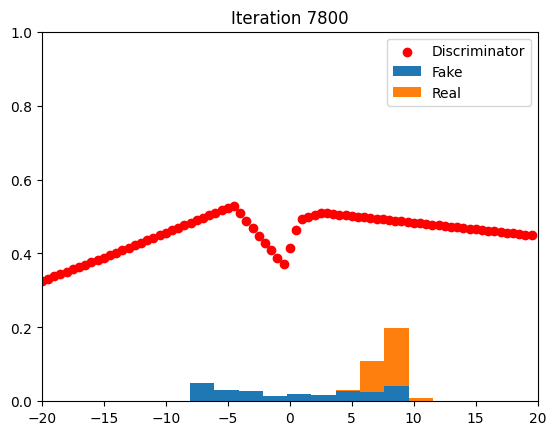

3/3 [==============================] - 0s 7ms/step


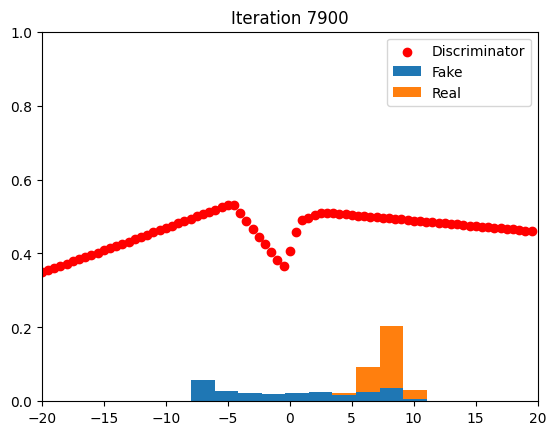

3/3 [==============================] - 0s 5ms/step


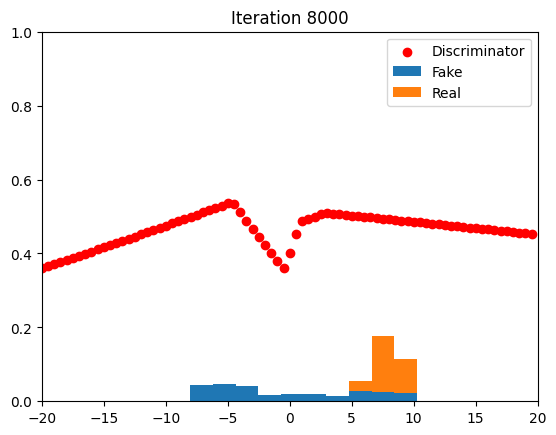

3/3 [==============================] - 0s 5ms/step


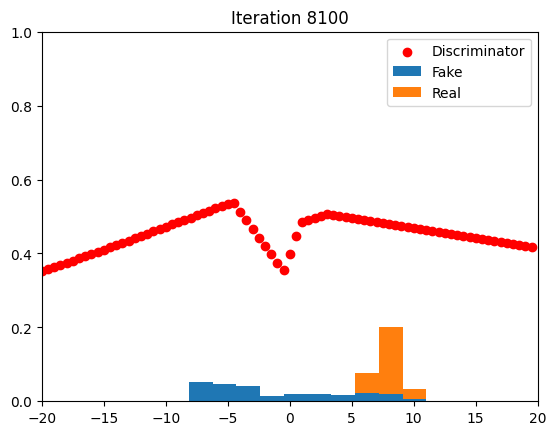

3/3 [==============================] - 0s 5ms/step


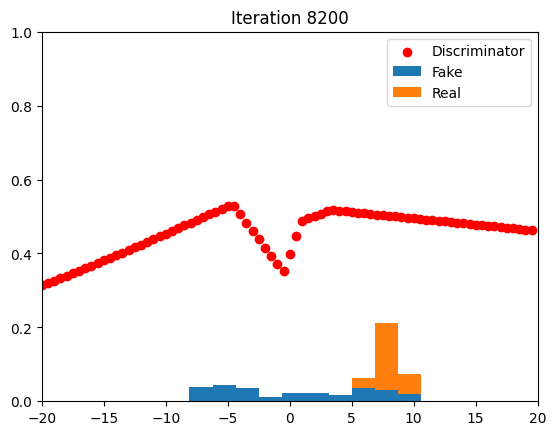

3/3 [==============================] - 0s 4ms/step


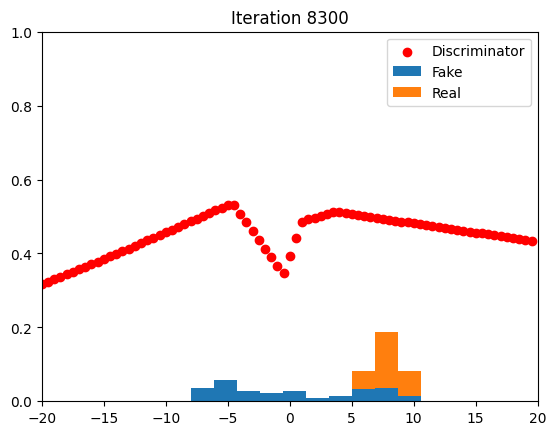

3/3 [==============================] - 0s 4ms/step


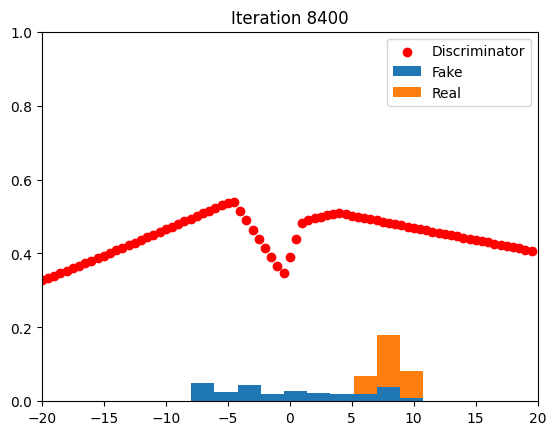

3/3 [==============================] - 0s 7ms/step


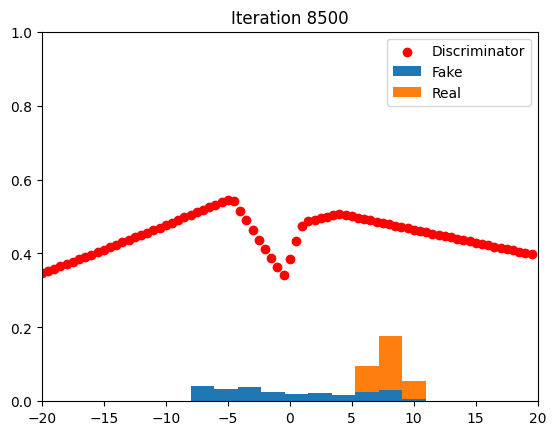

3/3 [==============================] - 0s 4ms/step


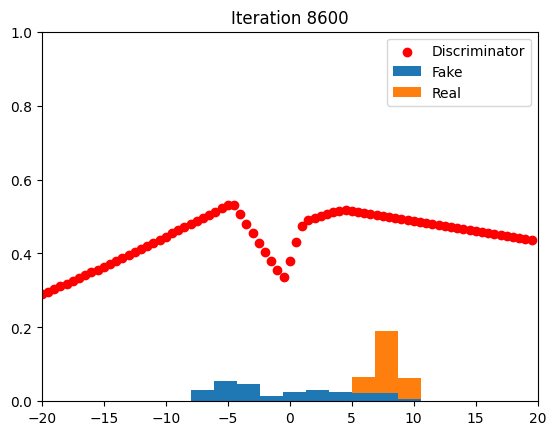

3/3 [==============================] - 0s 4ms/step


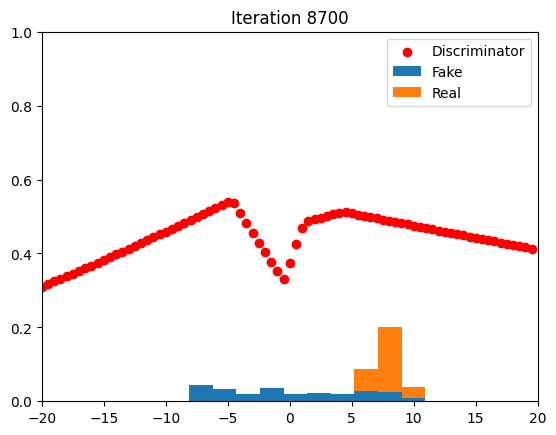

3/3 [==============================] - 0s 7ms/step


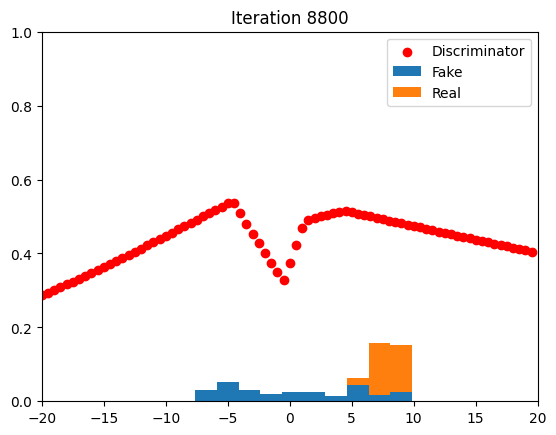

3/3 [==============================] - 0s 3ms/step


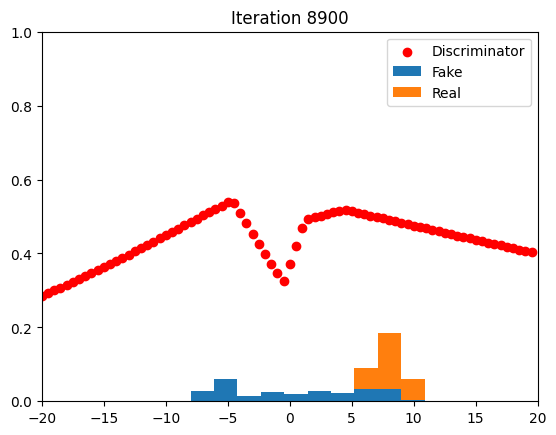

3/3 [==============================] - 0s 7ms/step


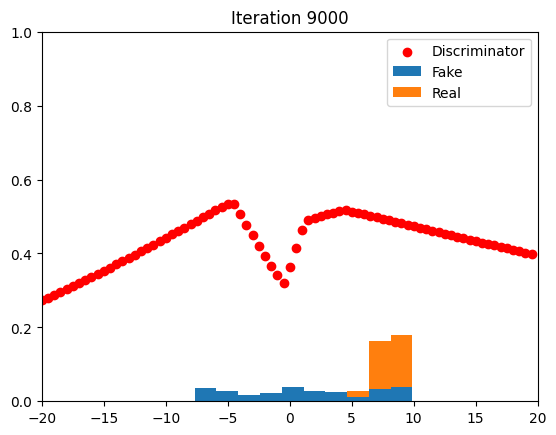

3/3 [==============================] - 0s 4ms/step


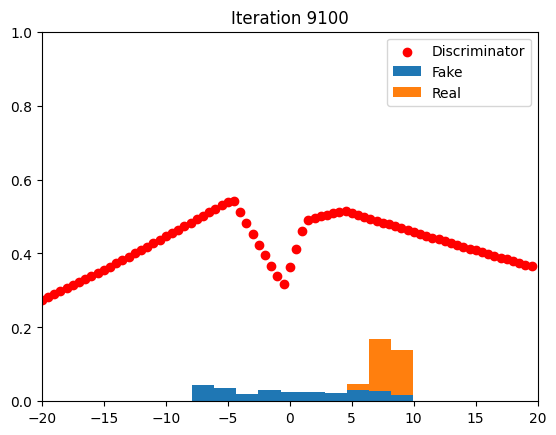

3/3 [==============================] - 0s 8ms/step


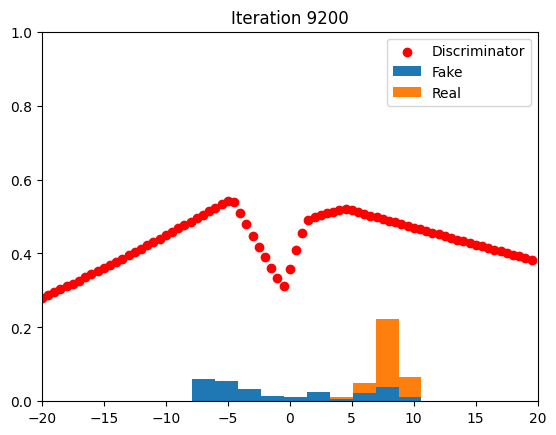

3/3 [==============================] - 0s 9ms/step


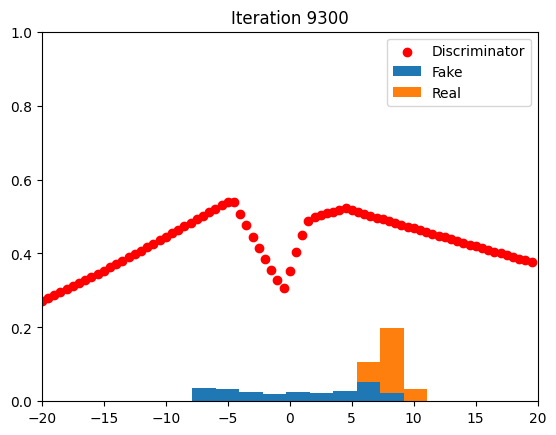

3/3 [==============================] - 0s 7ms/step


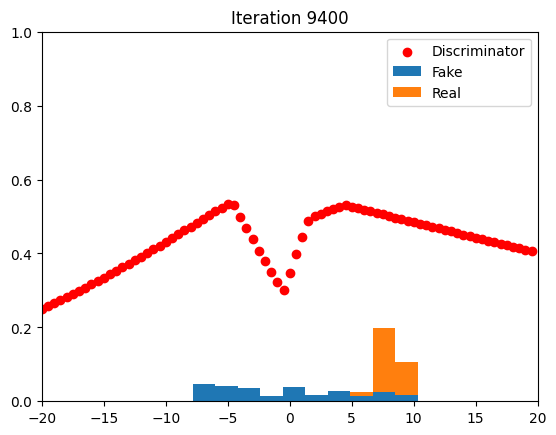

3/3 [==============================] - 0s 6ms/step


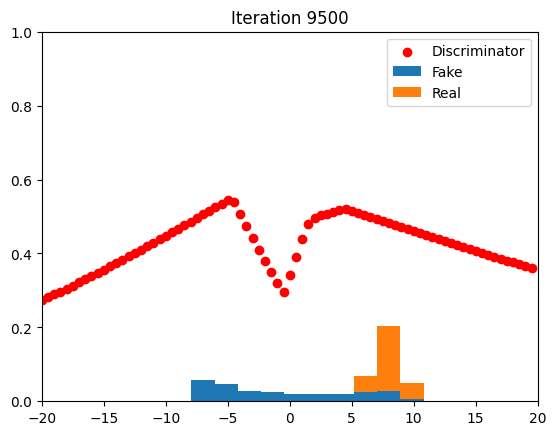

3/3 [==============================] - 0s 5ms/step


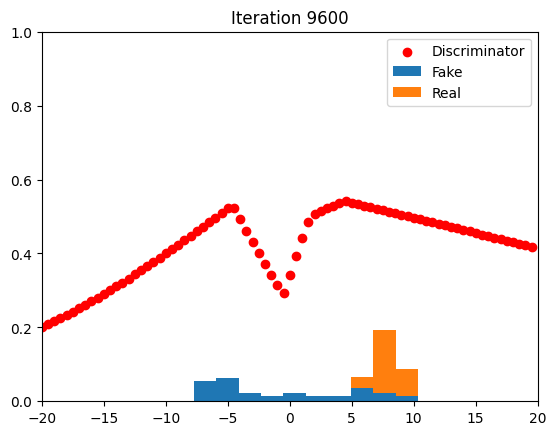

3/3 [==============================] - 0s 10ms/step


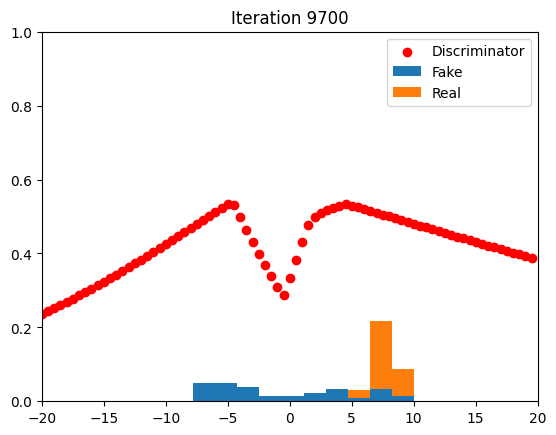

3/3 [==============================] - 0s 5ms/step


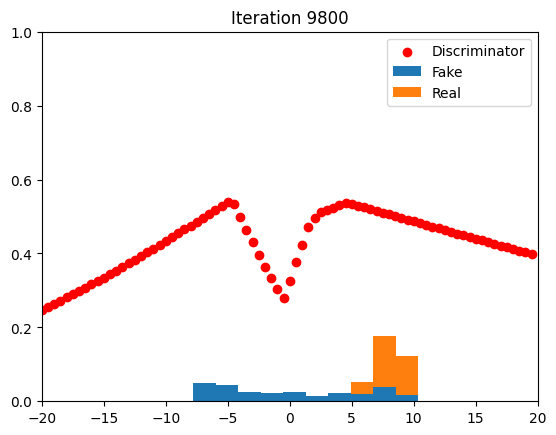

3/3 [==============================] - 0s 3ms/step


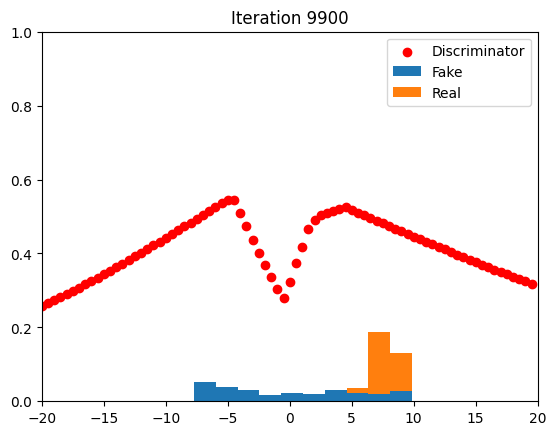

4/4 [==============================] - 0s 6ms/step


In [ ]:
# Get networks
discriminator = get_discriminator_1D()
generator = get_generator_1D()

# Configure both models for training
discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

# To configure the full model, we will set the 'trainable' parameter of the discriminator to False, as we don't want to optimize the discriminator when optimizing the generator
discriminator.trainable = False

# The input variable (noise) for the generator
z = keras.layers.Input(shape=(latent_dim,))

# What comes out of the generator
G_z = generator(z)

# What comes out of the discriminator when classifying the 'fake' samples
D_G_z = discriminator(G_z)

# The full GAN model
gan = keras.models.Model(inputs=z, outputs=D_G_z)

# The loss function for the GAN: this gets lower if the fake samples are classified as real
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))

# Training the model where it probably will fail, like a bimodal distribution
g_losses_3 = []
d_losses_3 = []

# Training loop
n_samples = 100
epochs = 10000

for e in range(epochs):
    # Get a random set of input noise (uniform distribution)
    noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])

    # Bimodal distribution for real samples
    real_mode1 = np.random.normal(-5, 1, size=[n_samples//2, latent_dim])
    real_mode2 = np.random.normal(5, 1, size=[n_samples//2, latent_dim])
    real_bi = np.concatenate([real_mode1, real_mode2])

    # Generate some fake samples using the generator
    fake = generator.predict(noise)

    # Concatenate the fake and bimodal real images
    X = np.concatenate([real_bi, fake])

    # Labels for generated and real data
    Y_dis = np.zeros(2 * n_samples)

    # Set labels for real samples to 1
    Y_dis[:n_samples] = 1

    # Train discriminator with this batch of samples
    discriminator.trainable = True
    d_loss = discriminator.train_on_batch(X, Y_dis)
    d_losses_3.append(d_loss)

    # Train generator with a new batch of generated samples
    # Freeze the discriminator part
    discriminator.trainable = False
    noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])
    # From the generator's perspective, the discriminator should predict
    # ones for all samples
    Y_gen = np.ones(n_samples)
    g_loss = gan.train_on_batch(noise, Y_gen)
    g_losses_3.append(g_loss)

    if e % 100 == 0:
        noise = np.random.uniform(-1, 1, size=[n_samples, latent_dim])
        fake = generator.predict(noise)
        real = np.random.normal(real_mean, 1, size=[n_samples, latent_dim])
        pred = discriminator.predict(np.arange(-20, 20, 0.5).reshape((80, 1)))

        # Plotting
        plt.clf()
        plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
        plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
        plt.xlim(-20, 20)
        plt.ylim(0, 1)
        plt.title('Iteration {}'.format(e))
        plt.legend(['Discriminator', 'Fake', 'Real'])
        plt.show()
        time.sleep(0.5)


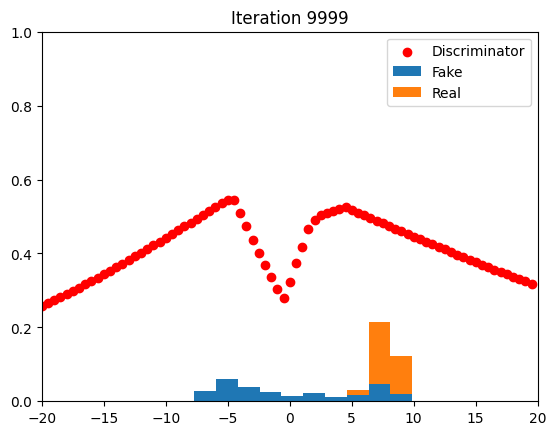

In [ ]:
# Plotting the last iteration
plt.clf()
plt.hist((np.squeeze(fake), np.squeeze(real)), density=True, stacked=True)
plt.scatter(np.arange(-20, 20, 0.5), pred, c='r')
plt.xlim(-20, 20)
plt.ylim(0, 1)
plt.title('Iteration {}'.format(e))
plt.legend(['Discriminator', 'Fake', 'Real'])
plt.show()

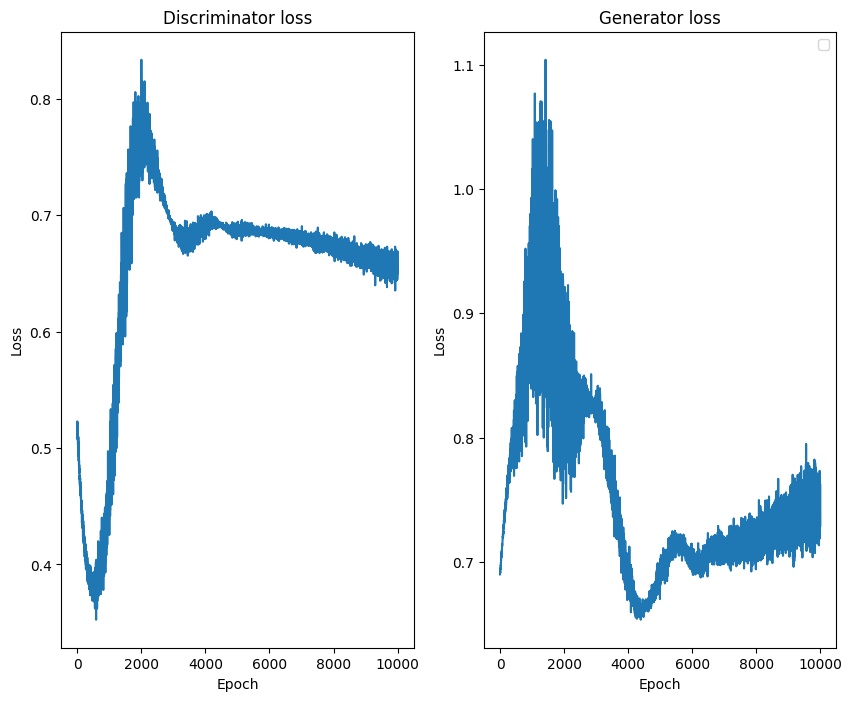

In [ ]:
# Plotting (again) the loss curves of the generator and discriminator
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(d_losses_3)
plt.title('Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(g_losses_3)
plt.title('Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

During training, we have stored the loss values for the discriminator and the generator. We can now plot these. Remember that for the digit classification task, we were looking for a set of parameters leading to a low loss function.

**Question** The loss curves that you get look different. Can you explain why they're not nicely dropping to zero? Can you explain the loss in the discriminator based on the objective function of the discriminator?

The curves will not converge to zero because there is a equilibrium in minimizing and maximizing the discriminator and generator.

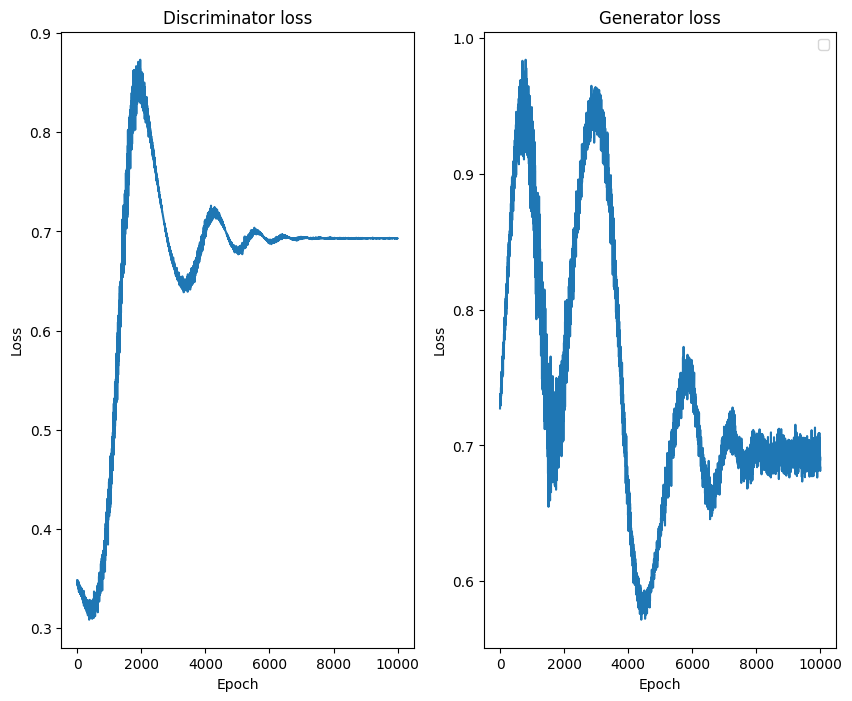

In [ ]:
# Plotting the loss curves from the first run
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(d_losses_1)
plt.title('Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(g_losses_1)
plt.title('Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

Although it is definitely nice that we can train two networks together to learn the distribution of a real data distribution, generating samples from a normal distribution is in itself not really interesting. Luckily, we can use the same principles to generate images.

# MNIST synthesis
Like last week, we are again going to use MNIST data. Data preparation is the same as before.

In [ ]:
from keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

# load the MNIST the dataset
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# scale the image intensities to the 0-1 range
x_train = (x_train / 255.0).astype(np.float32)
x_test = (x_test / 255.0).astype(np.float32)

# convert the data to channel-last
train_set_images = np.expand_dims(x_train, axis=-1)
test_set_images = np.expand_dims(x_test, axis=-1)

# convert the labels to one-hot encoded
train_set_labels = to_categorical(y_train, num_classes=10)
test_set_labels = to_categorical(y_test, num_classes=10)

11490434/11490434 [==============================] - 0s 0us/step


Plot some images.

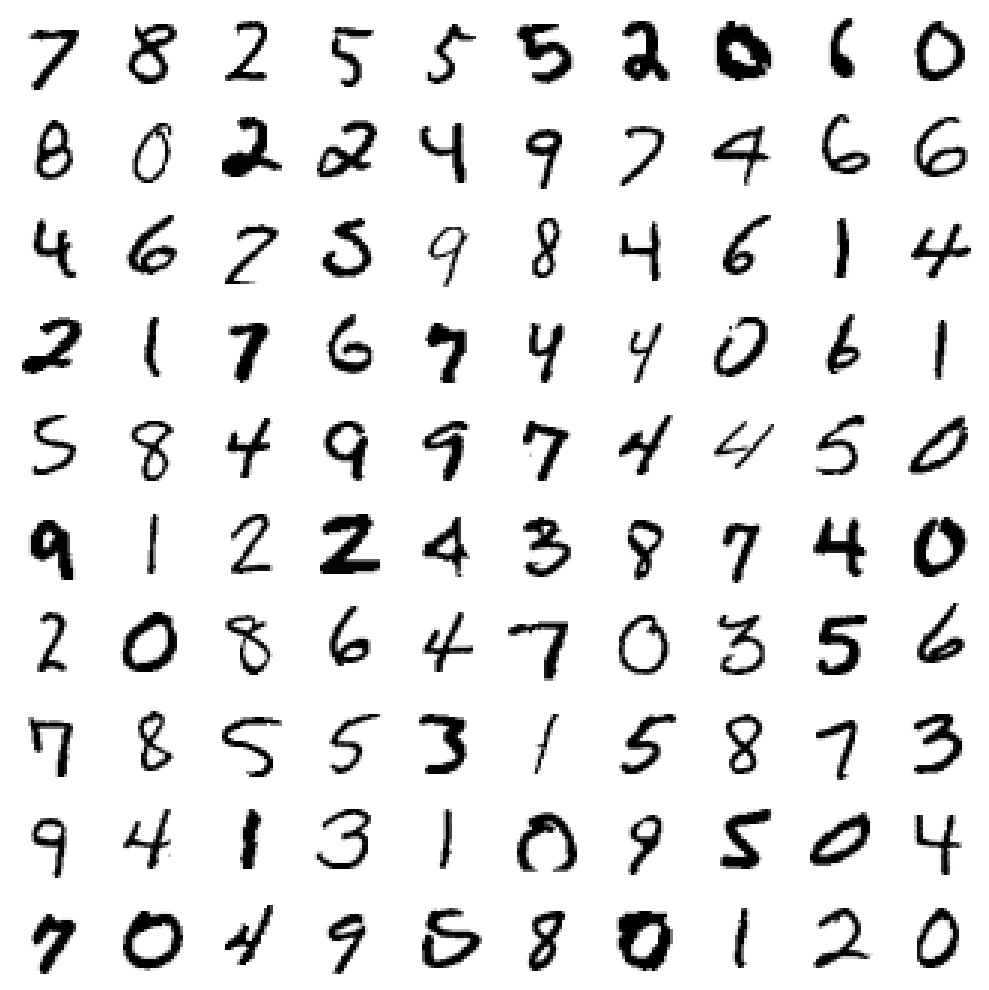

In [ ]:
def plotImages(images, dim=(10, 10), figsize=(10, 10), title=''):
    plt.figure(figsize=figsize)
    for i in range(images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.suptitle(title)
    plt.show()

plotImages(train_set_images[np.random.randint(0, train_set_images.shape[0], size=100)].reshape(100, 28, 28))

In last week's exercise you have built a discriminative model that was able to classify an image into one of ten digit categories. In this exercise, we are going to do the inverse. Given a point in a latent space (which in our case will be a multi-dimensional Gaussian distribution), we are going to train the network to generate a realistic digit image for this point. The MNIST data set will be used as a set of real samples.

<img src="https://skymind.ai/images/wiki/GANs.png">



## The discriminator
As you can see in the image above, we will need a generator and a discriminator network. Let's define these. Consider the network that you used
for digit classification in the previous exercise and see if you can spot some differences between that network and the network below.

**Question** Is this a convolutional neural network? Why (not)?

This code does not define a convolutional neural network. It defines a feedforward neural network, also known as a multi-layer perceptron (MLP).

In CNN, the architecture is specifically designed for processing grid-like data, such as images. CNNs use a series of convolutional layers that scan across the input data, learning patterns and features at different levels of abstraction. These convolutional layers are followed by pooling layers to reduce spatial dimensions and increase computational efficiency. The final layers are typically fully connected layers for making predictions.

On the other hand, a feedforward network like this on has a straightforward structure where information flows in one direction: from the input layer, through one or more hidden layers and finally to the output layer. Each neuron in a layer is connected to every neuron in the previous and subsequent layers.


In [ ]:
def get_discriminator_MLP():
  discriminator = keras.models.Sequential()
  discriminator.add(Dense(1024, input_dim=784, kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Dense(512))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Dense(256))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dense(1, activation='sigmoid'))
  return discriminator

You could argue that digits are a bit more complex than samples from a Gaussian distribution, so let's set the latent space dimensionality for noise sampling a bit higher than 1.

In [ ]:
latent_dim = 10


## The generator

The generator is different than the discriminator. It should go from a low-dimensional noise vector to an MNIST image.

In [ ]:
def get_generator_MLP():
  generator = keras.models.Sequential()
  generator.add(Dense(256, input_dim=latent_dim, kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  generator.add(LeakyReLU(0.2))
  generator.add(Dense(512))
  generator.add(LeakyReLU(0.2))
  generator.add(Dense(1024))
  generator.add(LeakyReLU(0.2))
  generator.add(Dense(784, activation='tanh'))
  return generator

**Question** Consider the activation functions of the output layers of the generator and discriminator networks. How are they different?

For the discriminator, the output layer uses the sigmoid activation function which squashes the output values to be in the range of 0 to 1. The sigmoid function provides a probability-like output, where values closer to 1 indicate a high probability of being real and values closer to 0 indicate a high probability of being generated.

For the generator, the output layer uses the hyperbolic tangent activation function which squashes the output values to be in the range of -1 to 1. This is usually used to generate pixel values, especially for images and it helps the generator produce values that are centered around 0.

Therefore, the main difference between the two activation functions is that the generator uses the tangent to produce values in a specific range suitable for the type of data it's generating while the discriminator uses the sigmoid to produce a probability indicating the likelihood that the input is real.

**Question** Also look at the activation functions of the other layers, can you find out what they do? Look at the Keras documentation.

Both for the generator and for the discriminator the first layer (Dense with 256 units/1024 units) consists of a 'LeakyReLU(0.2) activation function which allows a small, non-zero gradient for negative inputs. The slope parameter 0.2 indicates that the negative part of the function has a slope of 0.2 which means it doesn't fully deactivate neurons that have negative inputs.

The second layer (Desne with 512 units) has the same activation function for both the generator and discriminator which is once again 'LeakyReLU(0.2)'.

The third layer (Dense with 256 units - discriminator / dense with 1024 units - generator) also has the LeakyReLU with a slope of 0.2 applied.

As for the final layer, as mentioned previously, the generator has an output layer (Dense with 784 units) with the tangent activation function. While the discriminator has an output layer (Dense with 1 unit) with the sigmoid activation function.

These activation functions introduce non-linearity into the network, allowing it to learn complex relationships between features in the data. The use of the LeakyReLU activation function in intermediate layers helps mitigate the vanishing gradient problem that can occur with traditional ReLU activations.

## The model
Now  let's combine the generator and the discriminator. We train both using a binary crossentropy objective. This is very similar to what we did before.

In [ ]:
discriminator = get_discriminator_MLP()
generator = get_generator_MLP()

discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))

discriminator.trainable = False
z = keras.layers.Input(shape=(latent_dim,))
G_z = generator(z)
D_G_z = discriminator(G_z)
gan = keras.models.Model(inputs=z, outputs=D_G_z)
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))

Some helper functions.

In [ ]:
def saveModels(epoch):
    generator.save('gan_generator_epoch_{}.h5'.format(epoch))
    discriminator.save('gan_discriminator_epoch_{}.h5'.format(epoch))

def plotGeneratedImages(epoch, examples=100, dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, latent_dim])
    generatedImages = generator.predict(noise)
    generatedImages = generatedImages.reshape(examples, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generatedImages.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generatedImages[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.suptitle('Epoch {}'.format(epoch))
    plt.show()

Run the code below to train the GAN model. Synthesized images should be shown periodically.

In [ ]:
d_losses = []
g_losses = []

epochs = 50
batch_size = 128

X_train = (train_set_images.reshape(60000, 784).astype(np.float32) - 0.5)/0.5

batch_count = int(X_train.shape[0] / batch_size)
for e in range(epochs):
  for _ in range(batch_count):

    # Get a random set of input noise and images
    noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
    image_batch = X_train[np.random.randint(0, X_train.shape[0], size=batch_size)]

    # Generate some fake MNIST images using the generator
    generated_images = generator.predict(noise)

    # Concatenate the fake and real images
    X = np.concatenate([image_batch, generated_images])

    # Labels for generated and real data
    y_dis = np.zeros(2*batch_size)
    # One-sided label smoothing
    y_dis[:batch_size] = 0.9

    # Train discriminator with this batch of samples
    discriminator.trainable = True
    d_loss = discriminator.train_on_batch(X, y_dis)

    # Train generator with a new batch of generated samples
    noise = np.random.normal(0, 1, size=[batch_size, latent_dim])

    # From the generator's perspective, the discriminator should predict
    # ones for all samples
    y_gen = np.ones(batch_size)

    # Freeze the discriminator part
    discriminator.trainable = False

    # Train the GAN to predict ones
    g_loss = gan.train_on_batch(noise, y_gen)

  # Store loss of most recent batch from this epoch
  d_losses.append(d_loss)
  g_losses.append(g_loss)

  if e % 5 == 0:
    noise = np.random.normal(0, 1, size=[100, latent_dim])
    plotGeneratedImages(e)
    display.display(plt.gcf())
    display.clear_output(wait=True)
    time.sleep(0.001)
    saveModels(e)



4/4 [==============================] - 0s 5ms/step


<Figure size 640x480 with 0 Axes>

**Question** Inspect the loss curves for this model and explain what happens.

The one-sided label smoothing technique in the discriminator's loss function can lead to more stable training by preventing the discriminator from becoming overly confident.

The loss curves can provide insights into how well the GAN is training. Ideally, the discriminator loss should increase over time. Indicating that it's getting worse at distinguishing between real and fake samples. The generator loss should decrease, showing that it's becoming more effective at generating convincing images.

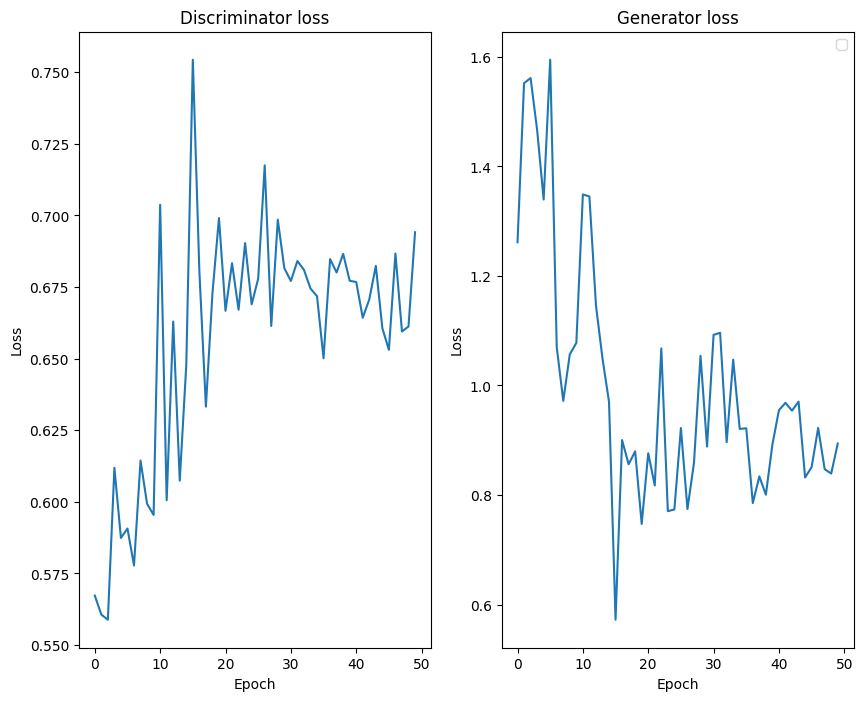

In [ ]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(d_losses)
plt.title('Discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(g_losses)
plt.title('Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## A convolutional model
Thus far the discriminator and generator were both multilayer perceptrons. Now we're going to add in some convolutional layers to turn them into a deep convolutional GAN (<a href="http://arxiv.org/abs/1511.06434">DCGAN</a>)-like architecture. This means that we have to redefine the generator network and a discriminator network.

The discriminator network is (almost) the same network that we used in last week's exercise.

In [ ]:
from tensorflow.keras.layers import Conv2D, UpSampling2D

def get_discriminator_CNN():
  discriminator = keras.models.Sequential()
  discriminator.add(Conv2D(64, kernel_size=(5, 5), strides=(2, 2), padding='same', input_shape=(1, 28, 28), kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Conv2D(128, kernel_size=(5, 5), strides=(2, 2), padding='same'))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Flatten())
  discriminator.add(Dense(1, activation='sigmoid'))
  return discriminator

def get_generator_CNN():
  generator = keras.models.Sequential()
  generator.add(Dense(128*7*7, input_dim=latent_dim, kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  generator.add(LeakyReLU(0.2))
  generator.add(Reshape((128, 7, 7)))
  generator.add(UpSampling2D(size=(2, 2)))
  generator.add(Conv2D(64, kernel_size=(5, 5), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(UpSampling2D(size=(2, 2)))
  generator.add(Conv2D(1, kernel_size=(5, 5), padding='same', activation='tanh'))
  return generator

Let's build our model like before.

In [ ]:
discriminator = get_discriminator_CNN()
generator = get_generator_CNN()

discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))

discriminator.trainable = False
z = keras.layers.Input(shape=(latent_dim,))
x = generator(z)
D_G_z = discriminator(x)
gan = keras.models.Model(inputs=z, outputs=D_G_z)
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))

Train the model using the code below. Inspect the samples that come out.

**Question** What are some differences between these samples and the ones generated by the multilayer perceptron GAN? Can you explain these differences?

Regarding the samples generated, the CNN-based GAN is likely to generate higher quality images as CNNs are better suited for tasks involving images due to their ability to capture local patterns and spatial relationships.

Moreover, CNN-based GAN samples may have more fine-grained details and higher realism compared to MLP-based samples. This is because CNNs can capture complex visual features.

Also, CNN-base GANs are capable of capturing spatial relationships in the data which means that the generated images are likely to have more coherent structures and arrangements of features.

Overall, the CNN-based GAN is expected to perform better in generating realistic and high-quality images, especially for tasks involving image data.

In [ ]:
d_losses = []
g_losses = []

epochs = 50
batch_size = 128

X_train = (train_set_images.reshape(60000, 1, 28, 28).astype(np.float32) - 0.5)/0.5

batch_count = int(X_train.shape[0] / batch_size)
for e in range(epochs):
  for _ in range(batch_count):
    # Get a random set of input noise and images
    noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
    image_batch = X_train[np.random.randint(0, X_train.shape[0], size=batch_size)]

    # Generate some fake MNIST images using the generator
    generated_images = generator.predict(noise)

    # Concatenate the fake and real images
    X = np.concatenate([image_batch, generated_images])

    # Labels for generated and real data
    y_dis = np.zeros(2*batch_size)
    # Set reference to 1 for real samples
    y_dis[:batch_size] = 1

    # Train discriminator with this batch of samples
    discriminator.trainable = True
    d_loss = discriminator.train_on_batch(X, y_dis)

    # Train generator with a new batch of generated samples
    noise = np.random.normal(0, 1, size=[batch_size, latent_dim])

    # From the generator's perspective, the discriminator should predict
    # ones for all samples
    y_gen = np.ones(batch_size)

    # Freeze the discriminator part
    discriminator.trainable = False

    # Train the GAN to predict ones
    g_loss = gan.train_on_batch(noise, y_gen)

    # Store loss of most recent batch from this epoch
  d_losses.append(d_loss)
  g_losses.append(g_loss)

  if e % 5 == 0:
    noise = np.random.normal(0, 1, size=[100, latent_dim])
    generatedImages = generator.predict(noise)
    generatedImages = generatedImages.reshape(100, 28, 28)
    plotImages(generatedImages, title='Epoch {}'.format(e))
    display.display(plt.gcf())
    display.clear_output(wait=True)
    time.sleep(0.001)
    saveModels(e)

4/4 [==============================] - 0s 5ms/step


KeyboardInterrupt: ignored

<Figure size 640x480 with 0 Axes>

## Interpolation in the latent space
We're going to explore the latent space a bit more. We pick two points in the latent space and make a linear interpolation between these two. Then we generate images from each of the interpolated latent points.

1/1 [==============================] - 0s 164ms/step


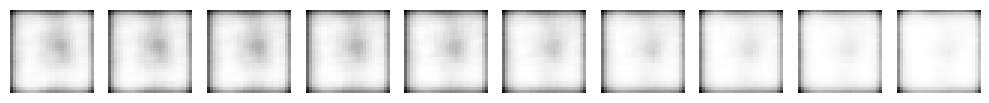

In [ ]:
noise_a = np.random.normal(0, 1, size=[1, latent_dim])
noise_b = np.random.normal(0, 1, size=[1, latent_dim])

noise = np.zeros((10, latent_dim), dtype='float32')
for ni in range(10):
  noise[ni, :] = float(ni)/10. * noise_a + (1 - float(ni)/10.) * noise_b
generatedImages = generator.predict(noise)
generatedImages = generatedImages.reshape(10, 28, 28)
plotImages(generatedImages, dim=(1, 10), figsize=(10, 10))

**Question** Explain what you see in this plot.

The plot are 10 generated images by interpolation of two random noise vectors in the latent space. Using the generator.predict(noise) the images are generated using different weights of the noise vectors. The images show a visual progression in linearity. The first image will resemble what 'noise_a' produces and the last image will resemble what 'noise_b' produces. The images in between will show a gradual transition from the characteristics of 'noise_a' to those of 'noise_b'.

We notice that as we progress towards the result of what 'noise_b' produces, the amout of noise in the image is slowly diminishing.

This is a demonstration of the smooth interpolation properties of the latent space in the GAN

**Question** What happens when you extrapolate out of the latent space distribution? Consider how the noise vectors are drawn.

When extrapolating outside the range of the latent space distribution we are generating noise vectors that may not have been seen during training as they are outside the range of what the generator has learned to generate. Thus the generator tries to create data which has not been learned from the training set. This could result in images with unrealistic artifacts.

Here, 'noise_a' and 'noise_b' are random noise vectors drawn from a normal distribution with mean 0 and standard deviation 1. The values in these vectors are typically within a certain range, centered around 0. When you extrapolate, you're generating noise vectors that are significantly outside this range.

# Histopathology image synthesis

Now we're going to synthesize some actual images. We're going to use the PatchCamelyon data set ([more info here](https://github.com/basveeling/pcam)) which consists of small images that can be used for classification benchmarks. Today, we're not going to classify images, but we're going to synthesize them. You can download a data set of smaller (28 x 28 pixels) versions of these images from
[this link](https://drive.google.com/file/d/11tkBWleY6PqFAGQHW0zYOwhvuz0kq-ai/view?usp=sharing). Upload the data set in the dialog below.

In [ ]:
file_path = '/content/drive/My Drive/valid_28.pkl'

Now load the data set.

In [ ]:
def loadPatchCamelyon(path):
    f = gzip.open(path, 'rb')
    train_set = pickle.load(f, encoding='latin1')
    f.close()
    return train_set

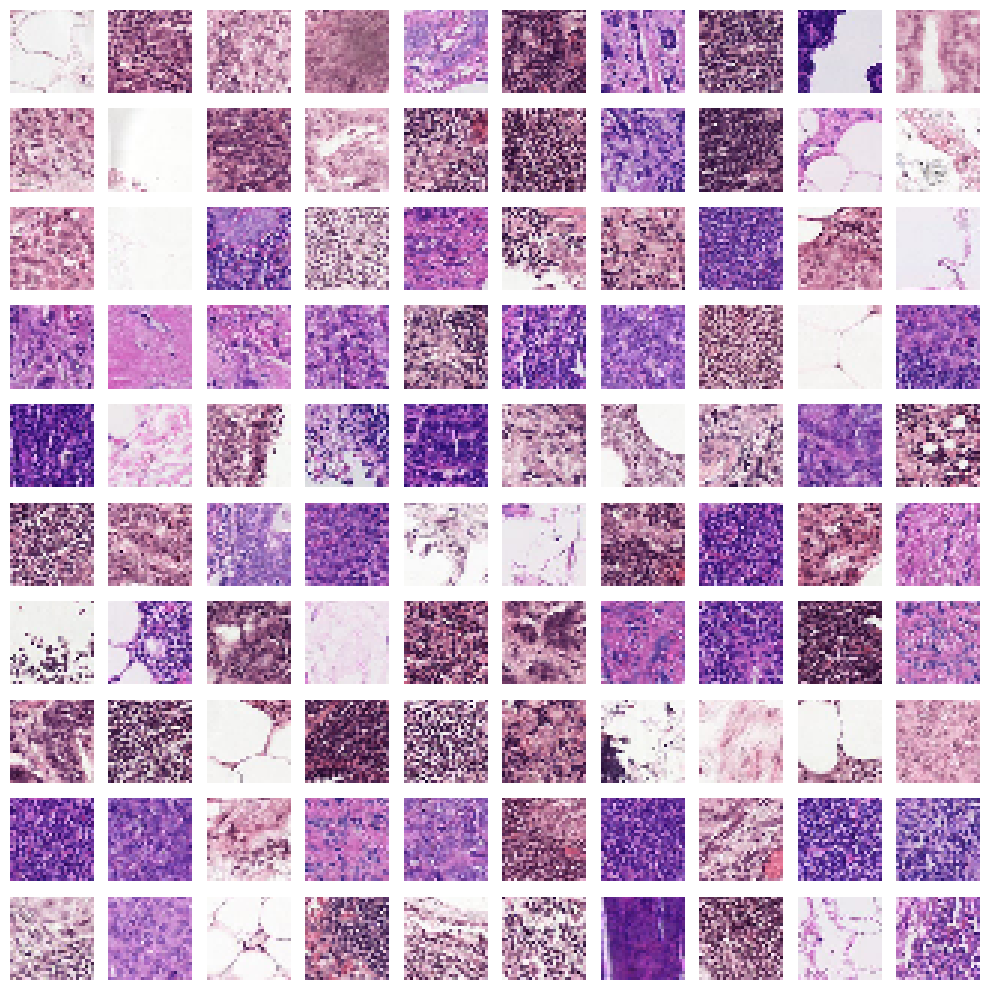

In [ ]:

with open('/content/drive/My Drive/valid_28.pkl', 'rb') as file:
    train_set_images = pickle.load(file)

def plotImagesPatchCamelyon(images, dim=(10, 10), figsize=(10, 10), title=''):
    plt.figure(figsize=figsize)
    plt.suptitle(title)
    for i in range(images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(images[i], interpolation='nearest')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


plotImagesPatchCamelyon(train_set_images[np.random.randint(0, train_set_images.shape[0], size=100)].reshape(100, 28, 28, 3)/255.0)

What do you immediately notice? Indeed, these images are in color! So the generator will have to generate three output channels instead of just one.

In this second-to-last part of the practical you're going to repurpose the code that you have used so far to synthesize histopathology images like the ones above. You can play around a bit with this, see what happens when you interpolate between samples, etc. Remember that there is a final 'exercise' below.

**Good luck!**

In [ ]:
latent_dim = 10

#changing the input shape for the discriminator to the image sizes
def get_discriminator_3CNN():
  discriminator = keras.models.Sequential()
  discriminator.add(Conv2D(64, kernel_size=(5, 5), strides=(2, 2), padding='same', input_shape=(3, 28, 28), kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Conv2D(128, kernel_size=(5, 5), strides=(2, 2), padding='same'))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  discriminator.add(Flatten())
  discriminator.add(Dense(1, activation='sigmoid'))
  return discriminator

#changing the output of the generator to have a 3-channel since the images are colored (RGB)
def get_generator_3CNN():
  generator = keras.models.Sequential()
  generator.add(Dense(128*7*7, input_dim=latent_dim, kernel_initializer=keras.initializers.RandomNormal(stddev=0.02)))
  generator.add(LeakyReLU(0.2))
  generator.add(Reshape((128, 7, 7)))
  generator.add(UpSampling2D(size=(2, 2)))
  generator.add(Conv2D(64, kernel_size=(5, 5), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(UpSampling2D(size=(2, 2)))
  generator.add(Conv2D(3, kernel_size=(5, 5), padding='same', activation='tanh'))
  return generator

discriminator = get_discriminator_3CNN()
generator = get_generator_3CNN()
generator.summary()
discriminator.summary()


In [ ]:
#For the compiling part , the generator is set to a higher learning rate compared to the discriminator.
discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.002, beta_1=0.5))

discriminator.trainable = False
z = keras.layers.Input(shape=(latent_dim,))
x = generator(z)
D_G_z = discriminator(x)
gan = keras.models.Model(inputs=z, outputs=D_G_z)
gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0002, beta_1=0.5))

d_losses = []
g_losses = []

epochs = 30
batch_size = 128

X_train = (train_set_images.reshape(48000, 3, 28, 28).astype(np.float32) - 0.5)/0.5

batch_count = int(X_train.shape[0] / batch_size)
for e in range(epochs):
  for _ in range(batch_count):
    # Get a random set of input noise and images
    noise = np.random.normal(0, 3, size=[batch_size, latent_dim])
    image_batch = X_train[np.random.randint(0, X_train.shape[0], size=batch_size)]

    # Generate some fake histopathology images using the generator
    generated_images = generator.predict(noise)

    # Concatenate the fake and real images
    X = np.concatenate([image_batch, generated_images])

    # Labels for generated and real data
    y_dis = np.zeros(2*batch_size)
    # Set reference to 1 for real samples
    y_dis[:batch_size] = 1

    # Train discriminator with this batch of samples
    discriminator.trainable = True
    d_loss = discriminator.train_on_batch(X, y_dis)

    # Train generator with a new batch of generated samples
    noise = np.random.normal(0, 3, size=[batch_size, latent_dim])

    # From the generator's perspective, the discriminator should predict
    # ones for all samples
    y_gen = np.ones(batch_size)

    # Freeze the discriminator part
    discriminator.trainable = False

    # Train the GAN to predict ones
    g_loss = gan.train_on_batch(noise, y_gen)

    # Store loss of most recent batch from this epoch
  d_losses.append(d_loss)
  g_losses.append(g_loss)

  if e % 2 == 0:
    noise = np.random.normal(0, 1, size=[10, latent_dim])
    generatedImages = generator.predict(noise)

    #shifting the range [-1,1] to [0,2] and rescale to the range [0, 255]
    generatedImages = (generatedImages + 1) * 127.5

    generatedImages = generatedImages.reshape(10, 28, 28,3)

    #converting image types to integer for displaying
    generatedImages = generatedImages.astype(np.uint8)
    plotImagesPatchCamelyon(generatedImages, title='Epoch {}'.format(e))
    display.display(plt.gcf())
    time.sleep(0.001)
    saveModels(e)

# Conditional image synthesis

## The BigGAN model
The images we have synthesized so far are all quite small. Synthesis of larger images (e.g. 512 x 512 pixels) typically requires a lot of compute power and patience. Unfortunately, you don't have 100s of GPU at your disposal (I guess) to train a model like BigGAN, the state of the art in conditional image synthesis. A wild guess is that it would cost you around [USD60000](https://twitter.com/quasimondo/status/1065610256917692416) to train this model.

Luckily, the authors of BigGAN have put a version of their pretrained model online and you can use it to synthesize images. Go to [this Colaboratory file](https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/biggan_generation_with_tf_hub.ipynb) and answer the following questions.

**Question** What happens when you change the noise seed? Also try out different categories.

When changing the noise seed, we are basically generating a different noise vector. This will result in a different starting point for the generator which can lead to different images to be generated. It is a way to control the randomness of the images generated.

**Question** What happens to your samples when you change the truncation value? More precisely, what happens to the diversity and the quality of your samples? Take a look at the [paper on arXiv](https://arxiv.org/abs/1809.11096) Sec. 3.1 to get an idea what this value does.

The truncation value refers to limiting the random noise in the latent space during the generation. A high value means less truncation and the generator has a lot of freedom to generate diverse images. A low truncation value means that a lot of truncation is applied, which may reduce the diversity. However, the quality of the images improves.


**Question** Interpolate between image categories, inspect what these look like.

If having image A the golden retriever and image B the hen, interpolating in 5 steps will show in the first image a golden retriever and deform towards the hen, and in the last image a hen is seen.



## Conditional MNIST synthesis
For all MNIST samples we already have labels (0, 1, ..., n). Try to change the MNIST synthesis code such that you can ask the generator to generate specific labels. I.e., try to train a conditional GAN. You can look for some inspiration in [this paper](https://arxiv.org/pdf/1411.1784.pdf), in particular Sec. 4.1. Remember that you already got the MNIST labels when loading the data set.

The training process is going quite rough. It is a bit unclear to us if the way we have implemented it now is correct as our generator does not really improve and converge to the target digit. We wonder if that is because of a mistake in our implementation, hyperparameter choices or simply because we need to give it more time to train.

In [ ]:
from keras.datasets import mnist
from keras.utils import to_categorical
from keras.layers import Input, concatenate, Dense, LeakyReLU, Dropout
from keras.models import Model


# load the MNIST the dataset
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# scale the image intensities to the 0-1 range
x_train = (x_train / 255.0).astype(np.float32)
x_test = (x_test / 255.0).astype(np.float32)

# convert the data to channel-last
train_set_images = np.expand_dims(x_train, axis=-1)
test_set_images = np.expand_dims(x_test, axis=-1)

# convert the labels to one-hot encoded
train_set_labels = to_categorical(y_train, num_classes=10)
test_set_labels = to_categorical(y_test, num_classes=10)

latent_dim = 100

In [ ]:

def get_conditional_generator_MLP():
    z_input = Input(shape=(latent_dim,))  # Input for random noise (latent space)
    label_input = Input(shape=(10,))  # Input for one-hot encoded labels

    # Concatenate random noise and labels
    concatenated = concatenate([z_input, label_input], axis=1)

    generator = Dense(256, input_dim=latent_dim + 10)(concatenated)
    generator = LeakyReLU(0.2)(generator)
    generator = Dropout(0.3)(generator)  # Add dropout
    generator = Dense(512)(generator)
    generator = LeakyReLU(0.2)(generator)
    generator = Dropout(0.3)(generator)  # Add dropout
    generator = Dense(1024)(generator)
    generator = LeakyReLU(0.2)(generator)
    generator = Dense(784, activation='sigmoid')(generator)

    return Model(inputs=[z_input, label_input], outputs=generator)


In [ ]:
def get_conditional_discriminator_MLP():
    img_input = Input(shape=(784,))  # Input for image data (Flattened MNIST images)
    label_input = Input(shape=(10,))  # Input for one-hot encoded labels

    # Concatenate image data and labels
    concatenated = concatenate([img_input, label_input], axis=1)

    discriminator = Dense(1024, kernel_initializer=keras.initializers.RandomNormal(stddev=0.02))(concatenated)
    discriminator = LeakyReLU(0.2)(discriminator)
    discriminator = Dropout(0.3)(discriminator)
    discriminator = Dense(512)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
    discriminator = Dropout(0.3)(discriminator)
    discriminator = Dense(256)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
    discriminator = Dense(1, activation='sigmoid')(discriminator)

    return Model(inputs=[img_input, label_input], outputs=discriminator)


In [ ]:
discriminator = get_conditional_discriminator_MLP()  # Use the conditional discriminator
generator = get_conditional_generator_MLP()          # Use the conditional generator

discriminator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))
generator.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.2, beta_1=0.5))

discriminator.trainable = False
z = keras.layers.Input(shape=(latent_dim,))
label = keras.layers.Input(shape=(10,))  # Input for labels
G_z = generator([z, label])  # Pass labels as input to the generator
D_G_z = discriminator([G_z, label])  # Pass labels as input to the discriminator
gan = keras.models.Model(inputs=[z, label], outputs=D_G_z)  # GAN accepts both noise and labels

gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5))


In [ ]:
def saveModels(epoch, digit_label):
    generator.save('gan_generator_digit{}_epoch_{}.h5'.format(digit_label, epoch))
    discriminator.save('gan_discriminator_digit{}_epoch_{}.h5'.format(digit_label, epoch))

def plotGeneratedImages(epoch, digit_label, examples=100, dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, latent_dim])
    label_for_digit = np.zeros((examples, 10))
    label_for_digit[:, digit_label] = 1  # One-hot encoded label for the specific digit
    generatedImages = generator.predict([noise, label_for_digit])
    generatedImages = generatedImages.reshape(examples, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generatedImages.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generatedImages[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.suptitle('Epoch {} - Digit {}'.format(epoch, digit_label))
    plt.show()


[]
[]
4/4 [==============================] - 0s 4ms/step


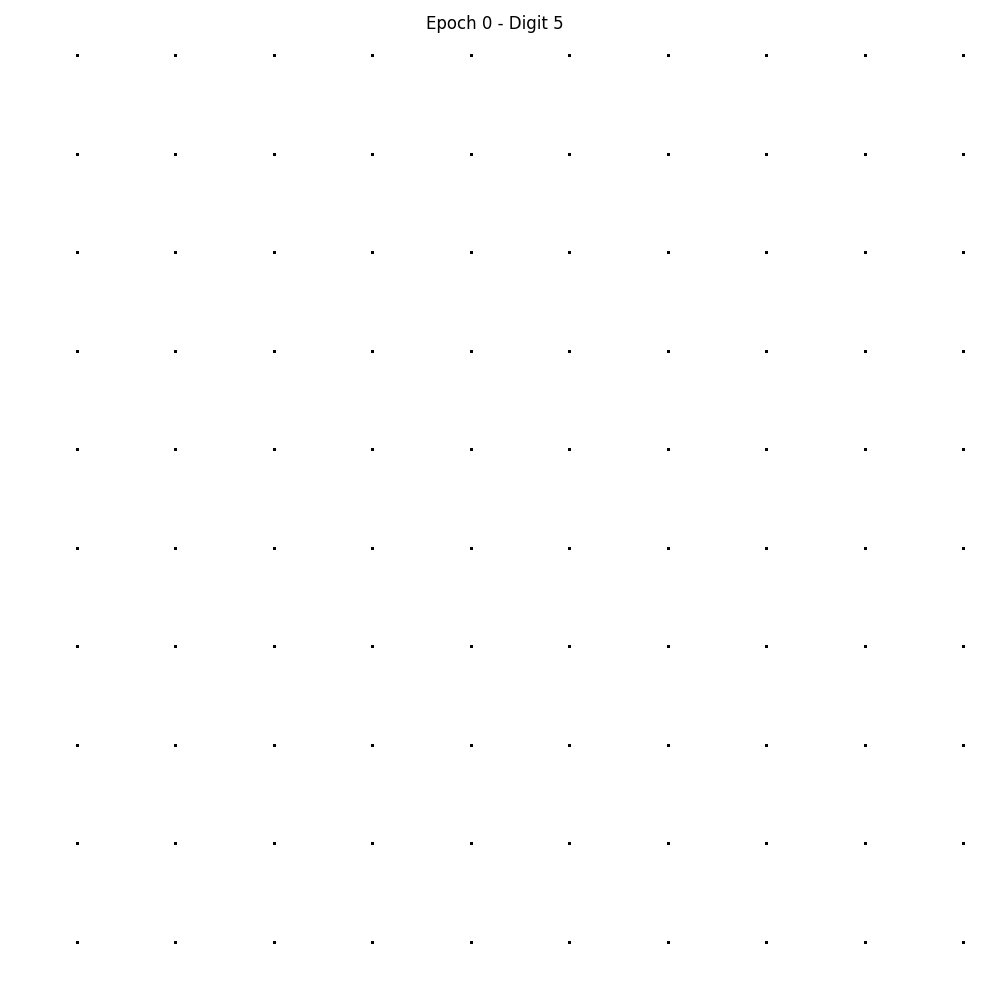

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05]
[9.148703575134277]
4/4 [==============================] - 0s 4ms/step


<Figure size 640x480 with 0 Axes>

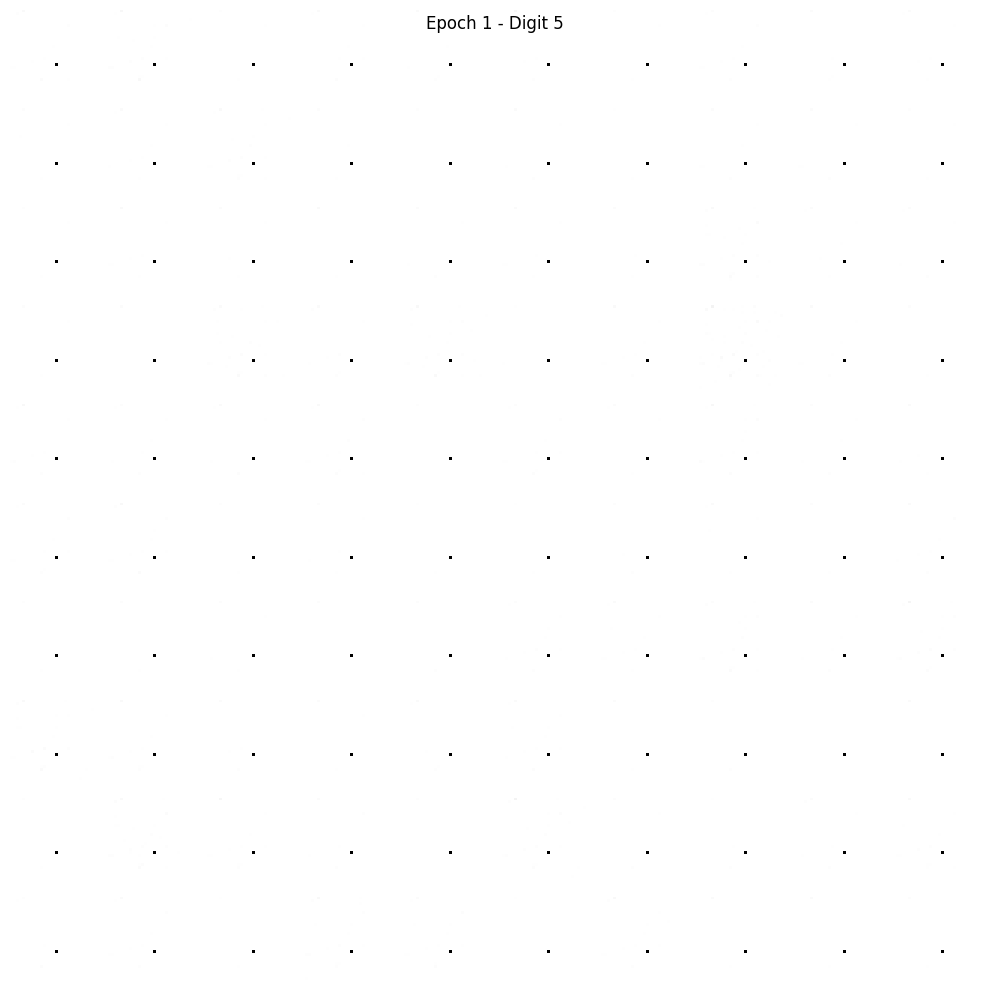

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05]
[9.148703575134277, 10.589561462402344]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

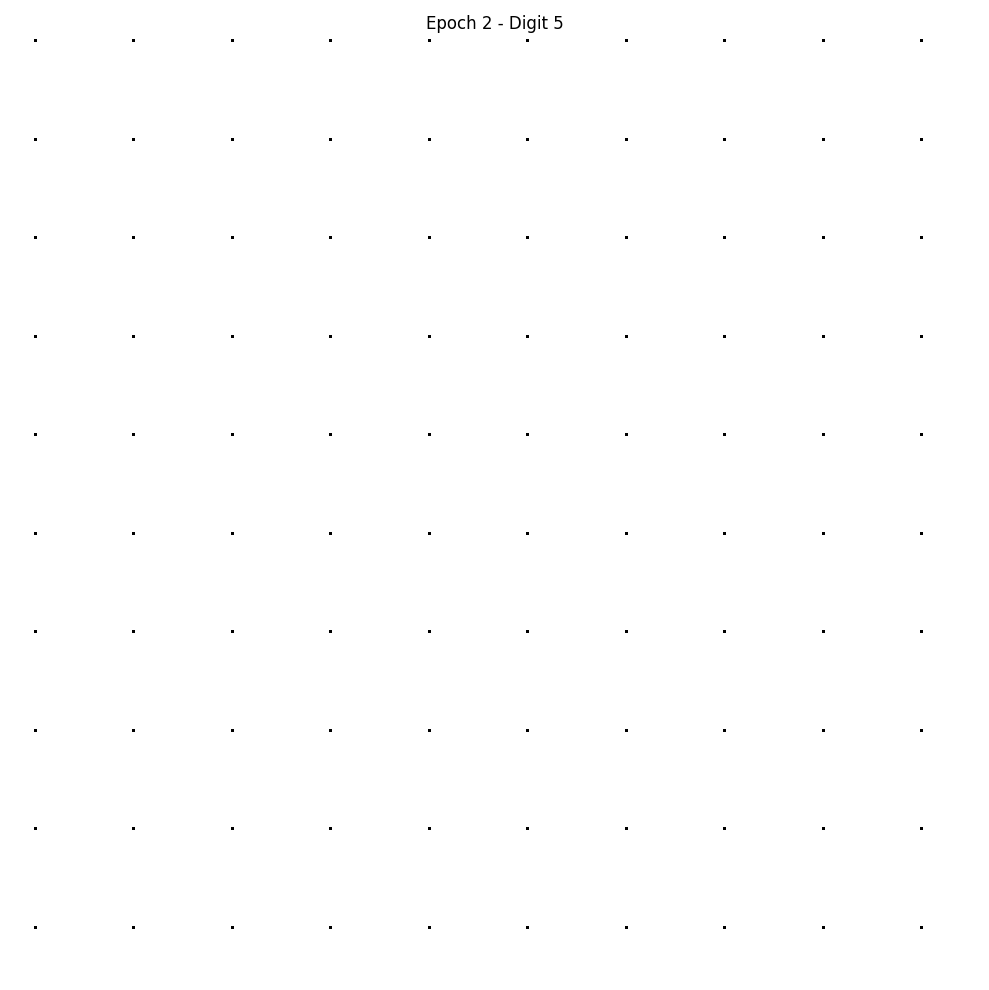

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06]
[9.148703575134277, 10.589561462402344, 11.699875831604004]
4/4 [==============================] - 0s 4ms/step


<Figure size 640x480 with 0 Axes>

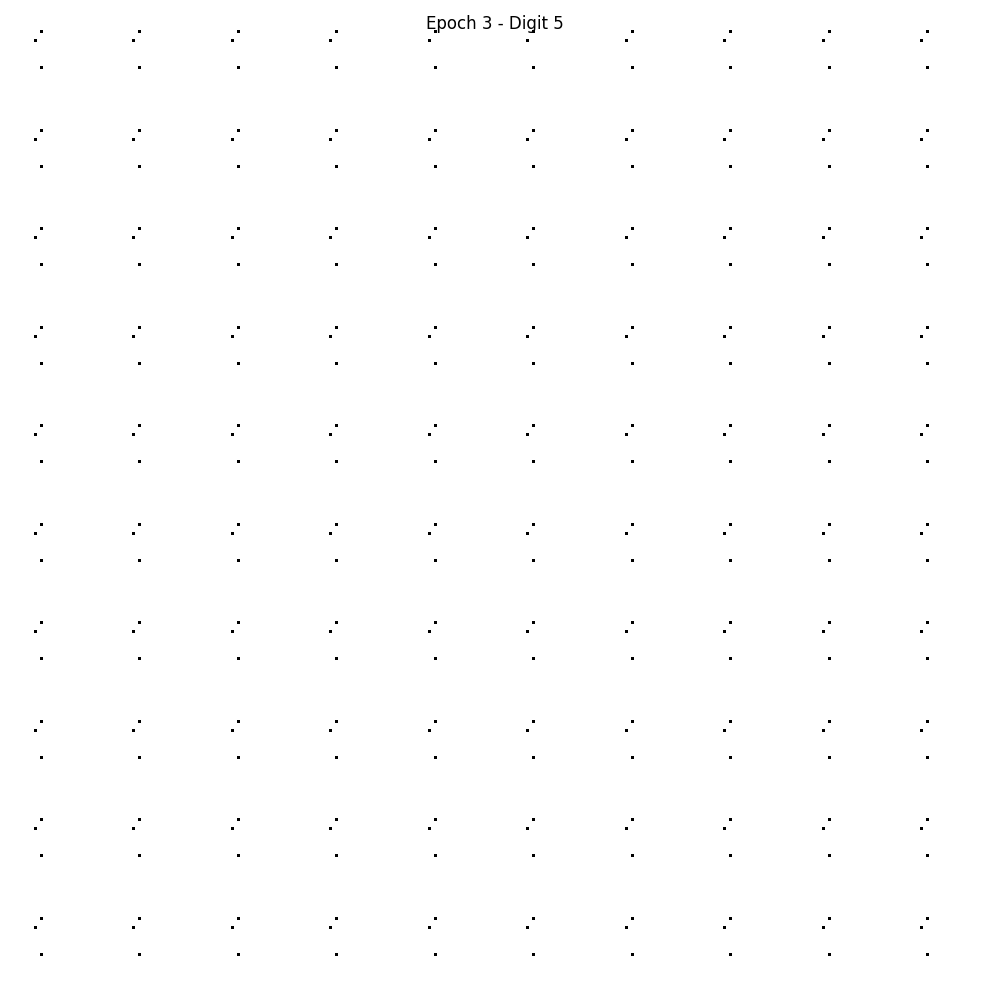

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703]
4/4 [==============================] - 0s 4ms/step


<Figure size 640x480 with 0 Axes>

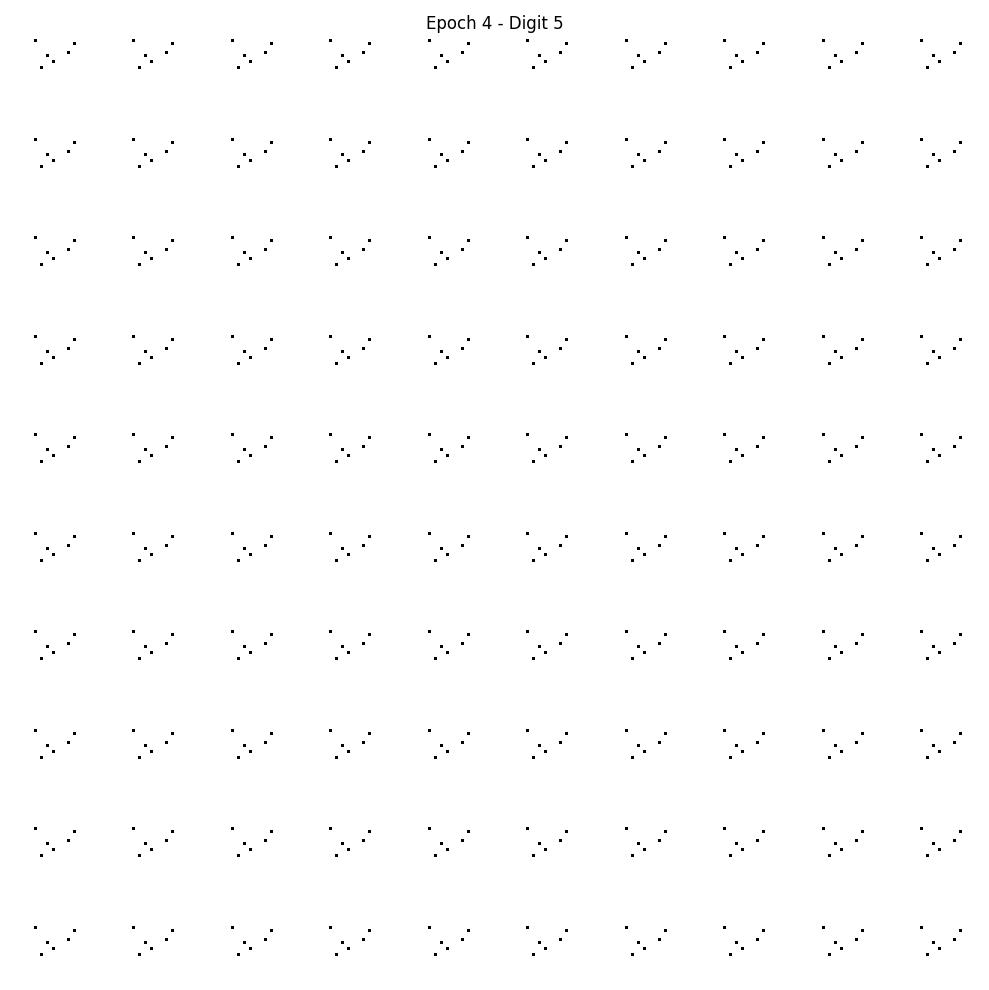

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555]
4/4 [==============================] - 0s 4ms/step


<Figure size 640x480 with 0 Axes>

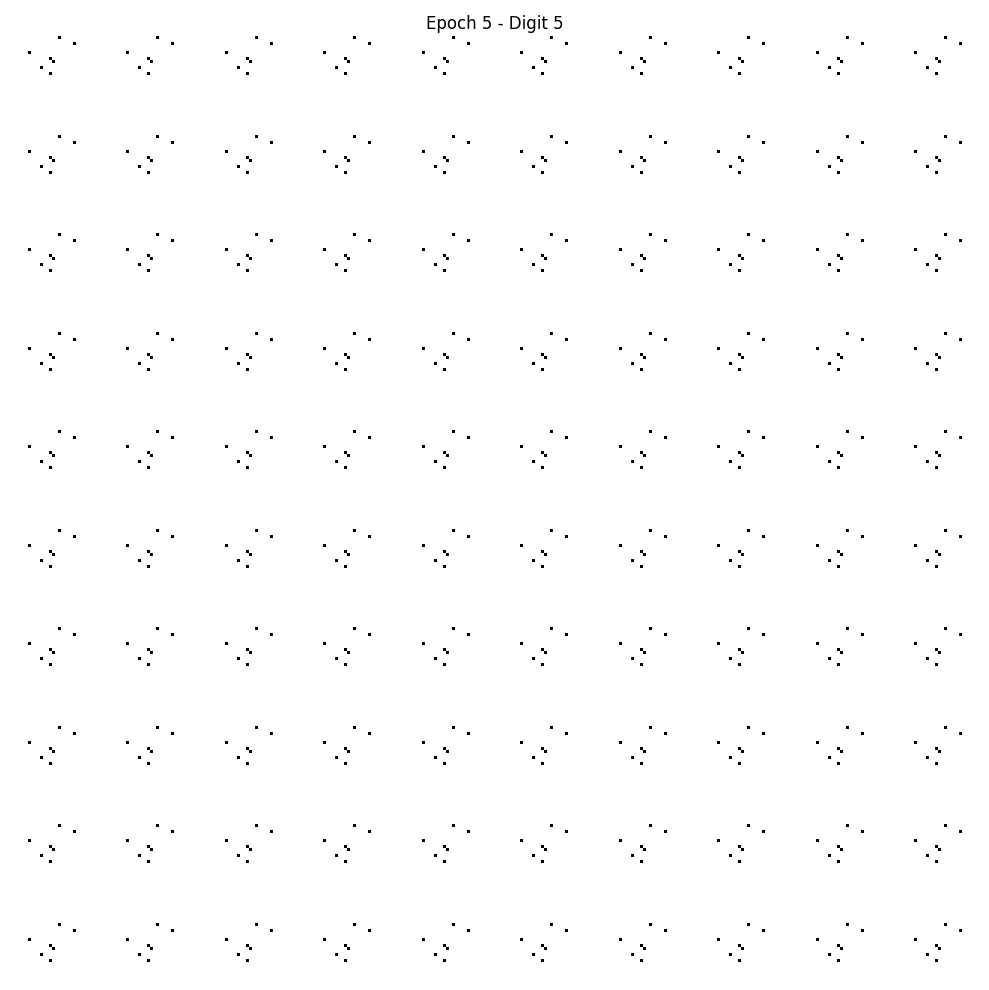

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

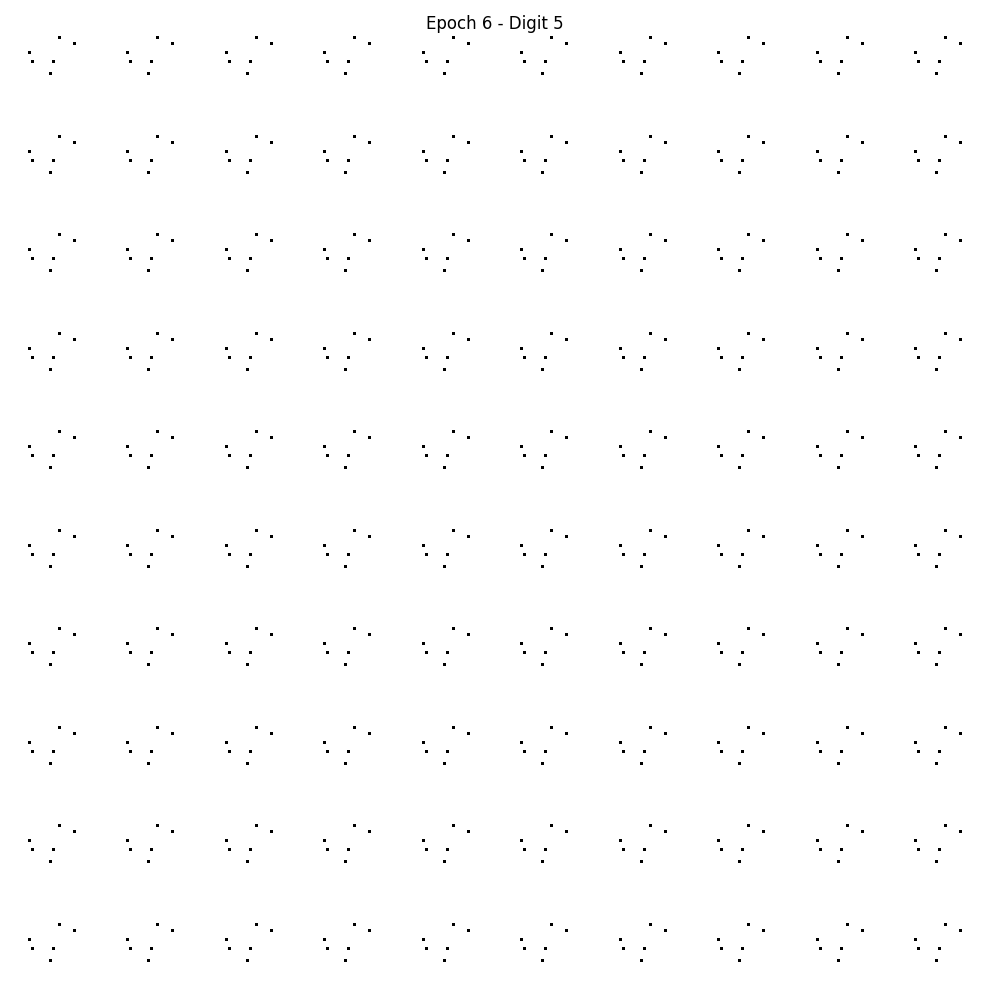

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

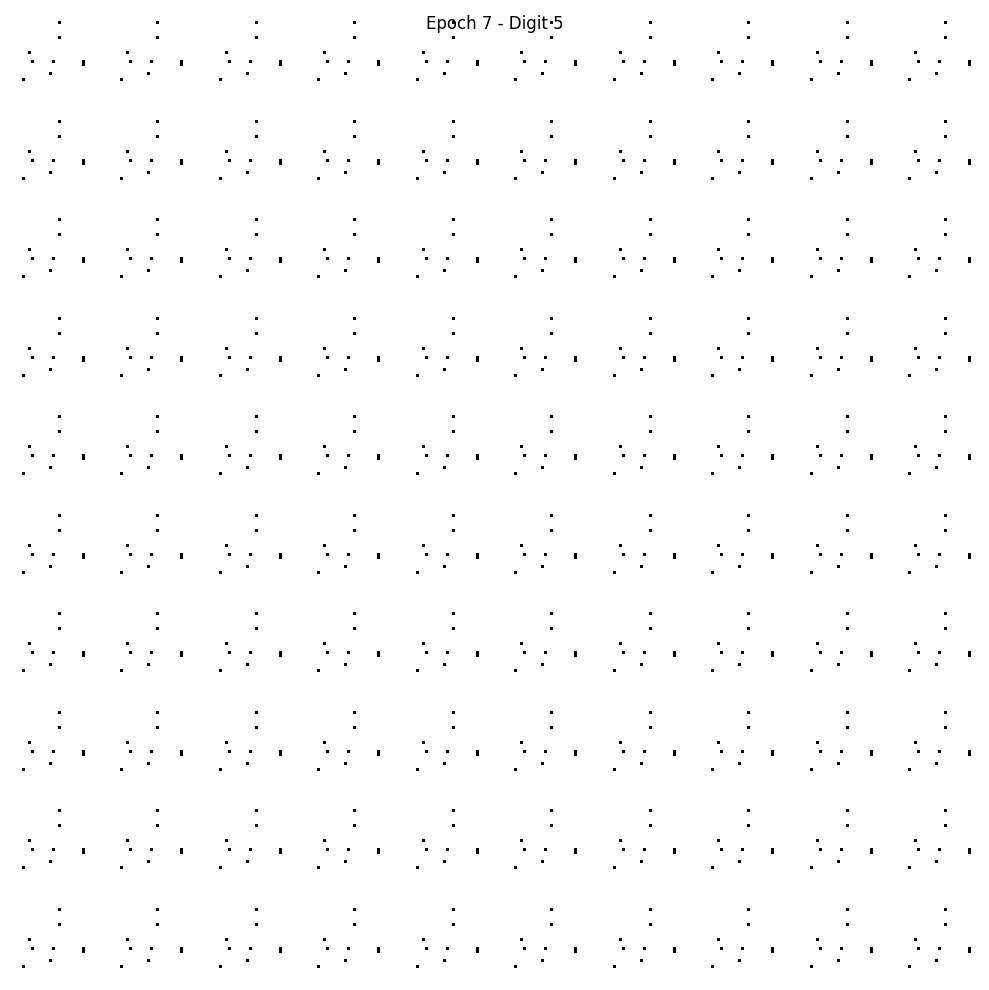

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

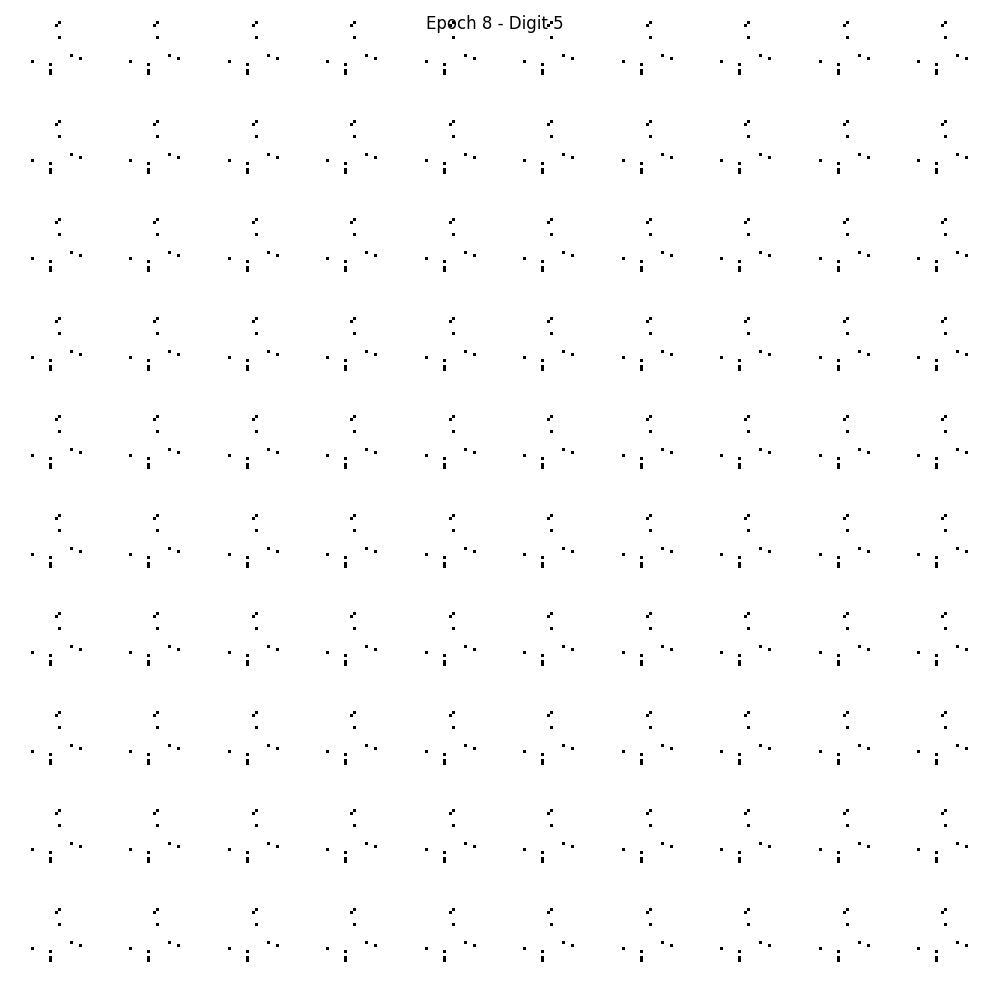

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023]
4/4 [==============================] - 0s 8ms/step


<Figure size 640x480 with 0 Axes>

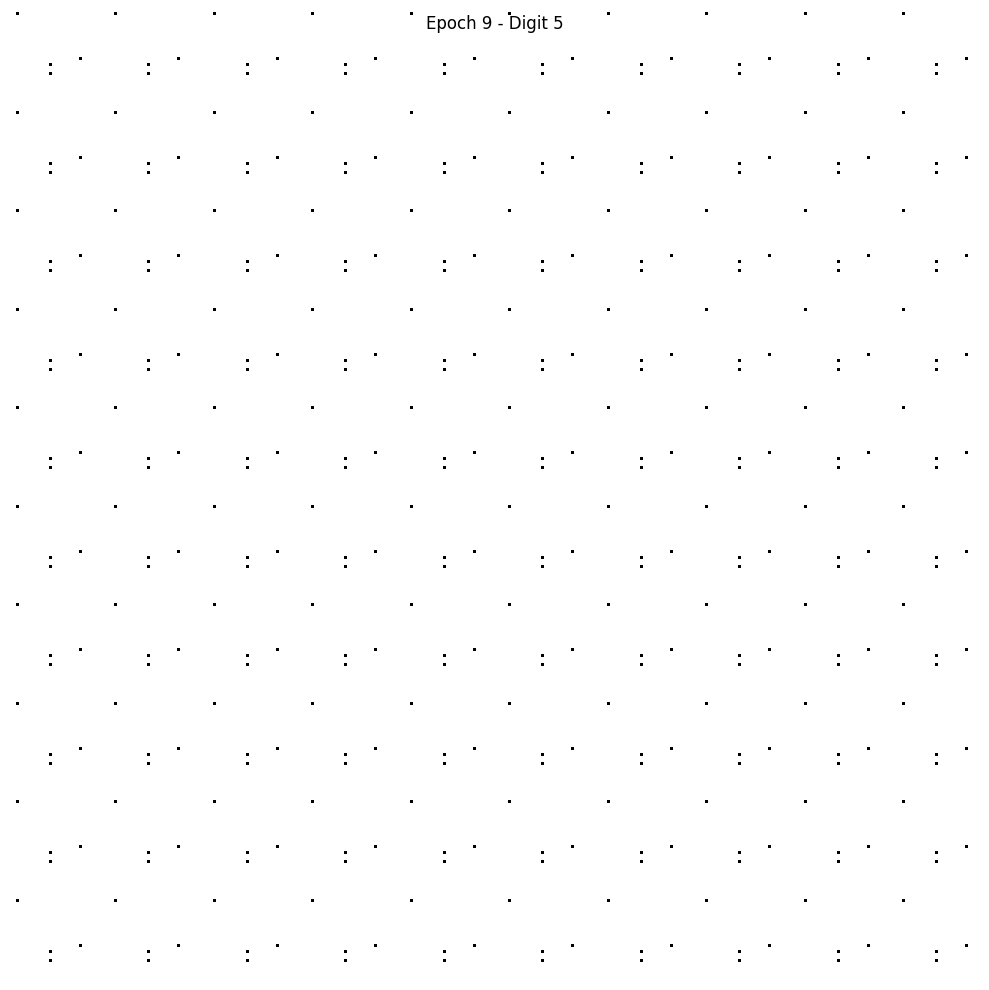

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

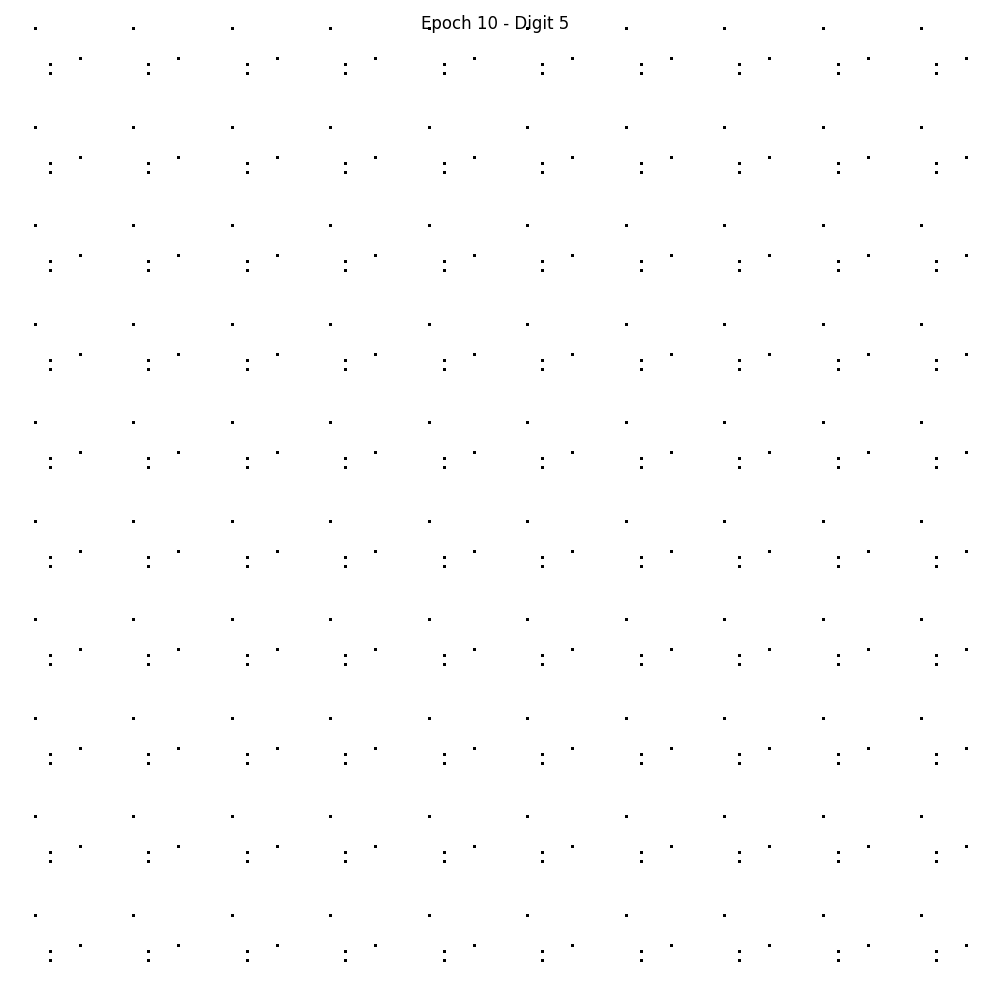

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

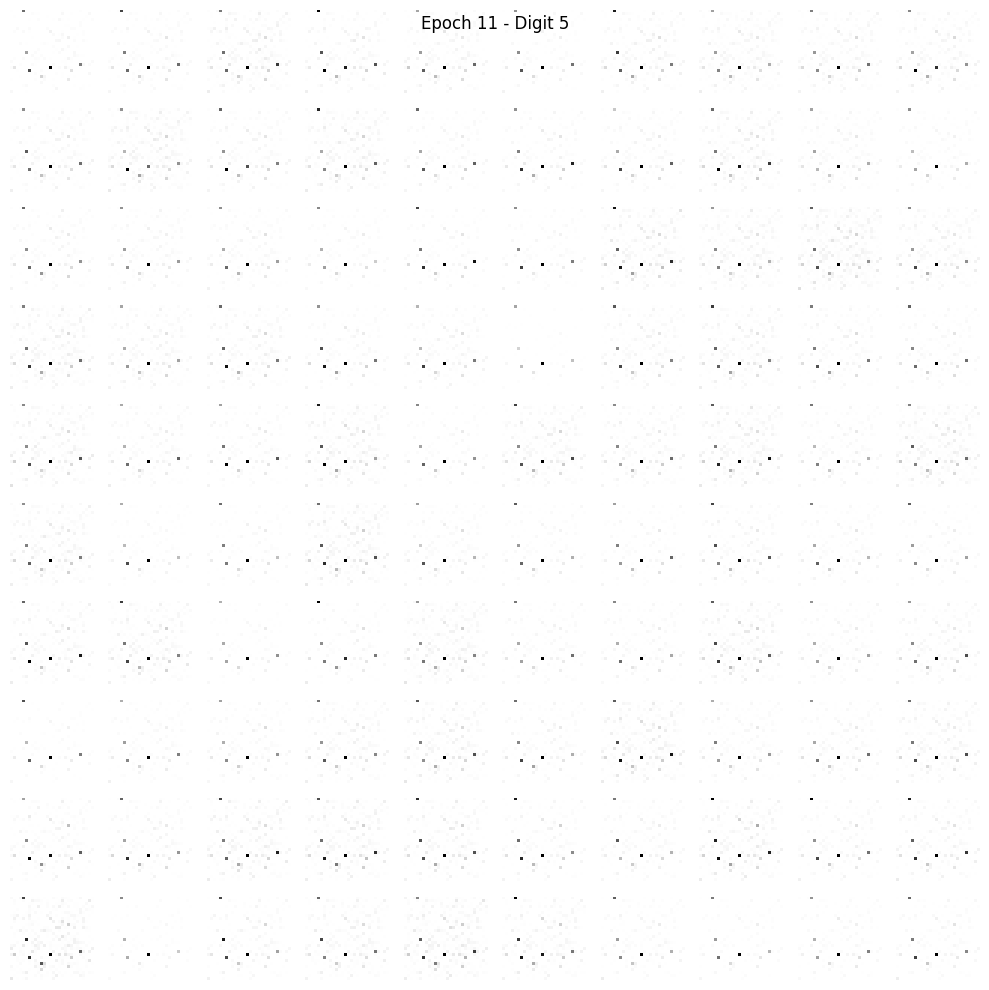

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559]
4/4 [==============================] - 0s 5ms/step


<Figure size 640x480 with 0 Axes>

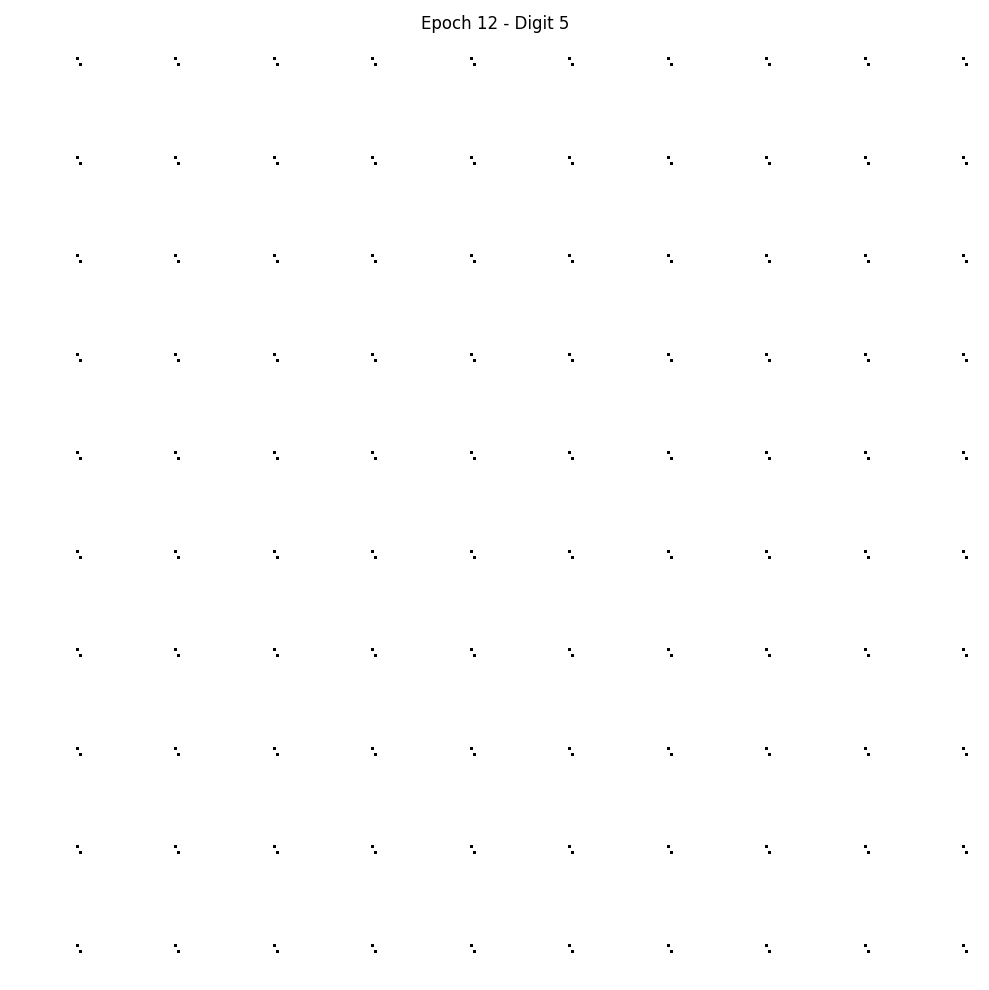

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

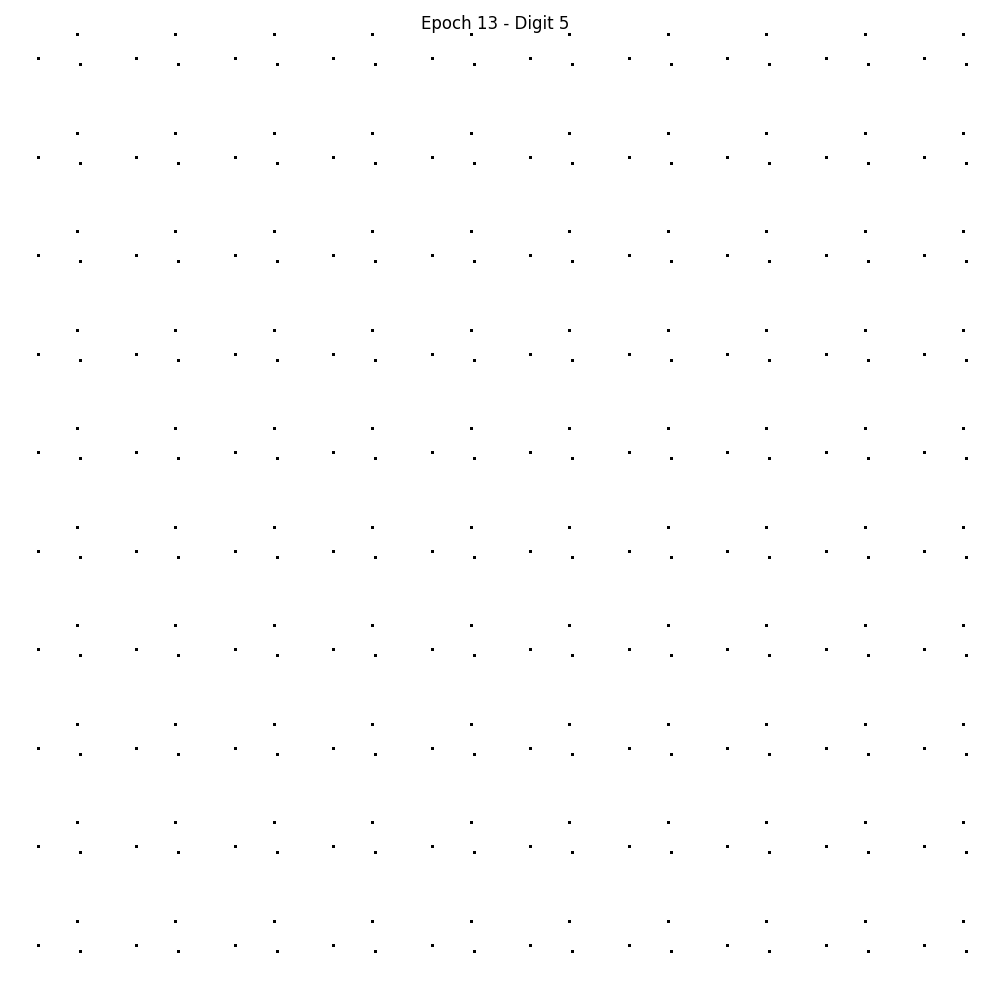

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

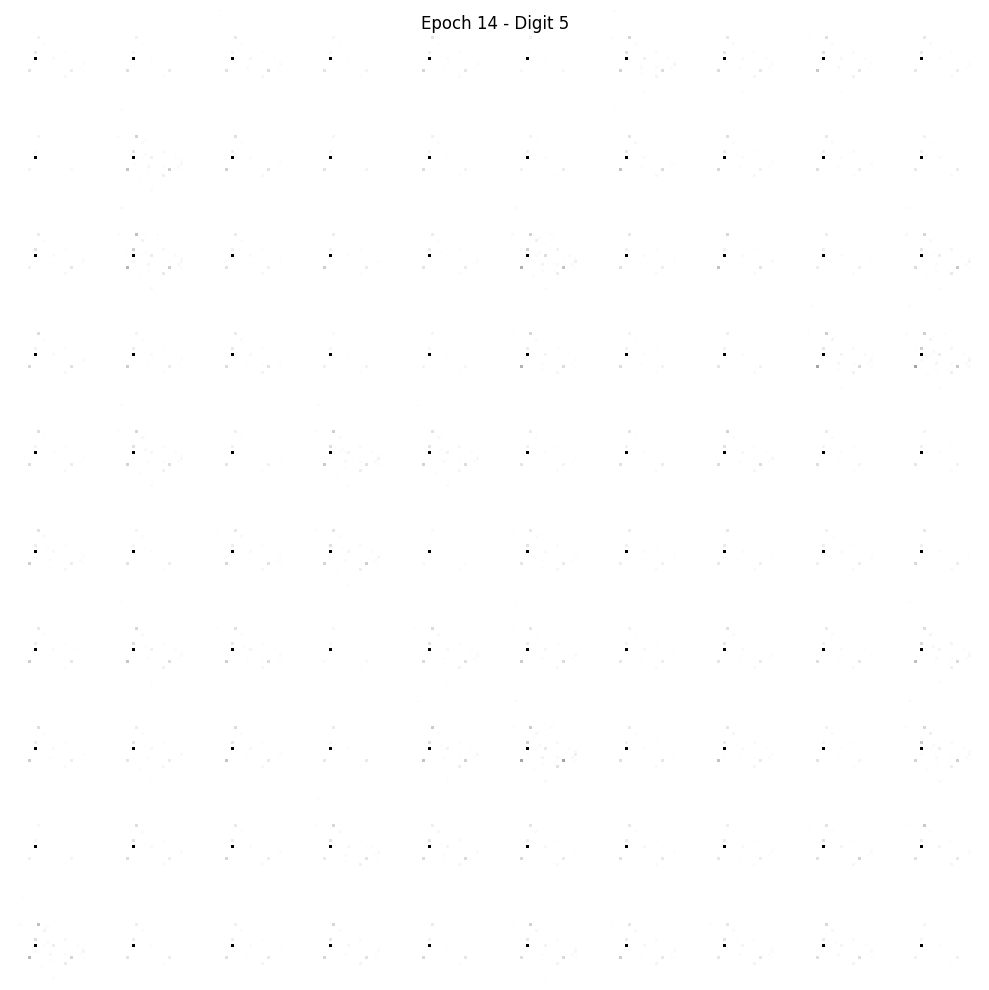

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

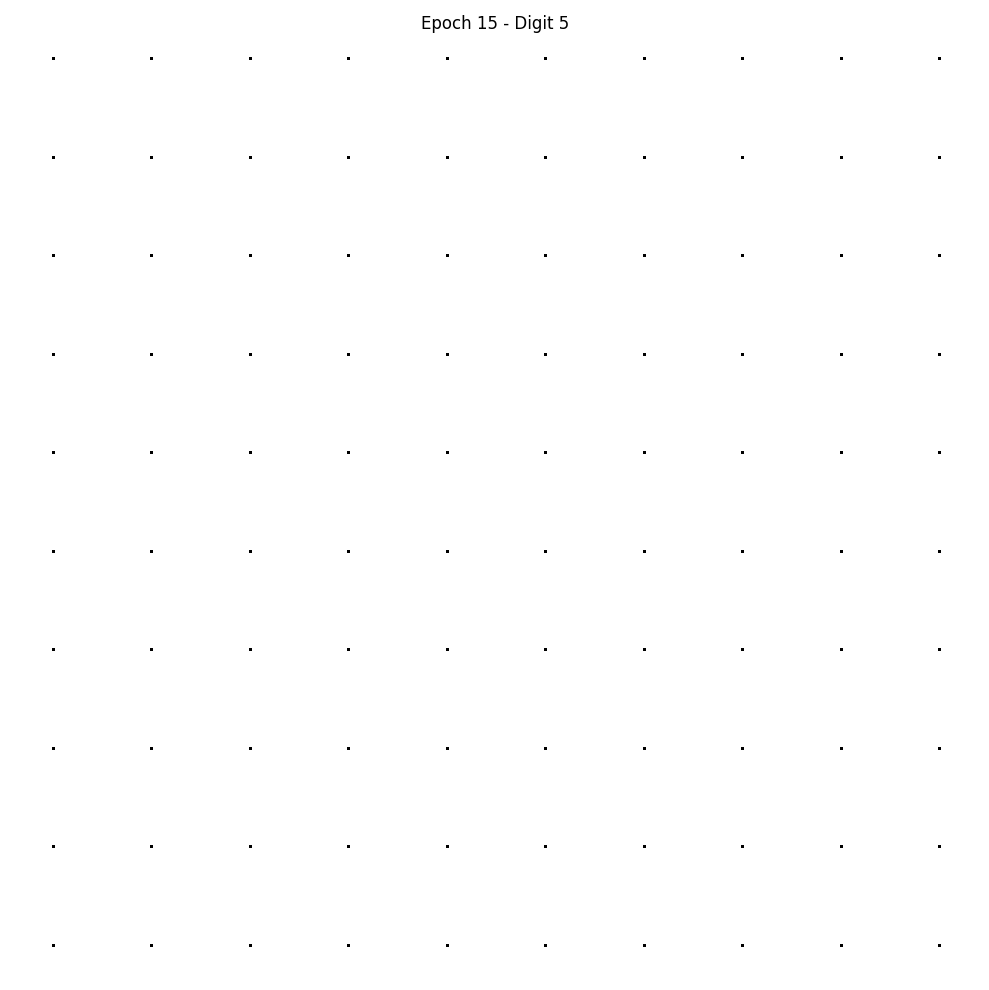

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

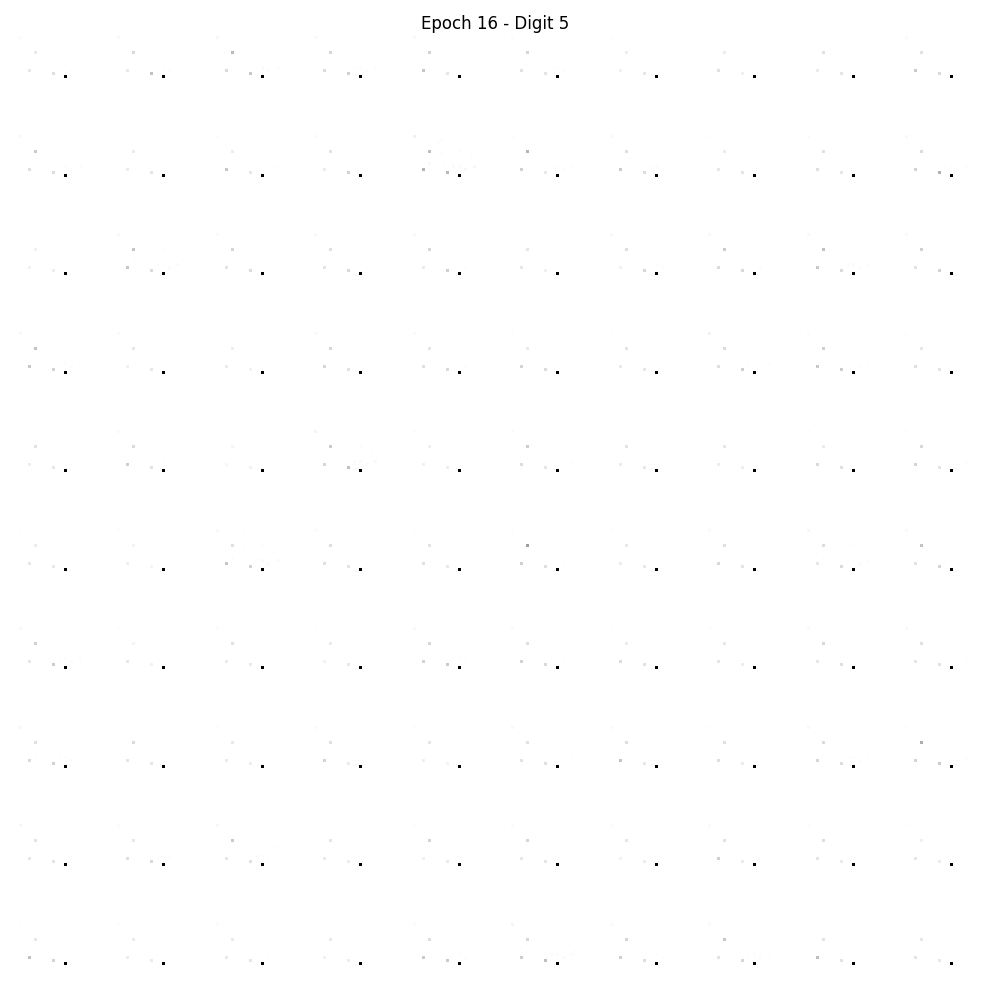

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

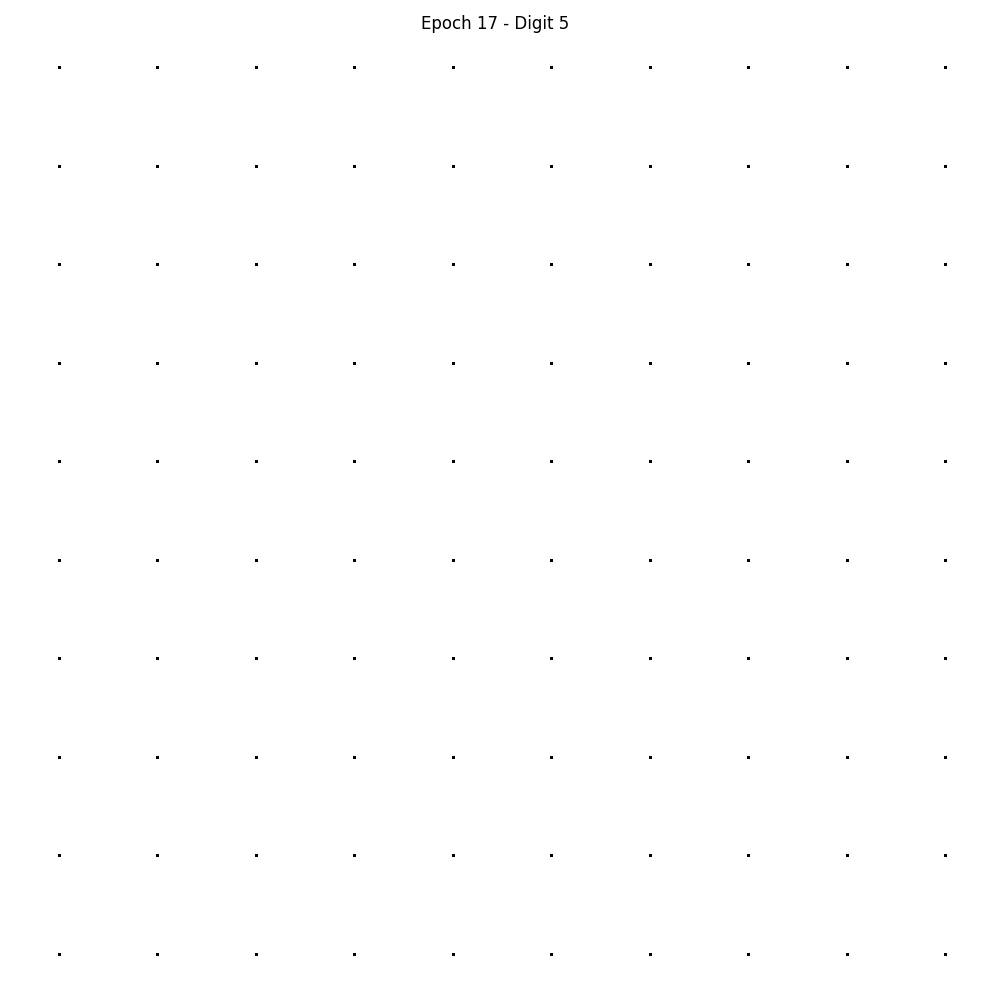

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

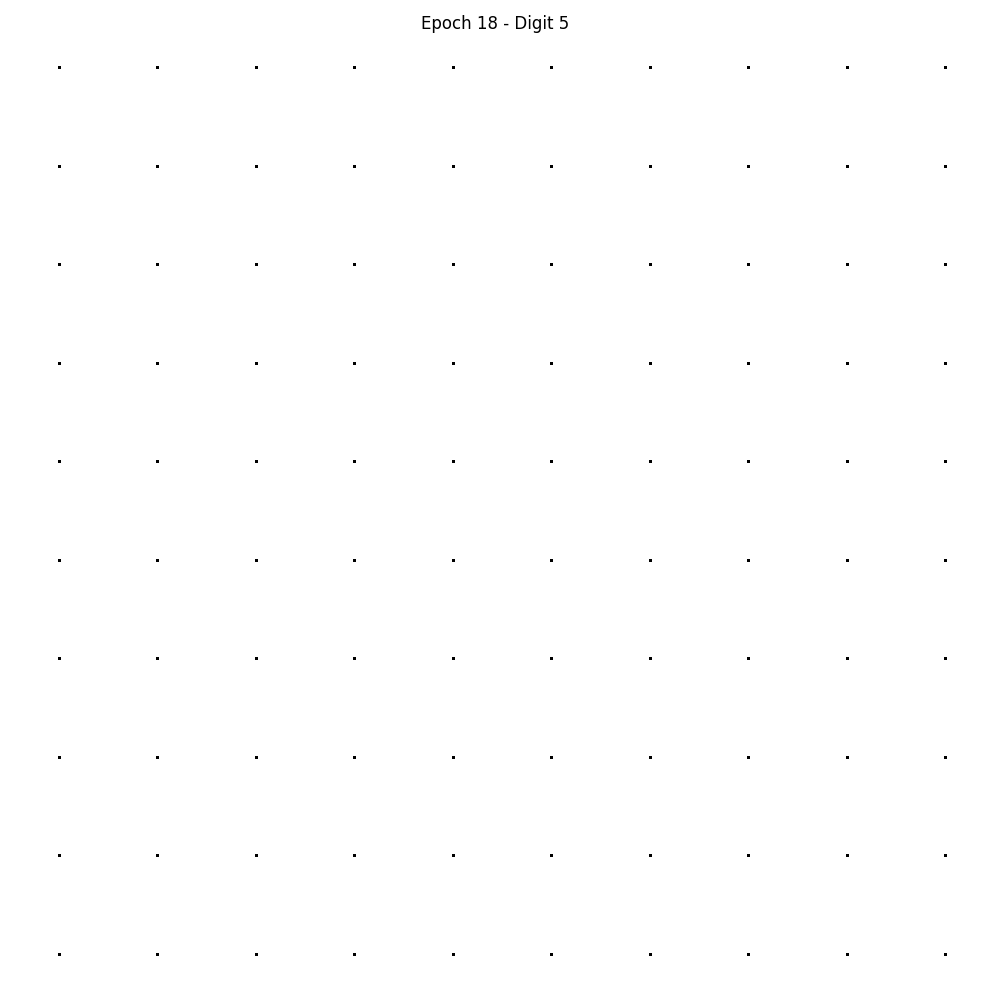

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

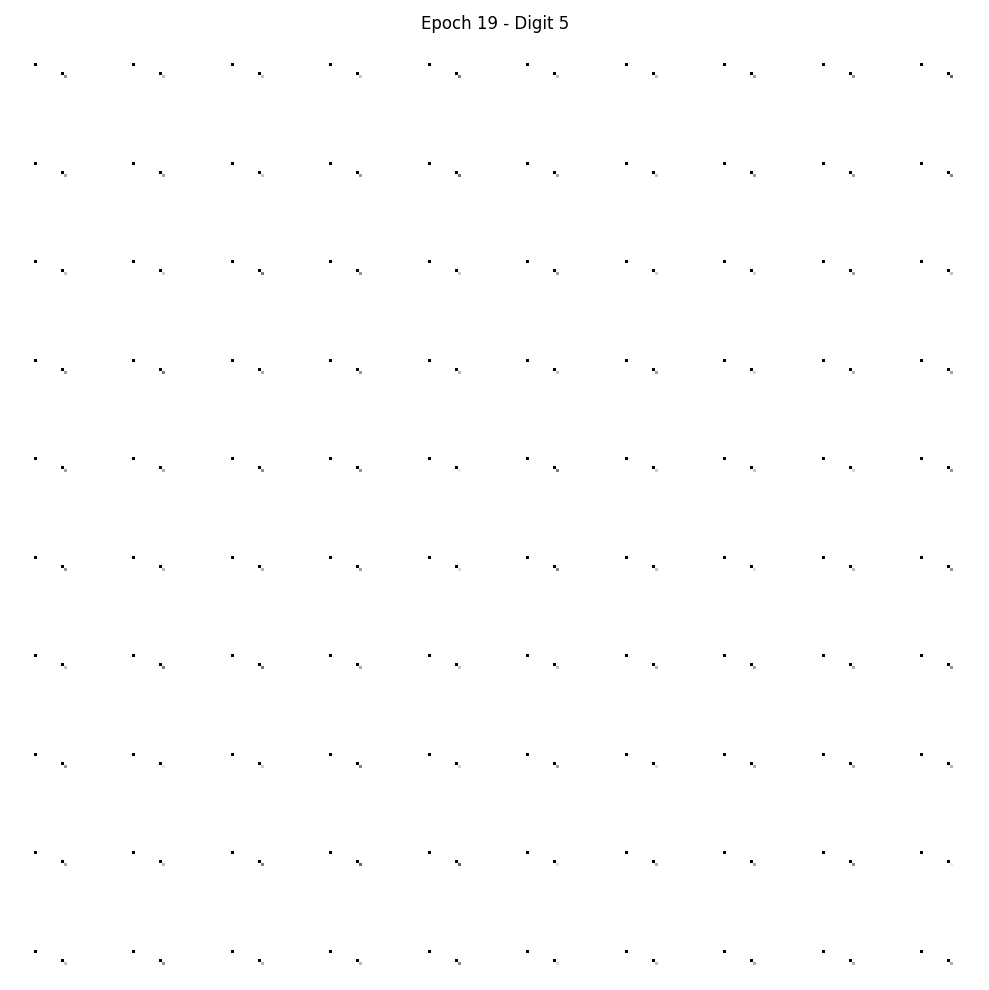

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312]
4/4 [==============================] - 0s 3ms/step


<Figure size 640x480 with 0 Axes>

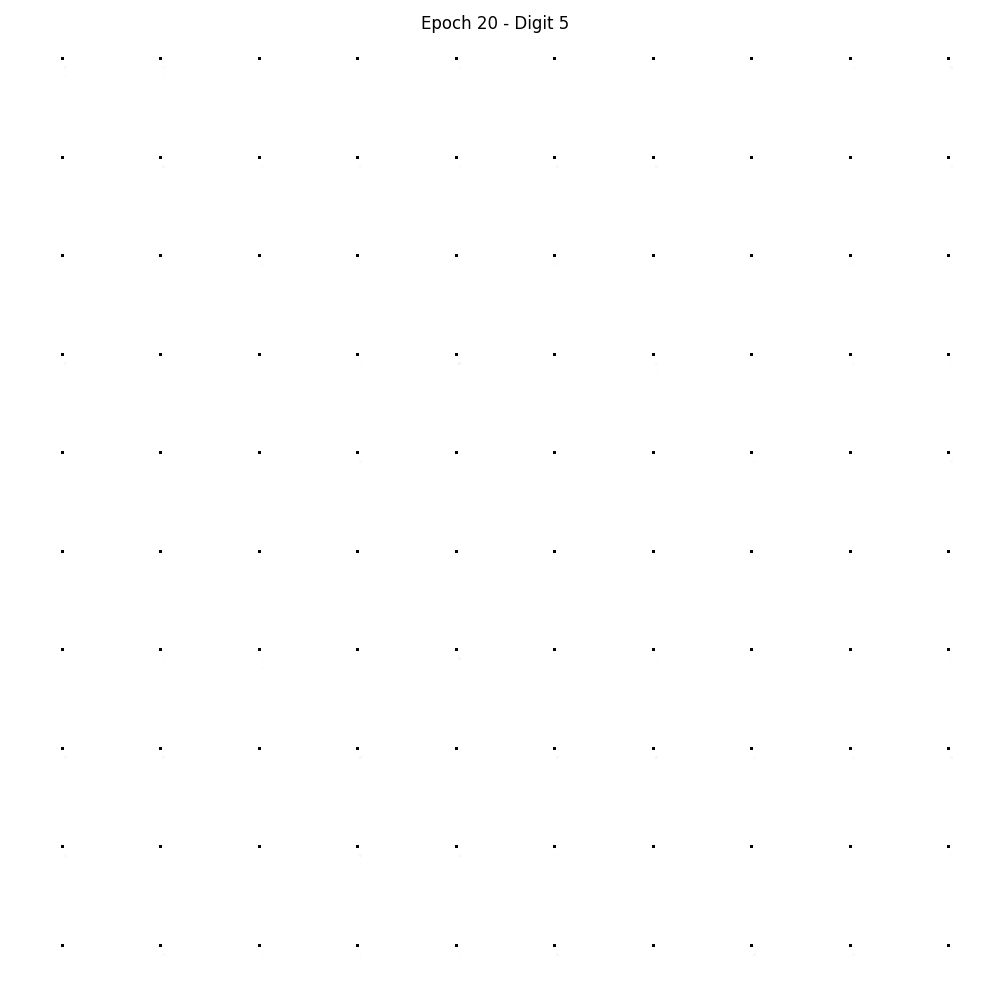

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312, 17.306549072265625]
4/4 [==============================] - 0s 6ms/step


<Figure size 640x480 with 0 Axes>

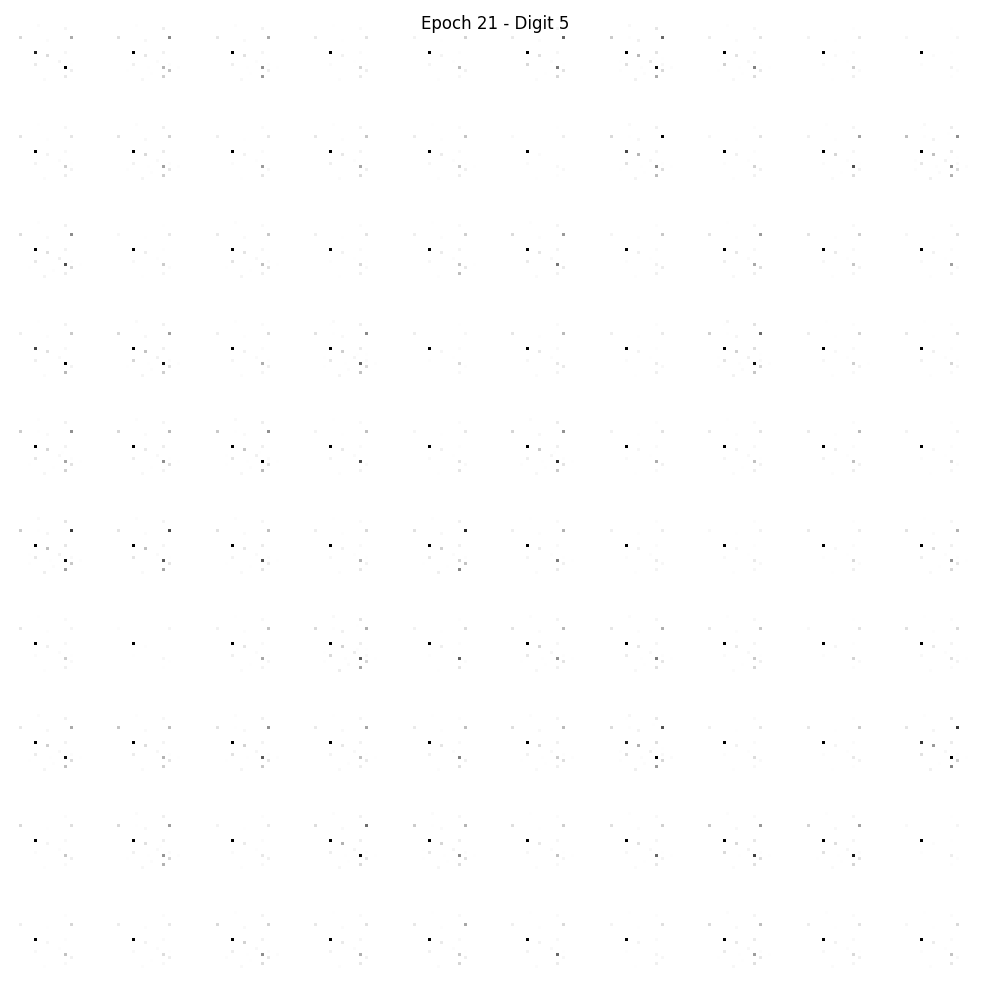

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312, 17.306549072265625, 17.478334426879883]
4/4 [==============================] - 0s 7ms/ste

<Figure size 640x480 with 0 Axes>

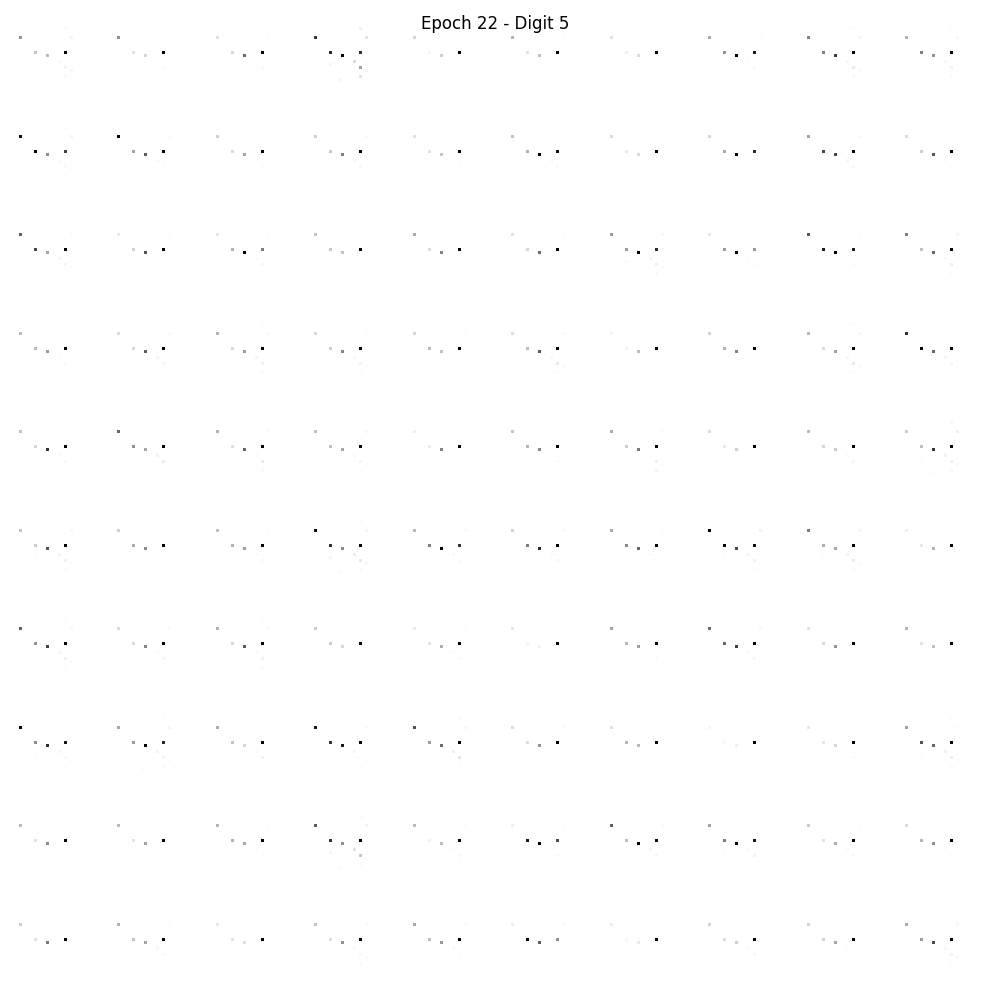

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312, 17.306549072265625, 17.478334426879883, 17.832151412963867]
4/4 [=

<Figure size 640x480 with 0 Axes>

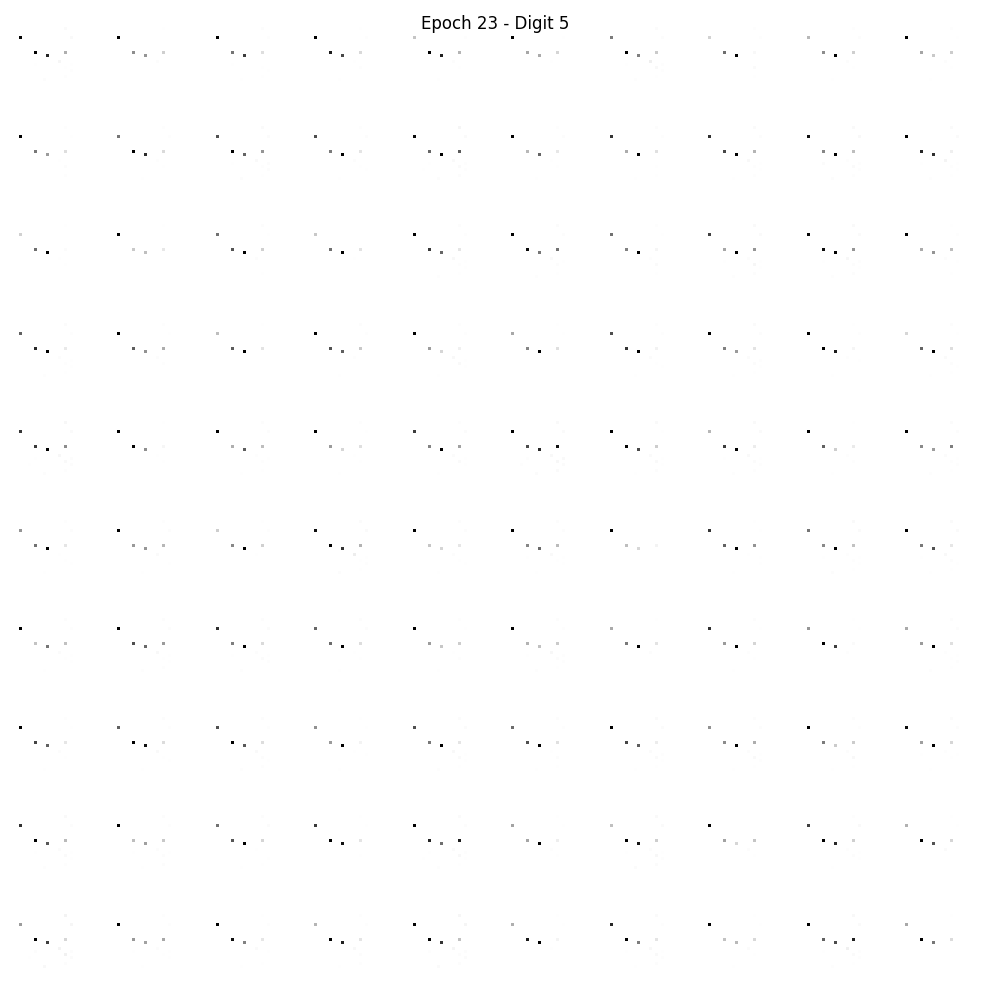

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312, 17.306549072265625, 17.478334426879883, 17

<Figure size 640x480 with 0 Axes>

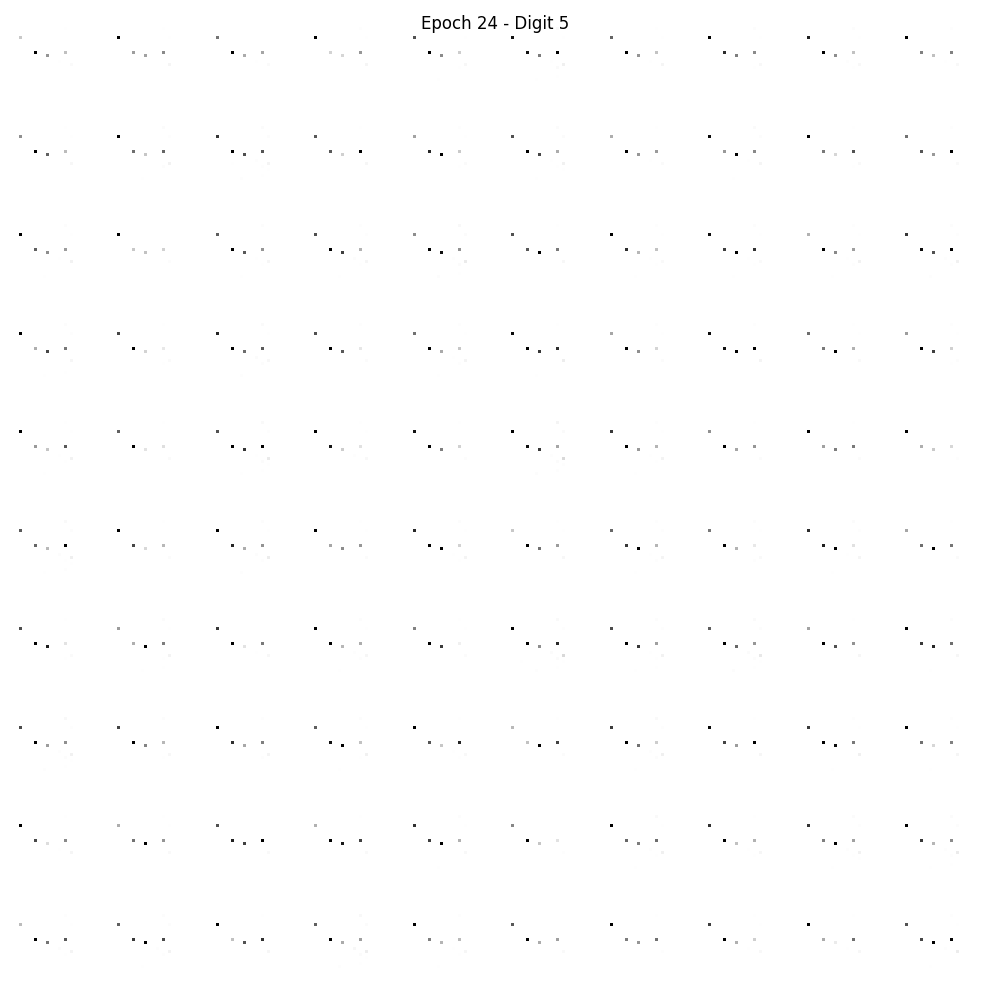

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.949050903320312, 17.306549072265625,

<Figure size 640x480 with 0 Axes>

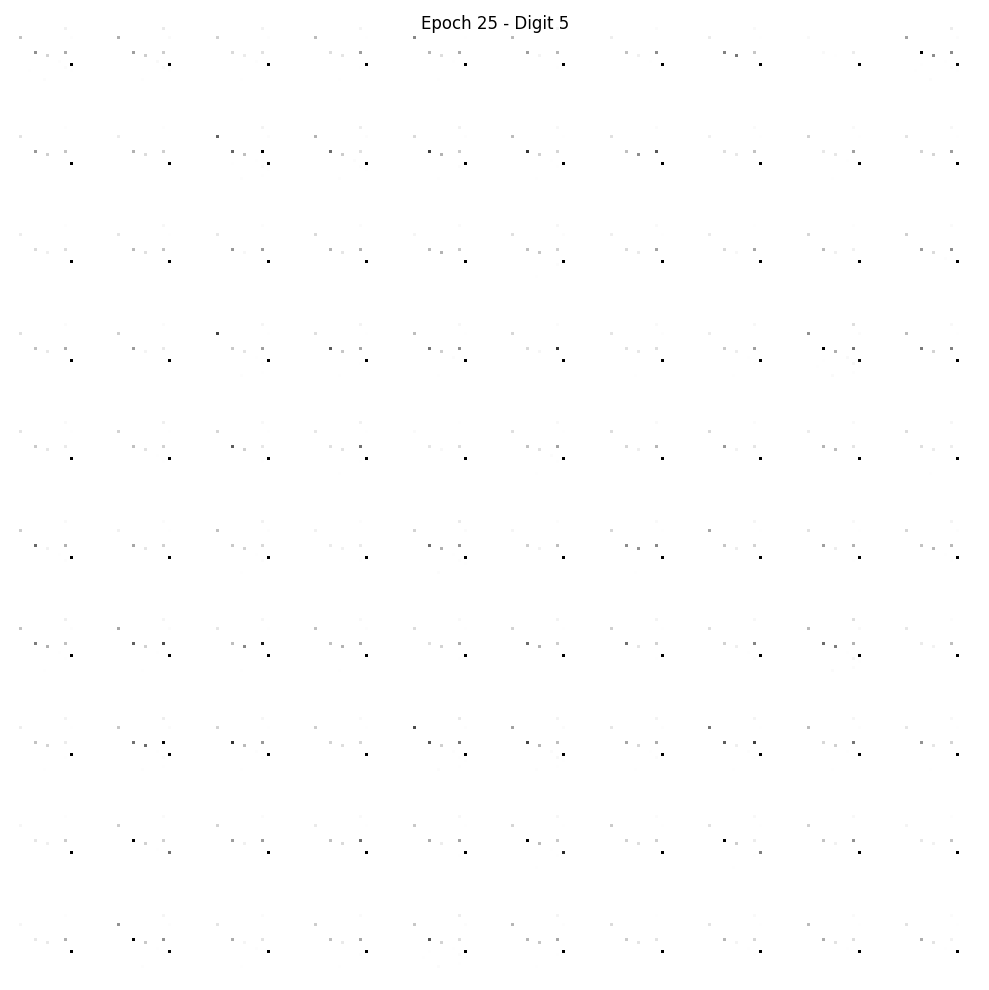

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.293195724487305, 16.9490509033203

<Figure size 640x480 with 0 Axes>

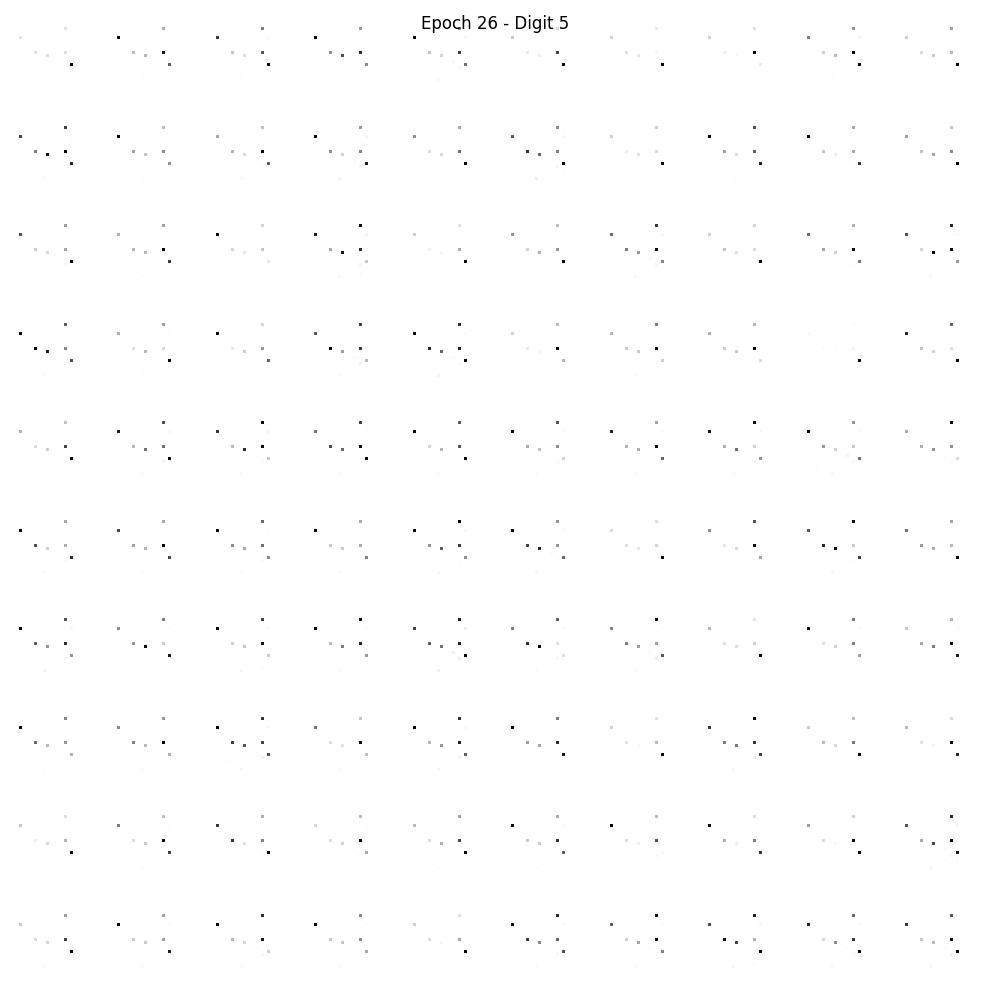

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161376953125, 17.2931957244

<Figure size 640x480 with 0 Axes>

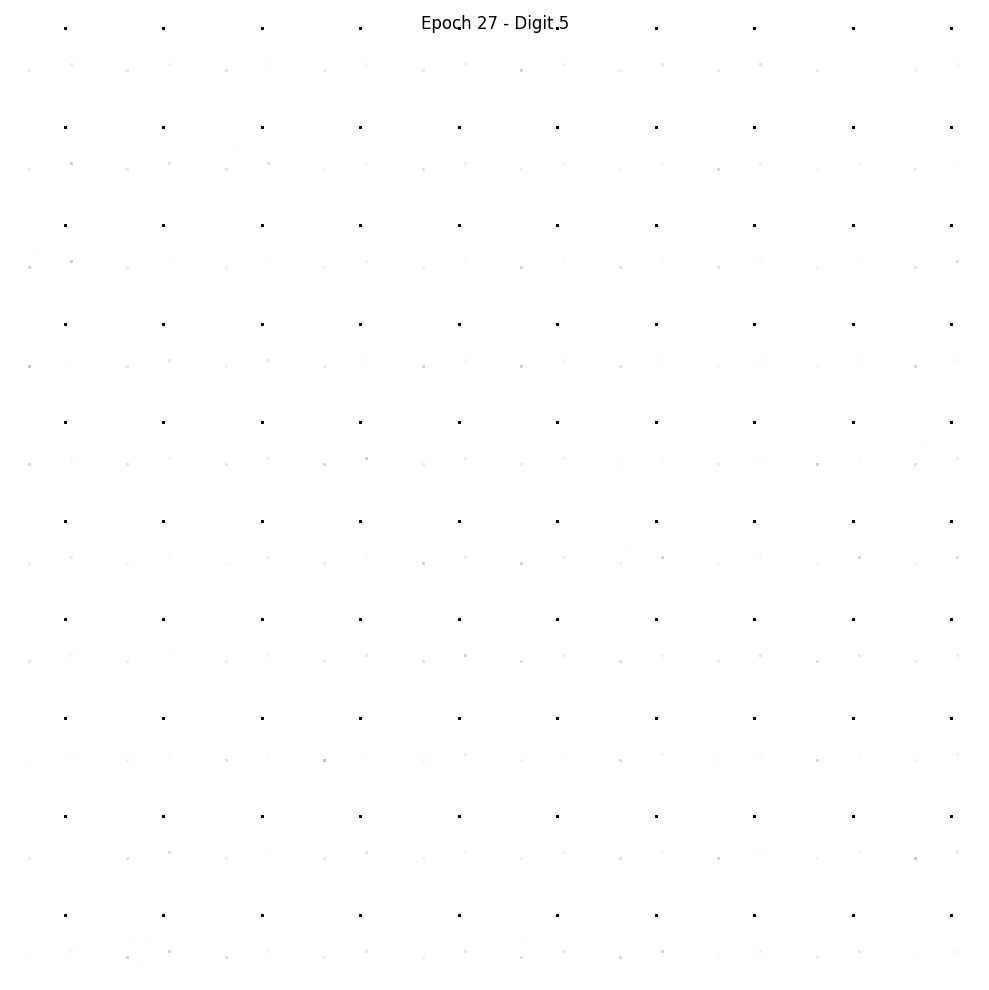

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.867046356201172, 16.4161

<Figure size 640x480 with 0 Axes>

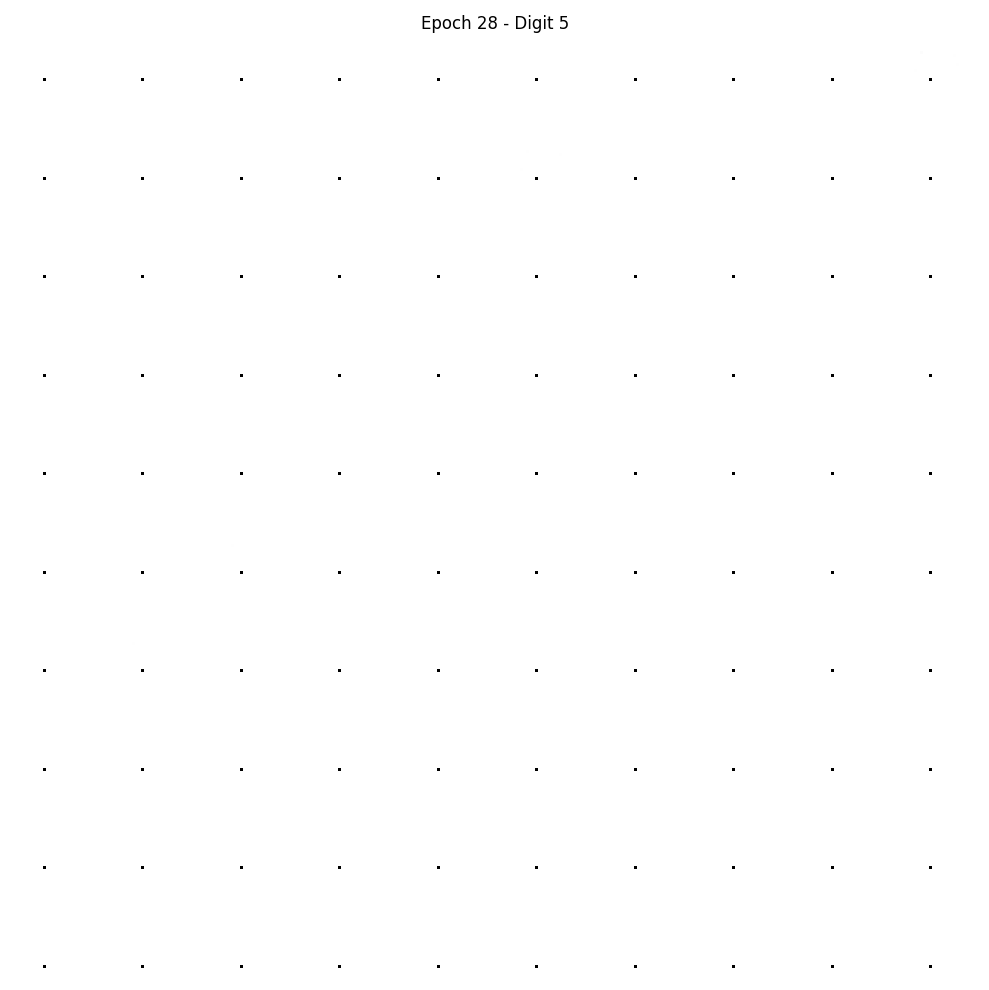

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629, 15.715774536132812, 15.

<Figure size 640x480 with 0 Axes>

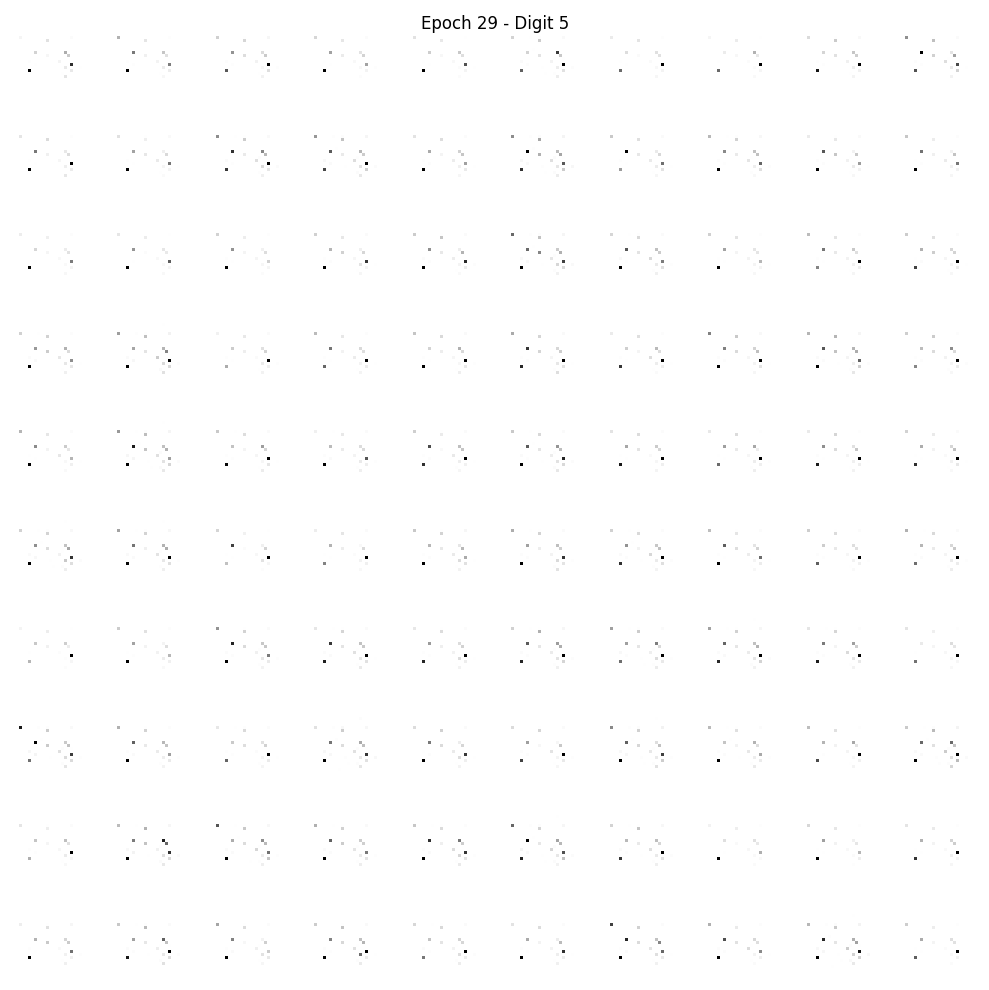

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.965752601623535, 14.829422950744629,

<Figure size 640x480 with 0 Axes>

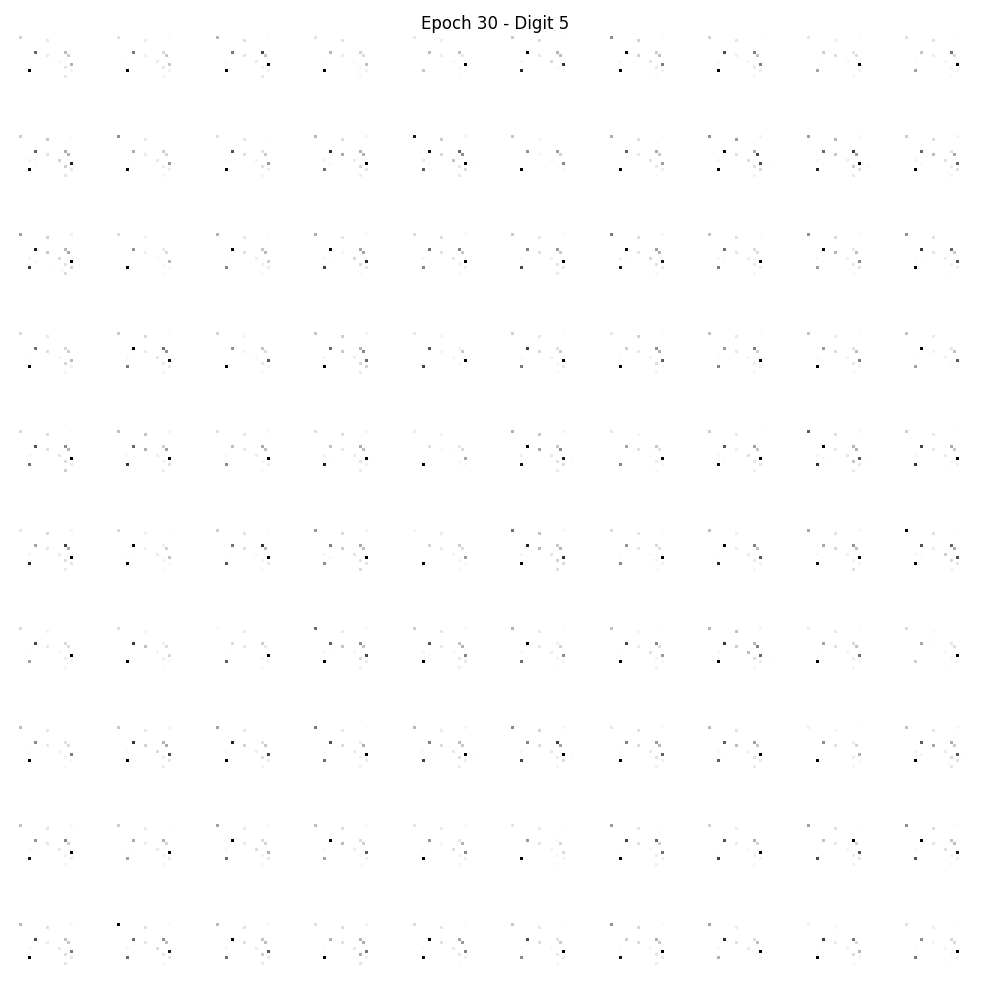

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397644043, 15.9657526016235

<Figure size 640x480 with 0 Axes>

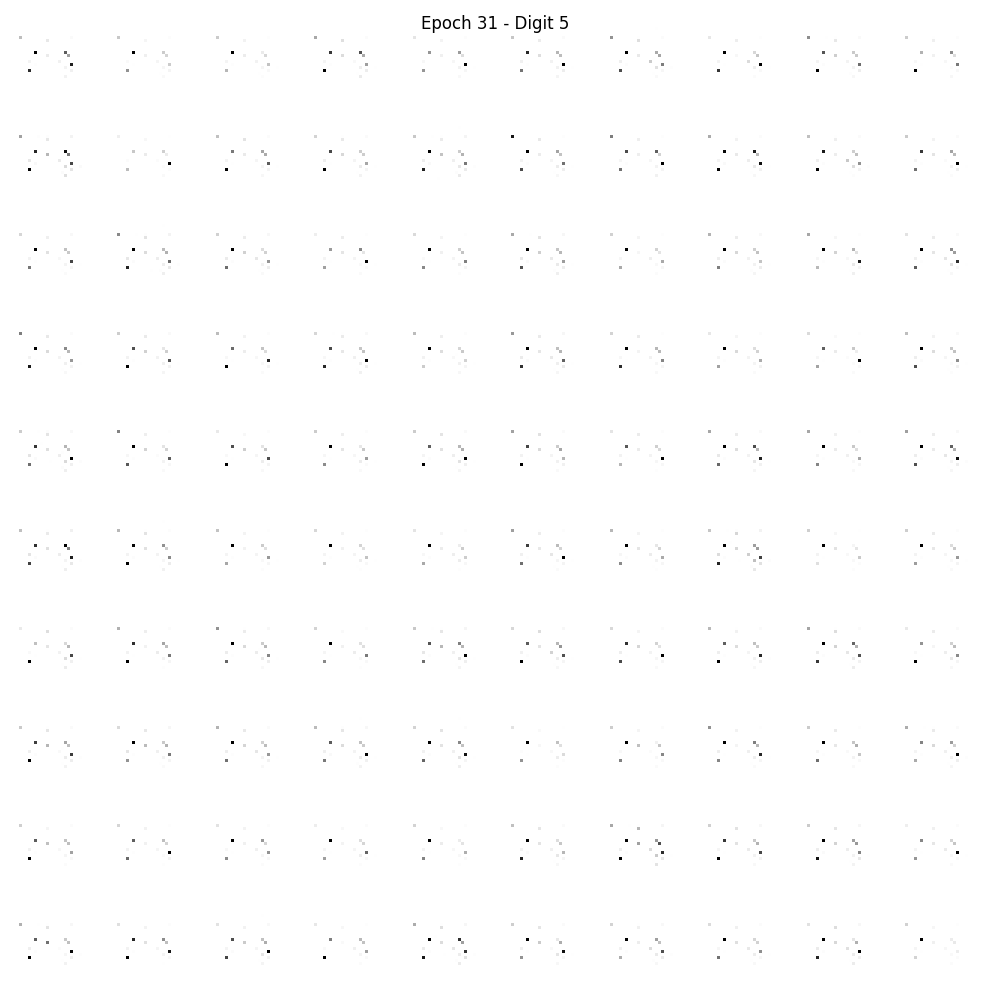

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.752654075622559, 14.733790397

<Figure size 640x480 with 0 Axes>

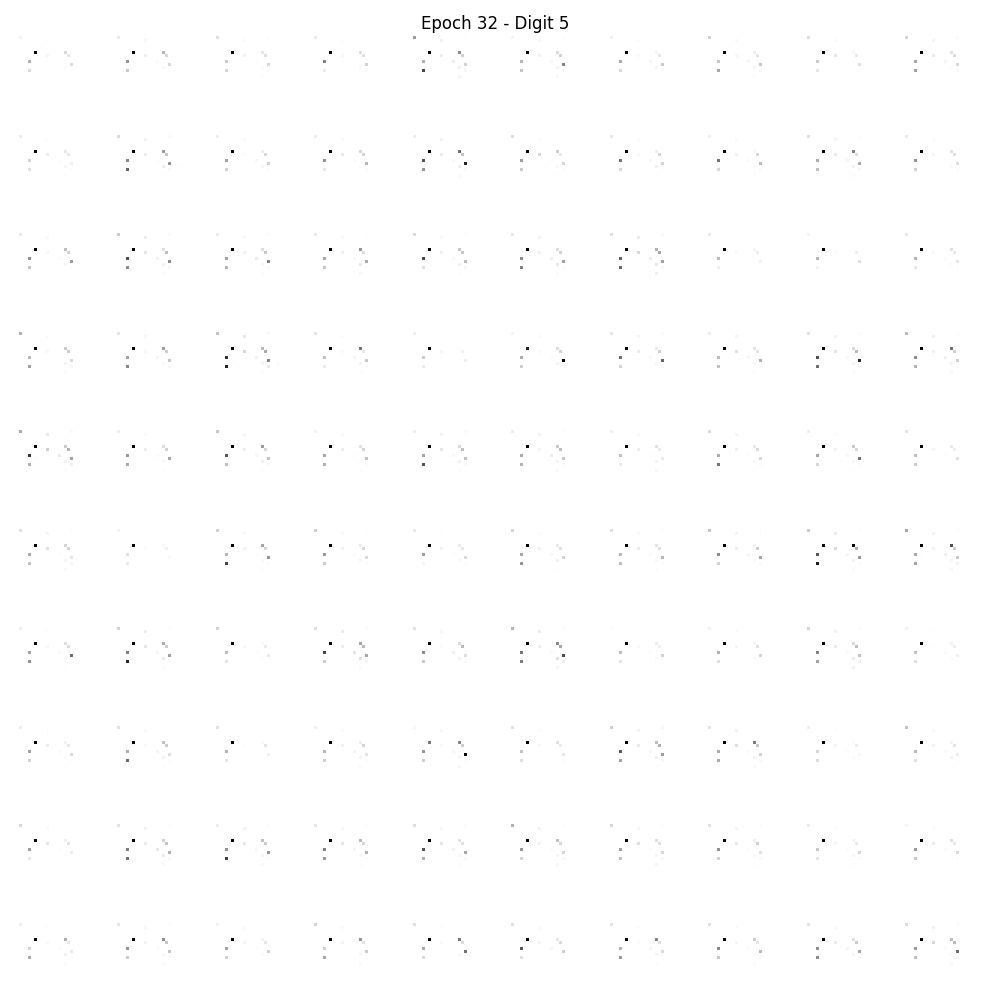

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.966175079345703, 12.75265

<Figure size 640x480 with 0 Axes>

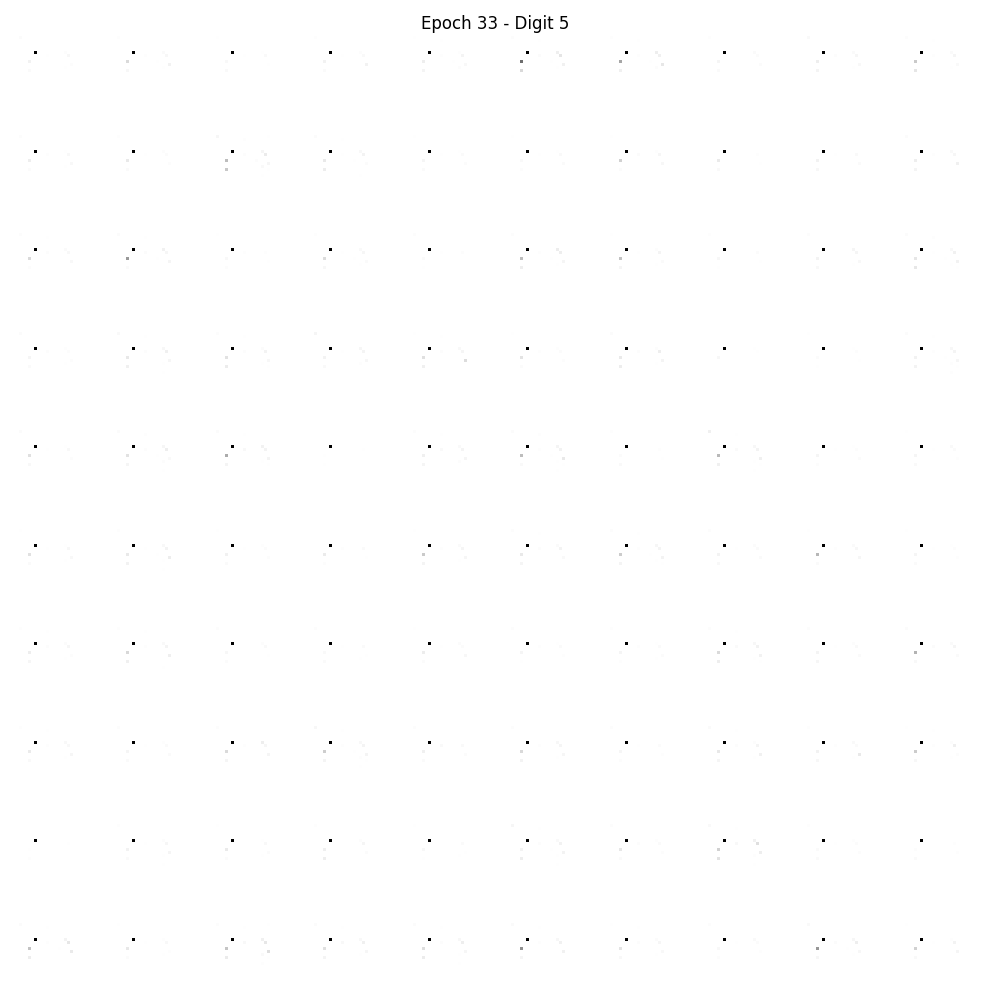

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023, 14.9800386428833, 15.96

<Figure size 640x480 with 0 Axes>

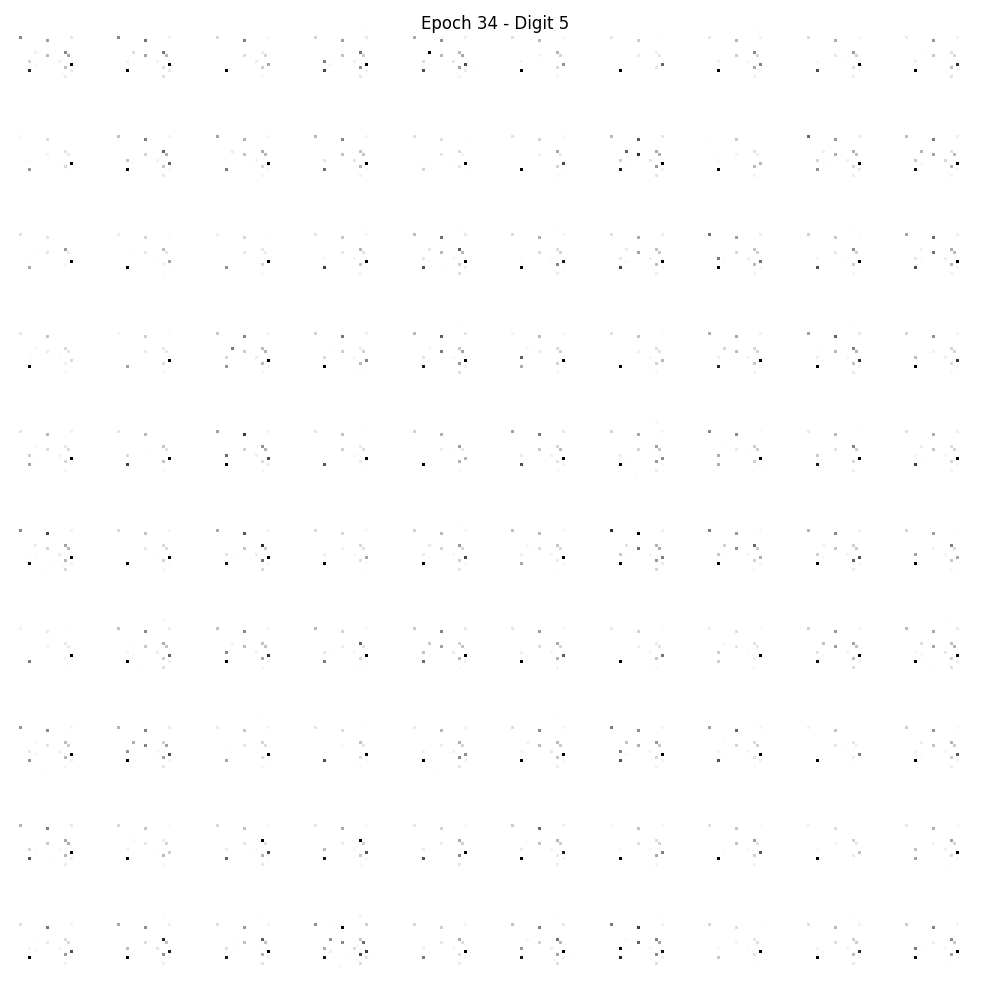

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.250330924987793, 15.329381942749023,

<Figure size 640x480 with 0 Axes>

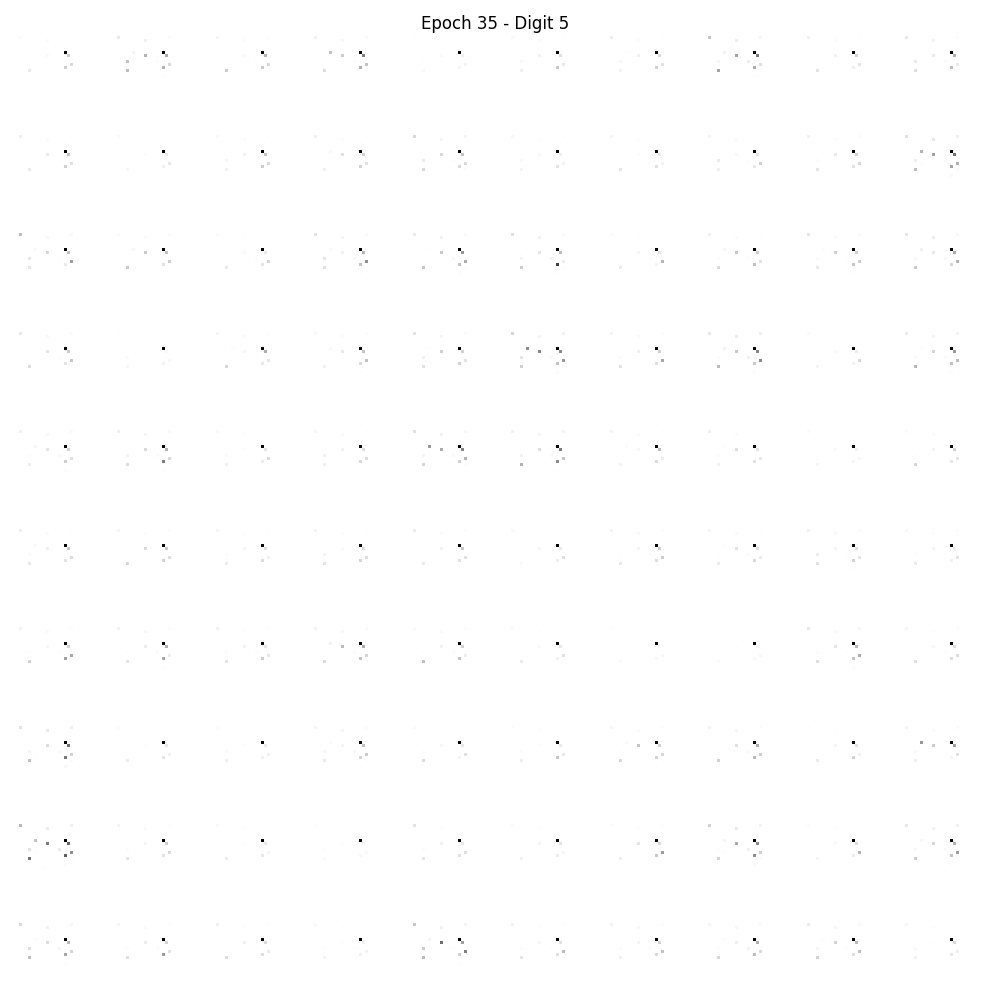

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.73573112487793, 15.2503309249877

<Figure size 640x480 with 0 Axes>

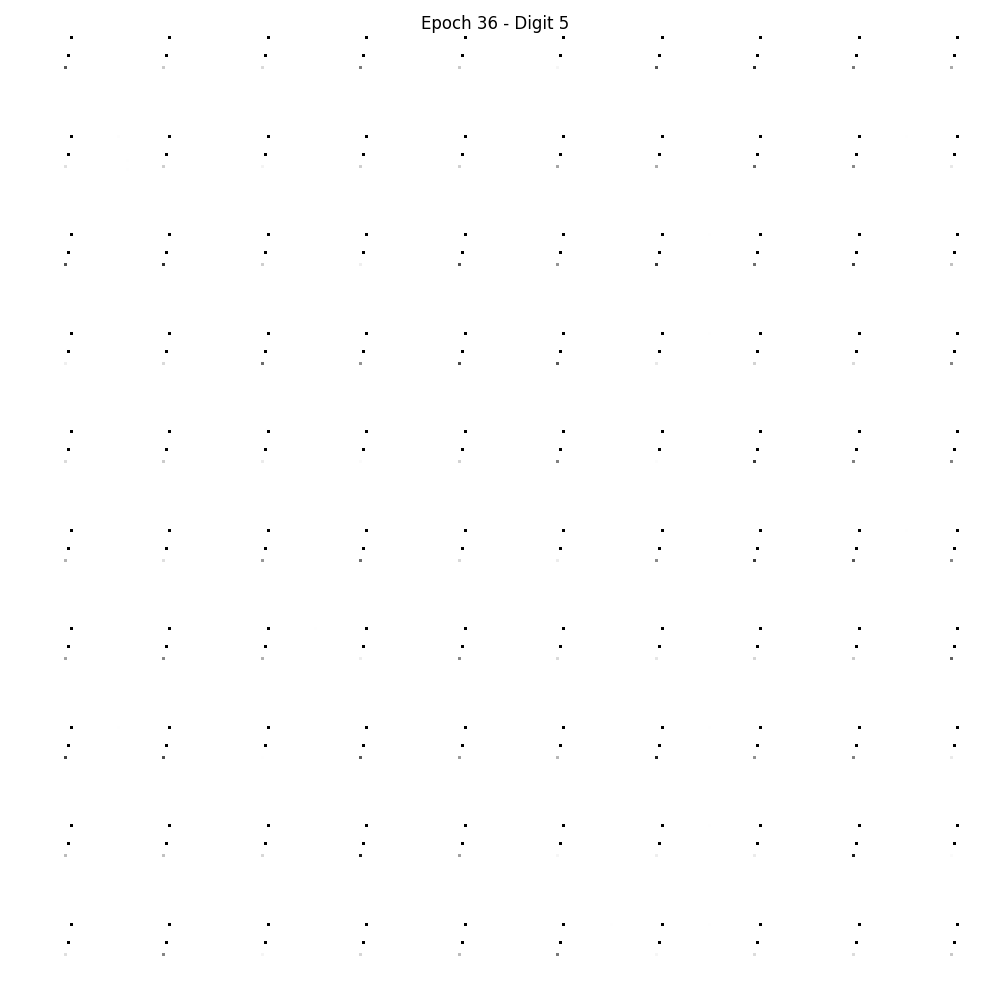

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334976196289, 14.735731124

<Figure size 640x480 with 0 Axes>

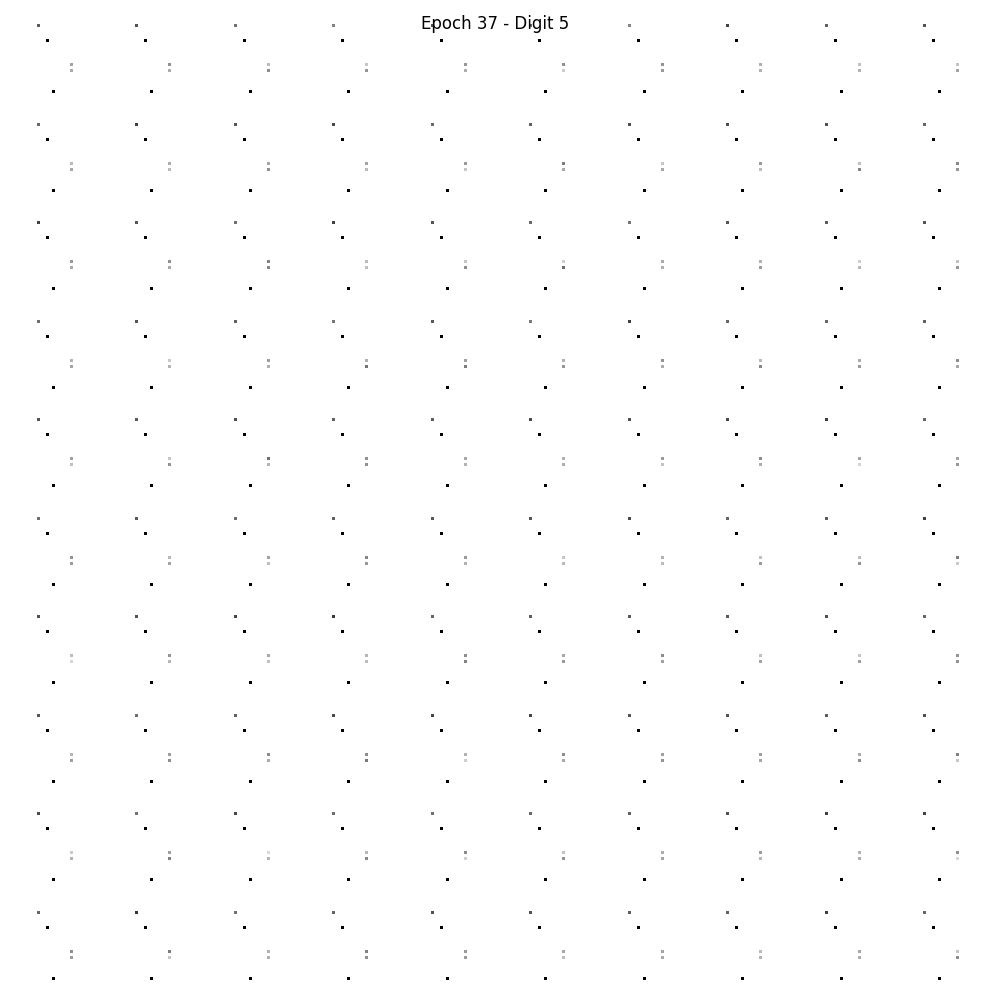

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393110275268555, 14.102334

<Figure size 640x480 with 0 Axes>

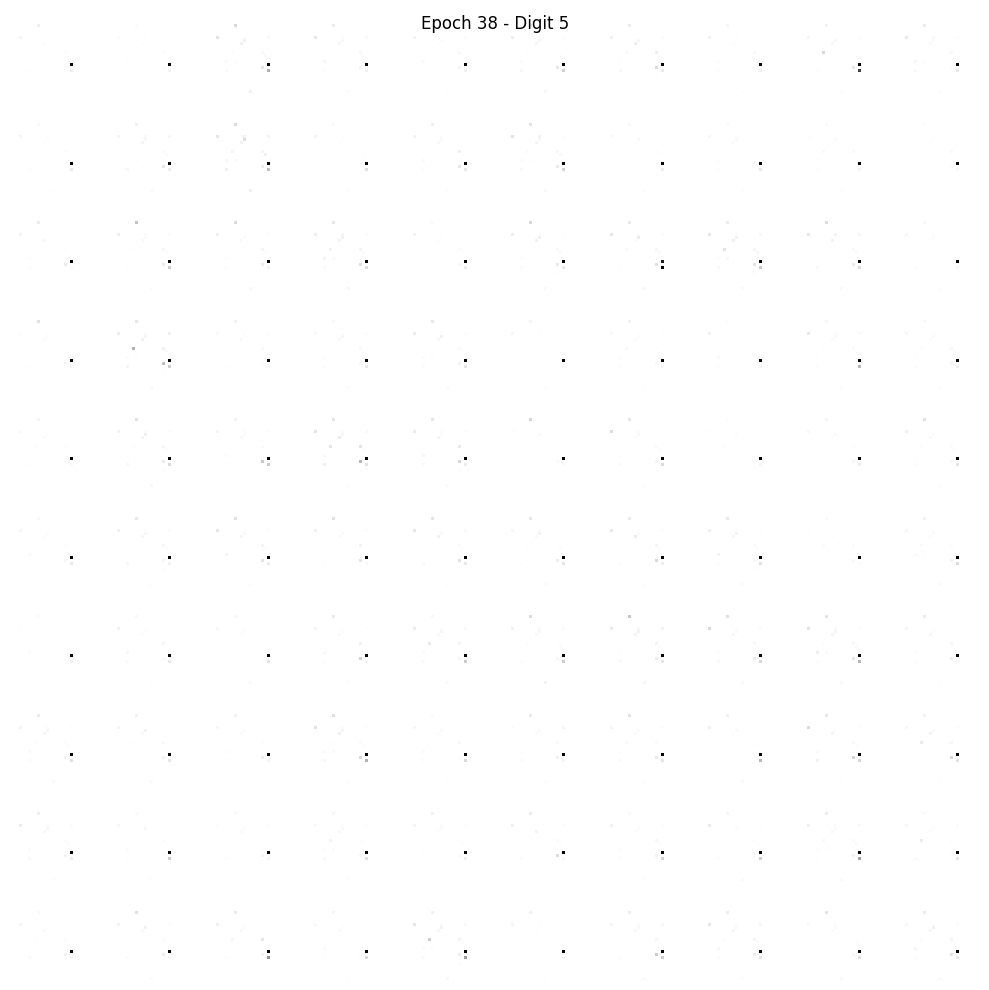

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.343860626220703, 14.393

<Figure size 640x480 with 0 Axes>

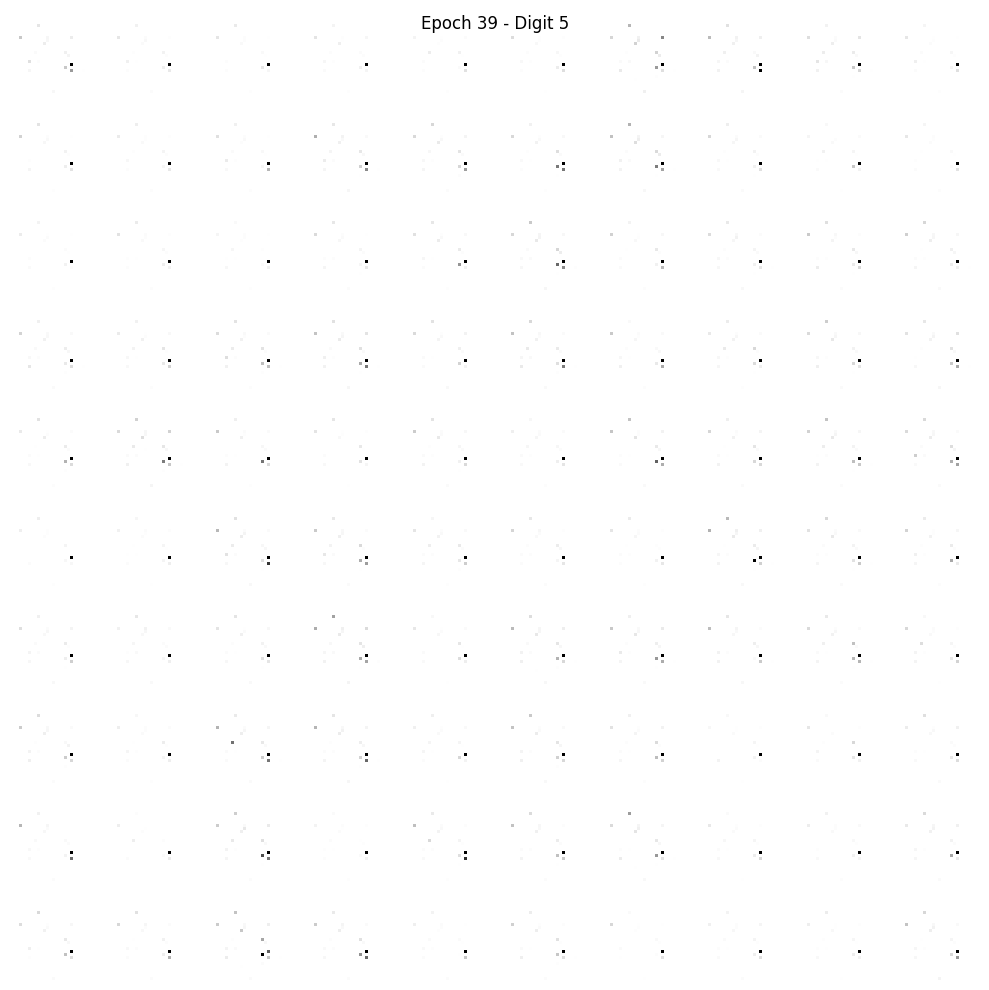

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10]
[9.148703575134277, 10.589561462402344, 11.699875831604004, 13.

<Figure size 640x480 with 0 Axes>

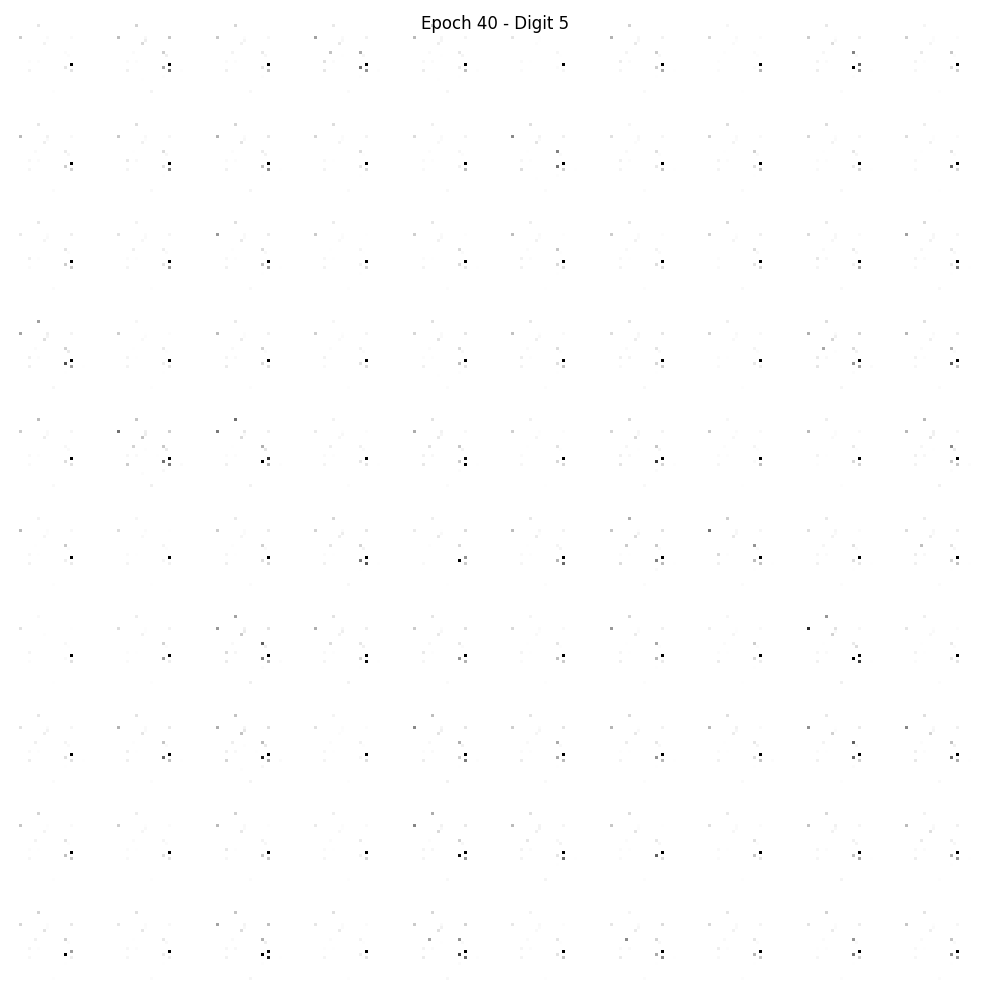

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10]
[9.148703575134277, 10.589561462402344, 

<Figure size 640x480 with 0 Axes>

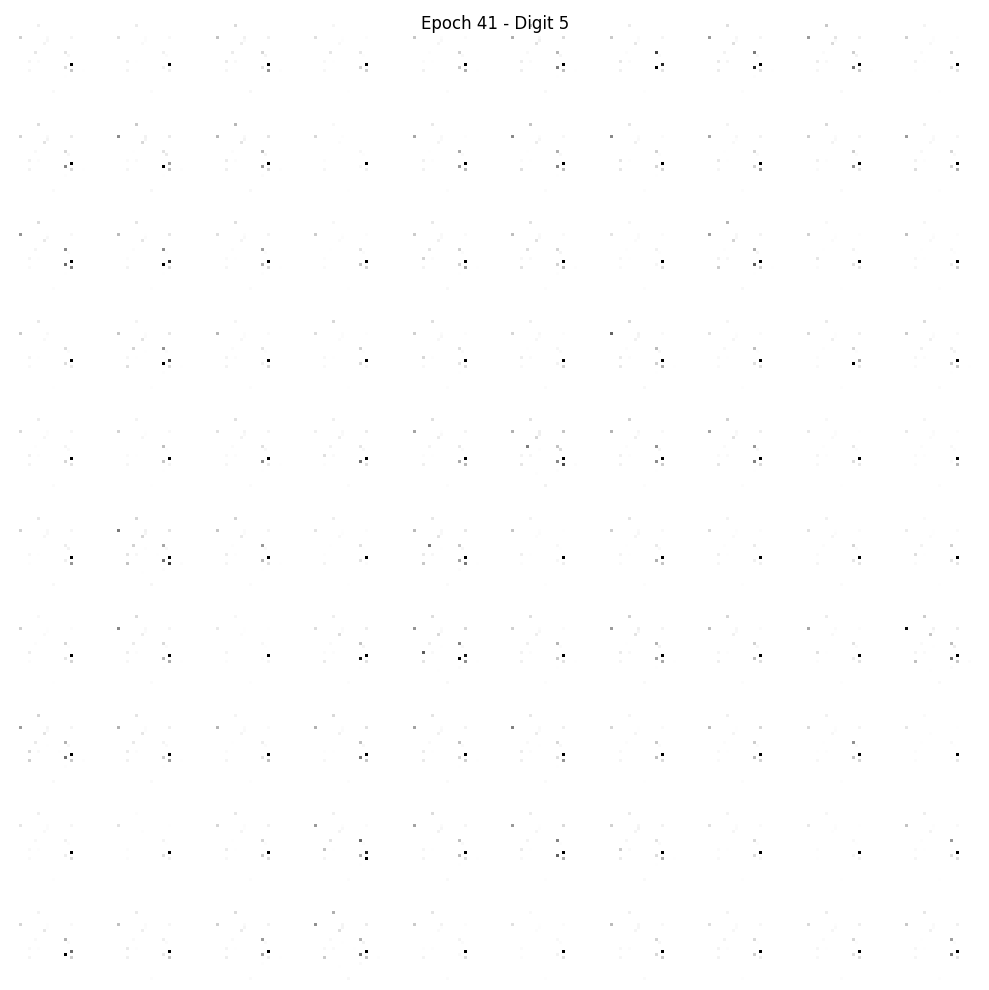

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10]
[9.14870357513427

<Figure size 640x480 with 0 Axes>

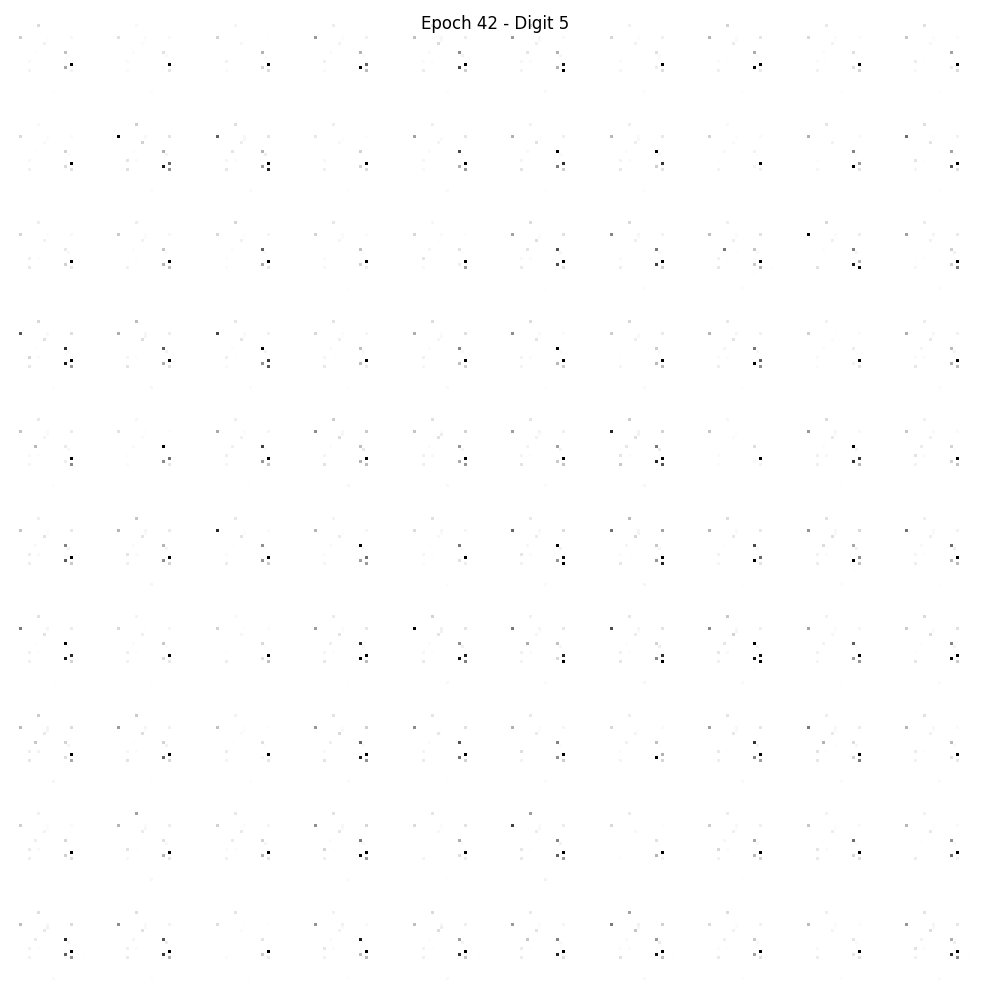

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

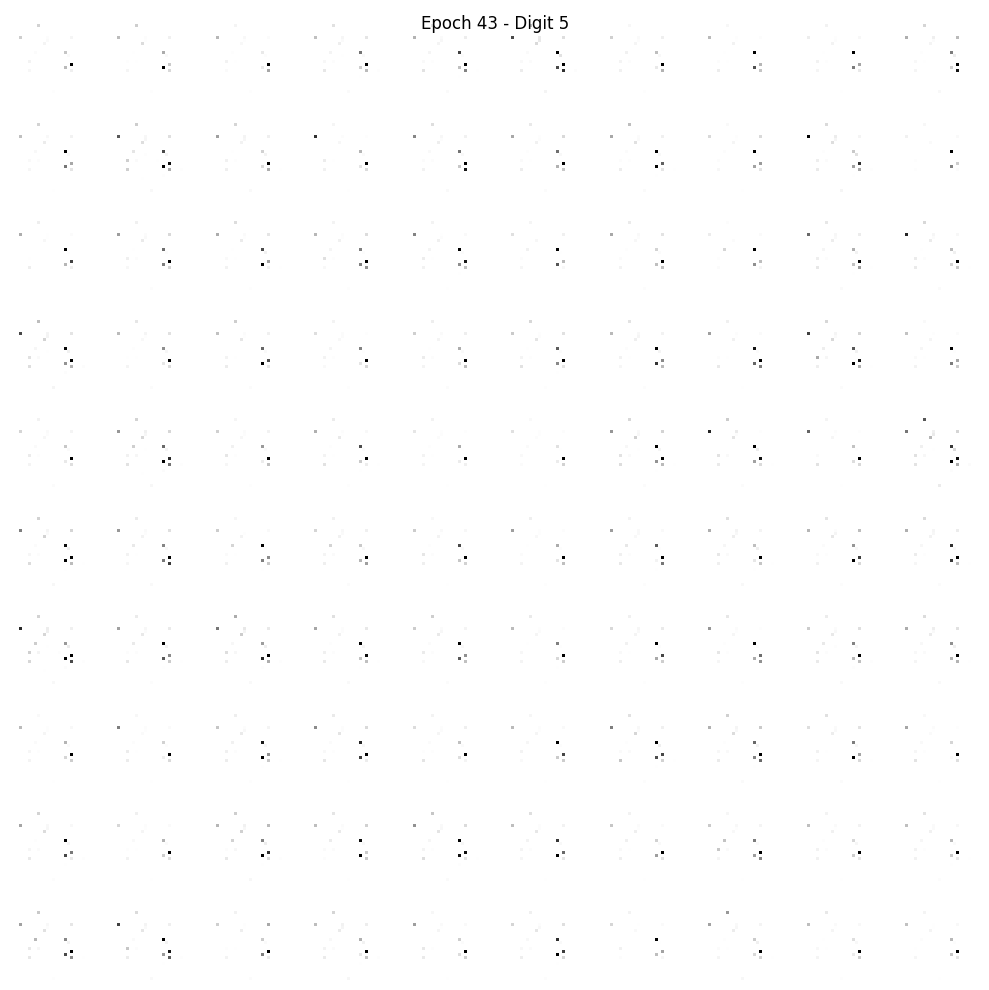

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

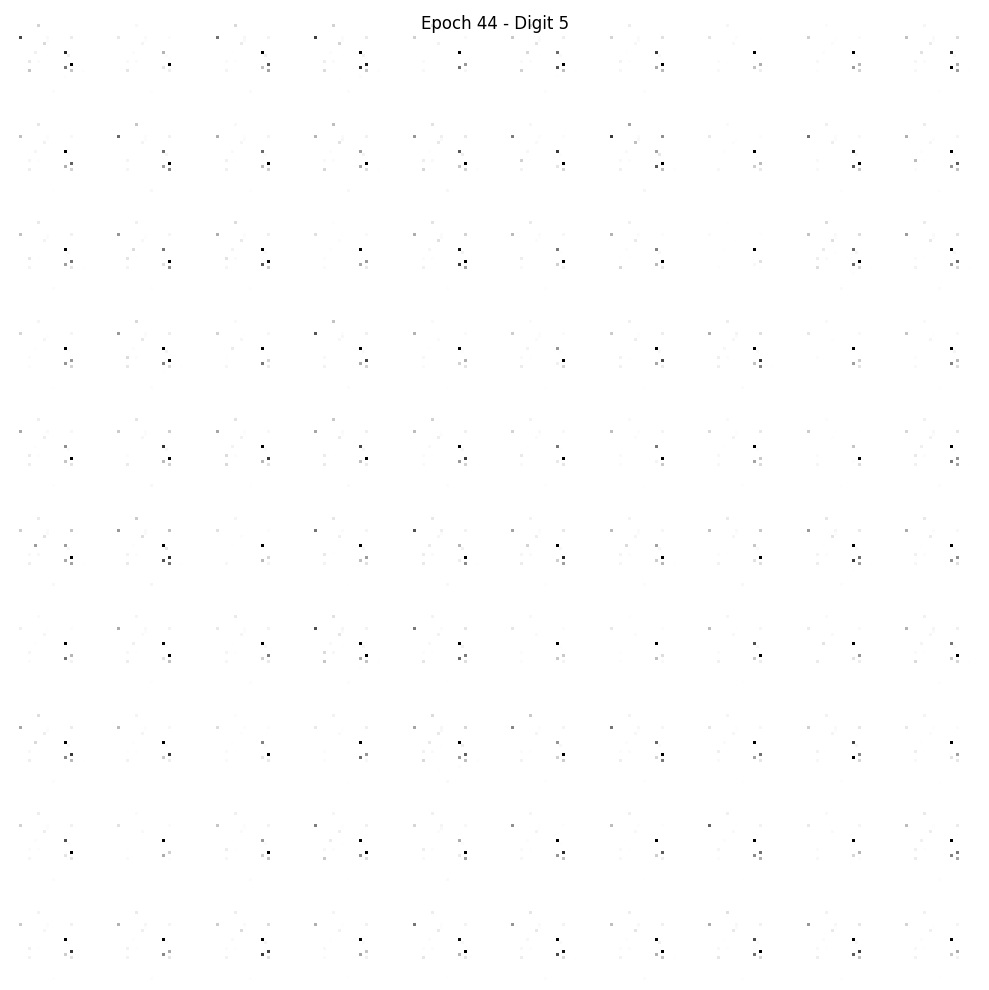

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

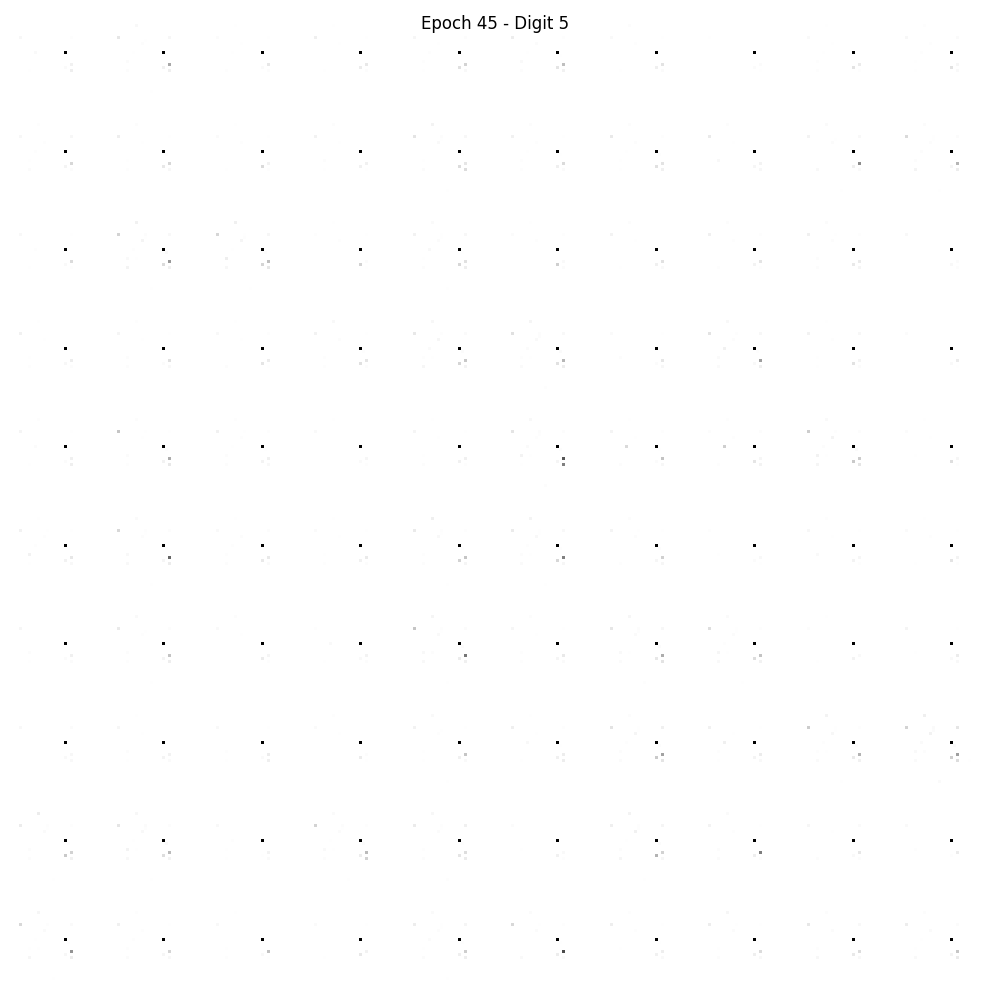

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

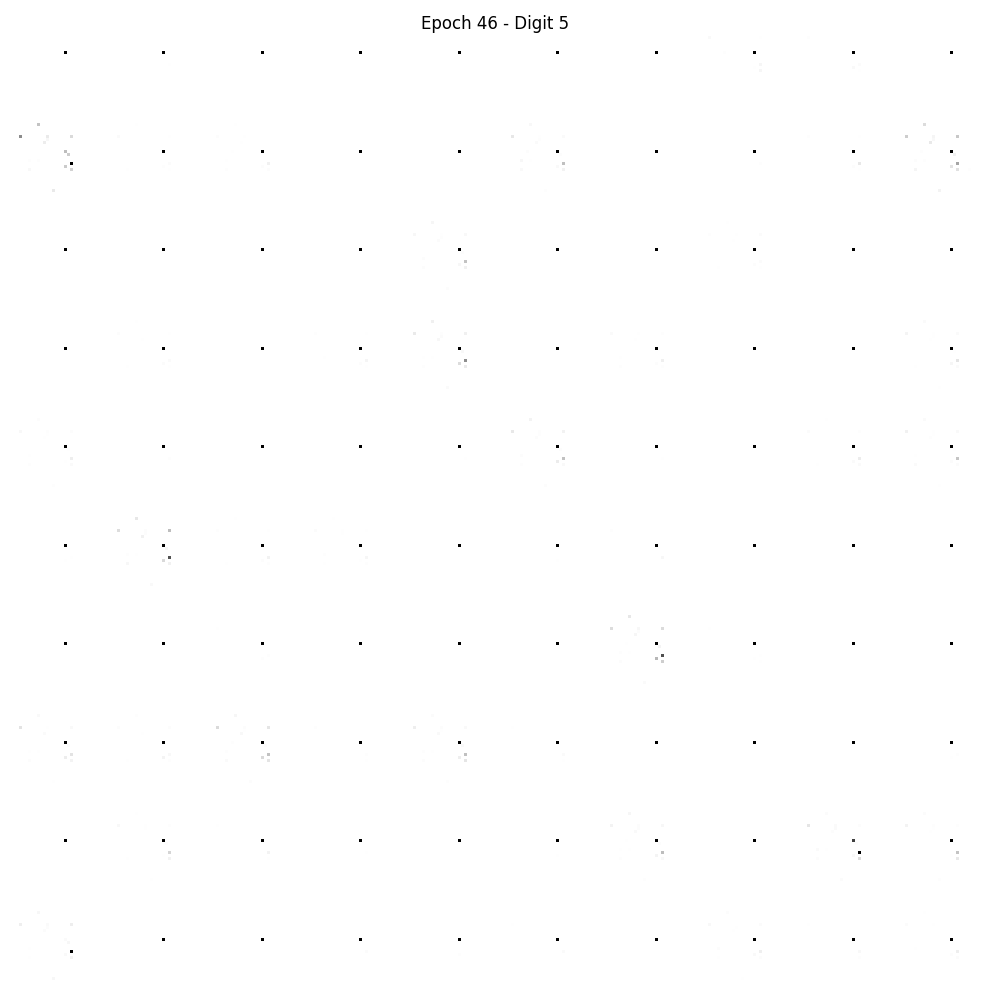

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

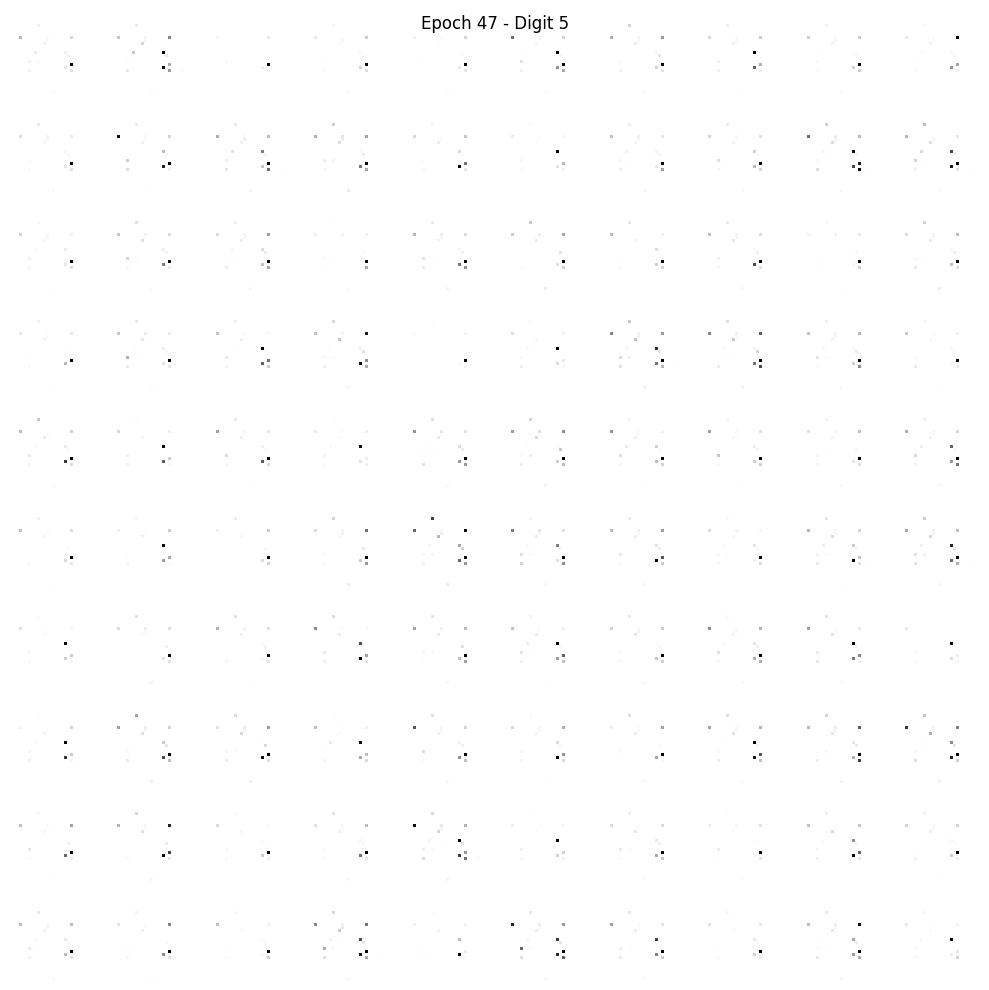

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

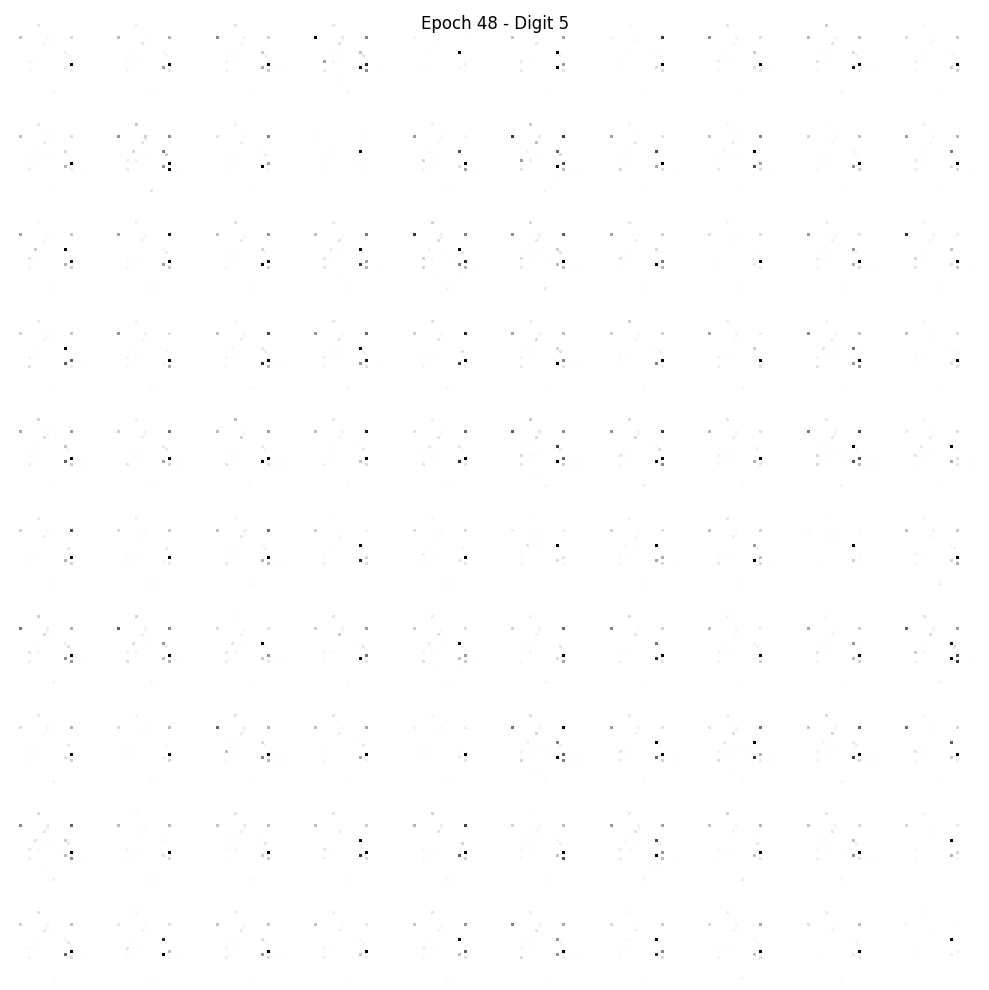

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

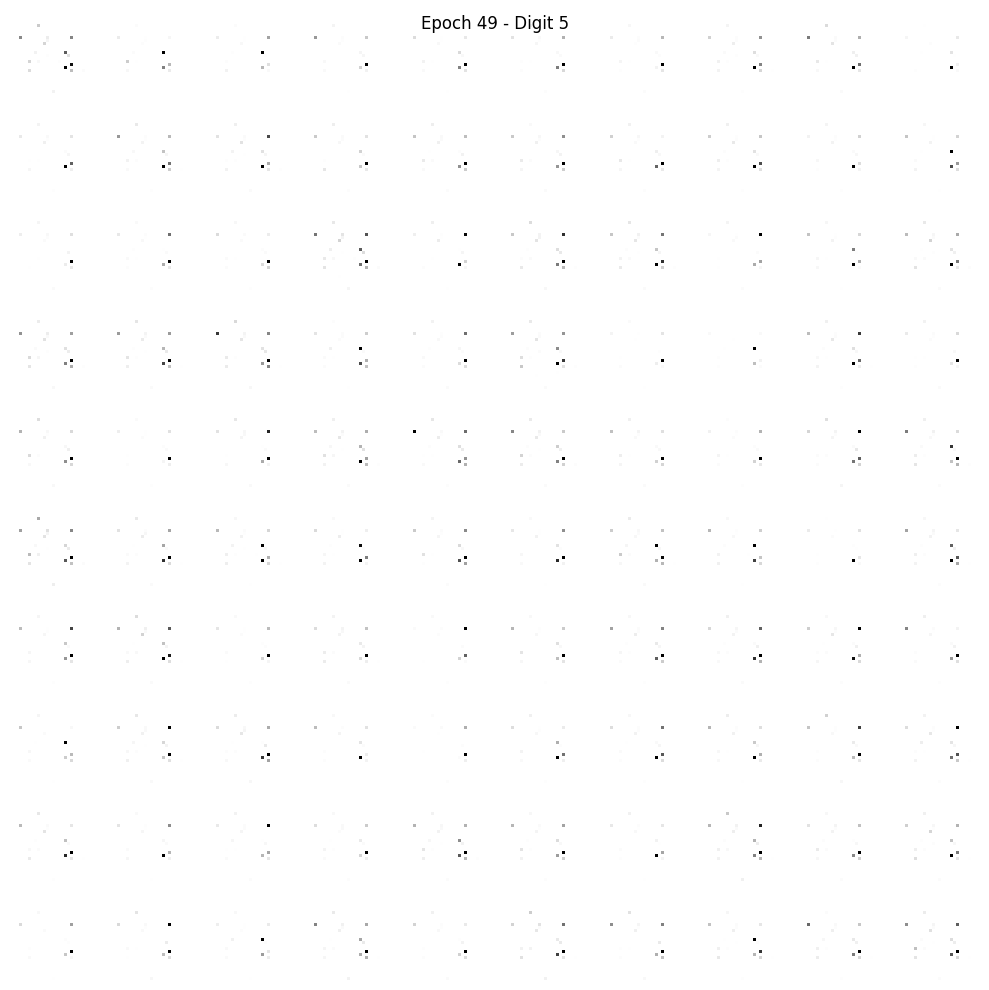

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

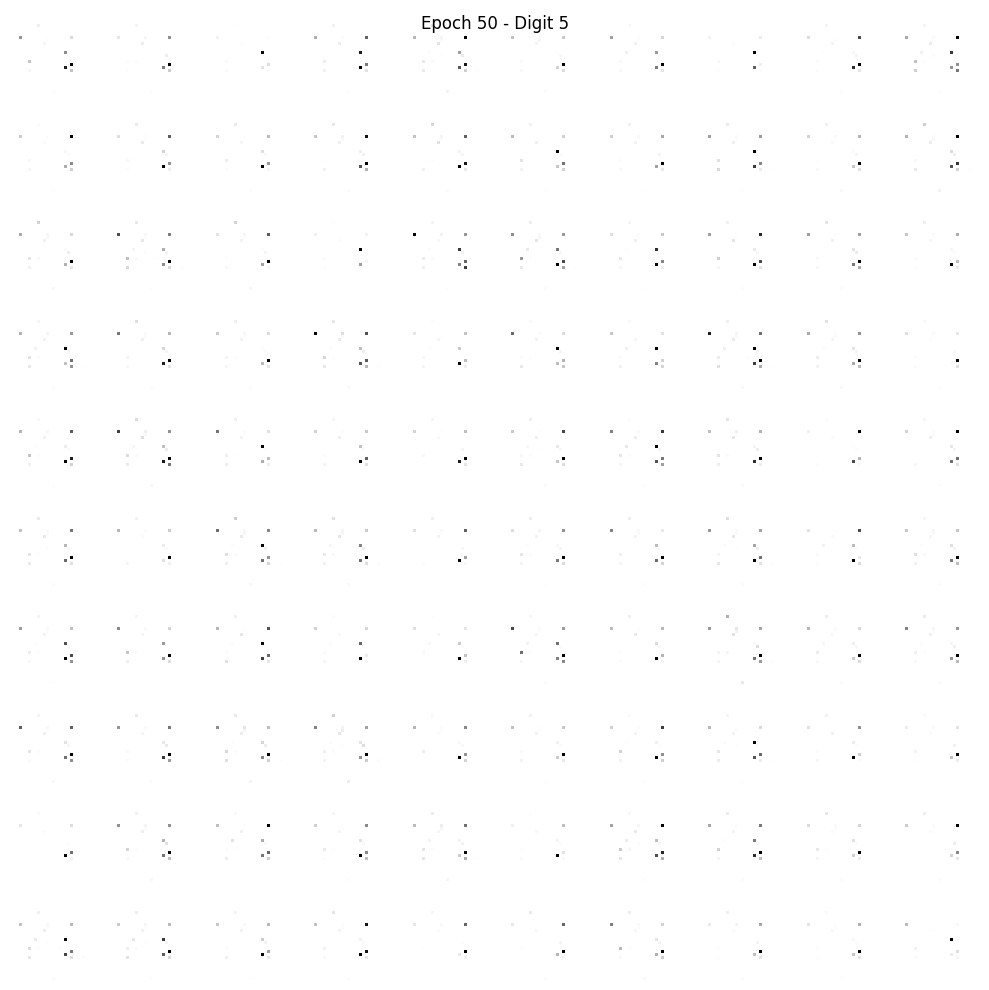

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

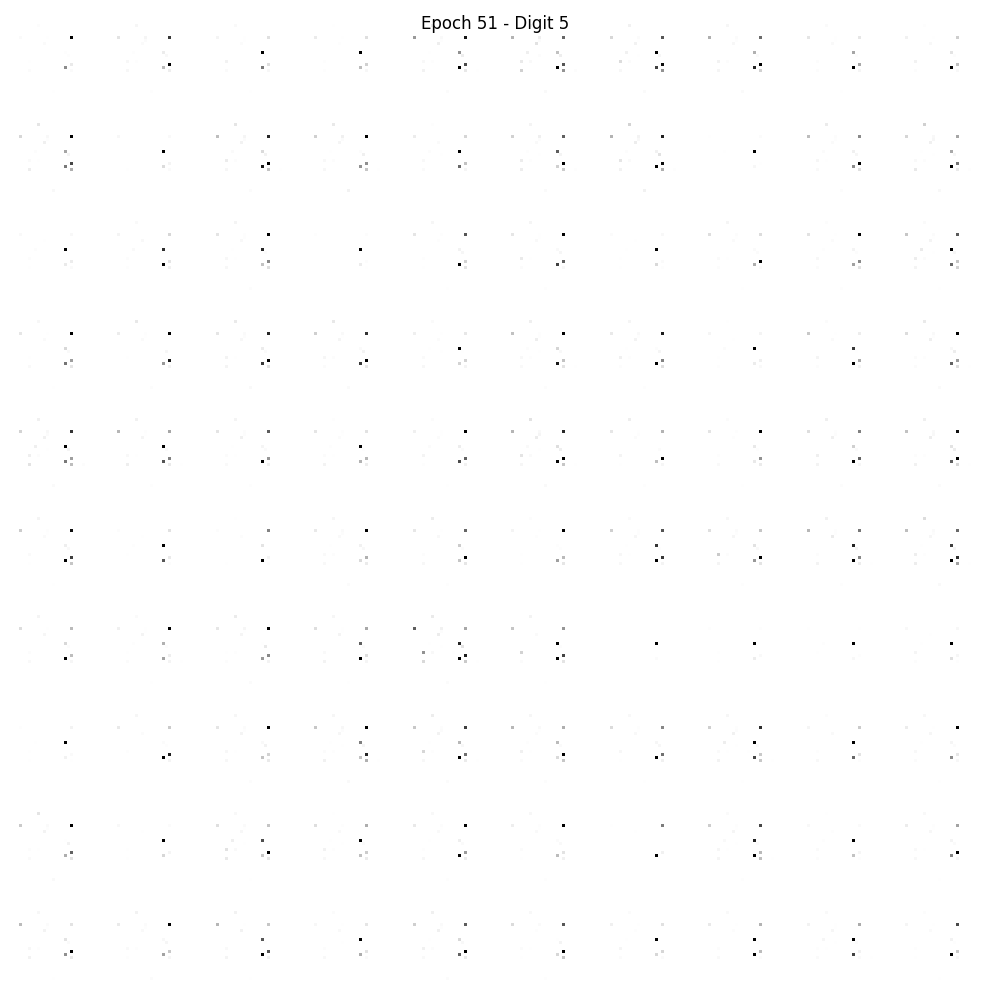

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

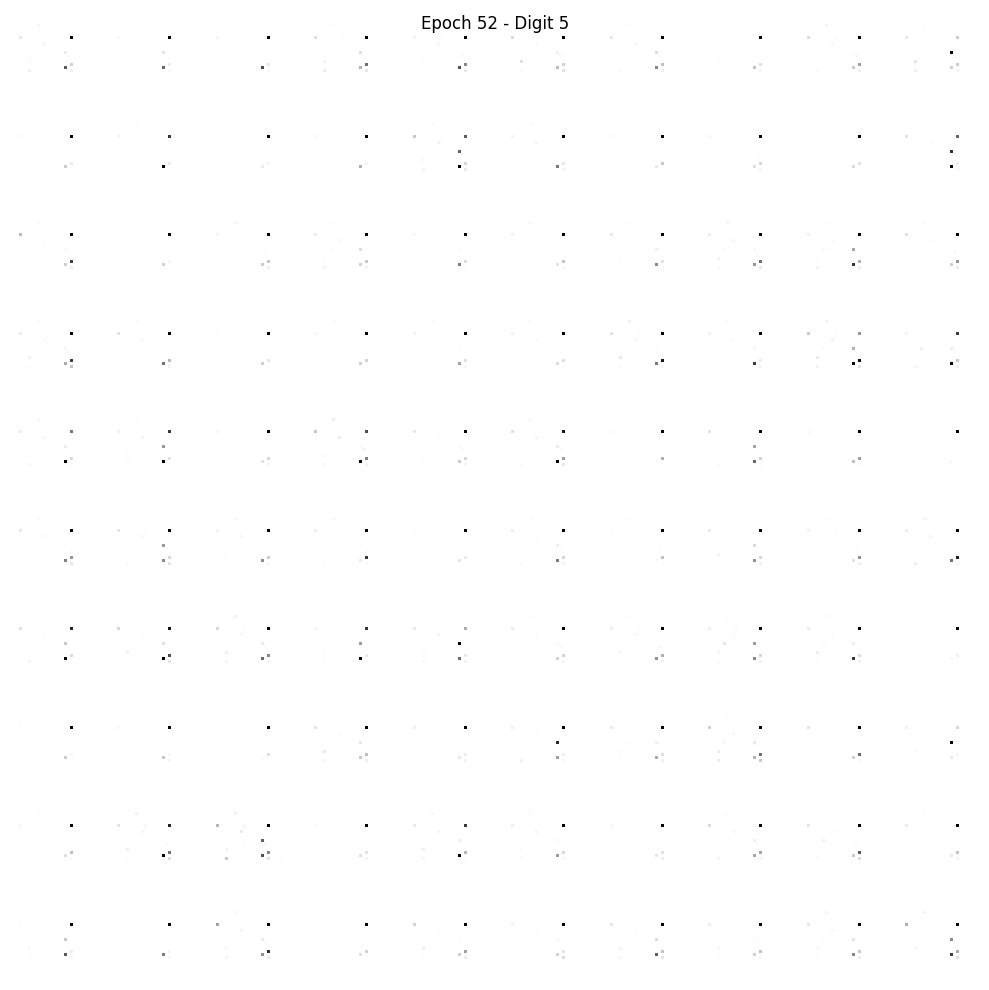

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

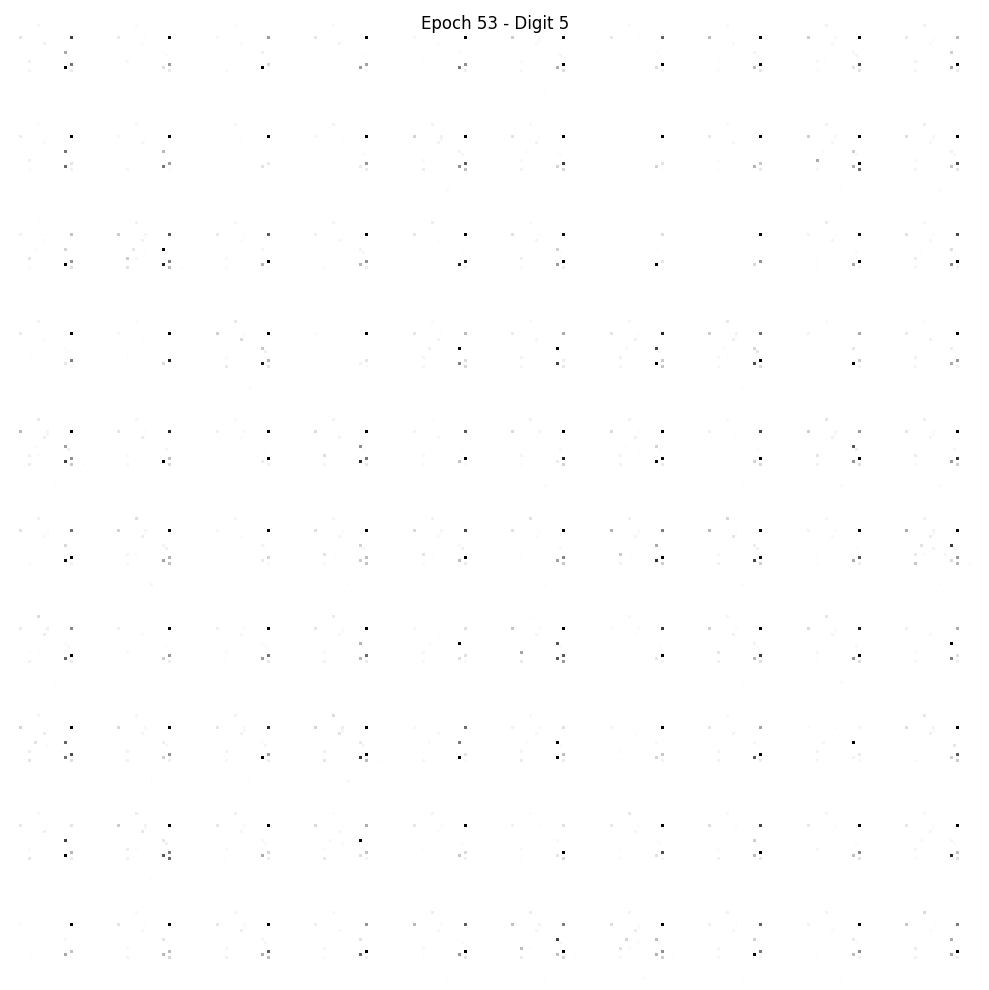

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

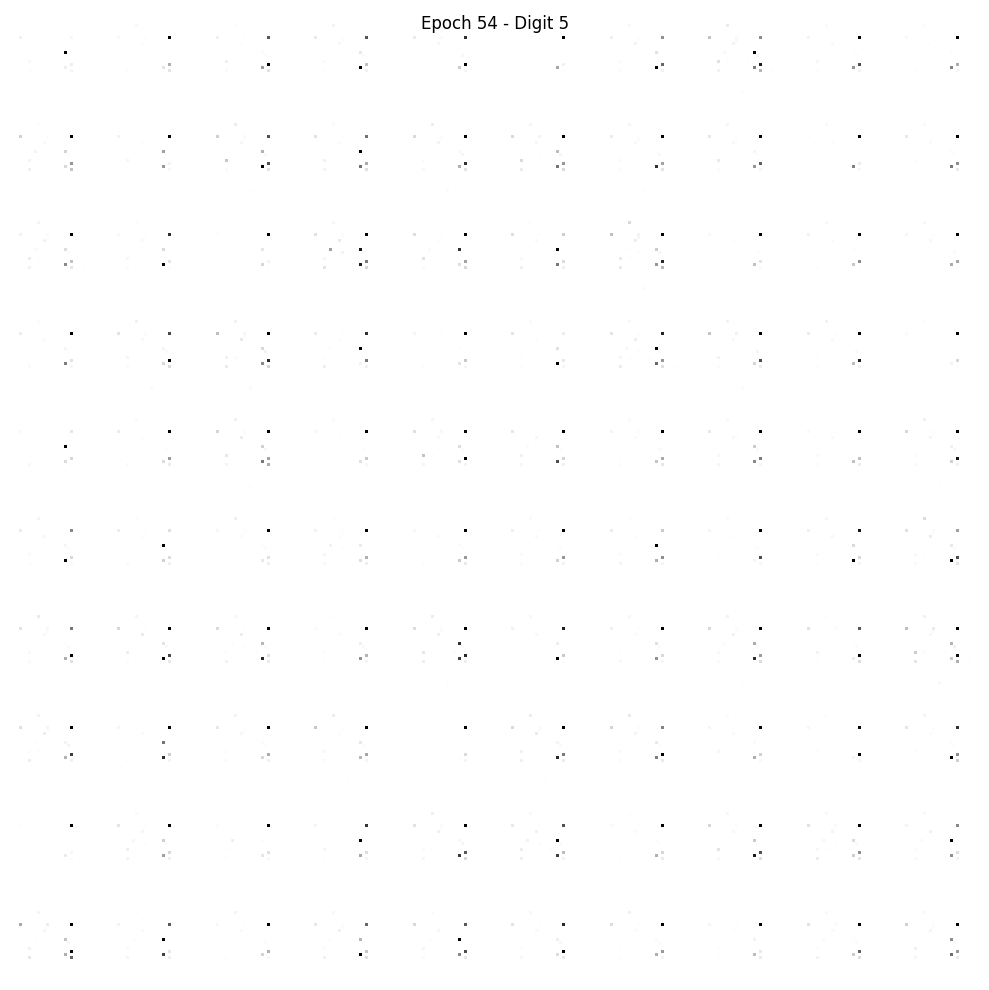

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

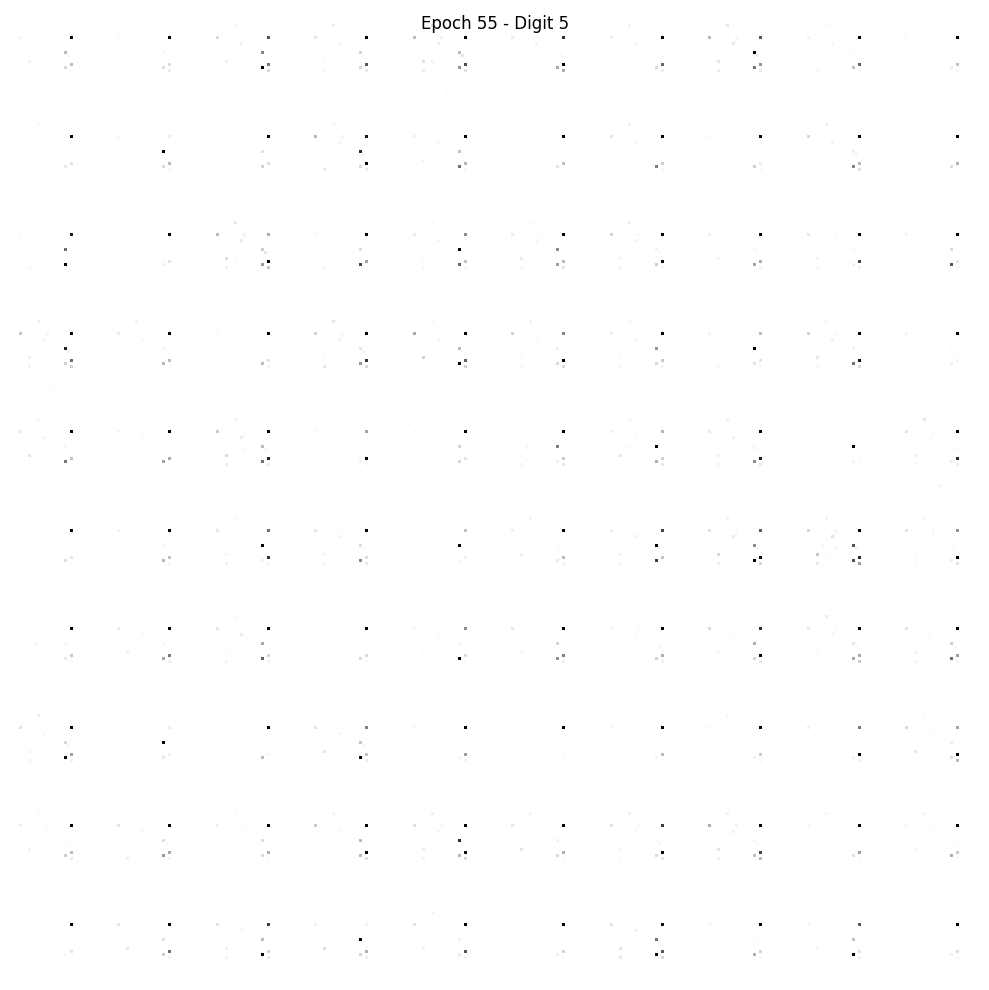

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

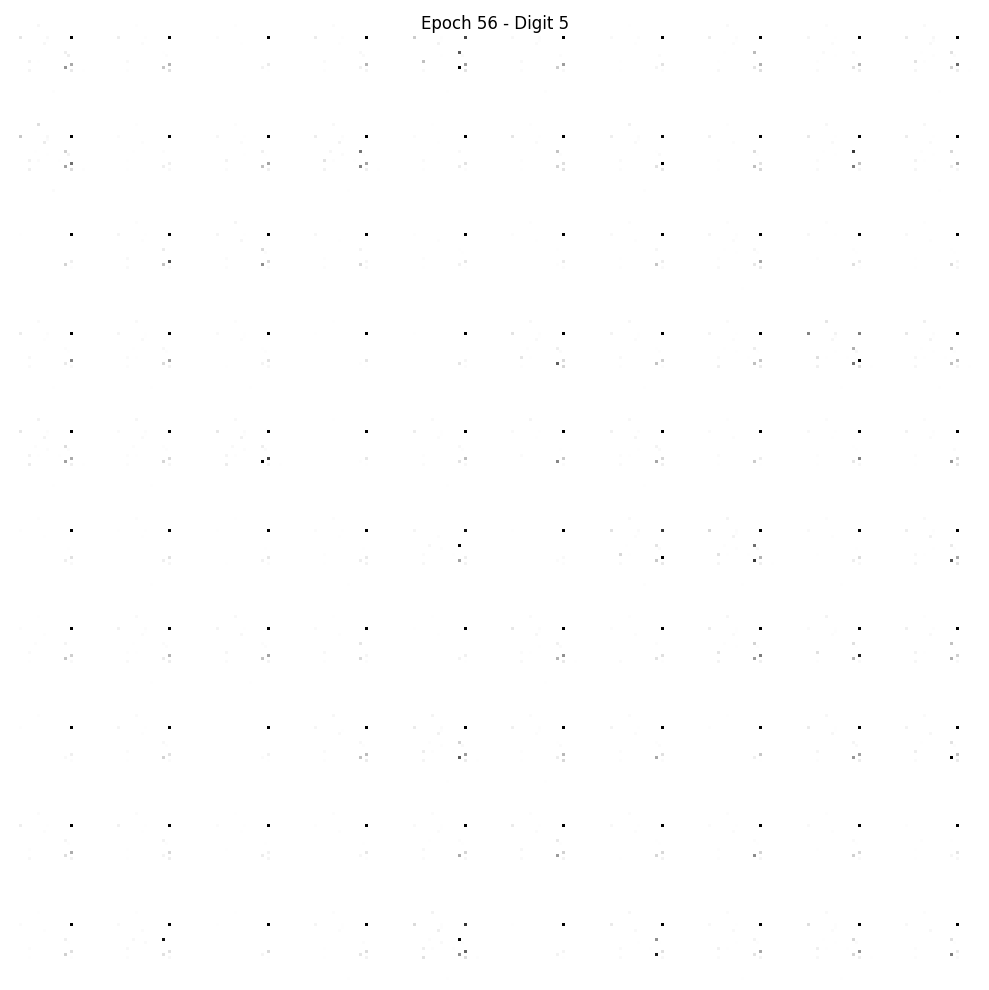

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

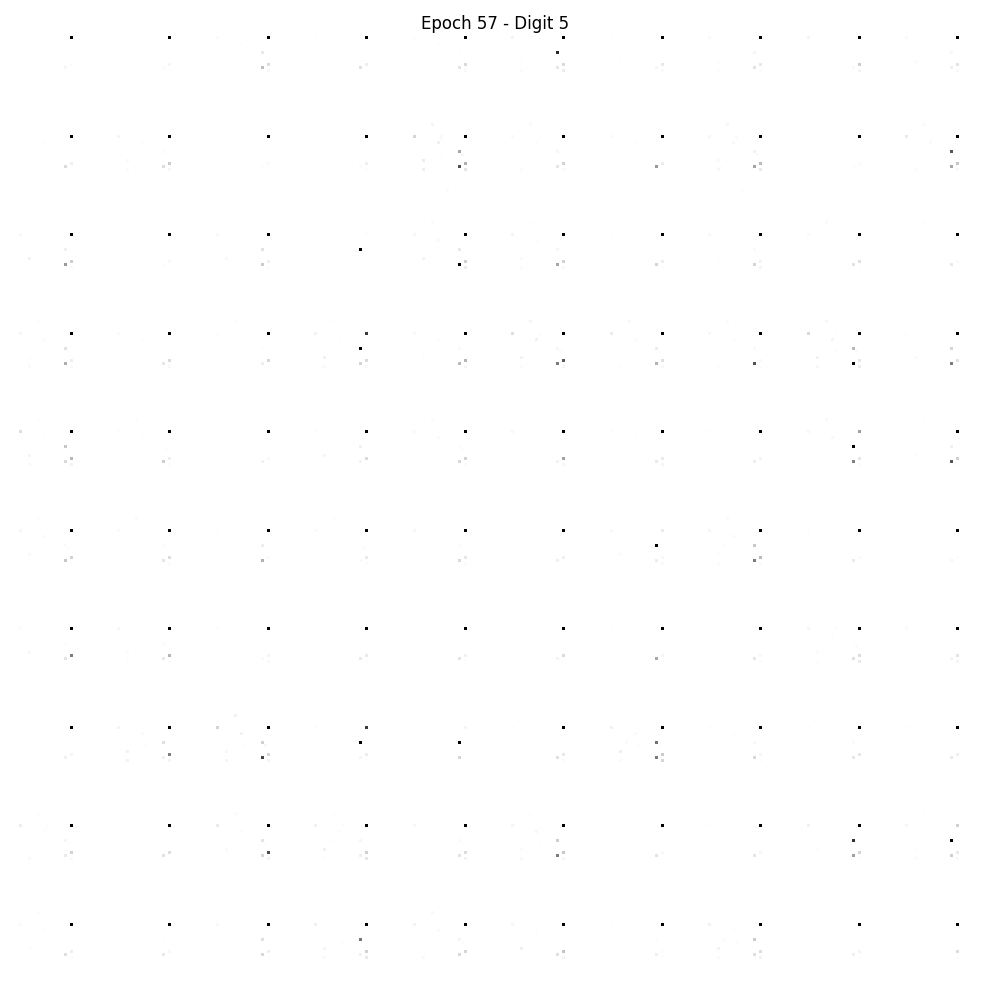

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

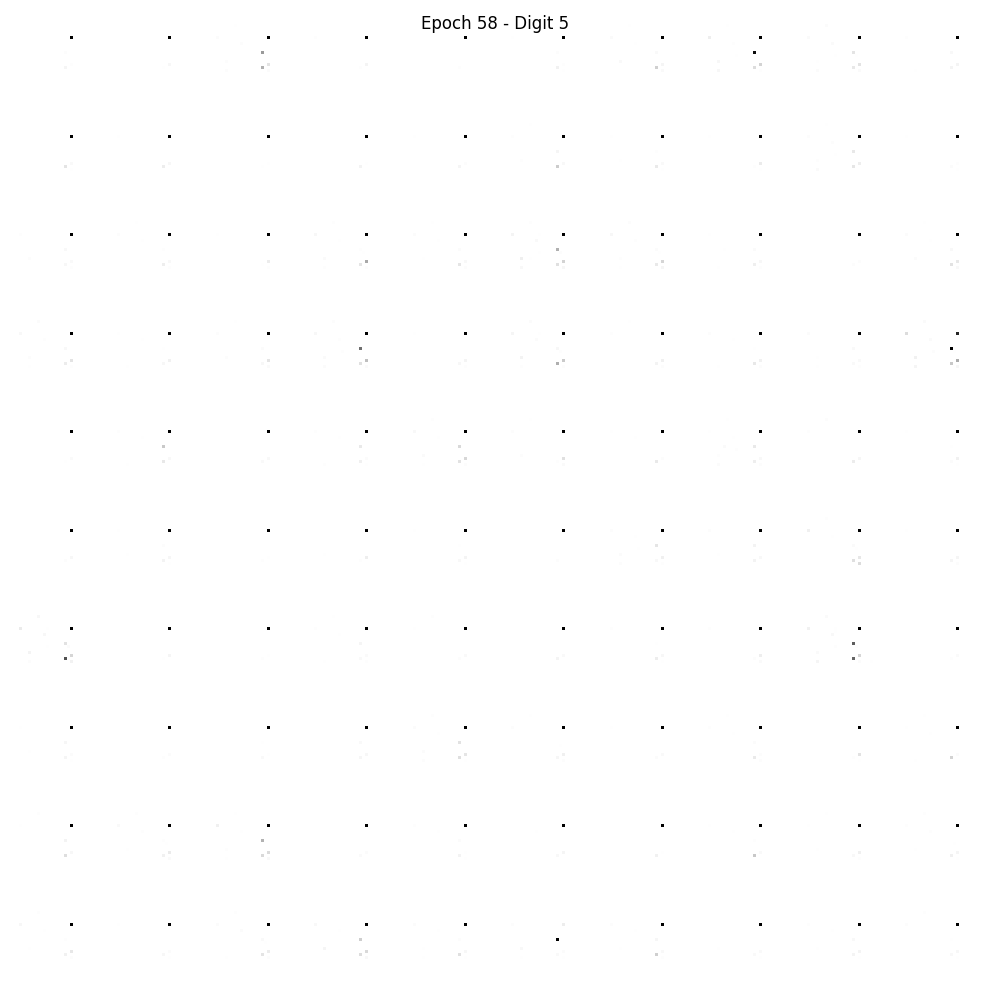

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

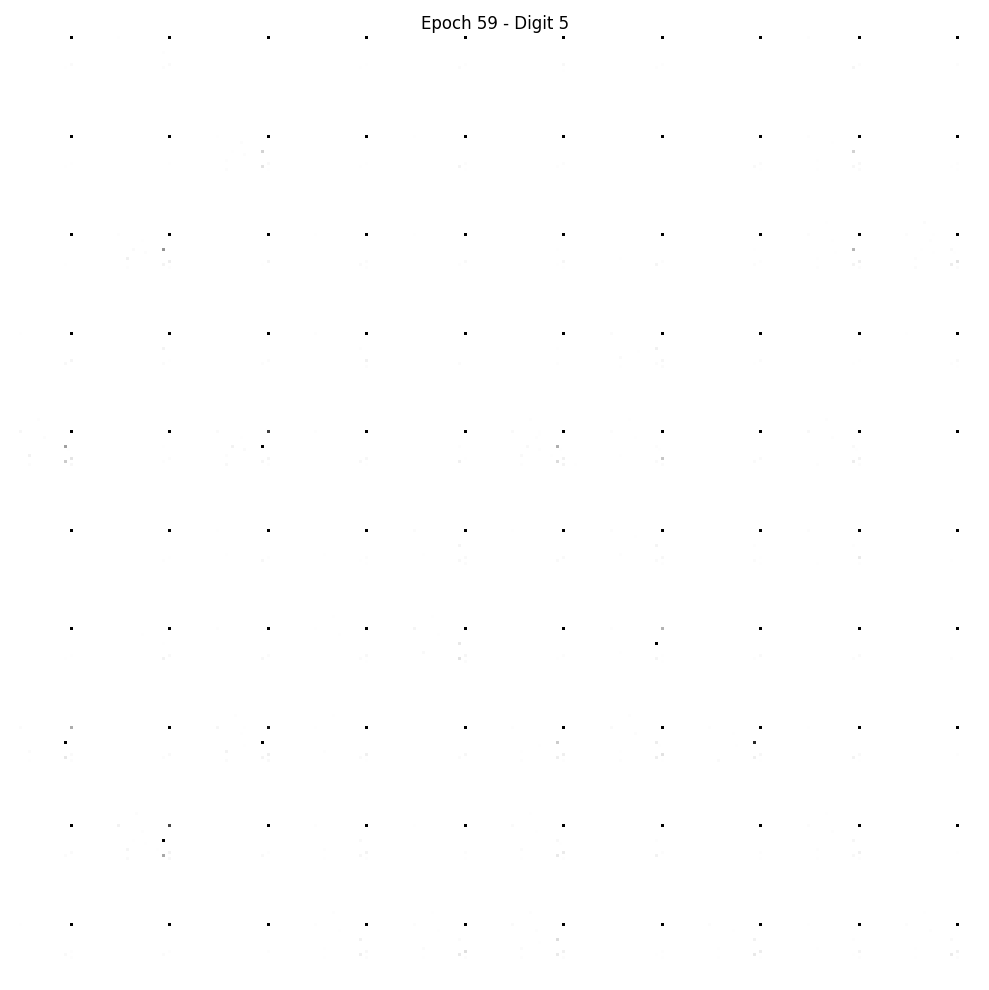

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

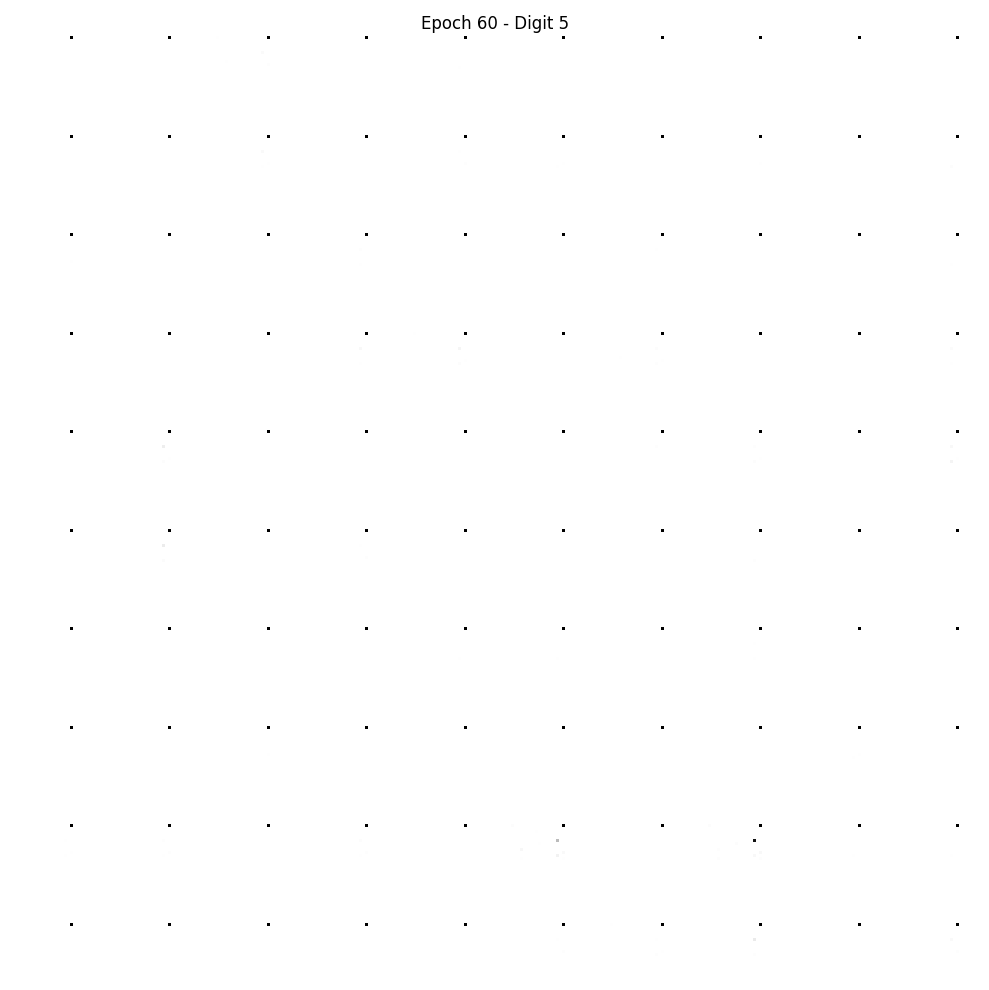

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

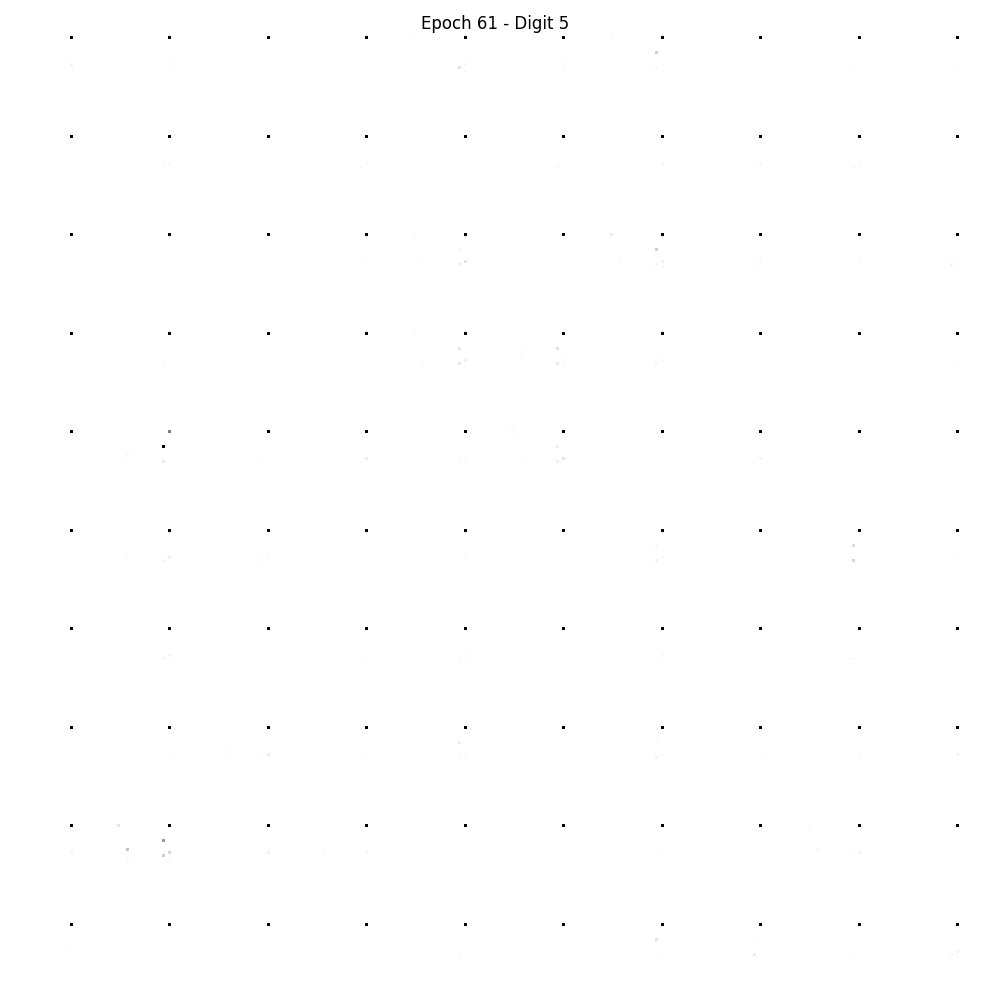

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

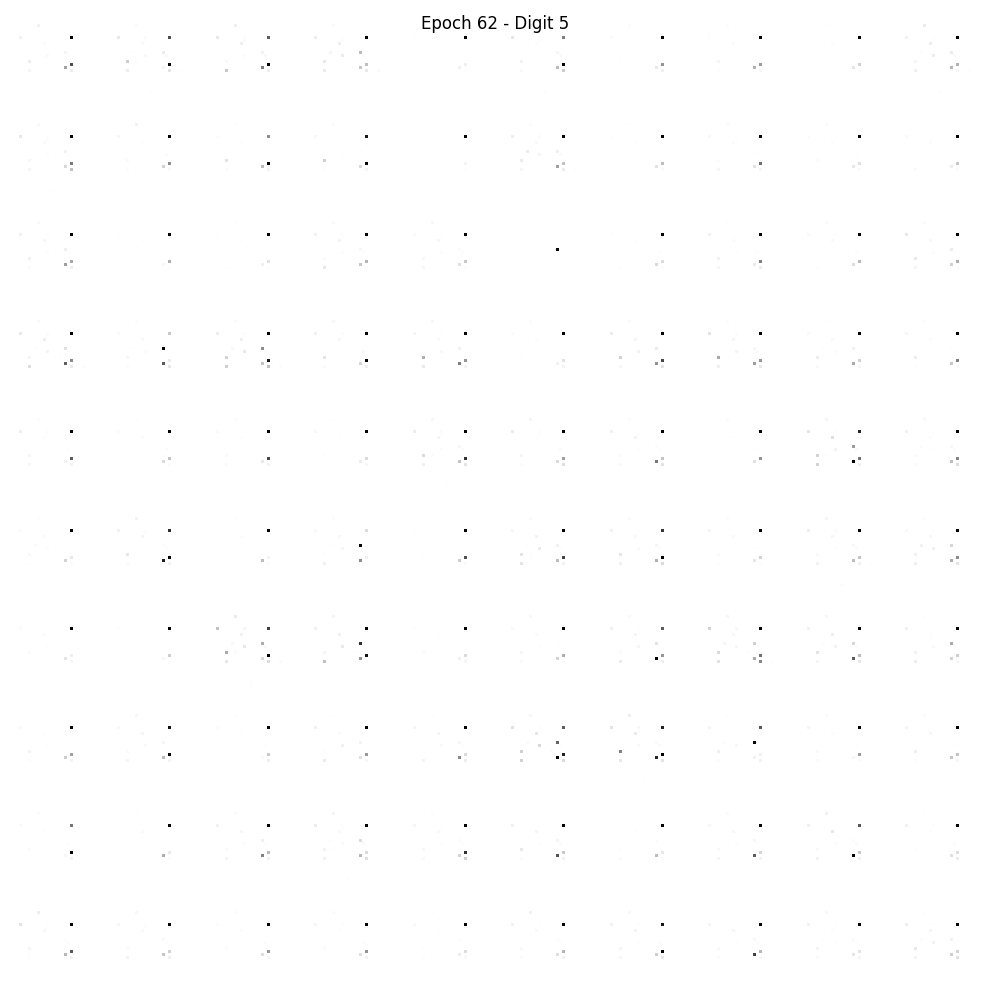

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

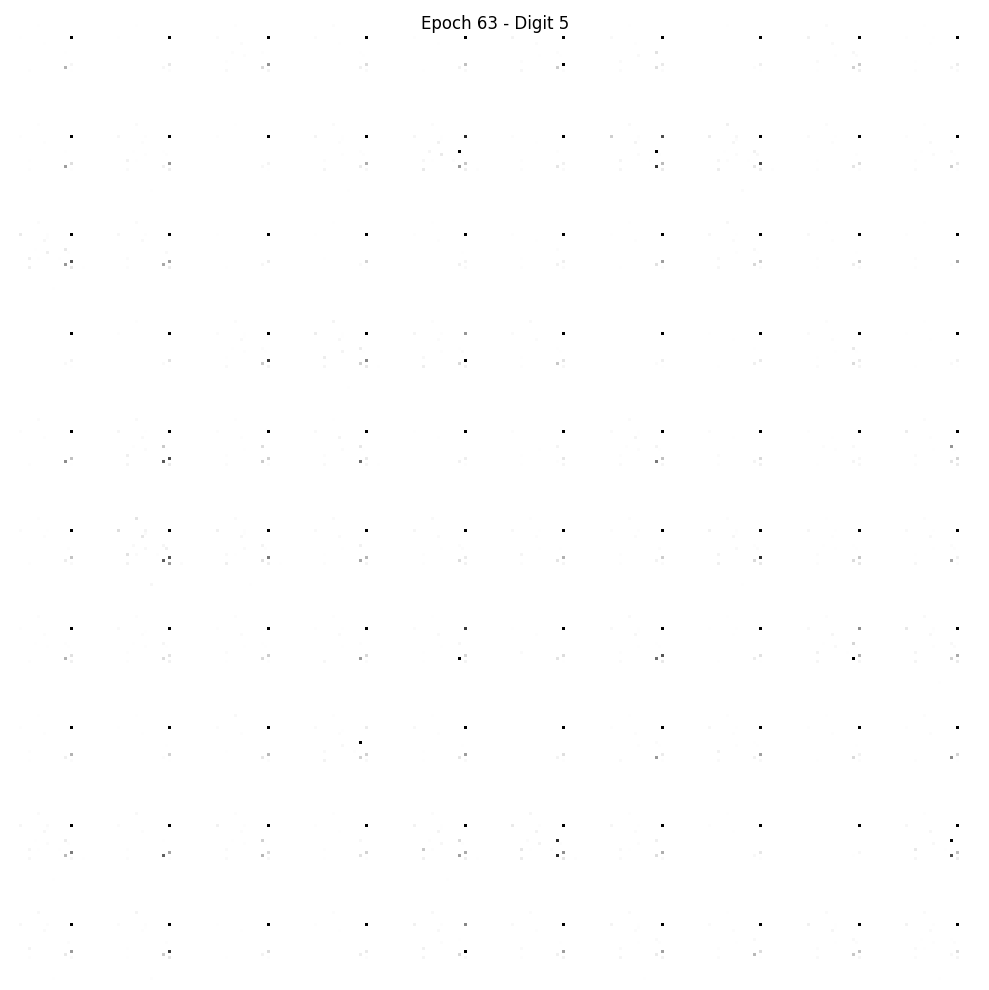

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

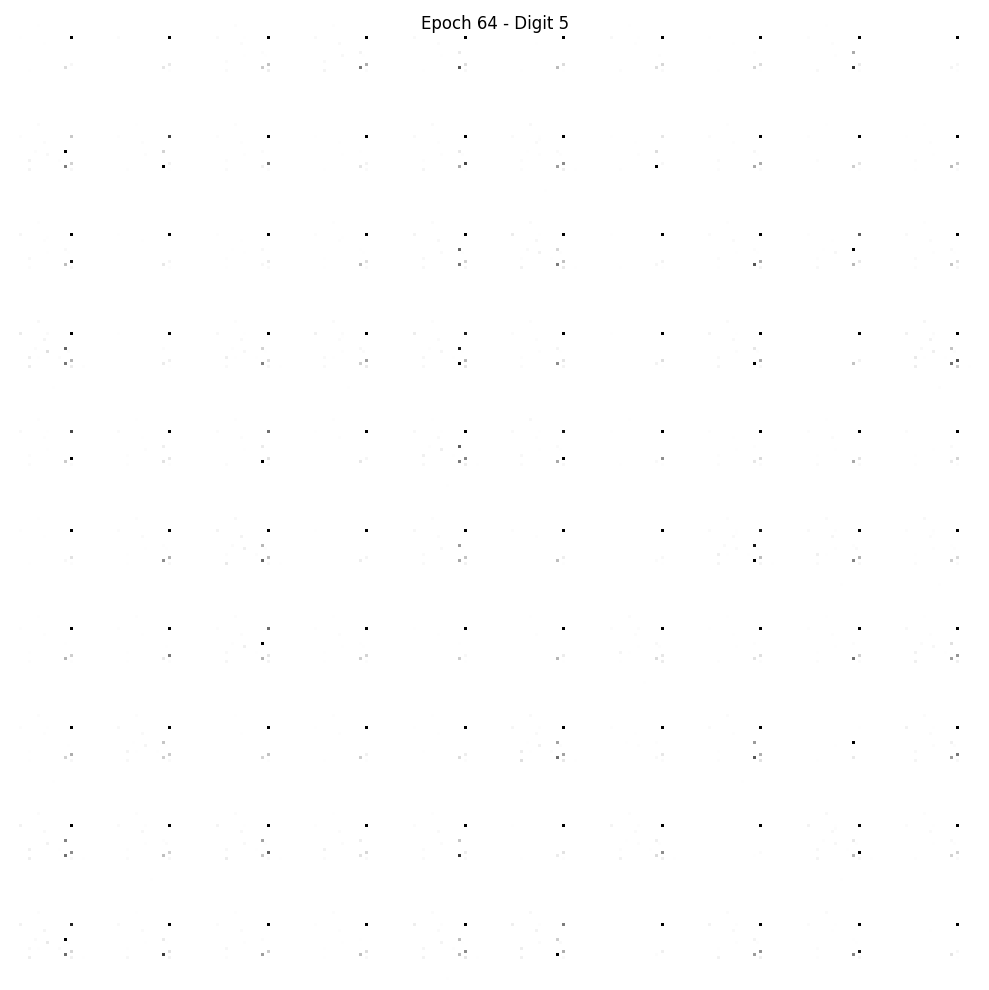

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

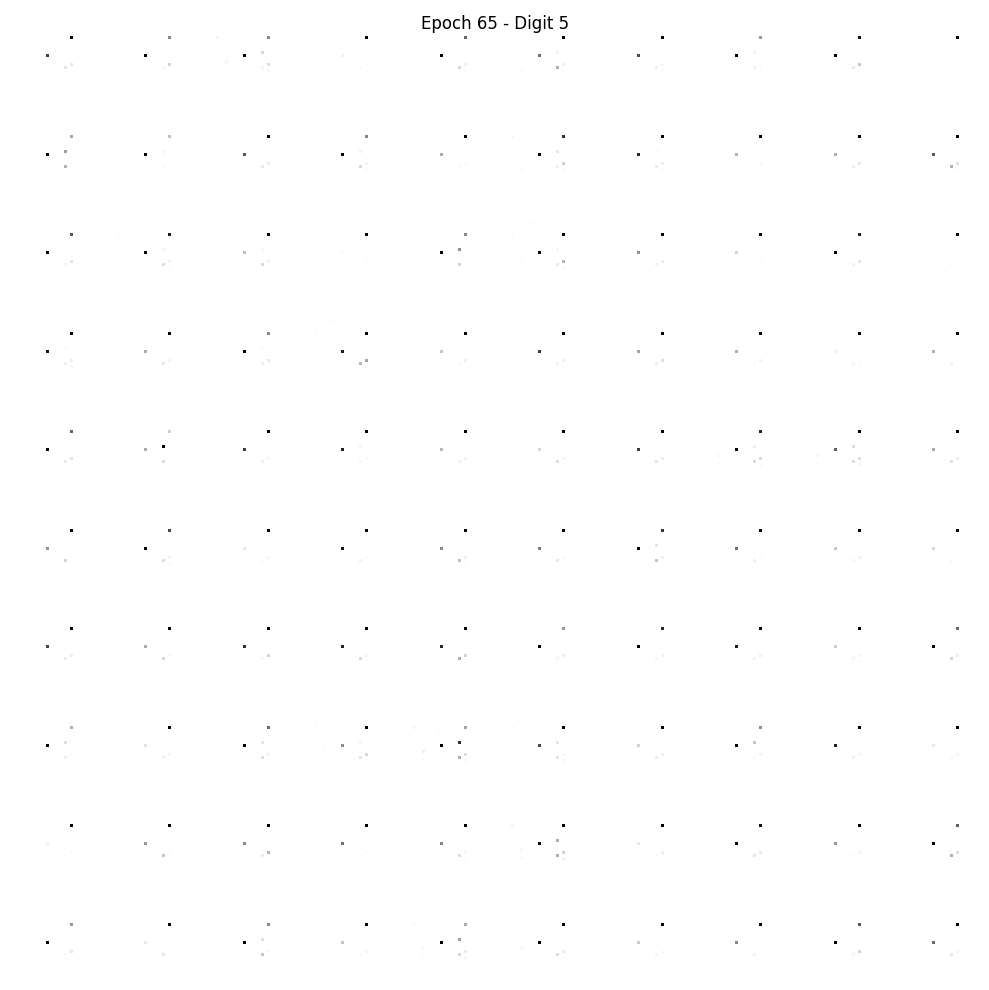

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

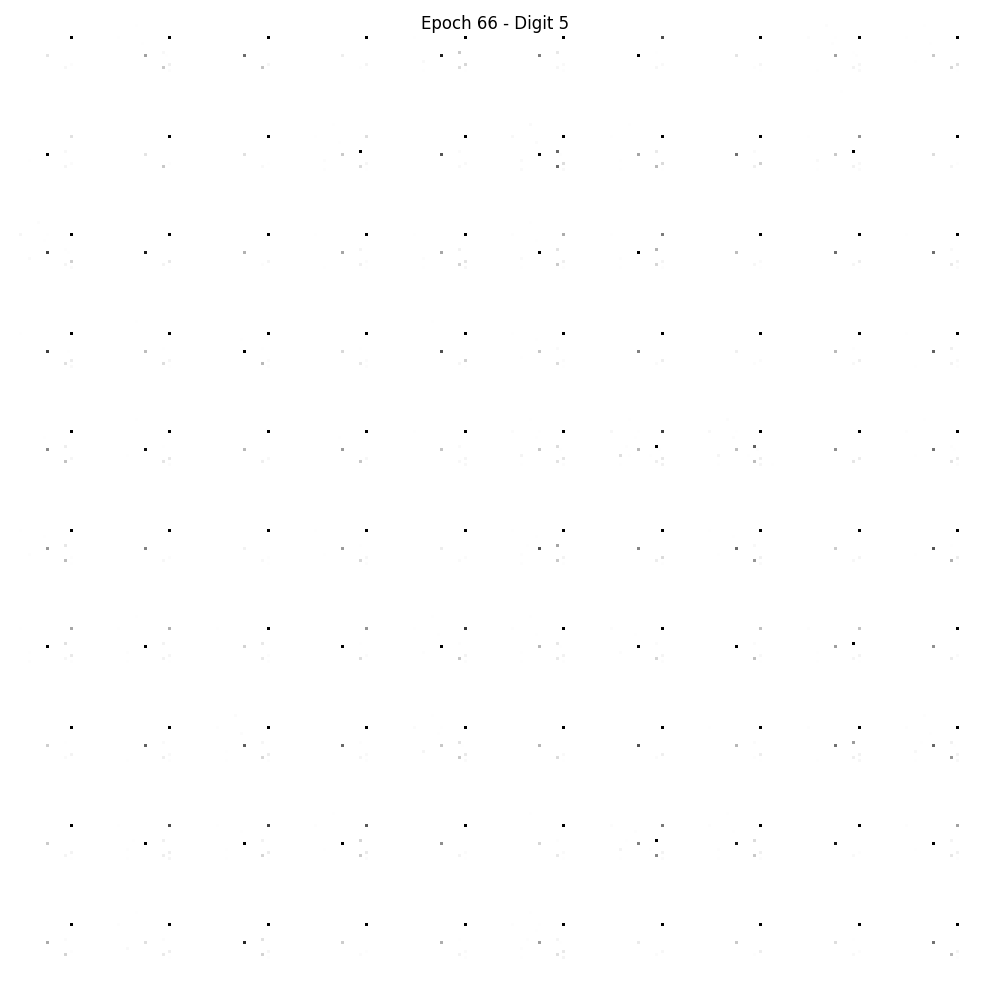

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

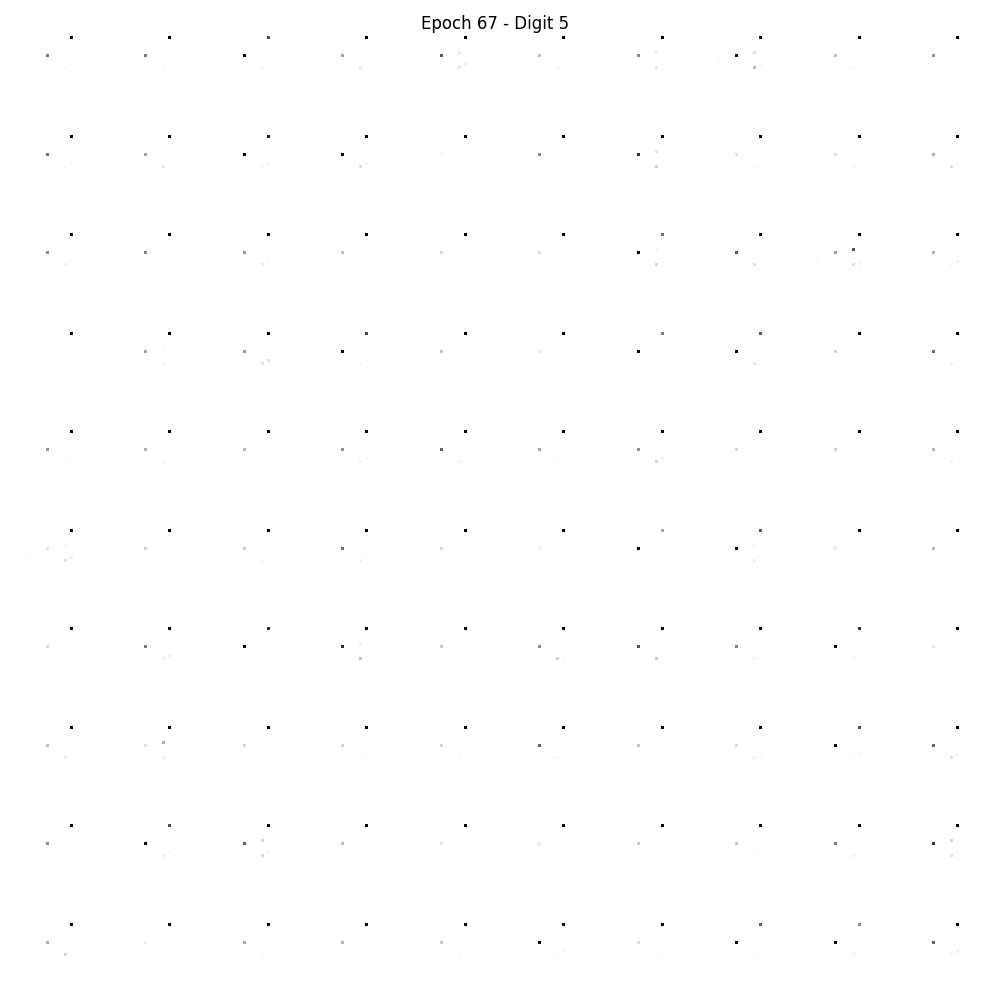

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

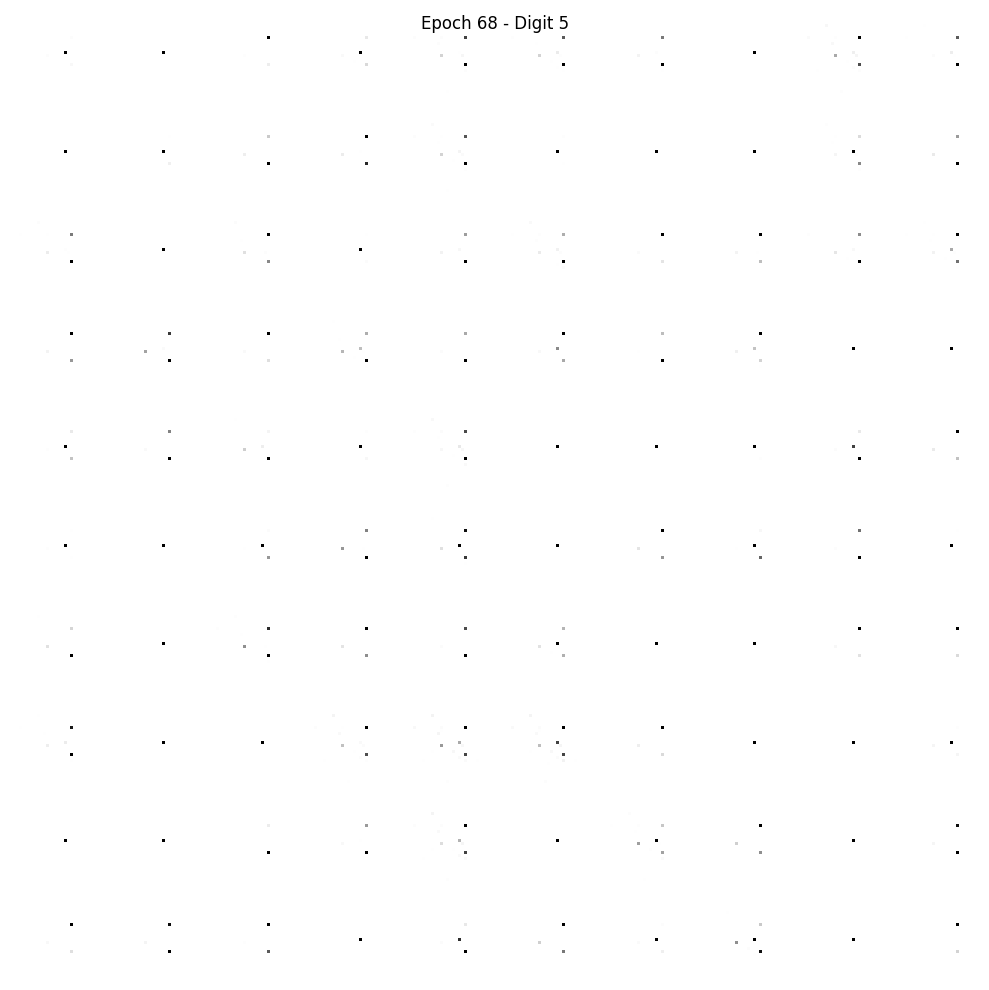

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

<Figure size 640x480 with 0 Axes>

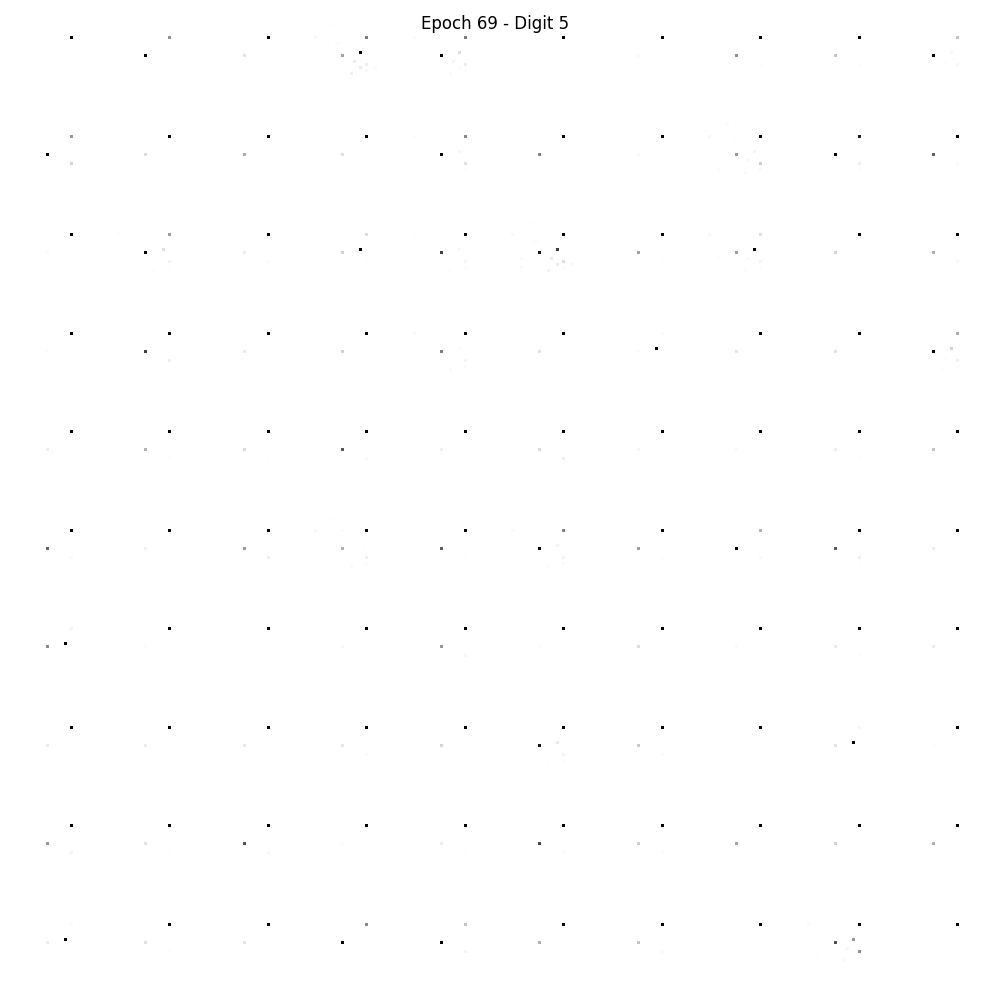

<Figure size 640x480 with 0 Axes>

[6.176512397360057e-05, 1.6386893548769876e-05, 4.757809620059561e-06, 1.322188268204627e-06, 4.960971295986383e-07, 5.090877266411553e-07, 2.998658601427451e-07, 2.263450653572363e-07, 2.2449523839895846e-07, 2.556977278800332e-07, 8.964691033952477e-08, 1.7715063904688577e-06, 2.894641397688247e-07, 1.0047324394690804e-07, 2.8009796437800105e-07, 1.4522217384183023e-07, 1.039301906757828e-07, 6.103657312905852e-08, 2.7889793585700318e-08, 3.890504274295381e-08, 2.6233061944935798e-08, 1.7829588472295654e-08, 1.379505487619781e-08, 1.1117769815882639e-08, 7.697846804433084e-09, 6.943499997191793e-09, 5.380685230704785e-09, 3.6138476655622753e-09, 3.2831075635897378e-09, 3.1243829745619678e-09, 2.565854861913408e-09, 1.7811249142241081e-09, 1.4125473013493206e-09, 1.325209053604226e-09, 1.0398183425408547e-09, 8.476582213923223e-10, 7.169810301022039e-10, 5.709573369649945e-10, 4.700543843050298e-10, 6.182233613927224e-10, 3.104324020064553e-10, 3.268862680538831e-10, 3.343707810632423

In [ ]:


d_losses = []
g_losses = []

epochs = 200
batch_size = 128

X_train = (train_set_images.reshape(60000, 784).astype(np.float32) - 0.5) / 0.5

# Define the label for digit 5 (one-hot encoded)
label_5 = np.array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0])
digit_label = 5

batch_count = int(X_train.shape[0] / batch_size)
for e in range(epochs):
    print(d_losses)
    print(g_losses)
    for _ in range(batch_count):
        # Get a random set of input noise
        noise = np.random.normal(0, 1, size=[batch_size, latent_dim])

        # Generate some fake MNIST images using the generator
        generated_images = generator.predict([noise, np.tile(label_5, (batch_size, 1))])

        # Concatenate the fake and real images
        X_real = X_train[np.random.randint(0, X_train.shape[0], size=batch_size)]
        X_fake = generated_images
        X = np.concatenate([X_real, X_fake])

        # Labels for generated and real data
        y_dis = np.zeros(2 * batch_size)
        y_dis[:batch_size] = 1

        # Train discriminator with this batch of samples
        discriminator.trainable = True
        d_loss = discriminator.train_on_batch([X, np.tile(label_5, (2 * batch_size, 1))], y_dis)

        # Train generator with a new batch of generated samples
        noise = np.random.normal(0, 1, size=[batch_size, latent_dim])

        # From the generator's perspective, the discriminator should predict ones for all samples
        y_gen = np.ones(batch_size)

        # Freeze the discriminator part
        discriminator.trainable = False

        # Train the GAN to predict ones
        g_loss = gan.train_on_batch([noise, np.tile(label_5, (batch_size, 1))], y_gen)

    # Store loss of the most recent batch from this epoch
    d_losses.append(d_loss)
    g_losses.append(g_loss)

    if e % 1 == 0:
        noise = np.random.normal(0, 1, size=[100, latent_dim])
        plotGeneratedImages(e, digit_label)
        display.display(plt.gcf())
        time.sleep(0.001)
        #saveModels(e, digit_label)
